# Separate runs by HKLE due to size limits

In [1]:
datafile='TCGA/focused.1000.T.csv.gz'

In [2]:
hkle='SVA_A'

['HERVK113', 'SVA_A', 'SVA_B', 'SVA_C', 'SVA_D', 'SVA_E', 'SVA_F']

In [3]:
threshold=3

---

In [4]:
import numpy as np
np.__version__

'1.20.3'

In [5]:
import pandas as pd
pd.__version__

'1.2.4'

In [6]:
import matplotlib
matplotlib.__version__

'3.4.2'

In [7]:
import matplotlib.pyplot as plt

In [8]:
# Adjust plot size
#options(repr.plot.width=16, repr.plot.height=6)

# For some reason, if this is in the same cell as the import command, it doesn't work.
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [9]:
import scipy
scipy.__version__

'1.7.0'

In [10]:
from scipy import stats

In [11]:
import seaborn as sns
sns.__version__

'0.11.1'

In [12]:
from datetime import datetime

In [13]:
import sklearn
sklearn.__version__

'0.24.2'

In [14]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [15]:
default_max_columns=pd.get_option('display.max_columns')

In [16]:
default_max_rows=pd.get_option('display.max_rows')

In [17]:
default_precision=pd.get_option('display.precision')

In [18]:
pd.set_option('display.precision', 2)

In [19]:
#default_threshold=np.get_printoptions()['threshold']

In [20]:
#np.set_printoptions(threshold=10000000)

---

# Read Metadata 1

In [21]:
mt1=pd.read_csv("TCGA/metadata.cart.TCGA.GBM-LGG.WGS.bam.2020-07-17.csv",header=None,
 names=['subject','sequencing','days_to_death','gender','disease_type','center_name','unknown'])
mt1.head()

,subject,sequencing,days_to_death,gender,disease_type,center_name,unknown
0,02-2483,02-2483-01A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
1,02-2483,02-2483-10A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
2,02-2485,02-2485-01A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
3,02-2485,02-2485-10A-01D-1494-08,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
4,06-0125,06-0125-01A-01D-1490-08,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


In [22]:
mt1.shape

(278, 7)

In [23]:
mt1.rename(columns={"submitter": "subject"},inplace=True)
mt1.rename(columns={"gender": "gender1"},inplace=True)
mt1.shape

(278, 7)

In [24]:
mt1=mt1.drop('sequencing',axis='columns')
mt1=mt1.drop_duplicates()
mt1.shape

(127, 6)

In [25]:
list(mt1)

['subject',
 'days_to_death',
 'gender1',
 'disease_type',
 'center_name',
 'unknown']

In [26]:
mt1['subject']

0      02-2483
2      02-2485
4      06-0125
7      06-0152
8      06-0157
        ...   
263    IK-7675
265    TM-A7CF
268    TQ-A7RK
272    TQ-A7RV
275    TQ-A8XE
Name: subject, Length: 127, dtype: object

---

# Read Metadata 2

In [27]:
mt2=pd.read_csv("TCGA/TCGA.Glioma.metadata.tsv",sep="\t")

In [28]:
mt2.shape

(1114, 18)

In [29]:
mt2.head()

,case_submitter_id,project_id,primary_diagnosis,race,ethnicity,gender,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,WHO_groups,Triple_group,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status
0,TCGA-02-0001,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,44.0,11.76,1.0
1,TCGA-02-0003,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,50.0,4.73,1.0
2,TCGA-02-0004,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,NaN,NaN,IDH-WT:1p19q-NA,NaN,IDH-WT:1p19q-NA:TERT-NA,MD Anderson Cancer Center,NaN,59.0,11.33,1.0
3,TCGA-02-0006,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,56.0,18.33,1.0
4,TCGA-02-0007,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,glioblastoma:IDH-WT:1p19q-non-codel,IDH-WT:1p19q-non-codel:TERT-NA,MD Anderson Cancer Center,Unmethylated,40.0,23.16,1.0


In [30]:
list(mt2)

['case_submitter_id',
 'project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status']

In [31]:
mt2['subject']=mt2['case_submitter_id'].astype(str).str[5:12]

In [32]:
mt2[['subject','case_submitter_id']].head()

,subject,case_submitter_id
0,02-0001,TCGA-02-0001
1,02-0003,TCGA-02-0003
2,02-0004,TCGA-02-0004
3,02-0006,TCGA-02-0006
4,02-0007,TCGA-02-0007


In [33]:
mt2.drop('case_submitter_id',axis='columns',inplace=True)
mt2.rename(columns={"gender": "gender2"},inplace=True)

In [34]:
list(mt2)

['project_id',
 'primary_diagnosis',
 'race',
 'ethnicity',
 'gender2',
 'RE_names',
 'IDH',
 'x1p19q',
 'TERT',
 'IDH_1p19q_status',
 'WHO_groups',
 'Triple_group',
 'Tissue_sample_location',
 'MGMT',
 'Age',
 'Survival_months',
 'Vital_status',
 'subject']

---

# Merge Metadata

In [35]:
meta=mt2.merge(mt1,on='subject',suffixes=["_mt2","_mt1"],how='inner')

In [36]:
del mt1
del mt2

In [37]:
meta.head()

,project_id,primary_diagnosis,race,ethnicity,gender2,RE_names,IDH,x1p19q,TERT,IDH_1p19q_status,...,MGMT,Age,Survival_months,Vital_status,subject,days_to_death,gender1,disease_type,center_name,unknown
0,TCGA-GBM,Glioblastoma,asian,not hispanic or latino,male,02-2483-01A-01R-1849-01+1,Mutant,non-codel,WT,IDH-Mutant:1p19q-non-codel,...,Methylated,43.0,15.31,0.0,02-2483,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
1,TCGA-GBM,Glioblastoma,black or african american,not hispanic or latino,male,02-2485-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Unmethylated,53.0,15.44,0.0,02-2485,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
2,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0125-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,Methylated,63.0,47.57,1.0,06-0125,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
3,TCGA-GBM,Glioblastoma,white,not hispanic or latino,male,NaN,WT,non-codel,NaN,IDH-WT:1p19q-non-codel,...,NaN,68.0,12.32,1.0,06-0152,375.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
4,TCGA-GBM,Glioblastoma,white,not hispanic or latino,female,06-0157-01A-01R-1849-01+1,WT,non-codel,Mutant,IDH-WT:1p19q-non-codel,...,NaN,63.0,3.19,1.0,06-0157,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


In [38]:
meta.drop(meta[(meta['subject']=='CS-6186') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [39]:
meta.drop(meta[(meta['subject']=='DU-5872') & (meta['center_name']=='Harvard Medical School')].index,inplace=True)

In [40]:
meta.columns

Index(['project_id', 'primary_diagnosis', 'race', 'ethnicity', 'gender2',
       'RE_names', 'IDH', 'x1p19q', 'TERT', 'IDH_1p19q_status', 'WHO_groups',
       'Triple_group', 'Tissue_sample_location', 'MGMT', 'Age',
       'Survival_months', 'Vital_status', 'subject', 'days_to_death',
       'gender1', 'disease_type', 'center_name', 'unknown'],
      dtype='object')

In [41]:
meta['primary_diagnosis'].value_counts()

Glioblastoma                     35
Oligodendroglioma, NOS           33
Astrocytoma, anaplastic          24
Mixed glioma                     16
Astrocytoma, NOS                  9
Oligodendroglioma, anaplastic     8
Name: primary_diagnosis, dtype: int64

In [42]:
meta['TERT'].value_counts()

Mutant    68
WT        54
Name: TERT, dtype: int64

In [43]:
meta['IDH'].value_counts()

Mutant    74
WT        50
Name: IDH, dtype: int64

In [44]:
meta['x1p19q'].value_counts()

non-codel    102
codel         23
Name: x1p19q, dtype: int64

In [45]:
meta['disease_type'].value_counts()

Brain Lower Grade Glioma    90
Glioblastoma Multiforme     35
Name: disease_type, dtype: int64

In [46]:
meta['gender1'].value_counts()

male      72
female    53
Name: gender1, dtype: int64

In [47]:
meta['race'].value_counts()

white                        114
black or african american      7
not reported                   3
asian                          1
Name: race, dtype: int64

In [48]:
meta['ethnicity'].value_counts()

not hispanic or latino    108
not reported               11
hispanic or latino          6
Name: ethnicity, dtype: int64

In [49]:
meta['IDH_1p19q_status'].value_counts()

IDH-Mutant:1p19q-non-codel    51
IDH-WT:1p19q-non-codel        50
IDH-Mutant:1p19q-codel        23
IDH-NA:1p19q-non-codel         1
Name: IDH_1p19q_status, dtype: int64

In [50]:
meta['WHO_groups'].value_counts()

glioblastoma:IDH-WT:1p19q-non-codel             29
oligodendroglioma:IDH-Mutant:1p19q-codel        23
astrocytoma:IDH-Mutant:1p19q-non-codel          18
oligodendroglioma:IDH-Mutant:1p19q-non-codel    13
astrocytoma:IDH-WT:1p19q-non-codel              13
oligoastrocytoma:IDH-Mutant:1p19q-non-codel     11
glioblastoma:IDH-Mutant:1p19q-non-codel          5
oligodendroglioma:IDH-WT:1p19q-non-codel         4
oligoastrocytoma:IDH-WT:1p19q-non-codel          4
Name: WHO_groups, dtype: int64

In [51]:
meta['Triple_group'].value_counts()

IDH-Mutant:1p19q-non-codel:TERT-WT        49
IDH-WT:1p19q-non-codel:TERT-Mutant        44
IDH-Mutant:1p19q-codel:TERT-Mutant        22
IDH-WT:1p19q-non-codel:TERT-WT             4
IDH-WT:1p19q-non-codel:TERT-NA             2
IDH-NA:1p19q-non-codel:TERT-Mutant         1
IDH-Mutant:1p19q-codel:TERT-WT             1
IDH-Mutant:1p19q-non-codel:TERT-NA         1
IDH-Mutant:1p19q-non-codel:TERT-Mutant     1
Name: Triple_group, dtype: int64

In [52]:
meta['MGMT'].value_counts()

Methylated      87
Unmethylated    27
Name: MGMT, dtype: int64

In [53]:
meta['center_name'].value_counts()

Broad Institute of MIT and Harvard    75
Harvard Medical School                50
Name: center_name, dtype: int64

---

# Read raw data and cleanup

In [54]:
#df=pd.read_csv("focused.csv.gz",header=[0,1,2,3],index_col=[0,1])
#df.columns.names=['sample','pup','hkle','q']
#df=df.T
df=pd.read_csv(datafile,header=[0,1],index_col=[0,1,2,3])
#df.reset_index(inplace=True)
#df=pd.read_csv(datafile,header=[0,1]) #,index_col=[0,1,2,3])
df.head()

chromosome                                   chr1                          \
position                                  1102000 1308000 1409000 1410000   
sample               pup    hkle     mapq                                   
02-2483-01A-01D-1494 paired HERVK113 Q20        0       0       4       1   
                            SVA_A    Q20        0       0       0       0   
                            SVA_B    Q20        0       0       0       0   
                            SVA_C    Q20        0       0       0       0   
                            SVA_D    Q20        0       0       0       0   

chromosome                                                                 \
position                                  1580000 1581000 2211000 3129000   
sample               pup    hkle     mapq                                   
02-2483-01A-01D-1494 paired HERVK113 Q20        4       0       0       0   
                            SVA_A    Q20        0       0       0       0   
                            SVA_B    Q20        0       0       0       0   
                            SVA_C    Q20        0       0       0       0   
                            SVA_D    Q20        0       0       0       0   

chromosome                                                 ...     chrY  \
position                                  3315000 3321000  ... 15075000   
sample               pup    hkle     mapq                  ...            
02-2483-01A-01D-1494 paired HERVK113 Q20        0       0  ...        0   
                            SVA_A    Q20        0       0  ...        0   
                            SVA_B    Q20        0       0  ...        0   
                            SVA_C    Q20        0       0  ...        0   
                            SVA_D    Q20        0       0  ...        0   

chromosome                                                                     \
position                                  15774000 17181000 19536000 19699000   
sample               pup    hkle     mapq                                       
02-2483-01A-01D-1494 paired HERVK113 Q20         0        0        0        2   
                            SVA_A    Q20         0        0        0        0   
                            SVA_B    Q20         0        0        0        0   
                            SVA_C    Q20         0        0        0        0   
                            SVA_D    Q20         0        0        0        0   

chromosome                                                                     \
position                                  19700000 20553000 20976000 21047000   
sample               pup    hkle     mapq                                       
02-2483-01A-01D-1494 paired HERVK113 Q20         0        0        0        0   
                            SVA_A    Q20         0        0        0        0   
                            SVA_B    Q20         0        0        0        0   
                            SVA_C    Q20         0        0        0        0   
                            SVA_D    Q20         0        0        0        0   

chromosome                                          
position                                  21217000  
sample               pup    hkle     mapq           
02-2483-01A-01D-1494 paired HERVK113 Q20         0  
                            SVA_A    Q20         0  
                            SVA_B    Q20         0  
                            SVA_C    Q20         0  
                            SVA_D    Q20         0  

[5 rows x 12550 columns]

In [55]:
df.columns= [' '.join(col).strip() for col in df.columns.values]
df.head()

chr1 1102000  chr1 1308000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              0             0   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 1409000  chr1 1410000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              4             1   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 1580000  chr1 1581000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              4             0   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 2211000  chr1 3129000  \
sample               pup    hkle     mapq                               
02-2483-01A-01D-1494 paired HERVK113 Q20              0             0   
                            SVA_A    Q20              0             0   
                            SVA_B    Q20              0             0   
                            SVA_C    Q20              0             0   
                            SVA_D    Q20              0             0   

                                           chr1 3315000  chr1 3321000  ...  \
sample               pup    hkle     mapq                              ...   
02-2483-01A-01D-1494 paired HERVK113 Q20              0             0  ...   
                            SVA_A    Q20              0             0  ...   
                            SVA_B    Q20              0             0  ...   
                            SVA_C    Q20              0             0  ...   
                            SVA_D    Q20              0             0  ...   

                                           chrY 15075000  chrY 15774000  \
sample               pup    hkle     mapq                                 
02-2483-01A-01D-1494 paired HERVK113 Q20               0              0   
                            SVA_A    Q20               0              0   
                            SVA_B    Q20               0              0   
                            SVA_C    Q20               0              0   
                            SVA_D    Q20               0              0   

                                           chrY 17181000  chrY 19536000  \
sample               pup    hkle     mapq                                 
02-2483-01A-01D-1494 paired HERVK113 Q20               0              0   
                            SVA_A    Q20               0              0   
                            SVA_B    Q20               0              0   
                            SVA_C    Q20               0              0   
                            SVA_D    Q20               0              0   

                                           chrY 19699000  chrY 19700000  \
sample               pup    hkle     mapq                                 
02-2483-01A-01D-1494 paired HERVK113 Q20               2              0   
                            SVA_A    Q20               0              0   
                            SVA_B    Q20               0              0   
                     

In [56]:
df.reset_index(inplace=True)

In [57]:
df.rename(columns={"sample": "sequencing"},inplace=True)
df['sample']=df['sequencing'].str[0:11]
#df['sample']=df['sample'].str[0:11]
df['subject']=df['sample'].str[0:7]
df['subject']

0       02-2483
1       02-2483
2       02-2483
3       02-2483
4       02-2483
         ...   
1024    TQ-A8XE
1025    TQ-A8XE
1026    TQ-A8XE
1027    TQ-A8XE
1028    TQ-A8XE
Name: subject, Length: 1029, dtype: object

In [58]:
df.columns

Index(['sequencing', 'pup', 'hkle', 'mapq', 'chr1 1102000', 'chr1 1308000',
       'chr1 1409000', 'chr1 1410000', 'chr1 1580000', 'chr1 1581000',
       ...
       'chrY 17181000', 'chrY 19536000', 'chrY 19699000', 'chrY 19700000',
       'chrY 20553000', 'chrY 20976000', 'chrY 21047000', 'chrY 21217000',
       'sample', 'subject'],
      dtype='object', length=12556)

In [59]:
df.head()

,sequencing,pup,hkle,mapq,chr1 1102000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,...,chrY 17181000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,sample,subject
0,02-2483-01A-01D-1494,paired,HERVK113,Q20,0,0,4,1,4,0,...,0,0,2,0,0,0,0,0,02-2483-01A,02-2483
1,02-2483-01A-01D-1494,paired,SVA_A,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483
2,02-2483-01A-01D-1494,paired,SVA_B,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483
3,02-2483-01A-01D-1494,paired,SVA_C,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483
4,02-2483-01A-01D-1494,paired,SVA_D,Q20,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,02-2483-01A,02-2483


In [60]:
df=df[df['hkle']==hkle]

In [61]:
#df.set_index(['subject','sample','sequencing','pup','hkle','mapq'],inplace=True)
df.set_index(['subject','sample','sequencing','pup','hkle','mapq'],inplace=True)
df.head()

chr1 1102000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_A Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_A Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_A Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_A Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_A Q20              0   

                                                            chr1 1308000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_A Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_A Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_A Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_A Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_A Q20              0   

                                                            chr1 1409000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_A Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_A Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_A Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_A Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_A Q20              0   

                                                            chr1 1410000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_A Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_A Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_A Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_A Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_A Q20              0   

                                                            chr1 1580000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_A Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_A Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_A Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_A Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_A Q20              0   

                                                            chr1 1581000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_A Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_A Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_A Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_A Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_A Q20              0   

                                                            chr1 2211000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_A Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_A Q20              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494 paired SVA_A Q20              0   
        02-2485-10A 02-2485-10A-01D-1494 paired SVA_A Q20              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490 paired SVA_A Q20              0   

                                                            chr1 3129000  \
subject sample      sequencing           pup    hkle  mapq                 
02-2483 02-2483-01A 02-2483-01A-01D-1494 paired SVA_A Q20              0   
        02-2483-10A 02-2483-10A-01D-1494 paired SVA_A Q20              0   
02-2485 02-2485-01A 02-24

In [62]:
df.shape

(147, 12550)

---

## Remove "pup" and "q" as they are useless in this dataset.

In [63]:
df=df.droplevel('pup',axis='index').droplevel('mapq',axis='index').droplevel('hkle',axis='index')

In [64]:
df.head()

chr1 1102000  chr1 1308000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 1409000  chr1 1410000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 1580000  chr1 1581000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 2211000  chr1 3129000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   

                                          chr1 3315000  chr1 3321000  ...  \
subject sample      sequencing                                        ...   
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0  ...   
        02-2483-10A 02-2483-10A-01D-1494             0             0  ...   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0  ...   
        02-2485-10A 02-2485-10A-01D-1494             0             0  ...   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0  ...   

                                          chrY 15075000  chrY 15774000  \
subject sample      sequencing                                           
02-2483 02-2483-01A 02-2483-01A-01D-1494              0              0   
        02-2483-10A 02-2483-10A-01D-1494              0              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494              0              0   
        02-2485-10A 02-2485-10A-01D-1494              0              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490              0              0   

                                          chrY 17181000  chrY 19536000  \
subject sample      sequencing                                           
02-2483 02-2483-01A 02-2483-01A-01D-1494              0              0   
        02-2483-10A 02-2483-10A-01D-1494              0              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494              0              0   
        02-2485-10A 02-2485-10A-01D-1494              0              0   
06-0125 06-0125-01A 06-0125-01A-01D-1490              0              0   

                                          chrY 19699000  chrY 19700000  \
subject sample      sequencing                                           
02-2483 02-2483-01A 02-2483-01A-01D-1494              0              0   
        02-2483-10A 02-2483-10A-01D-1494              0              0   
02-2485 02-2485-01A 02-2485-01A-01D-1494              0              0   
        02-2485-10A 02-2485-10A-01D-1494              0              0   


In [65]:
df.shape

(147, 12550)

---

## Drop recurrent tumor (-02?)

---

## Drop solid normal (-11?) (I've seen a couple)

---

## Drop solitary tumor / normal ( not sure how to do this programmatically )

* FG-5963-01A
* CS-5390-10A

In [66]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'sequencing'])

In [67]:
df.drop(df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index,axis='index',inplace=True)

In [68]:
df.loc[df.index.get_level_values('sample') == 'FG-5963-01A'].index

MultiIndex([], names=['subject', 'sample', 'sequencing'])

In [69]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([('CS-5390', 'CS-5390-10A', 'CS-5390-10A-01D-1468')],
           names=['subject', 'sample', 'sequencing'])

In [70]:
df.drop(df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index,axis='index',inplace=True)

In [71]:
df.loc[df.index.get_level_values('sample') == "CS-5390-10A"].index

MultiIndex([], names=['subject', 'sample', 'sequencing'])

In [72]:
df.shape

(146, 12550)

In [73]:
df

chr1 1102000  chr1 1308000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 1409000  chr1 1410000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 1580000  chr1 1581000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             0   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 2211000  chr1 3129000  \
subject sample      sequencing                                         
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0   
        02-2483-10A 02-2483-10A-01D-1494             0             0   
02-2485 02-2485-01A 02-2485-01A-01D-1494             0             0   
        02-2485-10A 02-2485-10A-01D-1494             0             0   
06-0125 06-0125-01A 06-0125-01A-01D-1490             0             0   
...                                                ...           ...   
TQ-A7RK TQ-A7RK-10A TQ-A7RK-10A-01D-A33W             0             0   
TQ-A7RV TQ-A7RV-01A TQ-A7RV-01A-21D-A34A             0             0   
        TQ-A7RV-10A TQ-A7RV-10A-01D-A34A             0             0   
TQ-A8XE TQ-A8XE-01A TQ-A8XE-01A-11D-A36O             0             1   
        TQ-A8XE-10A TQ-A8XE-10A-01D-A367             0             0   

                                          chr1 3315000  chr1 3321000  ...  \
subject sample      sequencing                                        ...   
02-2483 02-2483-01A 02-2483-01A-01D-1494             0             0  ...   
        02-2483-10A 02-2483-10A-01D-1494             0         

---

In [74]:
#df.set_index(['subject','sample'],inplace=True)

In [75]:
tmp=df[df>threshold].count(axis='columns')
tmp

subject  sample       sequencing          
02-2483  02-2483-01A  02-2483-01A-01D-1494     398
         02-2483-10A  02-2483-10A-01D-1494     306
02-2485  02-2485-01A  02-2485-01A-01D-1494     388
         02-2485-10A  02-2485-10A-01D-1494     270
06-0125  06-0125-01A  06-0125-01A-01D-1490    1361
                                              ... 
TQ-A7RK  TQ-A7RK-10A  TQ-A7RK-10A-01D-A33W      68
TQ-A7RV  TQ-A7RV-01A  TQ-A7RV-01A-21D-A34A     252
         TQ-A7RV-10A  TQ-A7RV-10A-01D-A34A     113
TQ-A8XE  TQ-A8XE-01A  TQ-A8XE-01A-11D-A36O     217
         TQ-A8XE-10A  TQ-A8XE-10A-01D-A367     127
Length: 146, dtype: int64

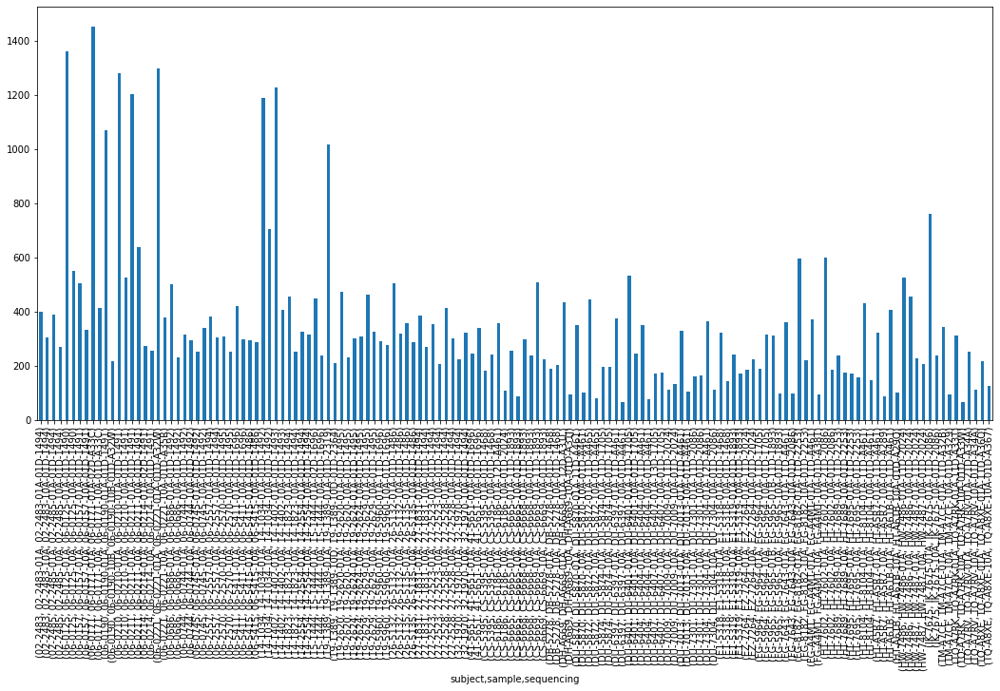

In [76]:
tmp[tmp>=0].plot(kind='bar')
plt.show()

# Read RAW read counts

In [77]:
rc=pd.read_csv('TCGA/sequencing_paired_read_counts.csv',header=None,names=['sequencing','count'])
#rc['sample']=rc['sequencing'].str[0:11]
rc.head()

,sequencing,count
0,02-2483-01A-01D-1494,566024474
1,02-2483-10A-01D-1494,579304076
2,02-2485-01A-01D-1494,575060540
3,02-2485-10A-01D-1494,478851061
4,06-0125-01A-01D-1490,1066268796


---

# Normalize tmp by RAW read count

In [78]:
#df.reset_index(inplace=True)

In [79]:
#tmp=df.merge(rc,on='sample')
tmp=df.merge(rc,on='sequencing')
#tmp.drop('sequencing',axis='columns',inplace=True)
#df.set_index(['subject','sample','sequencing'],inplace=True)
#tmp.set_index(['subject','sample','sequencing'],inplace=True)
tmp.set_index(['sequencing'],inplace=True)
tmp

,chr1 1102000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 2211000,chr1 3129000,chr1 3315000,chr1 3321000,...,chrY 15774000,chrY 17181000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,count
sequencing,,,,,,,,,,,,,,,,,,,,,
02-2483-01A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,566024474
02-2483-10A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,579304076
02-2485-01A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,575060540
02-2485-10A-01D-1494,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,478851061
06-0125-01A-01D-1490,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1066268796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TQ-A7RK-10A-01D-A33W,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,372900517
TQ-A7RV-01A-21D-A34A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,626661130
TQ-A7RV-10A-01D-A34A,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,362586651


In [80]:
tmp[tmp.columns[tmp.columns.str.contains("^chr")]]=(
    1e9*tmp[tmp.columns[tmp.columns.str.contains("^chr")]].values)/tmp[['count']].values
tmp

,chr1 1102000,chr1 1308000,chr1 1409000,chr1 1410000,chr1 1580000,chr1 1581000,chr1 2211000,chr1 3129000,chr1 3315000,chr1 3321000,...,chrY 15774000,chrY 17181000,chrY 19536000,chrY 19699000,chrY 19700000,chrY 20553000,chrY 20976000,chrY 21047000,chrY 21217000,count
sequencing,,,,,,,,,,,,,,,,,,,,,
02-2483-01A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,566024474
02-2483-10A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,579304076
02-2485-01A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,575060540
02-2485-10A-01D-1494,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,478851061
06-0125-01A-01D-1490,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1066268796
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TQ-A7RK-10A-01D-A33W,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,372900517
TQ-A7RV-01A-21D-A34A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,626661130
TQ-A7RV-10A-01D-A34A,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,362586651


In [81]:
tmp=tmp[tmp>threshold].count(axis='columns')
tmp

sequencing
02-2483-01A-01D-1494    1248
02-2483-10A-01D-1494    1150
02-2485-01A-01D-1494    1239
02-2485-10A-01D-1494    1114
06-0125-01A-01D-1490    1362
                        ... 
TQ-A7RK-10A-01D-A33W     450
TQ-A7RV-01A-21D-A34A     829
TQ-A7RV-10A-01D-A34A     595
TQ-A8XE-01A-11D-A36O     358
TQ-A8XE-10A-01D-A367     701
Length: 146, dtype: int64

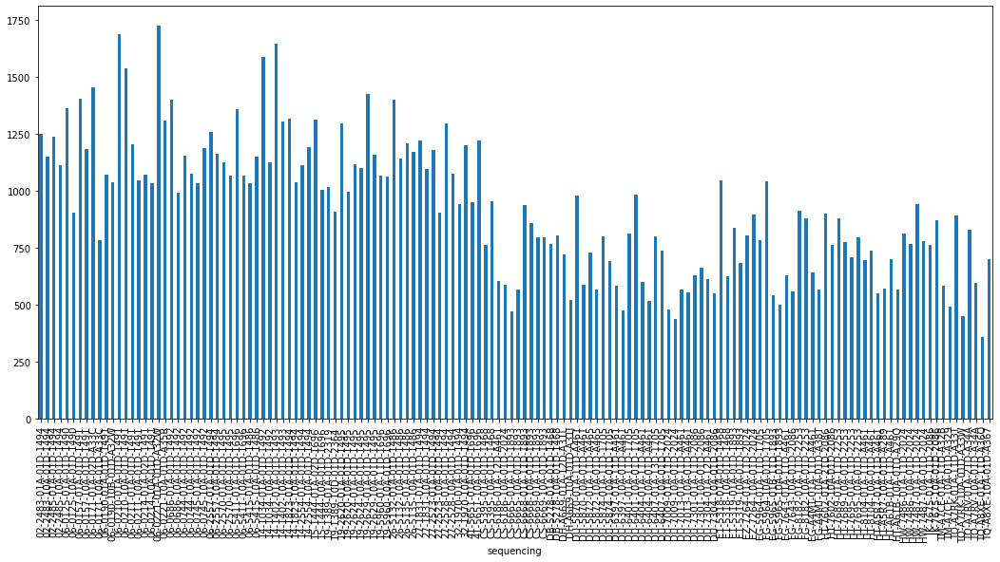

In [82]:
tmp[tmp>=0].plot(kind='bar')
plt.show()

---

# Normalize df

In [83]:
df.reset_index(inplace=True)
df=df.merge(rc,on='sequencing')
df.set_index(['subject','sample','sequencing'],inplace=True)
df=df.droplevel('sequencing',axis='index')
df[df.columns[df.columns.str.contains("^chr")]]=(
    1e9*df[df.columns[df.columns.str.contains("^chr")]].values)/df[['count']].values
df.drop('count',axis='columns',inplace=True)
df

chr1 1102000  chr1 1308000  chr1 1409000  chr1 1410000  \
subject sample                                                                
02-2483 02-2483-01A           0.0           0.0           0.0           0.0   
        02-2483-10A           0.0           0.0           0.0           0.0   
02-2485 02-2485-01A           0.0           0.0           0.0           0.0   
        02-2485-10A           0.0           0.0           0.0           0.0   
06-0125 06-0125-01A           0.0           0.0           0.0           0.0   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0           0.0           0.0   
TQ-A7RV TQ-A7RV-01A           0.0           0.0           0.0           0.0   
        TQ-A7RV-10A           0.0           0.0           0.0           0.0   
TQ-A8XE TQ-A8XE-01A           0.0           0.0           0.0           0.0   
        TQ-A8XE-10A           0.0           0.0           0.0           0.0   

                     chr1 1580000  chr1 1581000  chr1 2211000  chr1 3129000  \
subject sample                                                                
02-2483 02-2483-01A           0.0           0.0           0.0          0.00   
        02-2483-10A           0.0           0.0           0.0          0.00   
02-2485 02-2485-01A           0.0           0.0           0.0          0.00   
        02-2485-10A           0.0           0.0           0.0          0.00   
06-0125 06-0125-01A           0.0           0.0           0.0          0.00   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0           0.0          0.00   
TQ-A7RV TQ-A7RV-01A           0.0           0.0           0.0          0.00   
        TQ-A7RV-10A           0.0           0.0           0.0          0.00   
TQ-A8XE TQ-A8XE-01A           0.0           0.0           0.0          1.38   
        TQ-A8XE-10A           0.0           0.0           0.0          0.00   

                     chr1 3315000  chr1 3321000  ...  chrY 15075000  \
subject sample                                   ...                  
02-2483 02-2483-01A           0.0           0.0  ...            0.0   
        02-2483-10A           0.0           0.0  ...            0.0   
02-2485 02-2485-01A           0.0           0.0  ...            0.0   
        02-2485-10A           0.0           0.0  ...            0.0   
06-0125 06-0125-01A           0.0           0.0  ...            0.0   
...                           ...           ...  ...            ...   
TQ-A7RK TQ-A7RK-10A           0.0           0.0  ...            0.0   
TQ-A7RV TQ-A7RV-01A           0.0           0.0  ...            0.0   
        TQ-A7RV-10A           0.0           0.0  ...            0.0   
TQ-A8XE TQ-A8XE-01A           0.0           0.0  ...            0.0   
        TQ-A8XE-10A           0.0           0.0  ...            0.0   

                     chrY 15774000  chrY 17181000  chrY 19536000  \
subject sample                                                     
02-2483 02-2483-01A            0.0            0.0            0.0   
        02-2483-10A            0.0            0.0            0.0   
02-2485 02-2485-01A            0.0            0.0            0.0   
        02-2485-10A            0.0            0.0            0.0   
06-0125 06-0125-01A            0.0            0.0            0.0   
...                            ...            ...            ...   
TQ-A7RK TQ-A7RK-10A            0.0            0.0            0.0   
TQ-A7RV TQ-A7RV-01A            0.0            0.0            0.0   
        TQ-A7RV-10A            0.0            0.0            0.0   
TQ-A8XE TQ-A8XE-01A            0.0            0.0            0.0   
        TQ-A8XE-10A            0.0            0.0            0.0   

                     chrY 19699000  chrY 19700000  chrY 20553000  \
subject sample                                                     
02-2483 02-2483-01A 

# drop any that are all 0

In [84]:
df.drop(df.columns[df.sum(axis='index')==0],axis='columns',inplace=True)
df

chr1 1308000  chr1 3129000  chr1 4743000  chr1 5183000  \
subject sample                                                                
02-2483 02-2483-01A           0.0          0.00           0.0           0.0   
        02-2483-10A           0.0          0.00           0.0           0.0   
02-2485 02-2485-01A           0.0          0.00           0.0           0.0   
        02-2485-10A           0.0          0.00           0.0           0.0   
06-0125 06-0125-01A           0.0          0.00           0.0           0.0   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A           0.0          0.00           0.0           0.0   
TQ-A7RV TQ-A7RV-01A           0.0          0.00           0.0           0.0   
        TQ-A7RV-10A           0.0          0.00           0.0           0.0   
TQ-A8XE TQ-A8XE-01A           0.0          1.38           0.0           0.0   
        TQ-A8XE-10A           0.0          0.00           0.0           0.0   

                     chr1 6304000  chr1 6306000  chr1 6399000  chr1 6714000  \
subject sample                                                                
02-2483 02-2483-01A          0.00          1.77           0.0          0.00   
        02-2483-10A          0.00          0.00           0.0          0.00   
02-2485 02-2485-01A          3.48          1.74           0.0          1.74   
        02-2485-10A          0.00          0.00           0.0          0.00   
06-0125 06-0125-01A          3.75          0.94           0.0          0.94   
...                           ...           ...           ...           ...   
TQ-A7RK TQ-A7RK-10A          0.00         10.73           0.0          0.00   
TQ-A7RV TQ-A7RV-01A          0.00          1.60           0.0          1.60   
        TQ-A7RV-10A          0.00          2.76           0.0          0.00   
TQ-A8XE TQ-A8XE-01A          0.00          6.90           0.0          0.00   
        TQ-A8XE-10A          0.00          8.08           0.0          0.00   

                     chr1 6716000  chr1 7600000  ...  chrY 7180000  \
subject sample                                   ...                 
02-2483 02-2483-01A          8.83          3.53  ...          0.00   
        02-2483-10A          6.90          3.45  ...          5.18   
02-2485 02-2485-01A          1.74          8.69  ...          1.74   
        02-2485-10A          0.00         14.62  ...          6.26   
06-0125 06-0125-01A          5.63          5.63  ...          0.00   
...                           ...           ...  ...           ...   
TQ-A7RK TQ-A7RK-10A          5.36          0.00  ...          5.36   
TQ-A7RV TQ-A7RV-01A          3.19          0.00  ...          3.19   
        TQ-A7RV-10A          5.52          0.00  ...          2.76   
TQ-A8XE TQ-A8XE-01A          4.14          0.00  ...          0.00   
        TQ-A8XE-10A         10.77          0.00  ...          0.00   

                     chrY 8917000  chrY 12289000  chrY 12352000  \
subject sample                                                    
02-2483 02-2483-01A          0.00            0.0           3.53   
        02-2483-10A          1.73            0.0           3.45   
02-2485 02-2485-01A          0.00            0.0           3.48   
        02-2485-10A          0.00            0.0           4.18   
06-0125 06-0125-01A          0.00            0.0           0.00   
...                           ...            ...            ...   
TQ-A7RK TQ-A7RK-10A          2.68            0.0           0.00   
TQ-A7RV TQ-A7RV-01A          1.60            0.0           0.00   
        TQ-A7RV-10A          0.00            0.0           0.00   
TQ-A8XE TQ-A8XE-01A          0.00            0.0           0.00   
        TQ-A8XE-10A          0.00            0.0           0.00   

                     chrY 12452000  chrY 12878000  chrY 12879000  \
subject sample                                                     
02-2483 02-2483-01A           3.53           0

# Match earlier HERVK113 notebook counts
* CS-5390-10A - 553
* FG-5963-01A - 68
* CS-6186-01A - 1100
* CS-6186-10A - 950
* DU-5872-01A - 1108
* DU-5872-10A - 776
* 02-2483-01A - 568
* 02-2483-10A - 557
* 02-2485-01A - 587
* 02-2485-10A - 498
* 06-0125-01A - 734

## Keep only Broad and drop Harvard Medical School

### Harvard's samples were really low coverage?

## Search for the presence of HKLE insertions with positions unique to tumor or normal

### Copy raw dataframe, remove sample level and clear out the values

compdf2=df.copy()
compdf2.drop(compdf2.loc[compdf2.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)
compdf2=compdf2.droplevel('sample',axis='index')
compdf2.loc[:,:] = 0
compdf2.head(10)

## Ok. This is some dark magic I think. Gotta be a better, cleaner way to do this.

* Loop over the subjects and hkles. (Loops aren't really pythony.)
* Do an "XOR-AND" for the first (tumor 01) and second (normal 10) samples.
* This returns a Boolean mask
* Change it to 0/1
* Subtract the tumor array from the normal array and assign it to the subject/hkle

### This will create a dataframe of positions representing "tumor - normal" so with values of only

* -1 : normal only
*  0 : both or neither
* +1 : tumor only


for subject in df.index.get_level_values('subject').unique():
    for hkle in df.index.get_level_values('hkle').unique():
        tm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[0]>0))
        tm.replace([False,True],[0,1],inplace=True)
        nm=(((  df.loc[subject,:,hkle].iloc[0]>0)^(
                df.loc[subject,:,hkle].iloc[1]>0))&(
                df.loc[subject,:,hkle].iloc[1]>0))
        nm.replace([False,True],[0,1],inplace=True)
        compdf2.loc[subject,hkle]=tm.values-nm.values

compdf.equals(compdf2)

# New technique. Separate the tumor and normal counts.
### Remove the sample column
### DO NOT RESHAPE

In [85]:
n=df.copy()    # NORMAL
t=df.copy()    # TUMOR

In [86]:
n.drop(n.loc[n.index.get_level_values('sample').str.contains("-01.$")].index,axis='index',inplace=True)
t.drop(t.loc[t.index.get_level_values('sample').str.contains("-10.$")].index,axis='index',inplace=True)

In [87]:
n=n.droplevel('sample',axis='index')
t=t.droplevel('sample',axis='index')

In [88]:
n.head()

,chr1 1308000,chr1 3129000,chr1 4743000,chr1 5183000,chr1 6304000,chr1 6306000,chr1 6399000,chr1 6714000,chr1 6716000,chr1 7600000,...,chrY 7180000,chrY 8917000,chrY 12289000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 14669000,chrY 19536000,chrY 20553000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,6.90,3.45,...,5.18,1.73,0.0,3.45,0.00,1.73,3.45,0.0,0.0,0.0
02-2485,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,14.62,...,6.26,0.00,0.0,4.18,6.26,2.09,0.00,0.0,0.0,0.0
06-0125,0.0,0.0,0.0,0.0,0.0,1.44,0.0,1.44,4.31,7.19,...,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0
06-0157,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.00,7.12,...,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.0
06-0171,0.0,0.0,0.0,0.0,0.0,2.77,0.0,1.39,1.39,1.39,...,9.70,1.39,0.0,0.00,2.77,2.77,1.39,0.0,0.0,0.0


In [89]:
t.head()

,chr1 1308000,chr1 3129000,chr1 4743000,chr1 5183000,chr1 6304000,chr1 6306000,chr1 6399000,chr1 6714000,chr1 6716000,chr1 7600000,...,chrY 7180000,chrY 8917000,chrY 12289000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 14669000,chrY 19536000,chrY 20553000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0.0,0.0,0.0,0.0,0.00,1.77,0.0,0.00,8.83,3.53,...,0.00,0.00,0.0,3.53,3.53,0.00,0.00,0.0,0.0,0.00
02-2485,0.0,0.0,0.0,0.0,3.48,1.74,0.0,1.74,1.74,8.69,...,1.74,0.00,0.0,3.48,1.74,1.74,0.00,0.0,0.0,0.00
06-0125,0.0,0.0,0.0,0.0,3.75,0.94,0.0,0.94,5.63,5.63,...,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.00
06-0157,0.0,0.0,0.0,0.0,1.81,1.81,0.0,0.00,1.81,3.63,...,0.00,0.00,0.0,0.00,0.00,0.00,0.00,0.0,0.0,0.00
06-0171,0.0,0.0,0.0,0.0,1.71,1.71,0.0,0.00,1.71,1.71,...,6.83,1.71,0.0,1.71,4.27,0.85,0.85,0.0,0.0,0.85


In [90]:
n_index=n.index
t_index=t.index

### Compare the indexes. An empty array shows that the indexes are the same. Yay.

In [91]:
n_index[n_index != t_index]

Index([], dtype='object', name='subject')

In [92]:
compdf=(
    ((n>threshold)^(t>threshold))&(t>threshold)).replace([False,True],[0,1]) - (
    ((n>threshold)^(t>threshold))&(n>threshold)).replace([False,True],[0,1])

In [93]:
compdf

,chr1 1308000,chr1 3129000,chr1 4743000,chr1 5183000,chr1 6304000,chr1 6306000,chr1 6399000,chr1 6714000,chr1 6716000,chr1 7600000,...,chrY 7180000,chrY 8917000,chrY 12289000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 14669000,chrY 19536000,chrY 20553000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,0,...,-1,0,0,0,1,0,-1,0,0,0
02-2485,0,0,0,0,1,0,0,0,0,0,...,-1,0,0,0,-1,0,0,0,0,0
06-0125,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IK-7675,0,0,0,0,0,-1,0,0,1,-1,...,-1,0,0,1,1,-1,0,0,0,0
TM-A7CF,0,0,0,0,0,1,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
TQ-A7RK,0,0,0,0,0,-1,0,0,0,0,...,0,0,0,0,1,1,0,0,0,0


### This is cleaner, faster and more pythonic than what follows for compdf.


In [94]:
compdf.head()

,chr1 1308000,chr1 3129000,chr1 4743000,chr1 5183000,chr1 6304000,chr1 6306000,chr1 6399000,chr1 6714000,chr1 6716000,chr1 7600000,...,chrY 7180000,chrY 8917000,chrY 12289000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000,chrY 14669000,chrY 19536000,chrY 20553000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,0,...,-1,0,0,0,1,0,-1,0,0,0
02-2485,0,0,0,0,1,0,0,0,0,0,...,-1,0,0,0,-1,0,0,0,0,0
06-0125,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0


In [95]:
compdf.shape

(73, 4672)

### Keep only positions with any sample with something other than 0

### We lose over 3000 positions

In [96]:
compdf=compdf.loc[:, (compdf != 0).any(axis=0)]

In [97]:
compdf.shape

(73, 3278)

In [98]:
compdf

,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10029000,...,chrX 151598000,chrX 154773000,chrX 155223000,chrY 4296000,chrY 7180000,chrY 8917000,chrY 12352000,chrY 12452000,chrY 12878000,chrY 12879000
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,-1,...,1,0,0,0,-1,0,0,1,0,-1
02-2485,1,0,0,0,0,-1,0,1,1,1,...,-1,0,0,0,-1,0,0,-1,0,0
06-0125,1,0,0,0,0,0,0,0,-1,-1,...,1,0,1,0,0,0,0,0,0,0
06-0157,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
06-0171,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
IK-7675,0,-1,0,1,-1,0,0,0,0,0,...,1,0,0,0,-1,0,1,1,-1,0
TM-A7CF,0,1,0,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
TQ-A7RK,0,-1,0,0,0,0,-1,0,0,1,...,1,0,0,0,0,0,0,1,1,0


### Get the chromosome columns for analysis after merging with the metadata

In [99]:
#chromosome_columns=compdf.columns[compdf.columns.get_level_values('chromosome').str.contains("^chr")]
chromosome_columns=compdf.columns[compdf.columns.str.contains("^chr")]
chromosome_columns

Index(['chr1 6304000', 'chr1 6306000', 'chr1 6714000', 'chr1 6716000',
       'chr1 7600000', 'chr1 7601000', 'chr1 7952000', 'chr1 8503000',
       'chr1 8912000', 'chr1 10029000',
       ...
       'chrX 151598000', 'chrX 154773000', 'chrX 155223000', 'chrY 4296000',
       'chrY 7180000', 'chrY 8917000', 'chrY 12352000', 'chrY 12452000',
       'chrY 12878000', 'chrY 12879000'],
      dtype='object', length=3278)

### Merge with the metadata for later grouping

In [100]:
compdf.reset_index(inplace=True)
compdf=pd.merge(compdf,meta,on='subject',how='left')
#compdf=compdf.merge(meta,on='subject',how='inner')
#compdf=compdf.merge(meta,on='subject')
#compdf.set_index(['subject','hkle'],inplace=True)
compdf.set_index(['subject'],inplace=True)
compdf.head()

,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,chr1 10029000,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name,unknown
subject,,,,,,,,,,,,,,,,,,,,,
02-2483,0,0,0,0,0,0,0,0,0,-1,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
02-2485,1,0,0,0,0,-1,0,1,1,1,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
06-0125,1,0,0,0,0,0,0,0,-1,-1,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
06-0157,0,0,0,0,0,0,0,0,0,0,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
06-0171,0,0,0,0,0,0,0,0,0,0,...,Henry Ford Hospital,NaN,65.0,13.11,1.0,399.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


### More dark magic here. 

* Select all subjects and HERVK113 on the y-axis and all the chromosome columns on the x-axis.
* We will count all the incidence of each of the previously computed "tumor-normal" values
* Then we will transpose and sort descending by "-1". This will put the highest occurence of normal at the top.


In [101]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:43:55'

In [102]:
compdf.shape

(73, 3300)

In [103]:
#compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
compdf[chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[-1],ascending=False).head(10)


,-1,0,1
chr10 120214000,27.0,31.0,15.0
chr10 43544000,26.0,34.0,13.0
chr9 11325000,25.0,39.0,9.0
chr15 43013000,25.0,36.0,12.0
chr2 63723000,24.0,34.0,15.0
chr10 125969000,24.0,35.0,14.0
chr10 70238000,24.0,30.0,19.0
chr10 99892000,24.0,35.0,14.0
chr14 85353000,24.0,40.0,9.0
chr9 74196000,24.0,31.0,18.0


In [104]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:43:59'

### We see that the unique normal positions aren't really that unique.

### If we do the same, but sort by tumor ...

In [105]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:43:59'

In [106]:
#compdf.loc[pd.IndexSlice[:,hkle],chromosome_columns].apply(
#compdf.loc[pd.IndexSlice[:,],chromosome_columns].apply(
compdf[chromosome_columns].apply(
    pd.Series.value_counts, axis=0).T.sort_values(by=[1],ascending=False).head(10)


,-1,0,1
chr12 33022000,9.0,32.0,32.0
chr5 60432000,12.0,30.0,31.0
chr1 156327000,13.0,29.0,31.0
chr20 37125000,10.0,33.0,30.0
chr15 74728000,8.0,35.0,30.0
chr8 69244000,13.0,30.0,30.0
chr17 41876000,8.0,36.0,29.0
chr3 197601000,4.0,40.0,29.0
chr19 9680000,8.0,36.0,29.0
chr5 56371000,11.0,34.0,28.0


In [107]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:03'

In [108]:
def ttests_boxplots_and_heatmaps(localdf,columns,group_column,box_p=0.05,heat_p=0.15):
    select_p_values=[]
    groups=localdf[group_column].unique().tolist()
    print("T-Testing")
    for col in columns:
        if ( col not in localdf.columns ):
            continue
        for group in groups:
            others = groups.copy()
            others.remove(group)
            for other in others:
                #t,p = stats.ttest_rel(
                t,p = stats.ttest_ind(
                    localdf[localdf[group_column]==group][col],
                    localdf[localdf[group_column]==other][col])
                #if(p<0.1):
                #    print(col,group,other,t,p)
                if(( p > 0 ) and ( p < heat_p )):
                    select_p_values.append([abs(t),p,col])

    pdf = pd.DataFrame(select_p_values, columns=['t','p','col'])                        
    pdf=pdf.drop_duplicates().sort_values('p')
    print("Boxplotting")
    for index, row in pdf.iterrows():
        if(( row['p'] > 0 ) and ( row['p'] < box_p )):
            print(" p : "+str(row['p'])+"  ( t : "+str(row['t'])+" ) :  "+str(row['col']))
            
            localdf.boxplot(column=row['col'],by=[group_column])
            plt.title(str(row['col']))
            plt.xticks(rotation=75,ha='right')
            plt.show()                            

    print("Clustermapping")

    selected=['subject',group_column]
    selected=np.append(selected,pdf['col'])
    selected=np.unique(selected)
    print(selected)
    
    #['Lab kit' 'NR_029609.1' 'trimmer' 'diag' 'idh' 'sample' 'subject']
    #['IDH_1p19q_status' 'chrY 7711000' 'subject']
    if len(selected) > 3: #7:
        tmp=localdf[selected].copy()
        tmp.set_index(['subject',group_column],inplace=True)

        #tmp-=tmp.min() # This may almost always be 0 now.
#        tmp/=tmp.max() # given that there should be no NAs now, coule let clustermap do this
        # ...
        #standard_scale int or None, optional
        #Either 0 (rows) or 1 (columns).
        #Whether or not to standardize that dimension, meaning for each row or column,
        #subtract the minimum and divide each by its maximum.
        # how would that deal with 0s or empty cells

        tmp=tmp.fillna(0) # Somehow, some scaled values become NaN so keep this

        tmp.reset_index(inplace=True)

        tmp=tmp.sort_values([group_column])
        tmp.set_index(['subject'],inplace=True)

        diagnoses=tmp.pop(group_column)
        tmp=tmp.T

        network_pal = sns.cubehelix_palette(len(diagnoses.unique()),
                            light=.9, dark=.1, reverse=True,
                            start=1, rot=-2)
        #print(network_pal)
        network_pal
        #print('lut')
        network_lut = dict(zip(diagnoses.unique(), network_pal))
        #print(network_lut)
        #print('labels')
        # Convert the palette to vectors that will be drawn on the side of the matrix
        network_labels = diagnoses
        #print(network_labels)
        network_colors = pd.Series(network_labels, index=tmp.columns).map(network_lut)                
        #print('colors')
        #print(network_colors)

#        print(tmp)

        g=sns.clustermap(tmp,col_cluster=False,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 1 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        #g.cax.set_position([.97, .2, .03, .45])
        g.cax.set_position([0, .15, .005, .6])
        plt.show()

        g=sns.clustermap(tmp,figsize=(15,20),cmap="Spectral",
                         col_colors=network_colors,xticklabels=True)
        g.fig.suptitle("Clustermap 2 : " + group_column)
        plt.setp(g.ax_heatmap.get_xticklabels(), rotation=75, horizontalalignment='right')

        # Draw the legend bar for the classes                 
        for label in network_labels.unique():
            g.ax_col_dendrogram.bar(0, 0, color=network_lut[label],
                                    label=label, linewidth=0)
        g.ax_col_dendrogram.legend(loc="center", ncol=4)

        # Adjust the postion of the main colorbar for the heatmap
        # [dist from left,dist from bottom?,width?,height?]
        g.cax.set_position([0, .15, .005, .6])
        plt.show()  
        


        pcadf=localdf[selected].copy()

        #pcadf=tmp[(tmp["Lab kit"]==labkit) & (tmp["trimmer"]==trimmer) & tmp['diag'].isin(diags)].copy()
        #pcadf=pcadf.drop('trimmer',axis='columns')
        #pcadf=pcadf.drop('Lab kit',axis='columns')
        pcadf.set_index(['subject',group_column],inplace=True)
        elements=pcadf.columns
        pcadf.reset_index(inplace=True)
        scaler = StandardScaler()
        scaler.fit(pcadf[elements])
        scaled_data = scaler.transform(pcadf[elements])
        #scaled_data[0]
        
        #ValueError: n_components=8 must be between 0 and min(n_samples, n_features)=2 with svd_solver='full'
        n=min([len(pcadf),len(pcadf.columns)-2,8])
        pca = PCA(n_components=n)
        
        pca.fit(scaled_data)
        x_pca = pca.transform(scaled_data)
        
        # for color
        groups=pcadf[group_column].unique().tolist()
        pcadf['group_index']=pcadf[group_column].apply(lambda x: groups.index(x))
        
        fig = plt.figure(figsize = (18,8))
        ax = fig.add_subplot(1,1,1) 
        ax.set_xlabel('Principal Component 1', fontsize = 15)
        ax.set_ylabel('Principal Component 2', fontsize = 15)
        ax.set_title(''+str(n)+' component PCA '+group_column, fontsize = 20)

        colors = ['r','g','b','c','m','y','k']
        for target, color in zip(groups,colors):
            indicesToKeep = pcadf[group_column] == target
            ax.scatter(x_pca[indicesToKeep, 0], x_pca[indicesToKeep, 1], c = color, s = 50)
        ax.legend(groups)
        ax.grid()
        #plt.title(group_column)
        plt.show()

    else:
        print("Not enough data to produce cluster maps")
        

In [109]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 12:44:03'

In [110]:
compdf.reset_index(inplace=True)
compdf.head()

,subject,chr1 6304000,chr1 6306000,chr1 6714000,chr1 6716000,chr1 7600000,chr1 7601000,chr1 7952000,chr1 8503000,chr1 8912000,...,Tissue_sample_location,MGMT,Age,Survival_months,Vital_status,days_to_death,gender1,disease_type,center_name,unknown
0,02-2483,0,0,0,0,0,0,0,0,0,...,MD Anderson Cancer Center,Methylated,43.0,15.31,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
1,02-2485,1,0,0,0,0,-1,0,1,1,...,MD Anderson Cancer Center,Unmethylated,53.0,15.44,0.0,NaN,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
2,06-0125,1,0,0,0,0,0,0,0,-1,...,Henry Ford Hospital,Methylated,63.0,47.57,1.0,1448.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
3,06-0157,0,0,0,0,0,0,0,0,0,...,Henry Ford Hospital,NaN,63.0,3.19,1.0,97.0,female,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3
4,06-0171,0,0,0,0,0,0,0,0,0,...,Henry Ford Hospital,NaN,65.0,13.11,1.0,399.0,male,Glioblastoma Multiforme,Broad Institute of MIT and Harvard,9440/3


primary_diagnosis
T-Testing
Boxplotting
 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr5 132983000


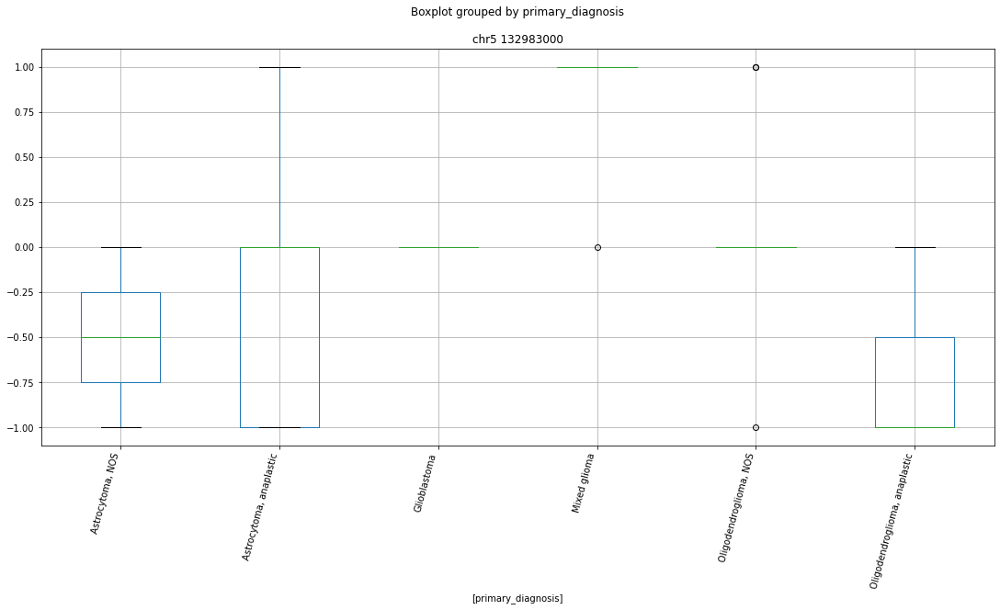

 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr12 12619000


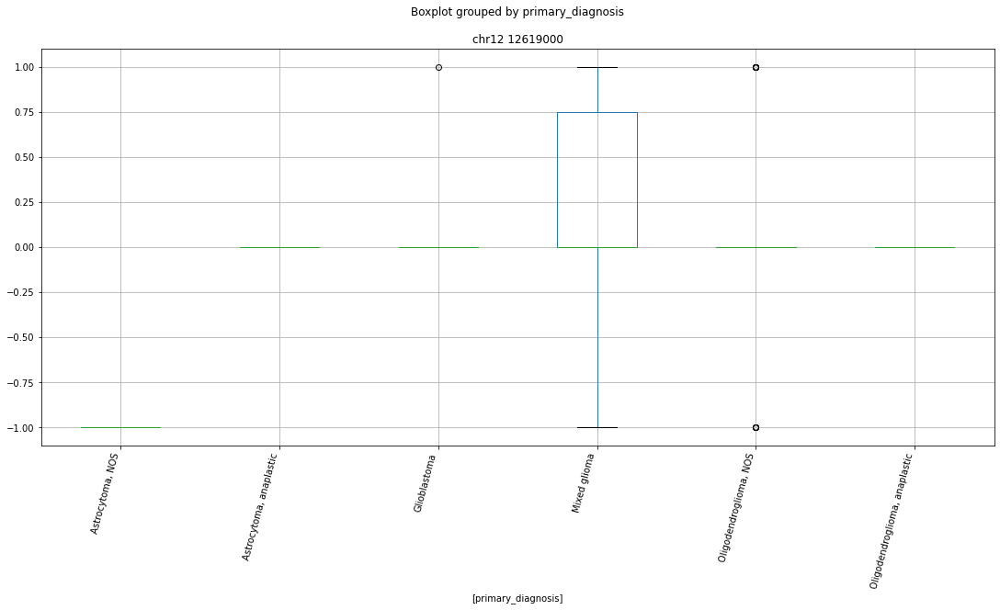

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 58454000


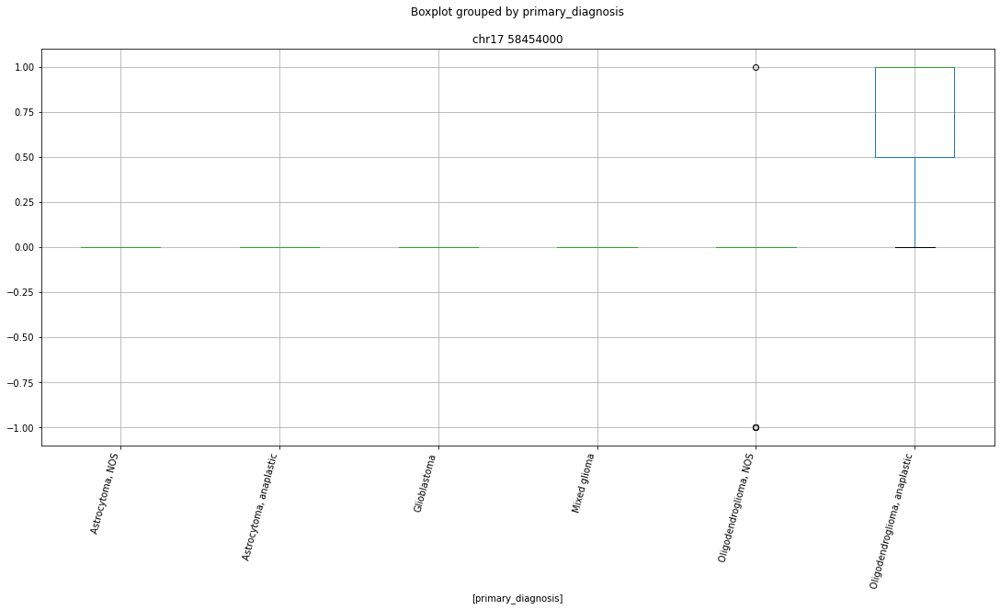

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 134063000


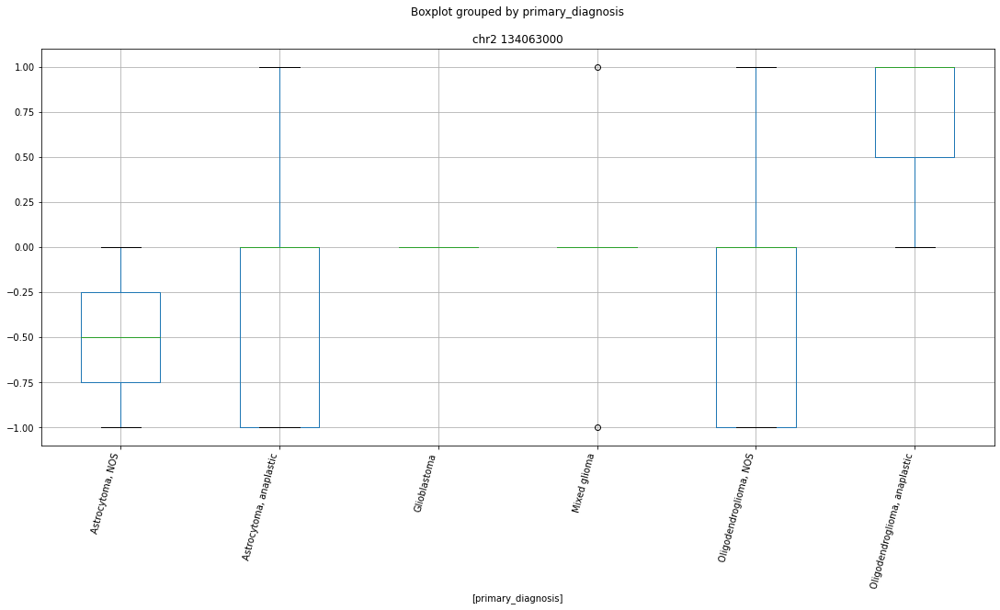

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 39227000


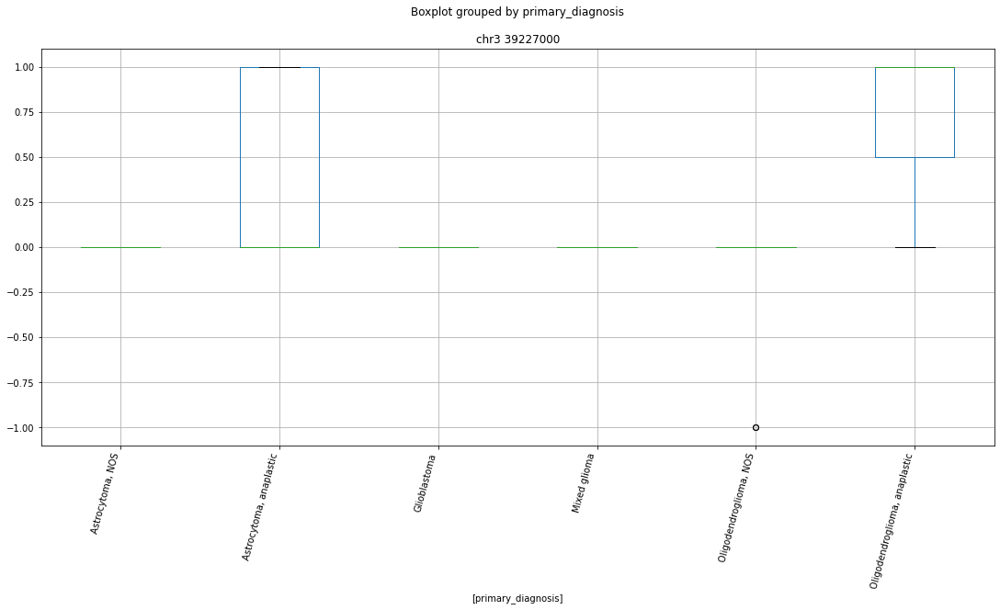

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 128688000


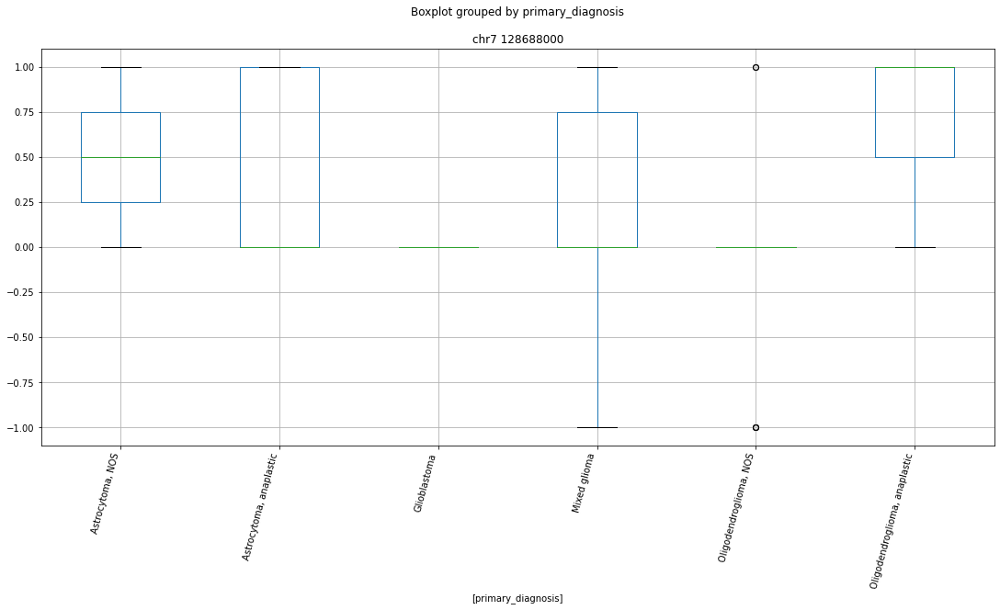

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 132983000


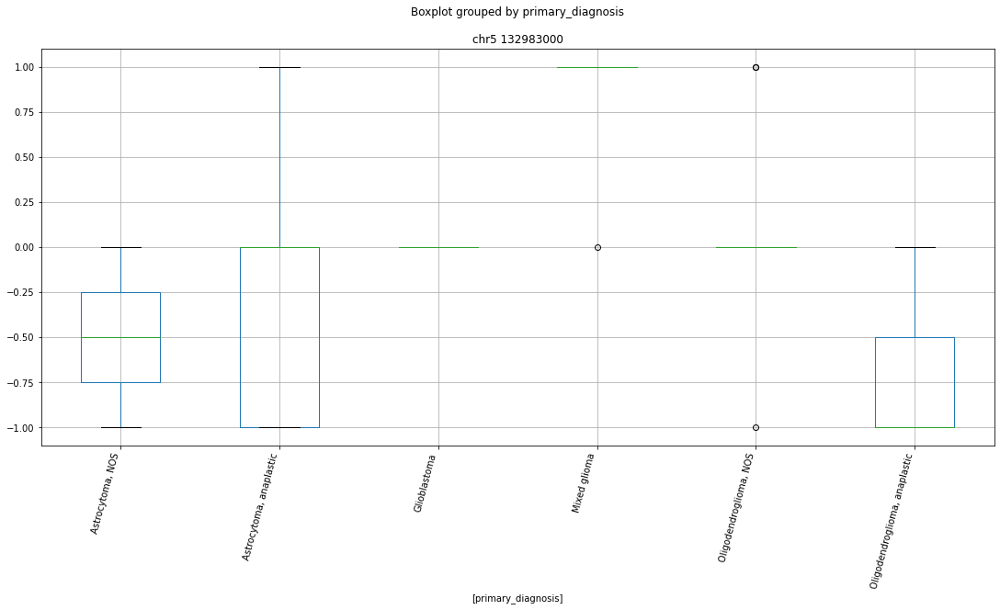

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 219544000


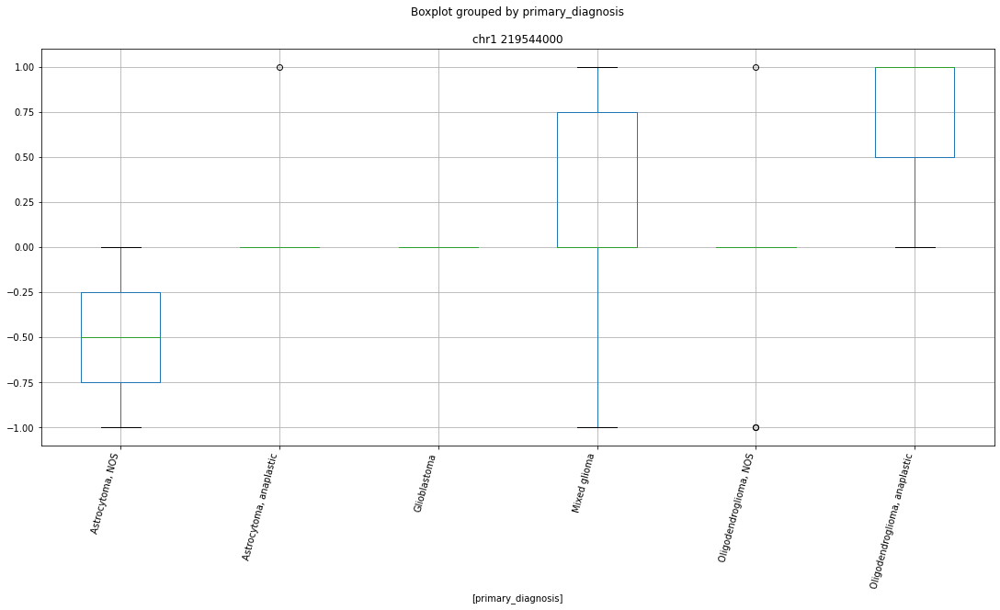

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 100479000


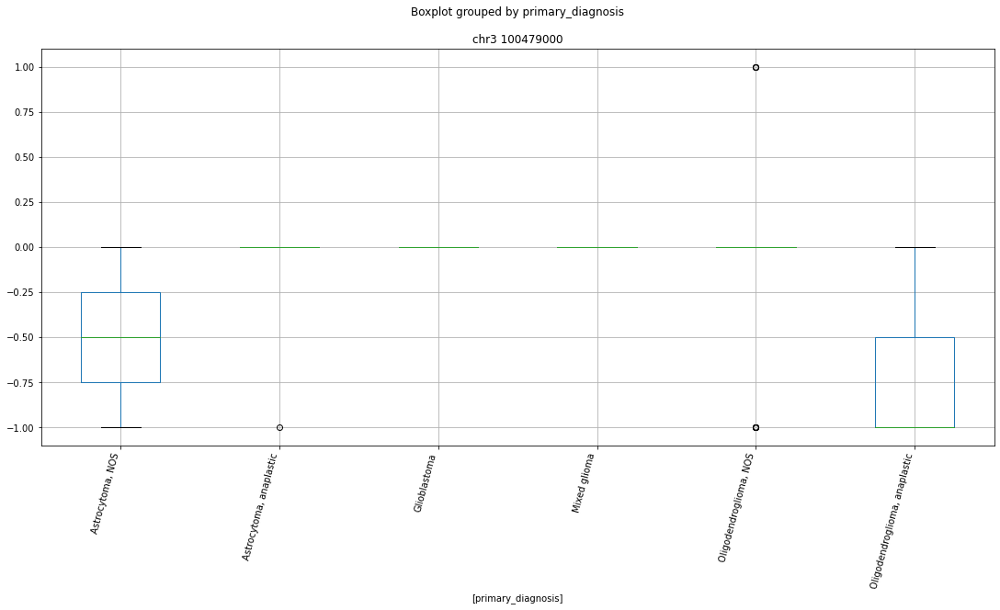

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr10 62947000


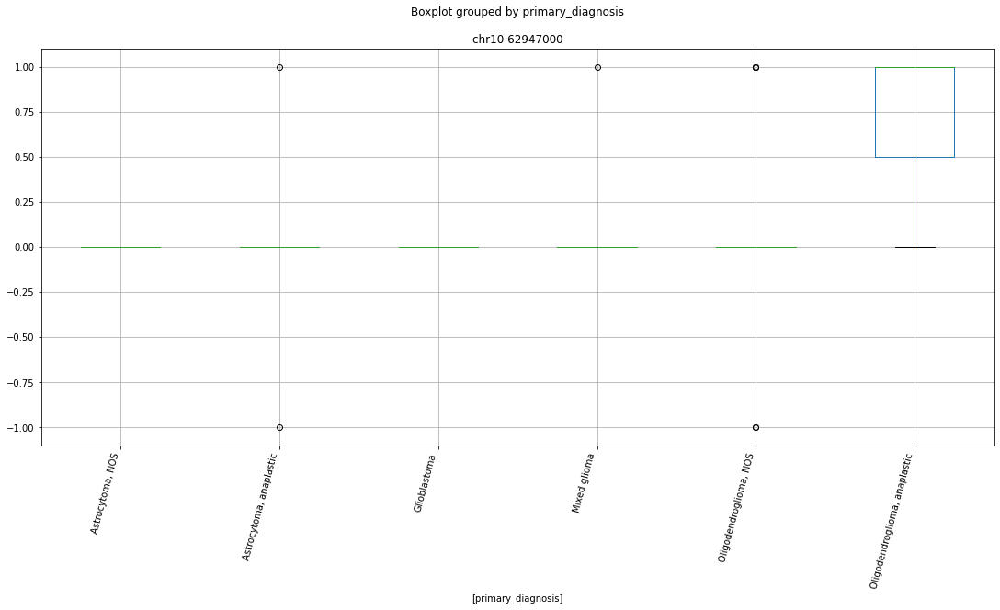

 p : 3.245614956133183e-08  ( t : 6.955905073002031 ) :  chr4 53256000


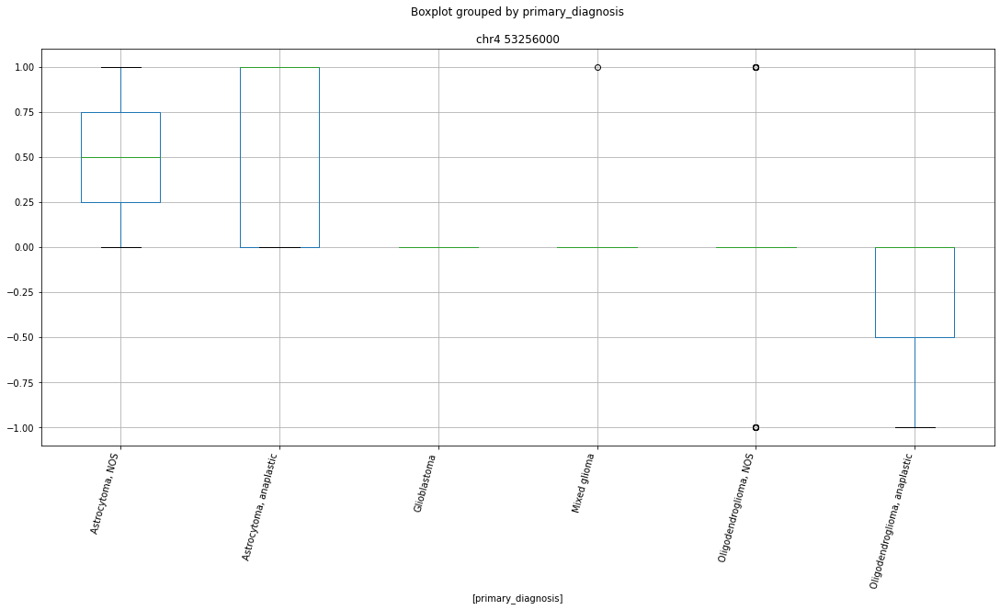

 p : 3.245614956133183e-08  ( t : 6.955905073002031 ) :  chr3 120413000


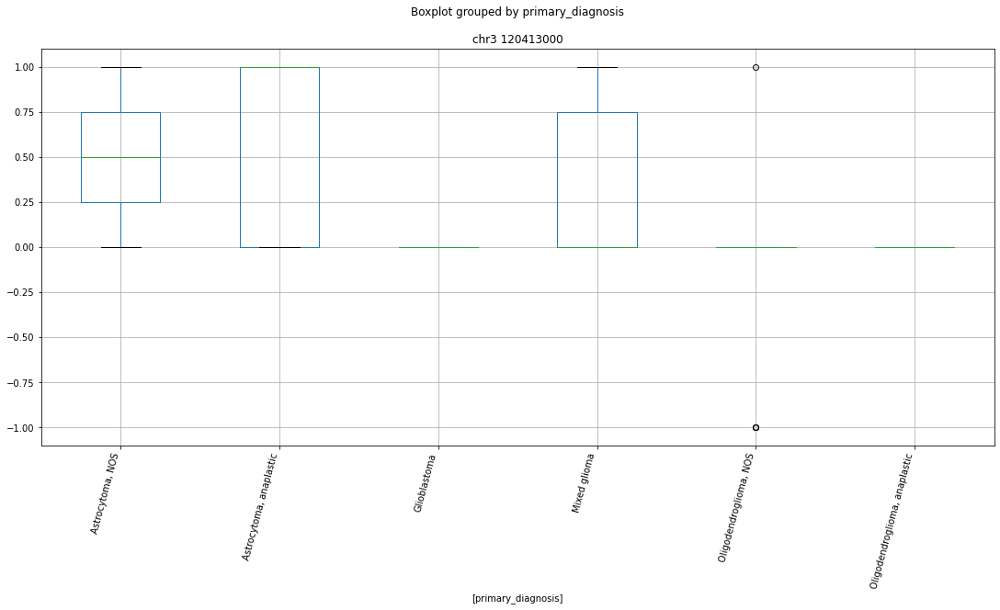

 p : 5.022570315300309e-07  ( t : 6.071611718849358 ) :  chr9 120304000


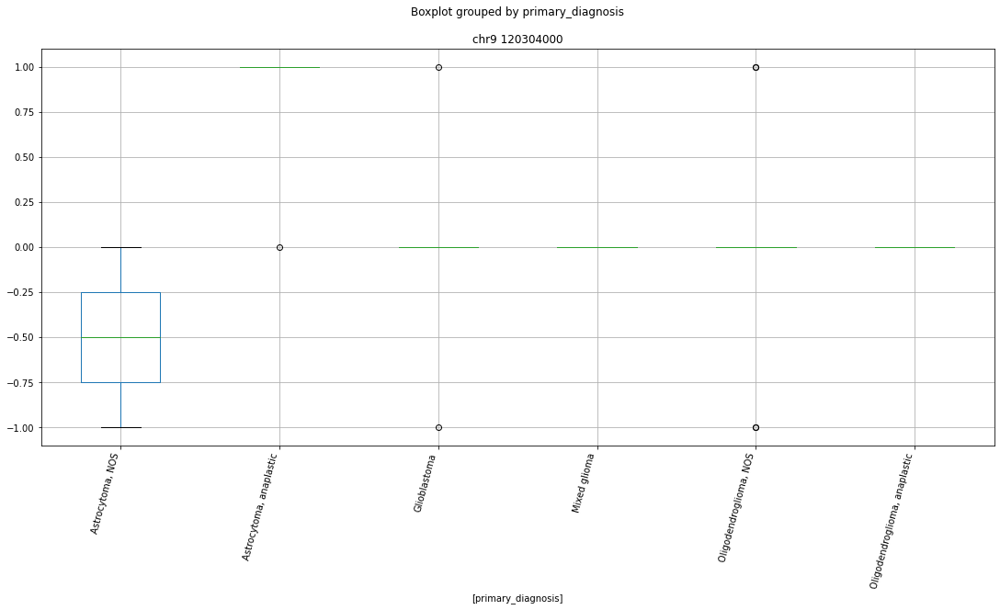

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr16 70225000


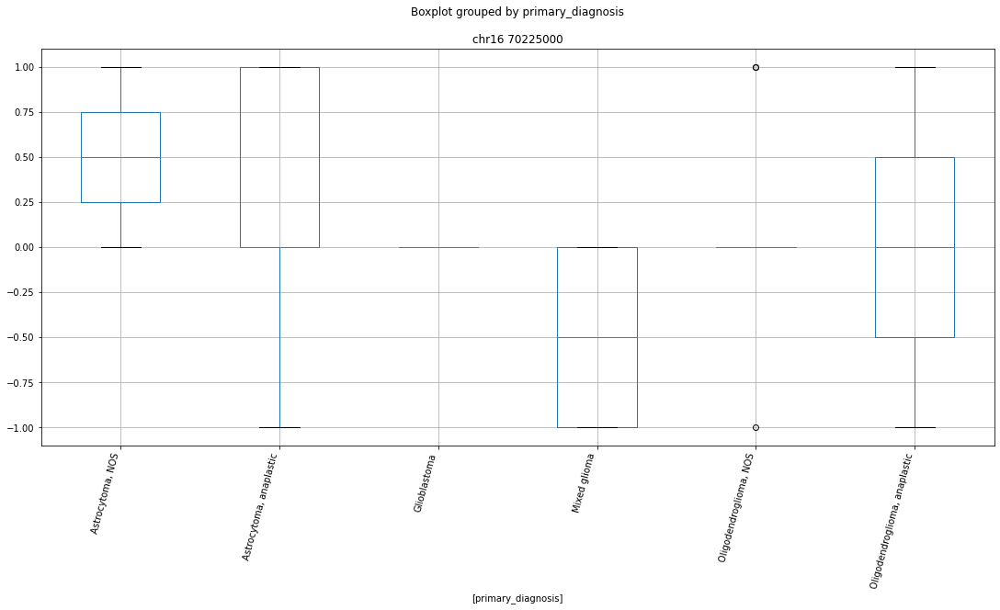

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr12 43684000


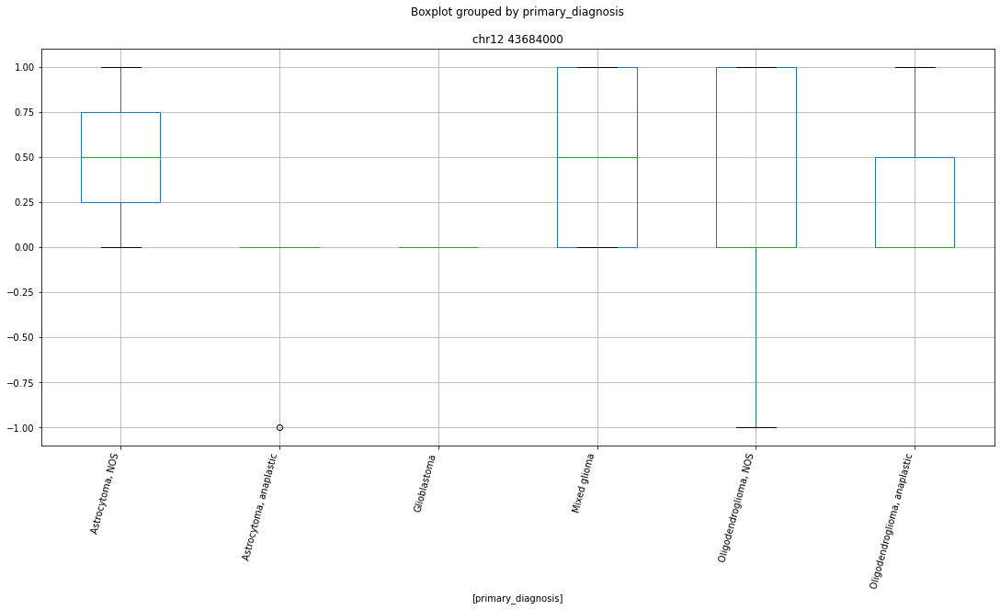

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr20 30847000


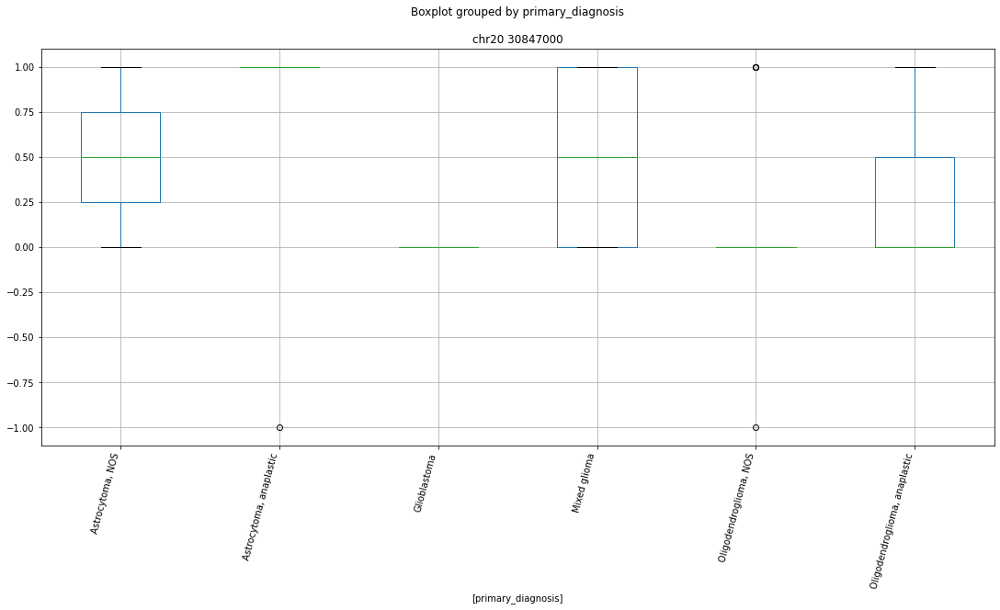

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr9 33600000


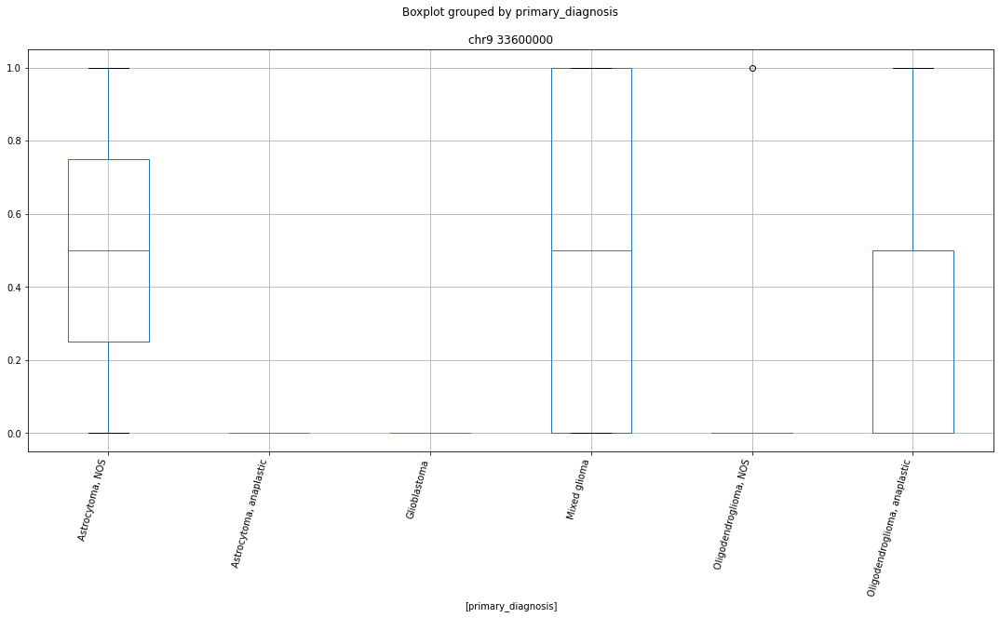

 p : 1.5481703539155018e-06  ( t : 5.683308895353129 ) :  chr1 114791000


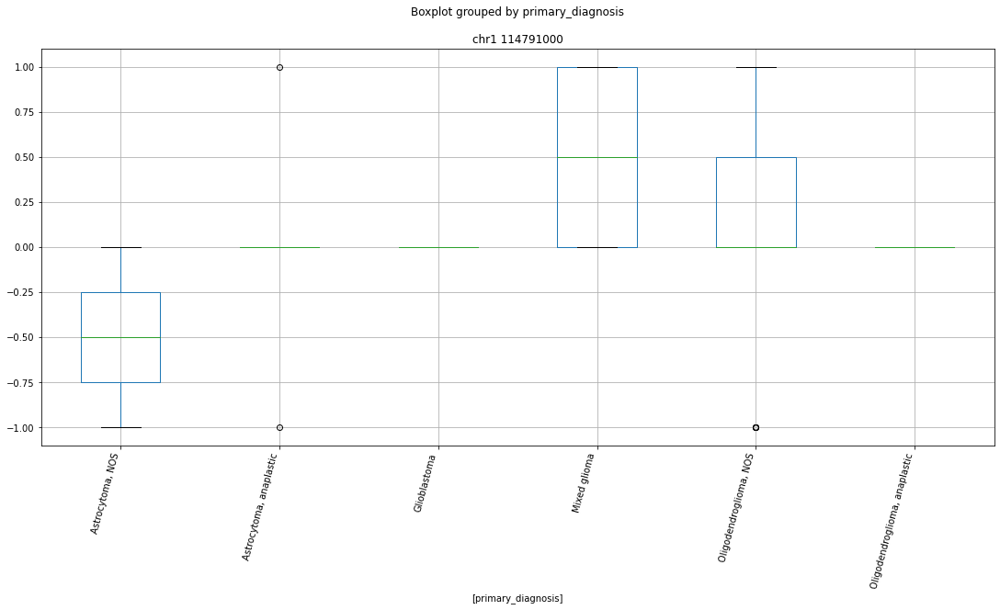

 p : 1.714740087022125e-06  ( t : 6.362389488234746 ) :  chr22 25278000


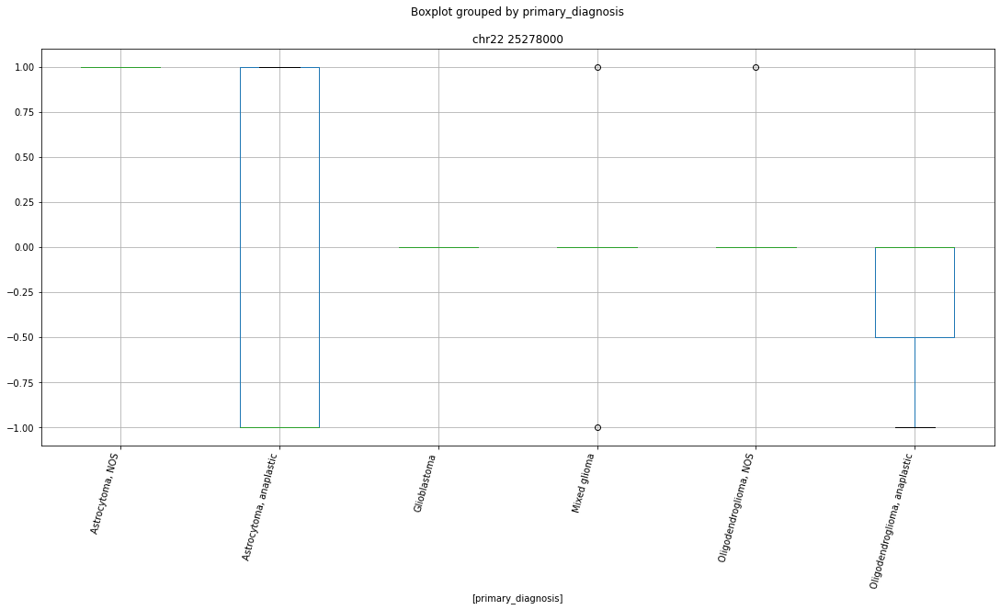

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chrX 29335000


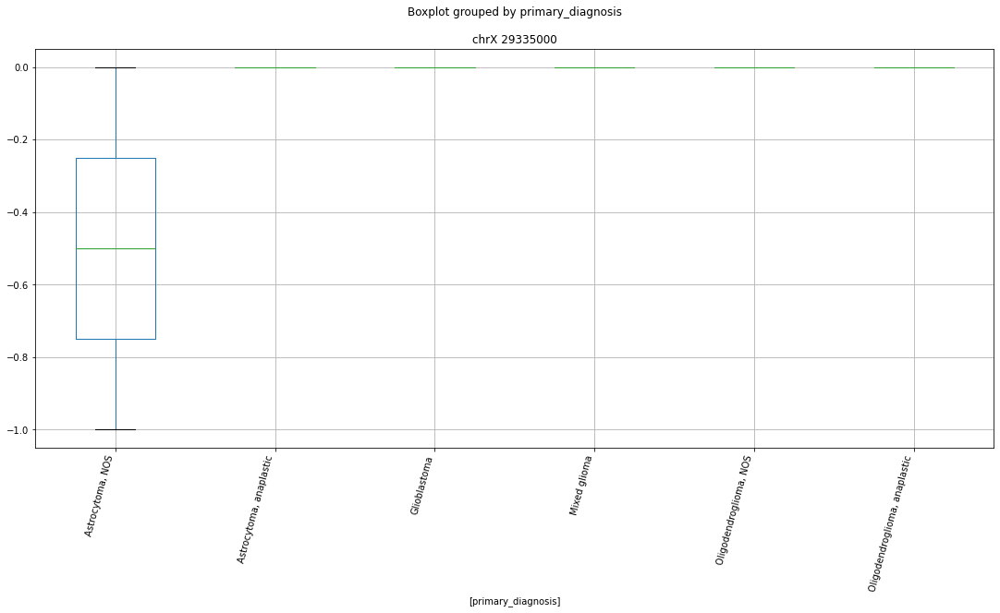

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr16 70225000


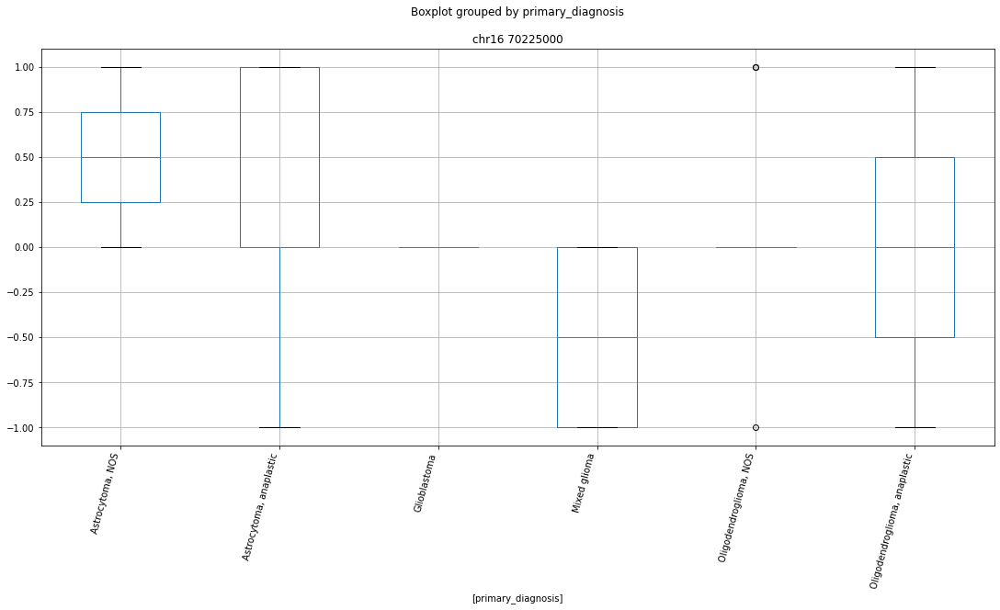

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr2 134063000


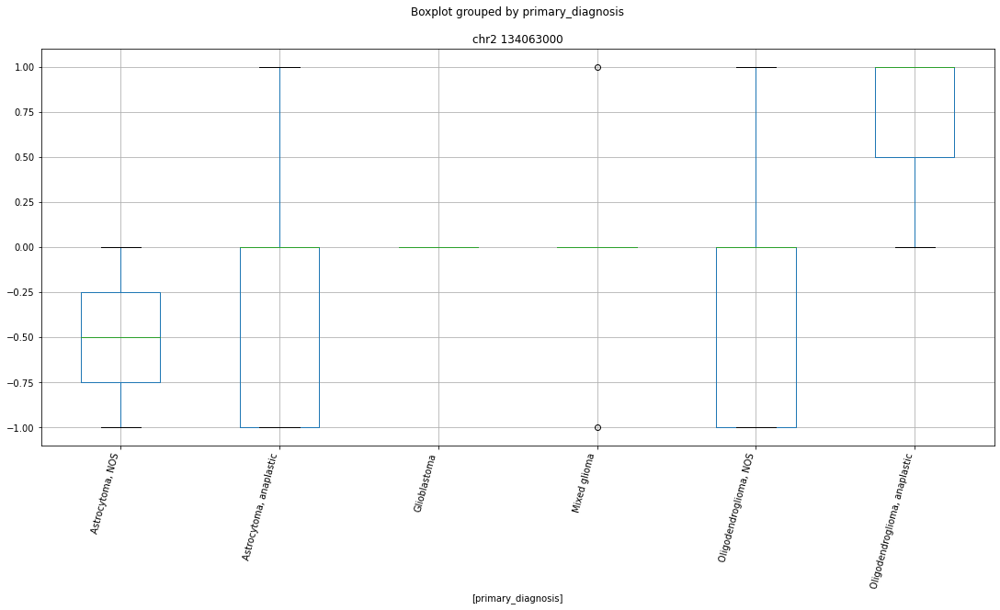

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 237670000


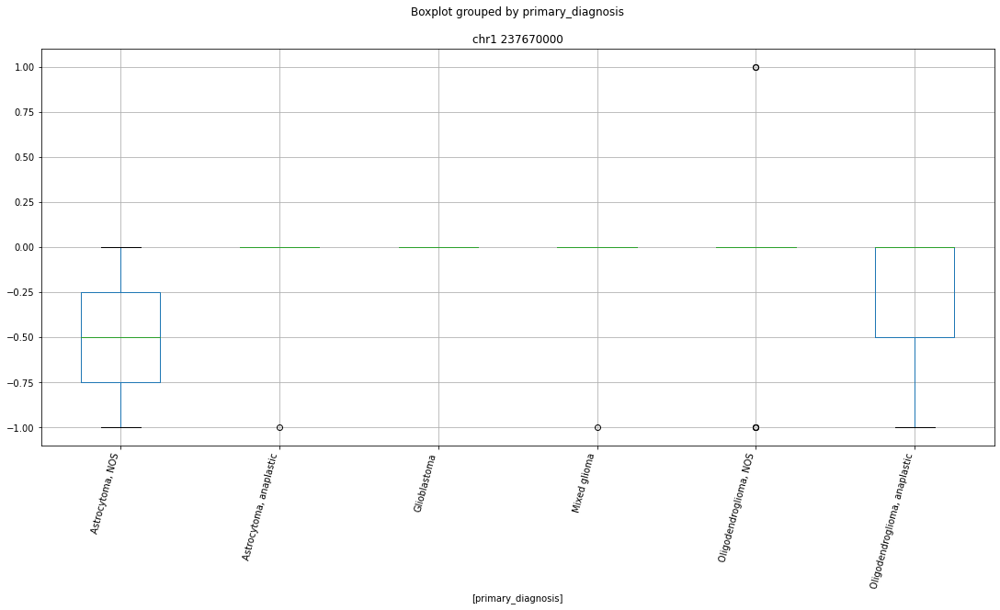

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr2 38756000


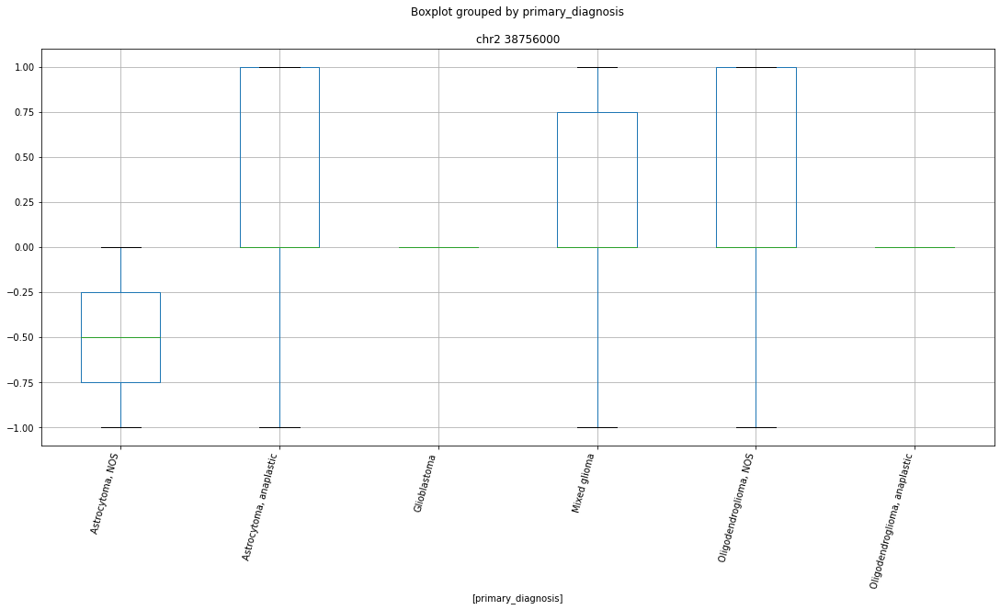

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 119560000


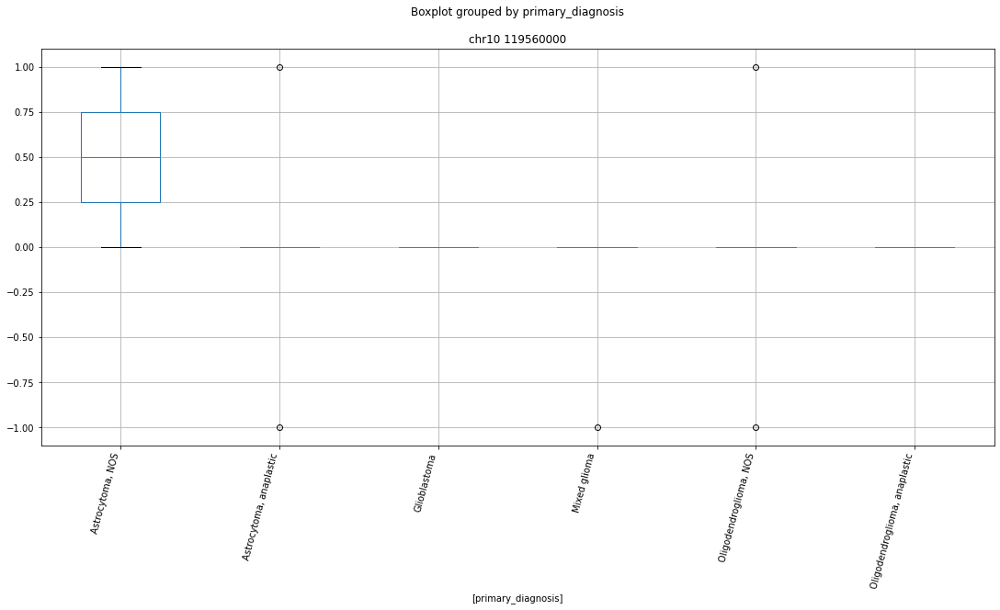

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr2 27541000


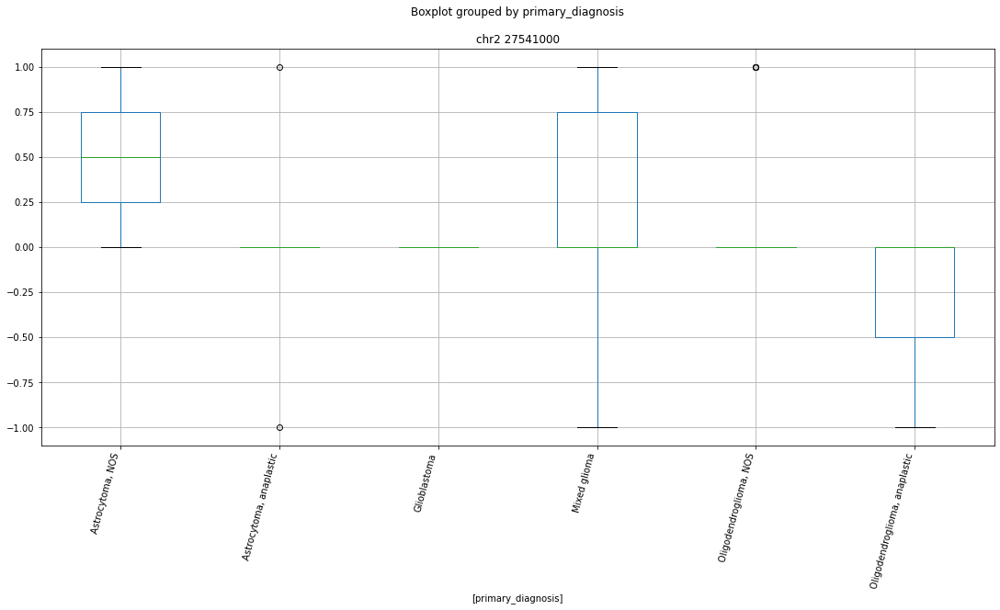

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 120413000


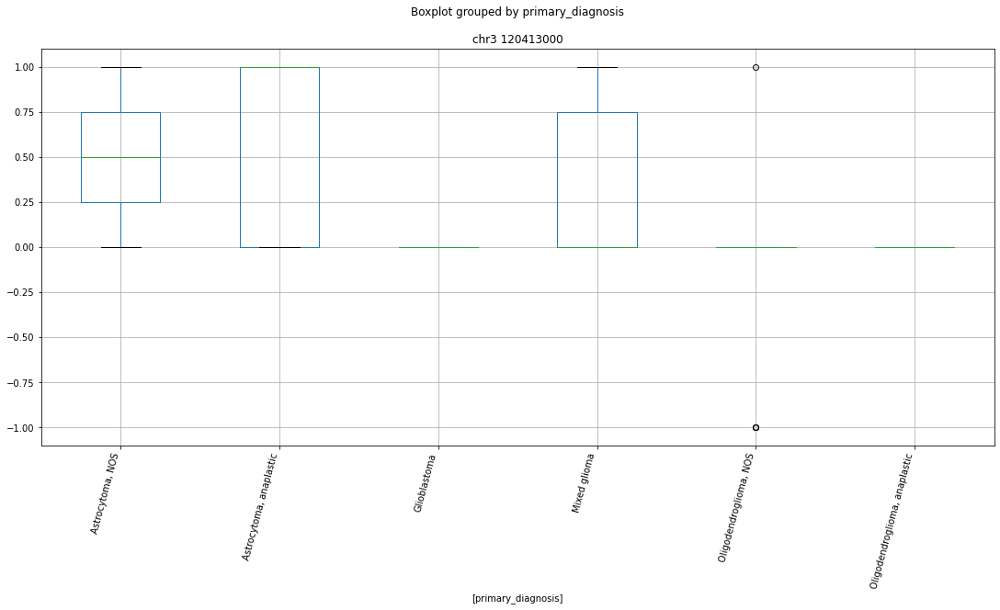

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 114791000


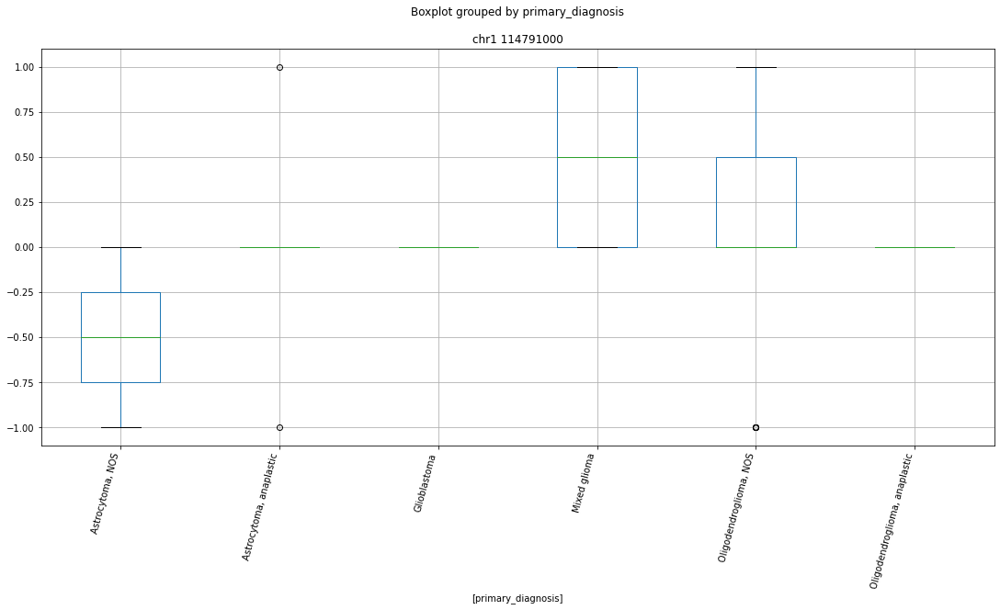

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr9 33600000


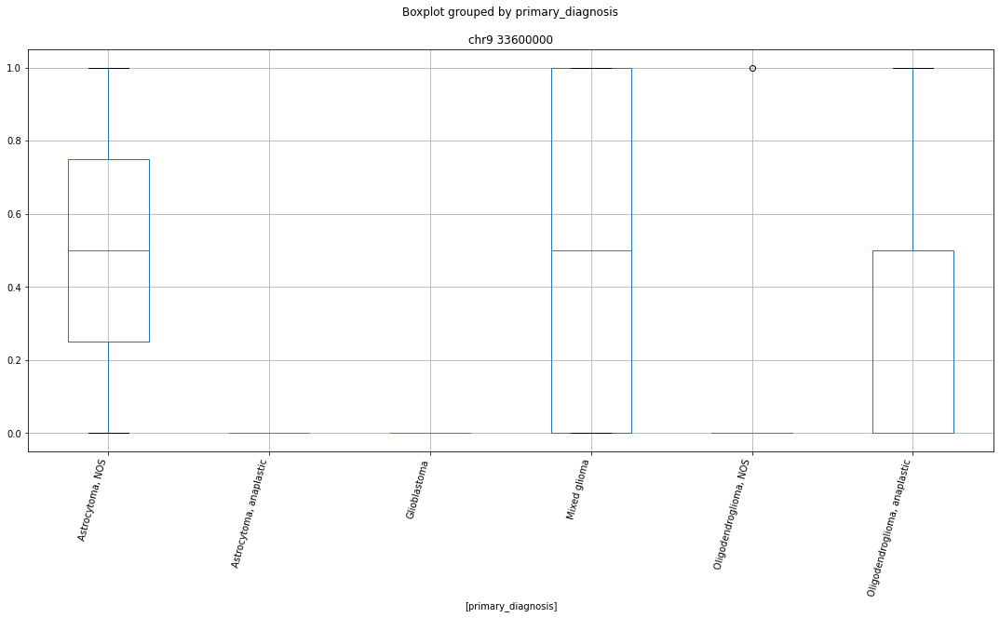

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr14 20309000


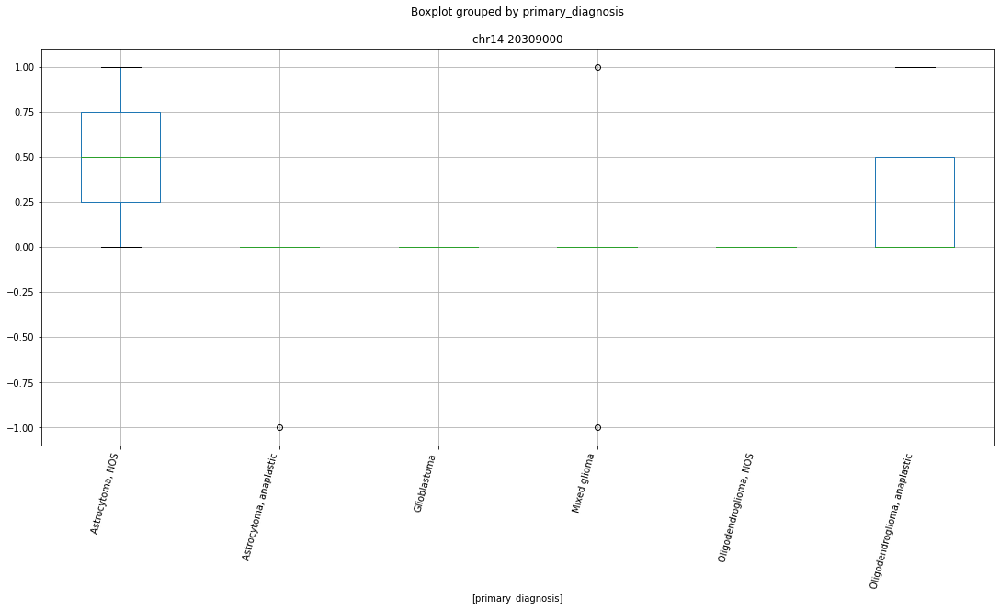

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr5 132983000


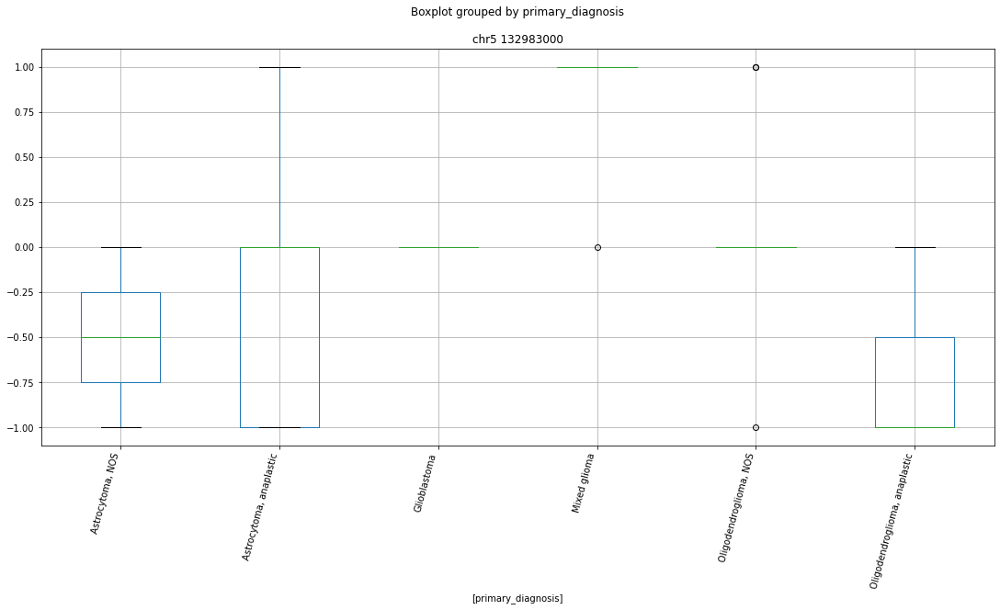

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr2 10903000


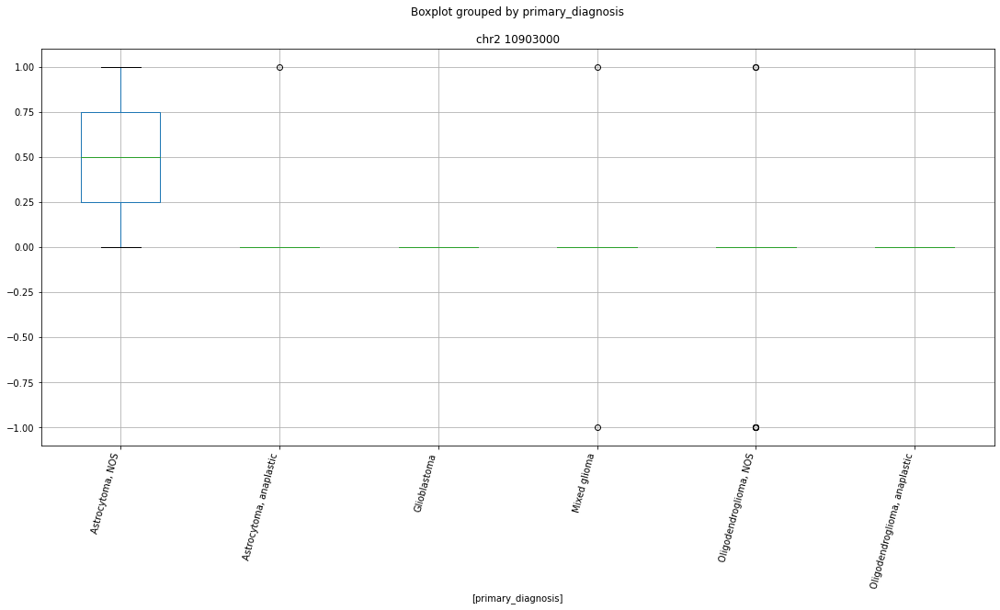

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr16 87718000


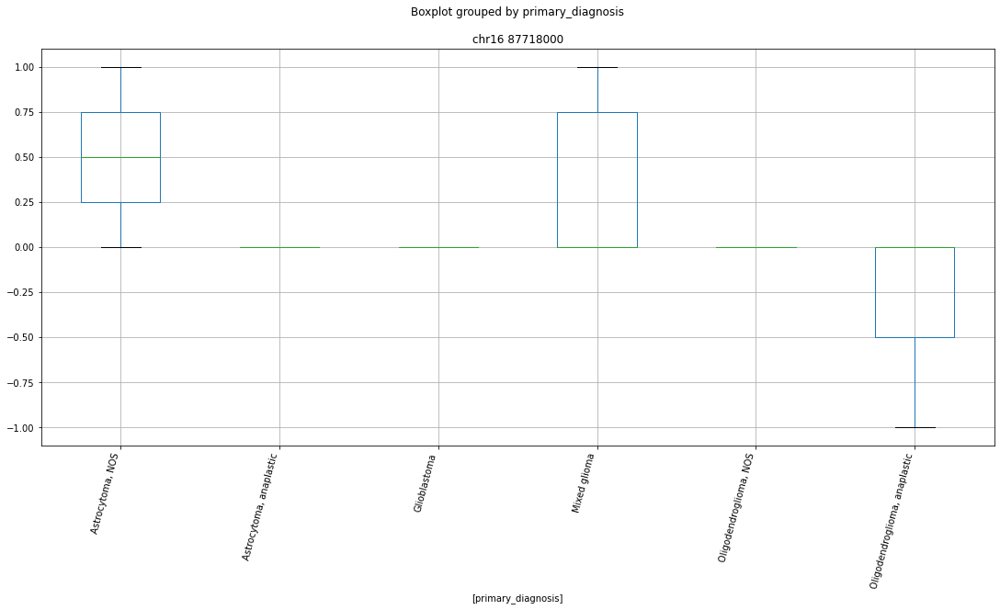

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr9 111618000


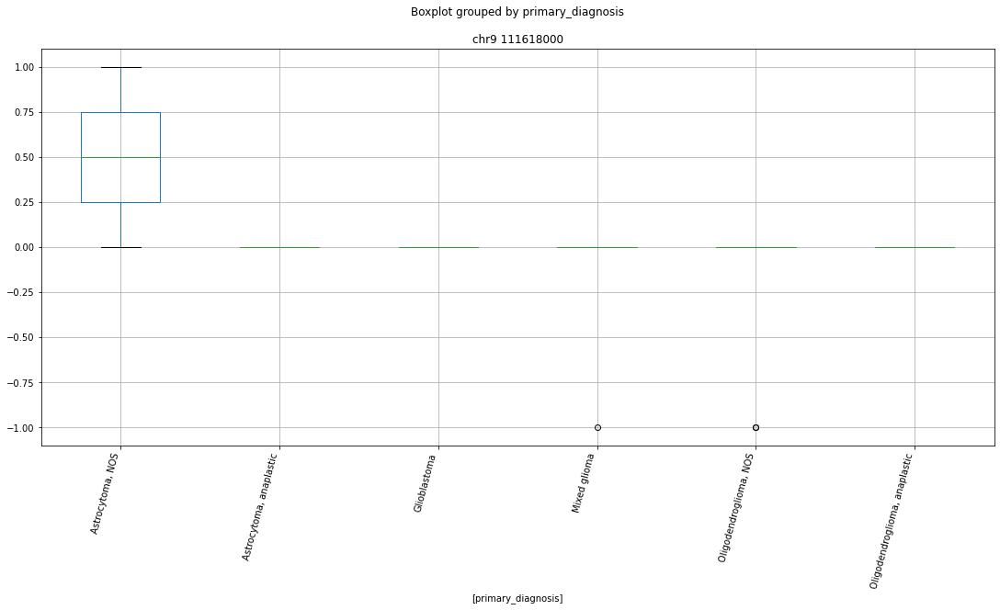

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr7 128688000


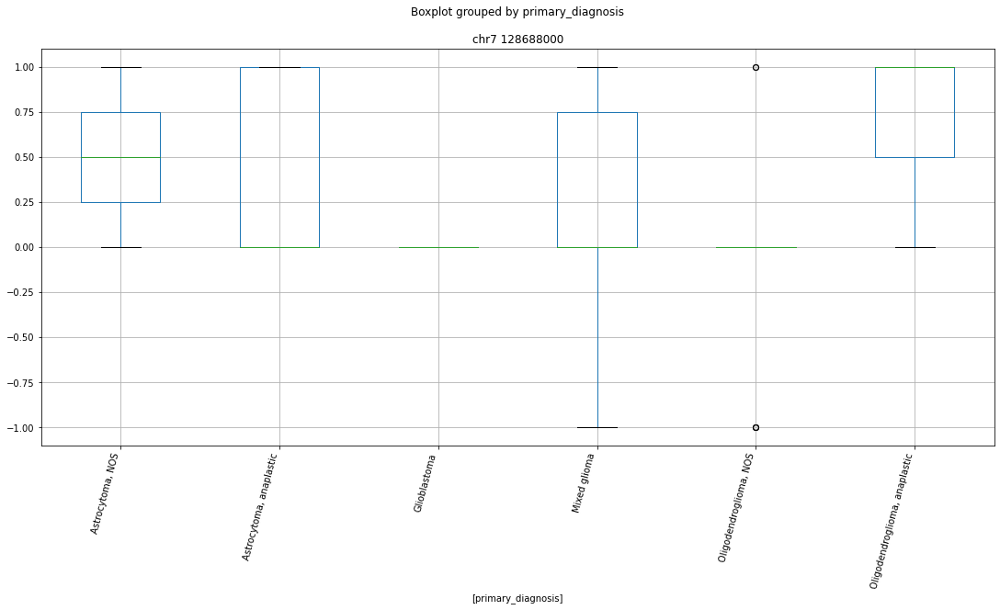

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr20 30847000


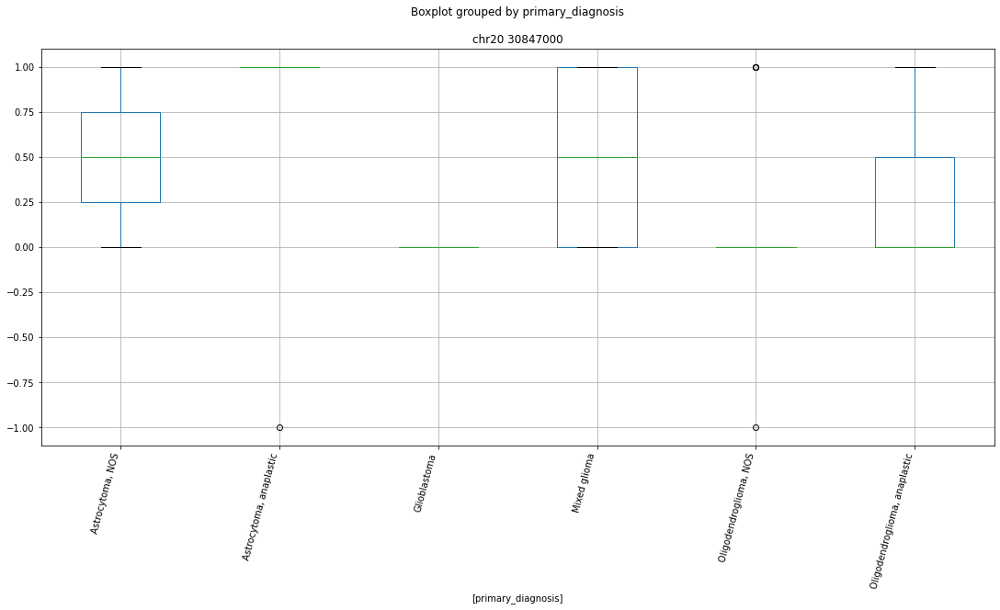

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr12 43684000


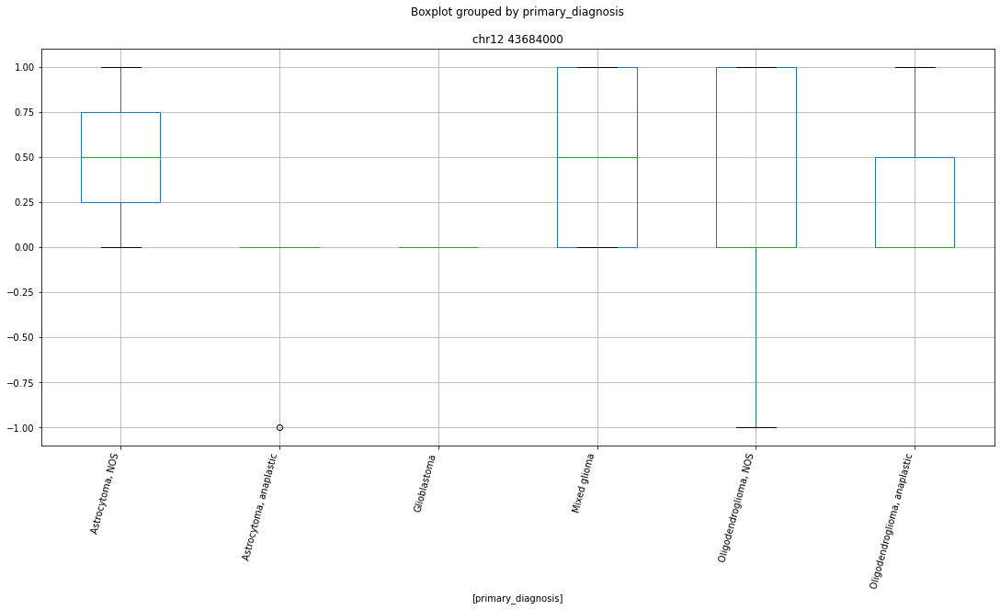

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chrX 149420000


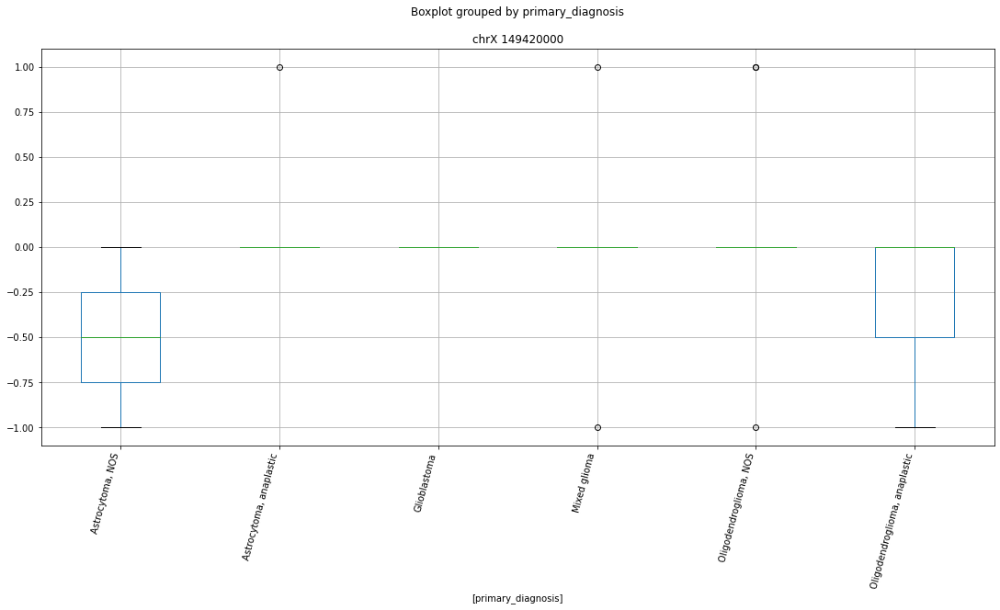

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr7 28838000


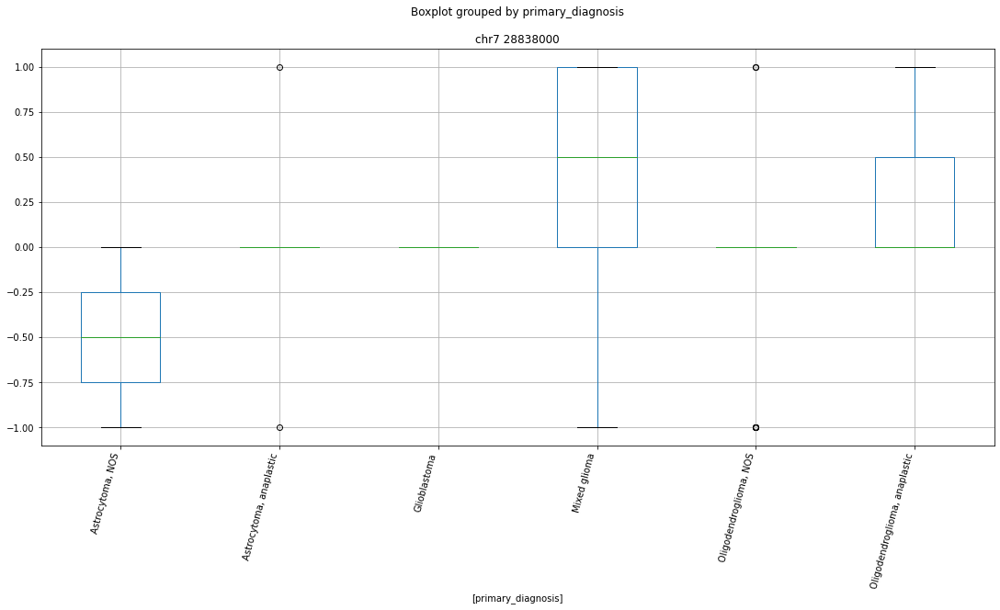

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr4 114515000


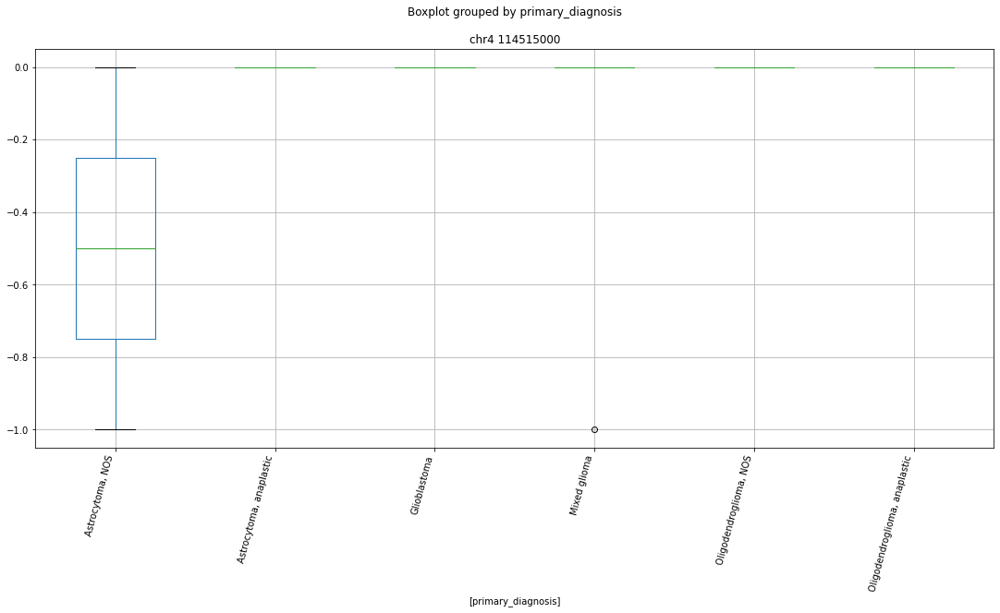

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 199905000


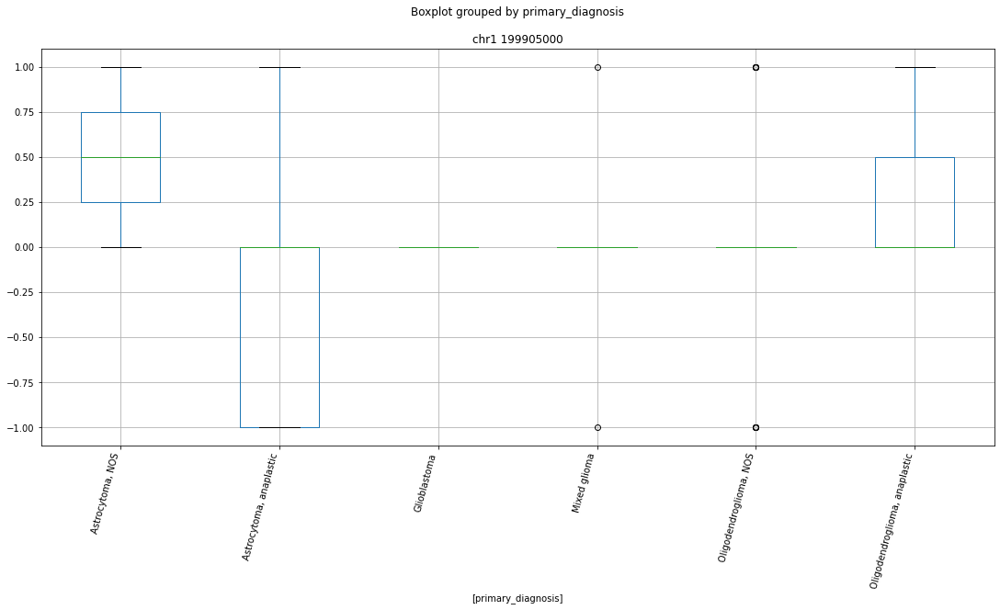

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 212322000


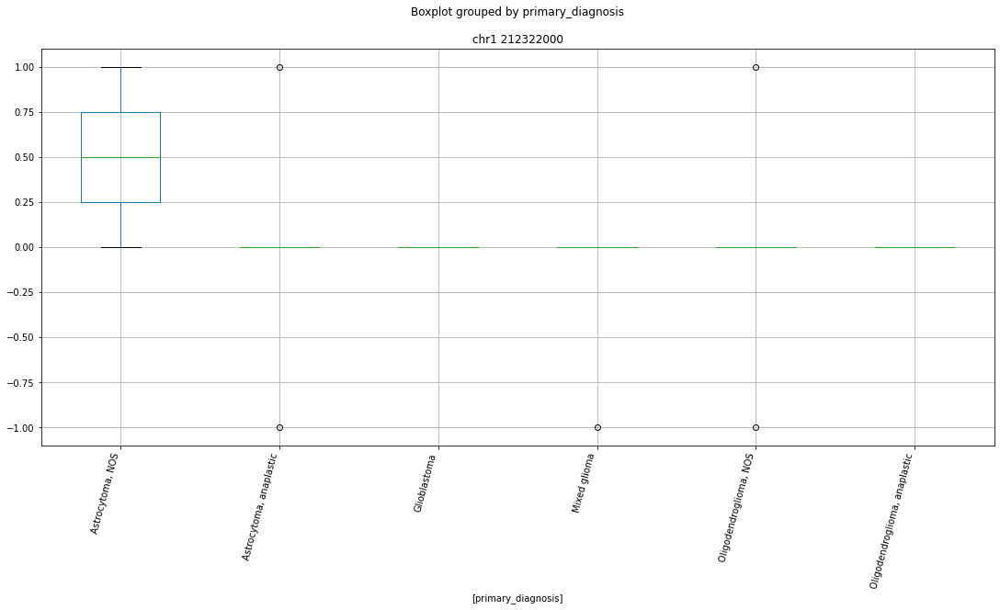

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr2 63808000


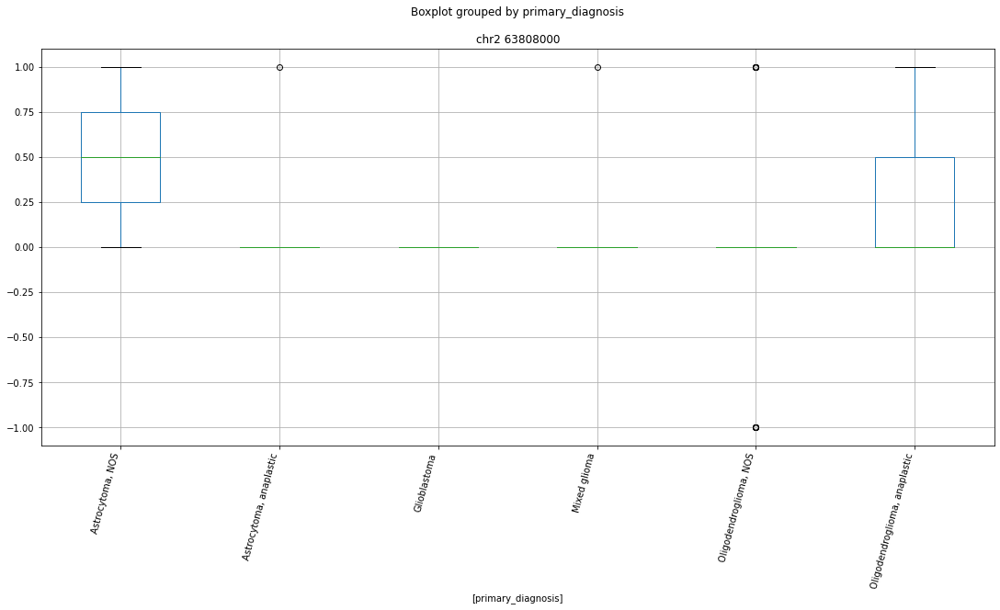

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 219544000


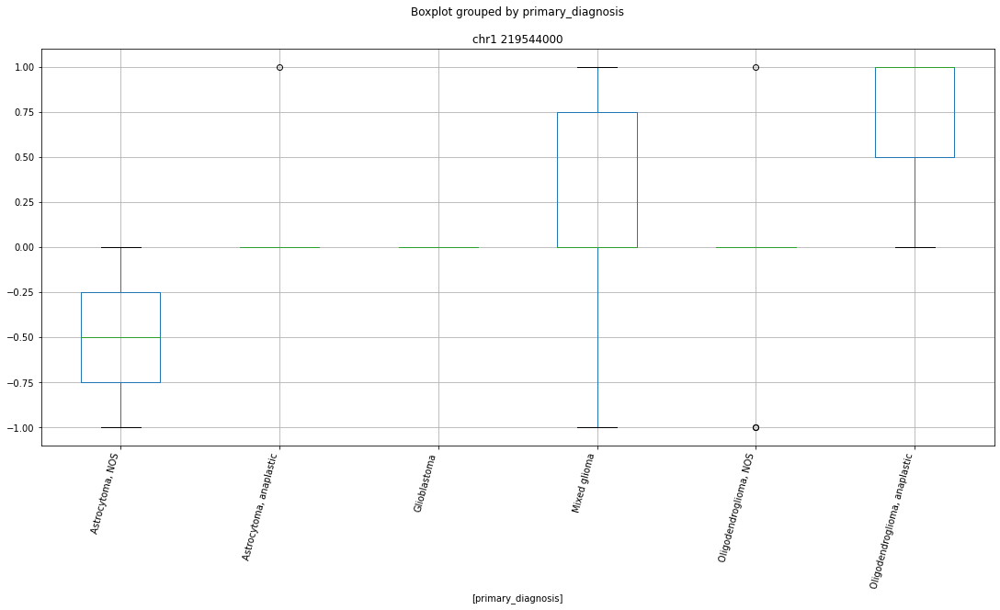

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr4 53256000


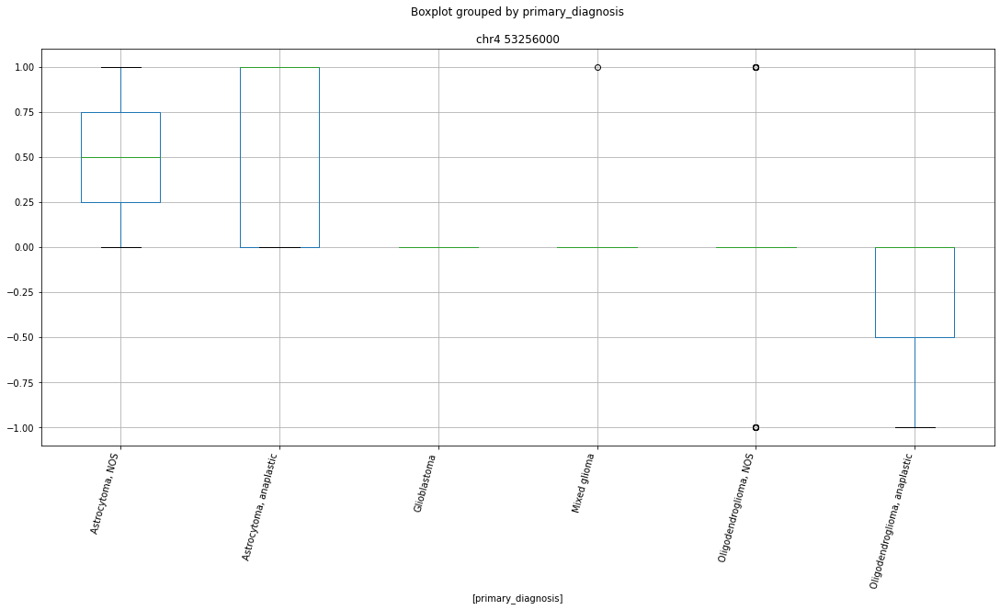

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 100479000


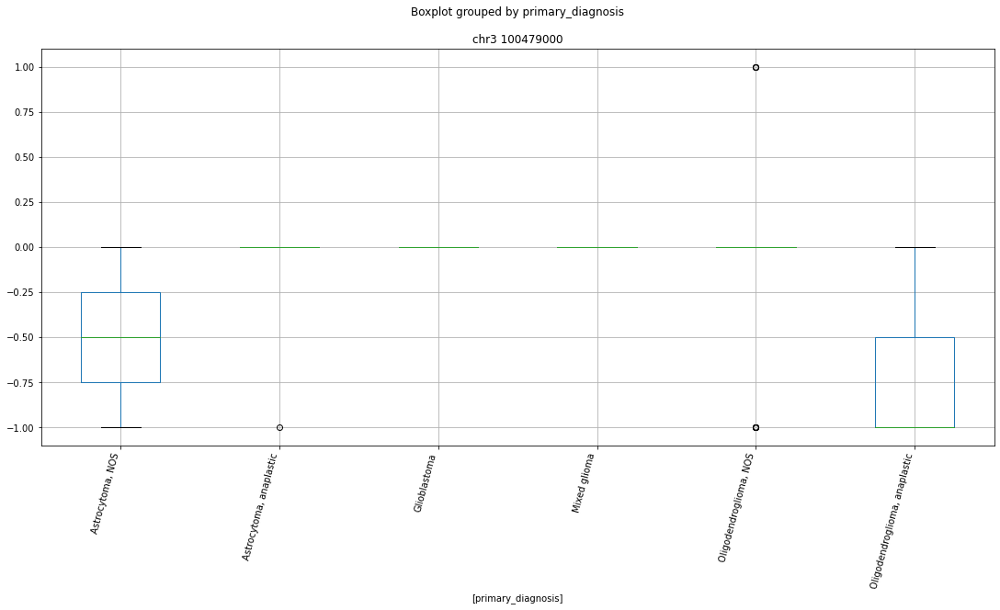

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr10 63812000


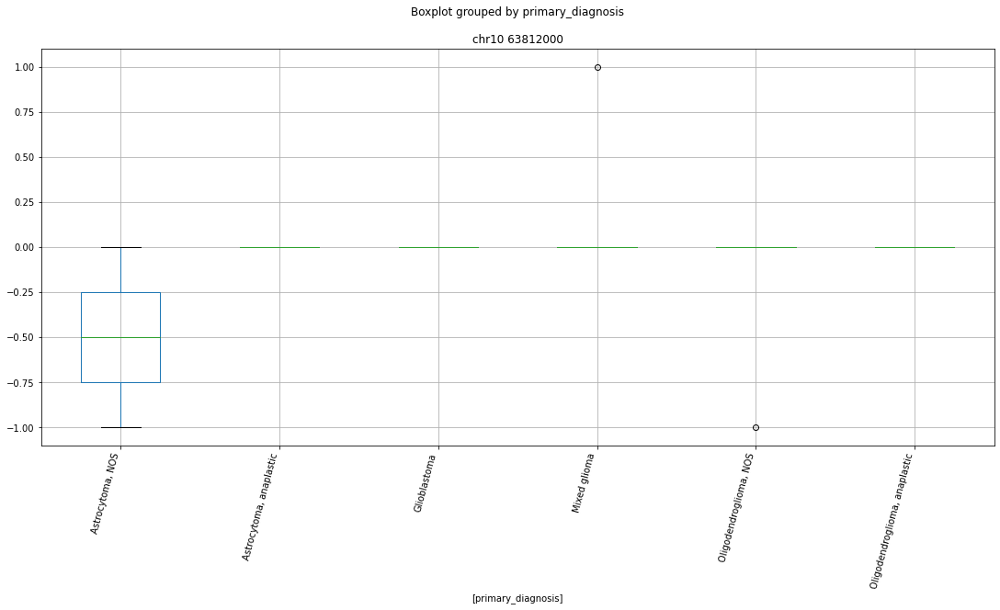

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr1 248676000


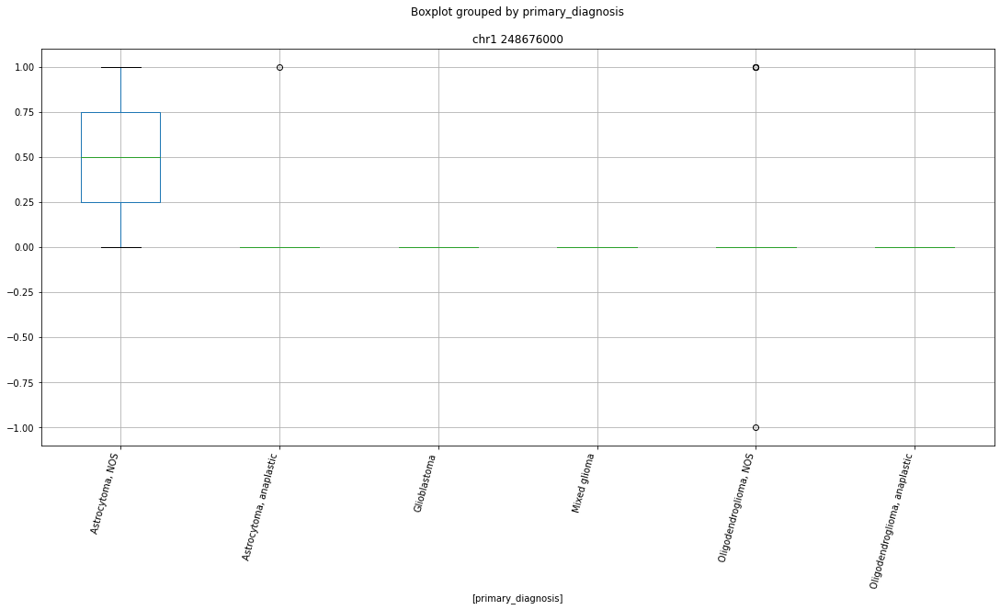

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr17 63455000


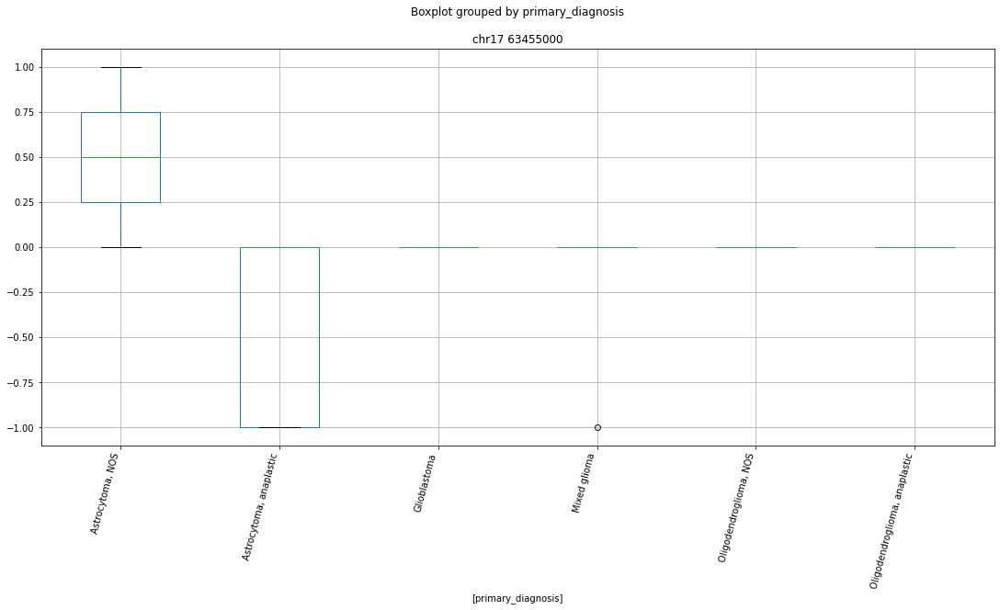

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr8 86424000


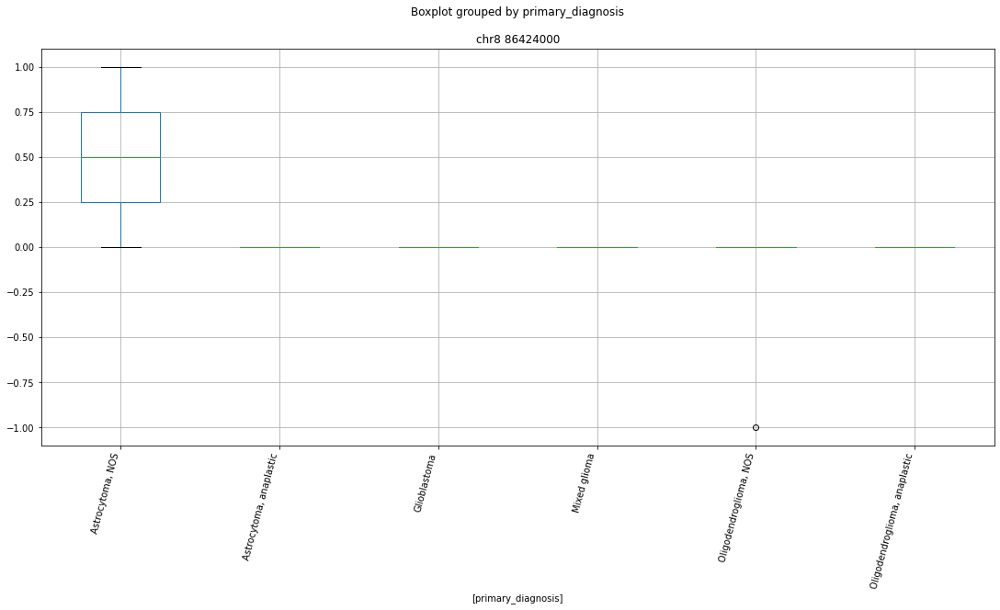

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr3 50313000


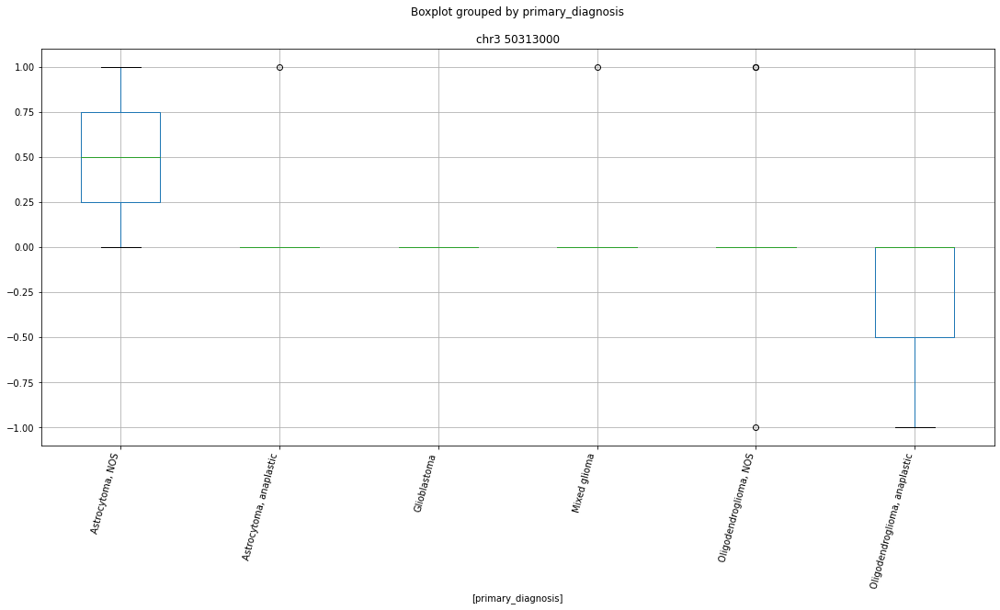

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chrX 42286000


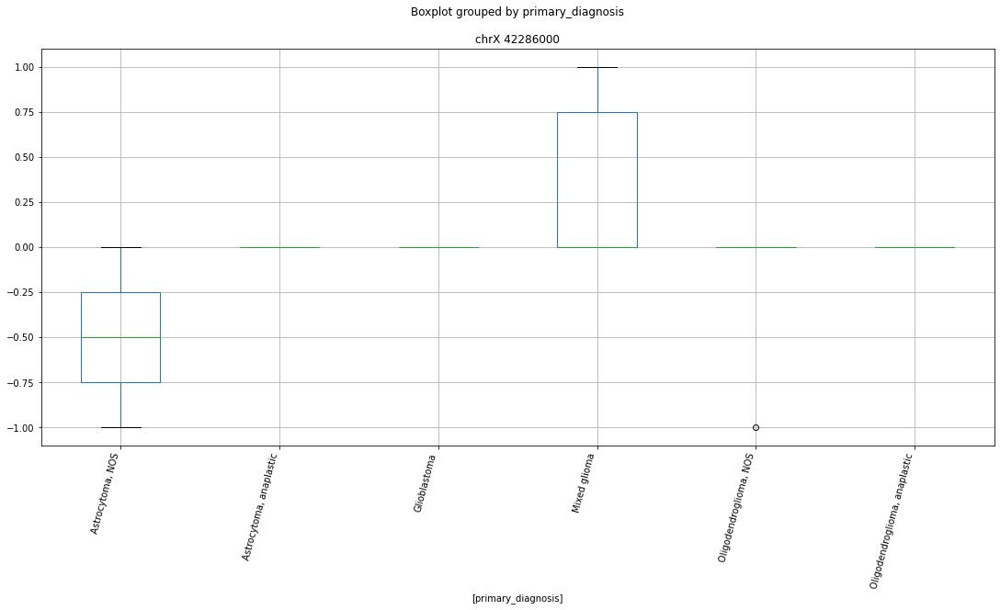

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr6 19938000


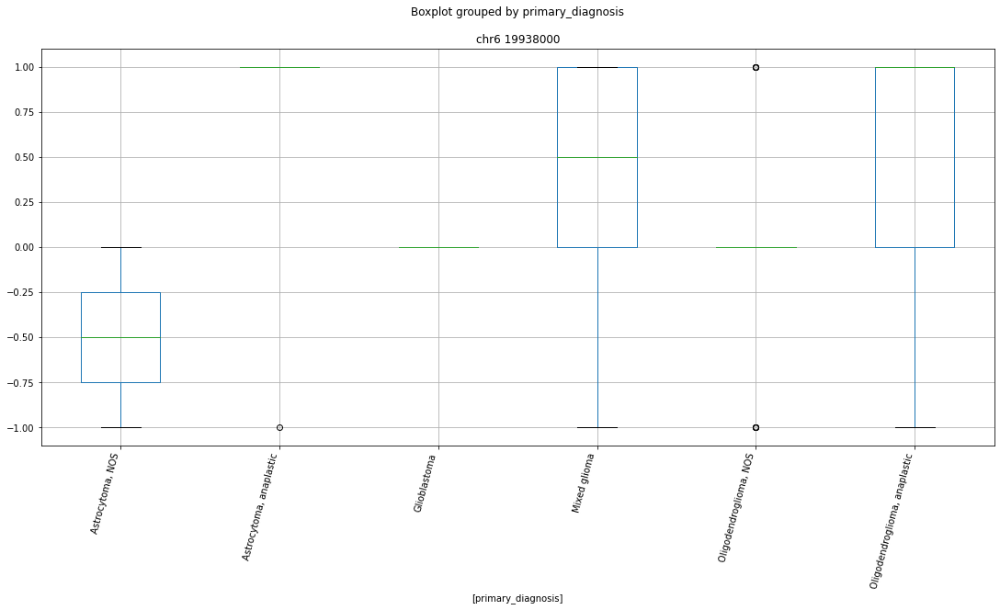

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr7 111609000


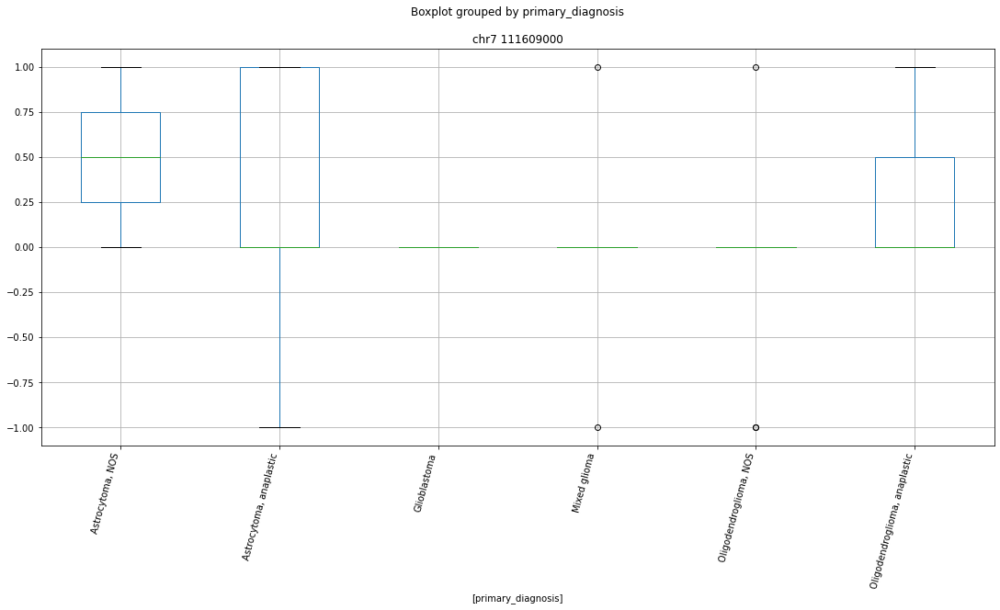

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chrX 48221000


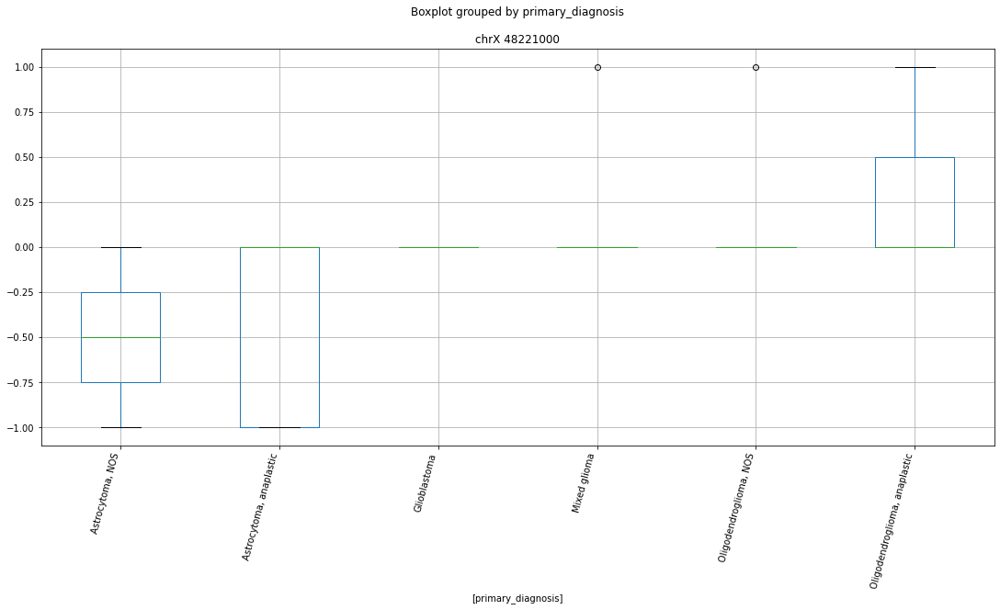

 p : 2.3350854158890195e-06  ( t : 5.666666666666667 ) :  chr15 82999000


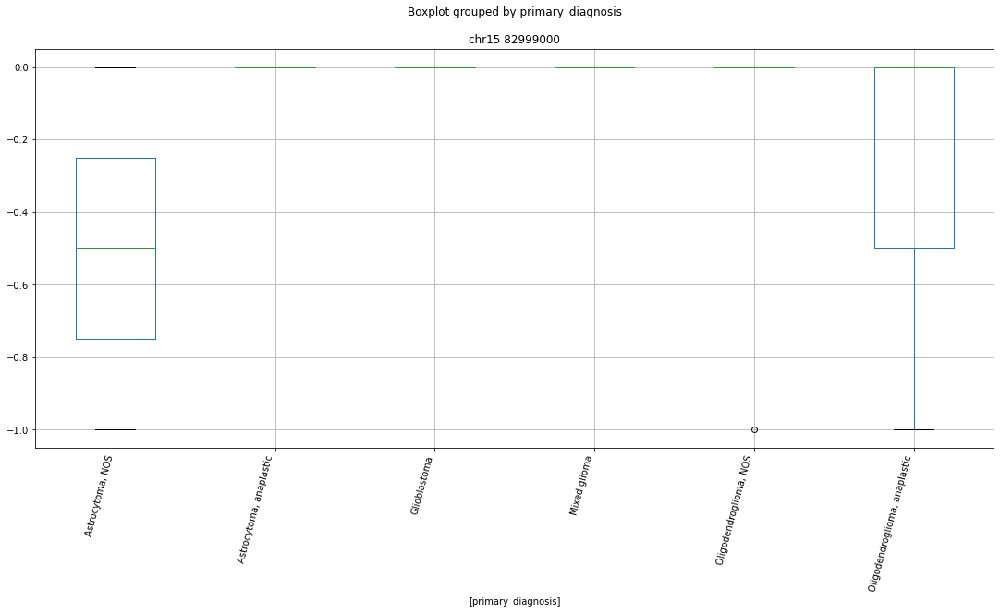

 p : 3.7659667851528006e-06  ( t : 5.425492320865619 ) :  chr8 43688000


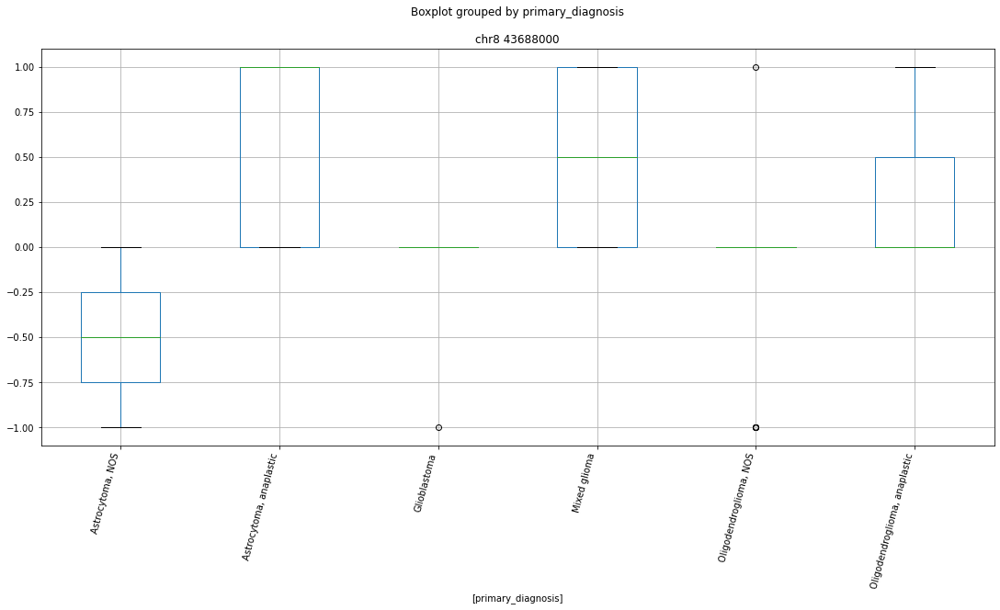

 p : 5.666698422800871e-06  ( t : 5.343591782201504 ) :  chr8 37927000


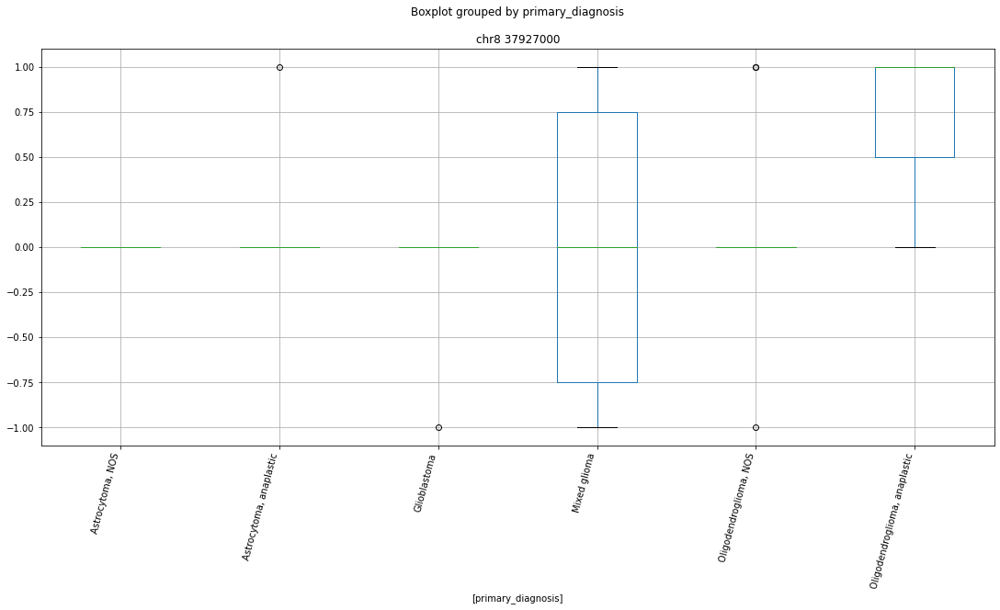

Clustermapping
['chr1 10029000' 'chr1 10427000' 'chr1 106411000' 'chr1 109054000'
 'chr1 112641000' 'chr1 11305000' 'chr1 114791000' 'chr1 114803000'
 'chr1 114805000' 'chr1 12042000' 'chr1 13657000' 'chr1 143702000'
 'chr1 145763000' 'chr1 145765000' 'chr1 147062000' 'chr1 147232000'
 'chr1 147734000' 'chr1 150780000' 'chr1 151652000' 'chr1 151768000'
 'chr1 152144000' 'chr1 152195000' 'chr1 152255000' 'chr1 152472000'
 'chr1 153575000' 'chr1 154286000' 'chr1 154288000' 'chr1 156328000'
 'chr1 161280000' 'chr1 161615000' 'chr1 161617000' 'chr1 162465000'
 'chr1 167030000' 'chr1 168208000' 'chr1 168838000' 'chr1 170419000'
 'chr1 171694000' 'chr1 176397000' 'chr1 179039000' 'chr1 179417000'
 'chr1 182508000' 'chr1 199905000' 'chr1 202190000' 'chr1 202192000'
 'chr1 202451000' 'chr1 203841000' 'chr1 206065000' 'chr1 208658000'
 'chr1 209128000' 'chr1 21052000' 'chr1 211198000' 'chr1 212322000'
 'chr1 213153000' 'chr1 219544000' 'chr1 220467000' 'chr1 22159000'
 'chr1 222486000' 'chr1 22

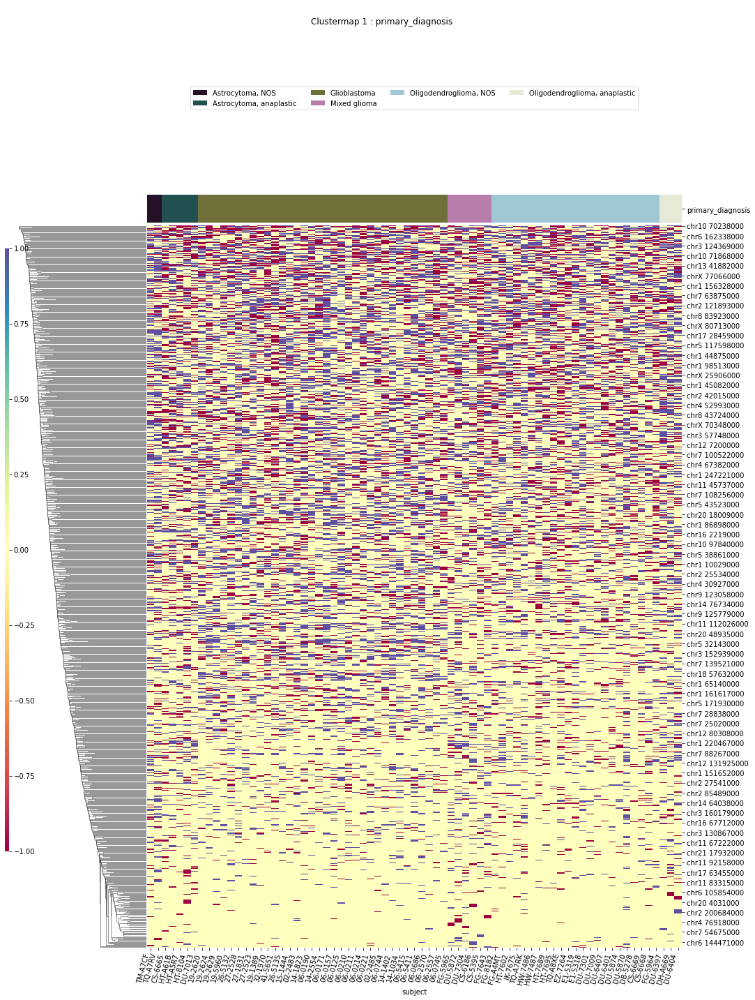

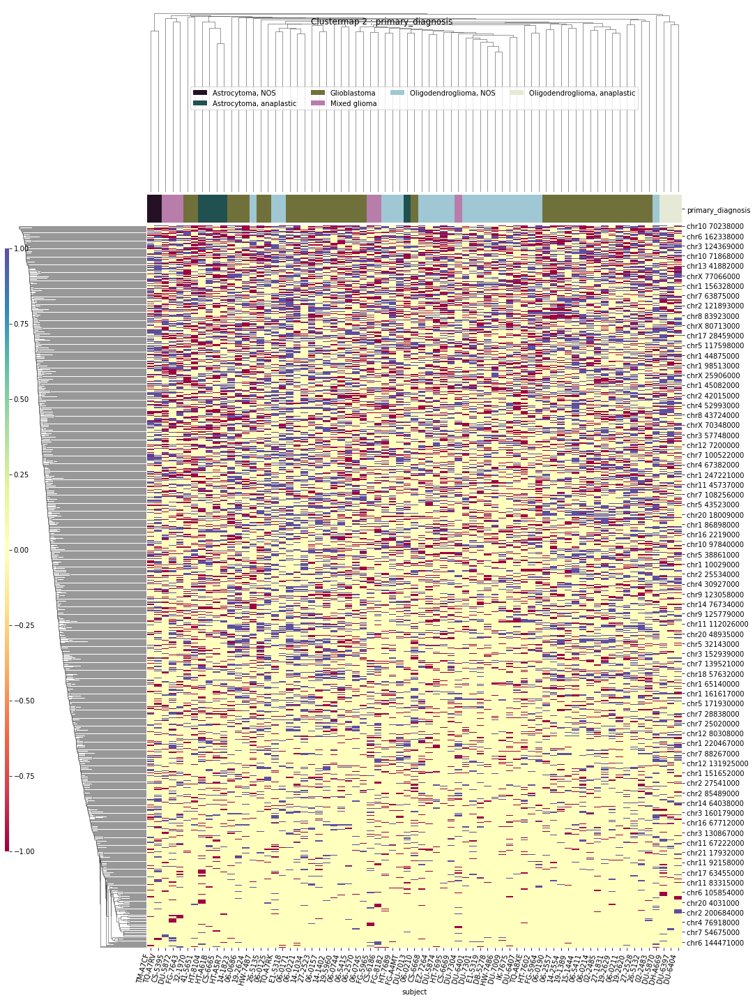

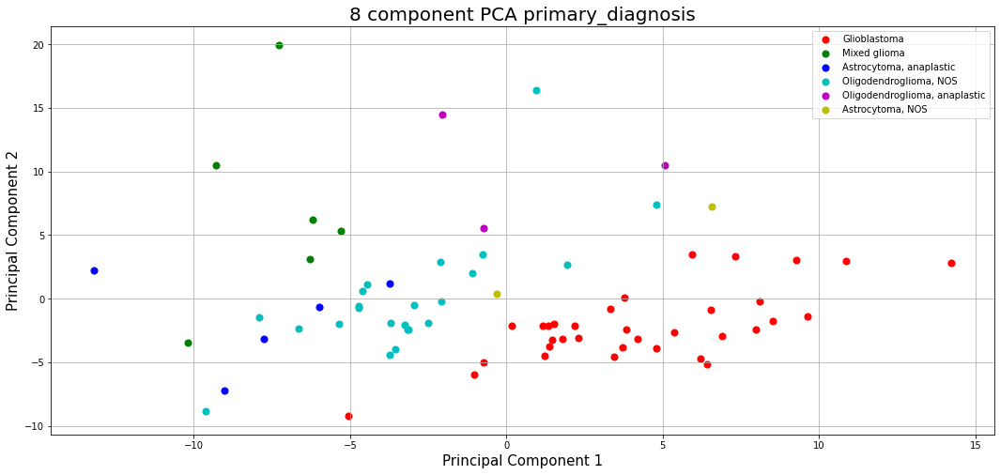

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 106411000' 'chr1 147234000' 'chr1 151768000' 'chr1 152472000'
 'chr1 174348000' 'chr1 176397000' 'chr1 189226000' 'chr1 202451000'
 'chr1 22159000' 'chr1 247031000' 'chr1 24801000' 'chr1 36243000'
 'chr1 45114000' 'chr1 48175000' 'chr1 6714000' 'chr10 100094000'
 'chr10 102035000' 'chr10 102300000' 'chr10 104785000' 'chr10 120214000'
 'chr10 12518000' 'chr10 12523000' 'chr10 130628000' 'chr10 133413000'
 'chr10 21838000' 'chr10 28934000' 'chr10 32499000' 'chr10 34977000'
 'chr10 43445000' 'chr10 45511000' 'chr10 50356000' 'chr10 59745000'
 'chr10 65409000' 'chr10 67690000' 'chr10 6992000' 'chr10 69993000'
 'chr10 70632000' 'chr10 70686000' 'chr10 75749000' 'chr10 78467000'
 'chr10 80535000' 'chr10 84346000' 'chr10 92976000' 'chr10 95808000'
 'chr11 3398000' 'chr11 65762000' 'chr11 77934000' 'chr11 92158000'
 'chr11 93946000' 'chr12 28200000' 'chr12 48915000' 'chr12 55480000'
 'chr12 56788000' 'chr13 21449000' 'chr13 51078000' 'chr13

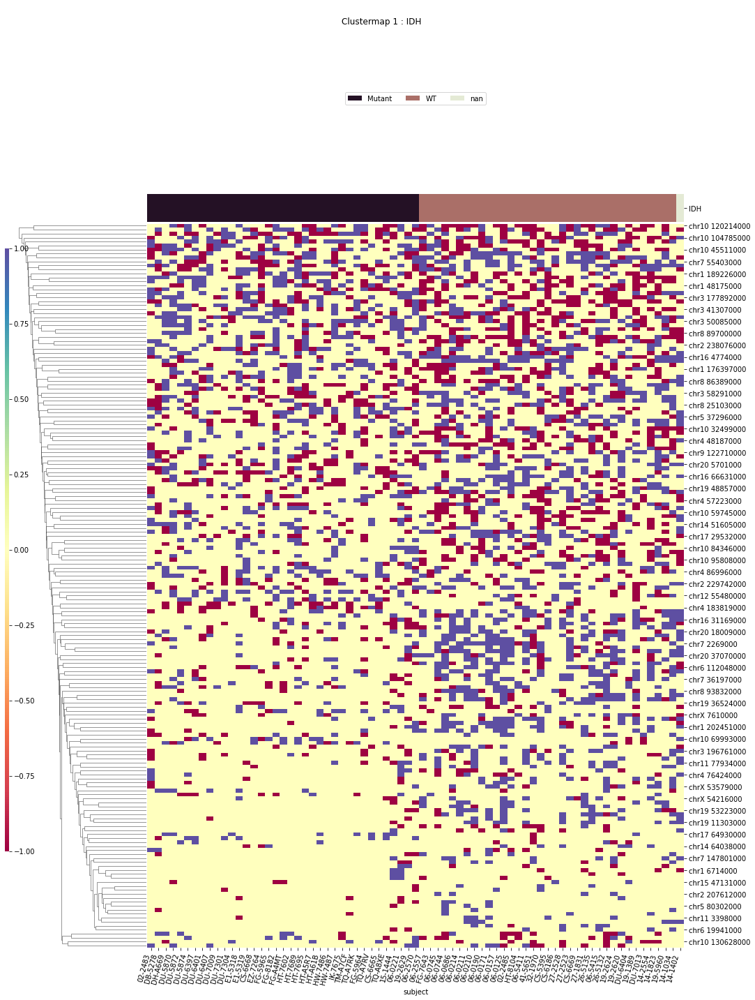

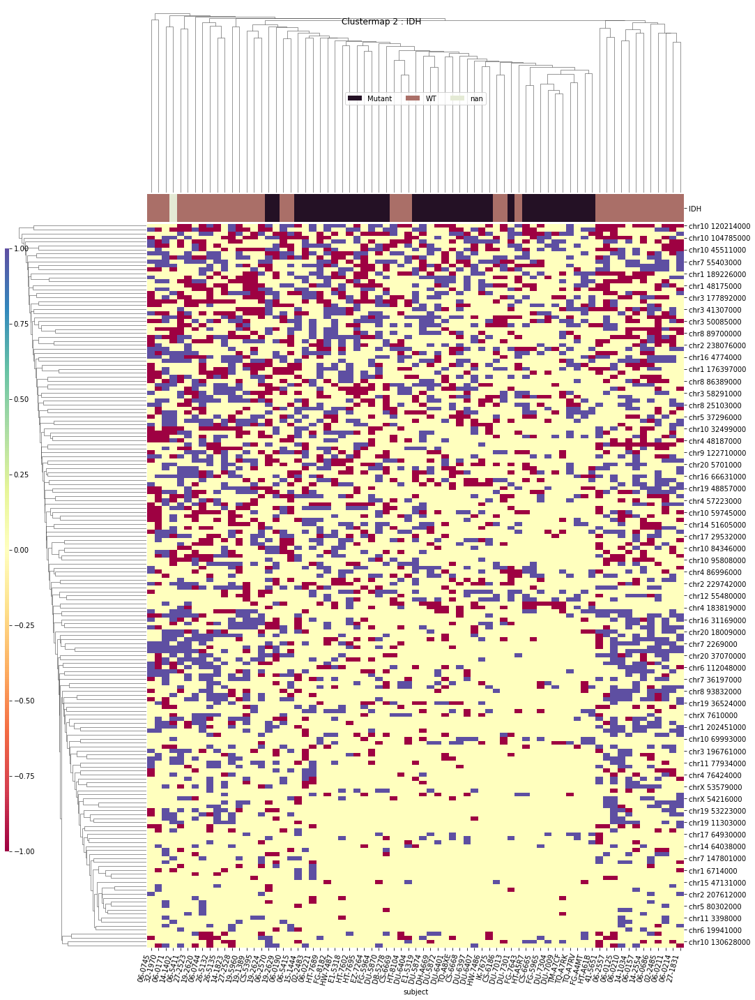

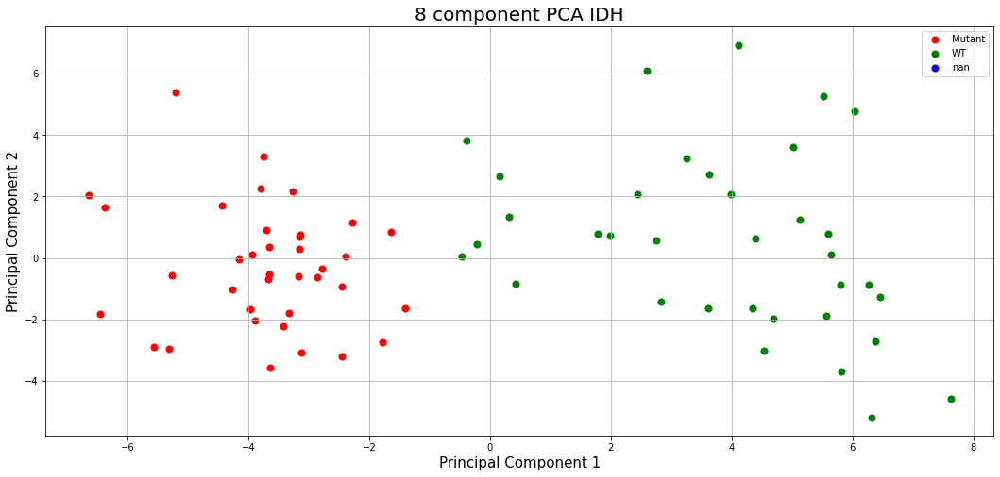

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 10427000' 'chr1 106411000' 'chr1 12009000' 'chr1 151652000'
 'chr1 152472000' 'chr1 161280000' 'chr1 161615000' 'chr1 170419000'
 'chr1 203841000' 'chr1 21052000' 'chr1 22159000' 'chr1 247031000'
 'chr1 25208000' 'chr1 27829000' 'chr1 34083000' 'chr1 34967000'
 'chr1 37895000' 'chr1 39869000' 'chr1 40572000' 'chr1 44875000'
 'chr1 45107000' 'chr1 45498000' 'chr1 46321000' 'chr1 51712000'
 'chr1 6306000' 'chr1 64202000' 'chr1 65140000' 'chr1 6716000'
 'chr1 71379000' 'chr1 76111000' 'chr1 7952000' 'chr1 92025000'
 'chr1 96761000' 'chr10 120214000' 'chr10 28934000' 'chr10 45330000'
 'chr10 45511000' 'chr10 59745000' 'chr10 67692000' 'chr10 69992000'
 'chr10 84348000' 'chr10 92976000' 'chr10 99892000'
 'chr10_GL383546v1_alt 175000' 'chr11 107911000' 'chr11 116346000'
 'chr11 116348000' 'chr11 47039000' 'chr11 5935000' 'chr11 61167000'
 'chr11 67477000' 'chr11 68862000' 'chr11 70294000' 'chr11 70296000'
 'chr12 63687000' 'chr13 46163000' '

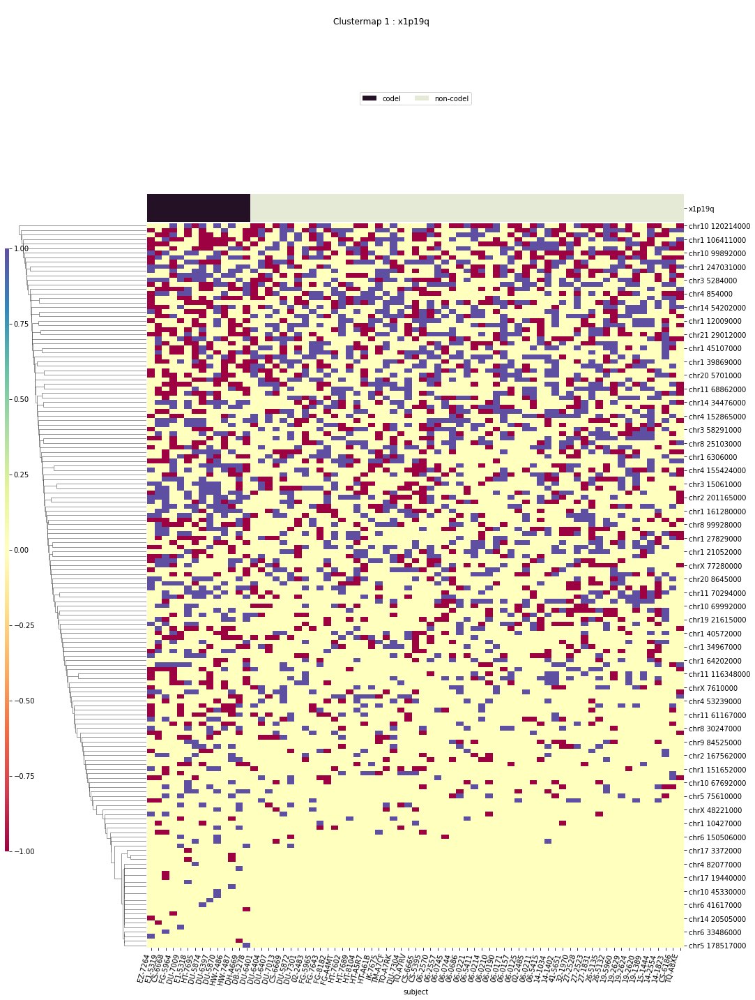

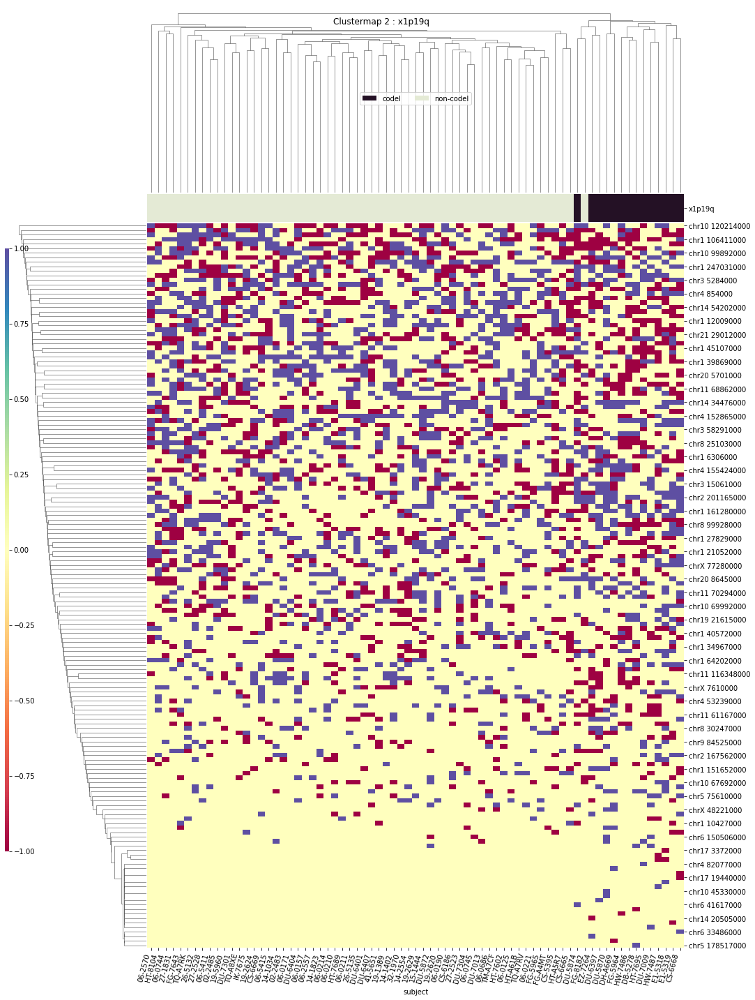

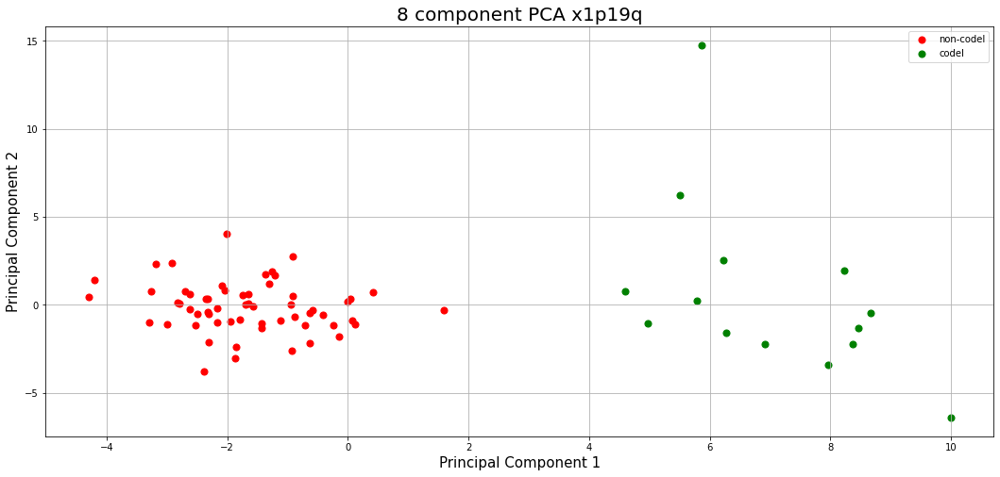

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 151652000' 'chr1 167771000' 'chr1 183427000'
 'chr1 220465000' 'chr1 24801000' 'chr1 248676000' 'chr1 36243000'
 'chr1 51712000' 'chr1 6714000' 'chr10 102035000' 'chr10 12523000'
 'chr10 125519000' 'chr10 130628000' 'chr10 21838000' 'chr10 32499000'
 'chr10 34977000' 'chr10 43244000' 'chr10 6205000' 'chr10 67690000'
 'chr10 70632000' 'chr10 75749000' 'chr10 78467000' 'chr10 95808000'
 'chr11 124404000' 'chr11 33987000' 'chr11 65762000' 'chr11 8524000'
 'chr11 92158000' 'chr12 108655000' 'chr12 111722000' 'chr12 119361000'
 'chr12 24673000' 'chr12 27874000' 'chr12 28200000' 'chr12 56965000'
 'chr13 25513000' 'chr13 35967000' 'chr13 95689000' 'chr14 41675000'
 'chr14 89505000' 'chr15 49549000' 'chr15 75482000' 'chr15 82999000'
 'chr16 49211000' 'chr16 70052000' 'chr16 89806000' 'chr17 16146000'
 'chr17 20986000' 'chr17 30522000' 'chr17 39333000' 'chr17 64930000'
 'chr17 67471000' 'chr17 80538000' 'chr18 6828000' 'chr19 11303000'
 'c

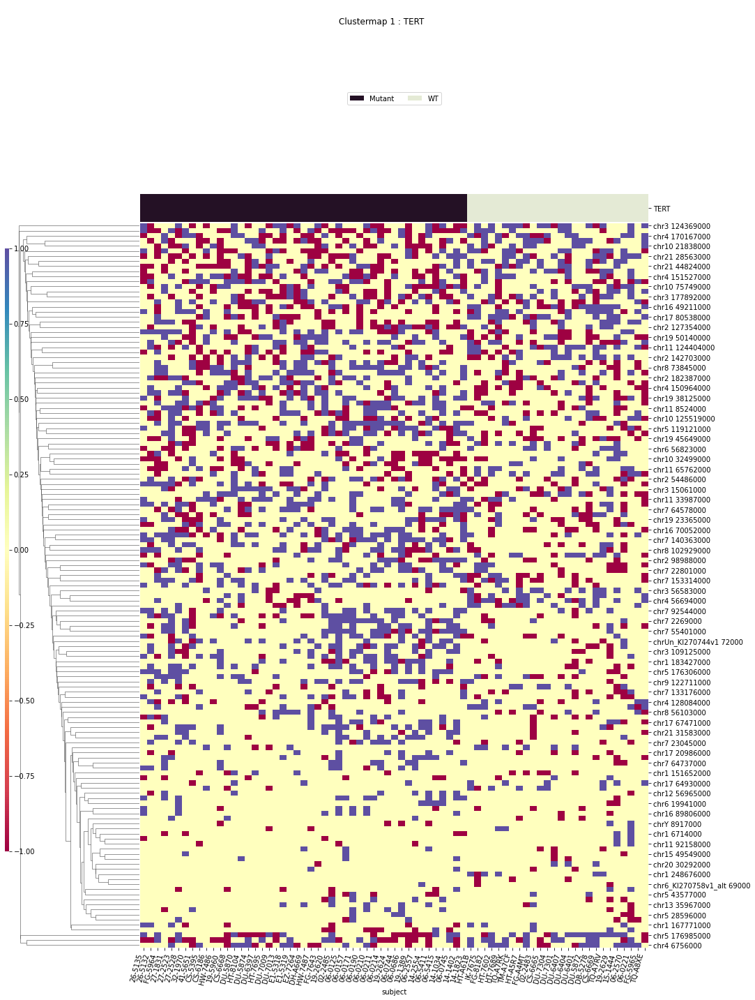

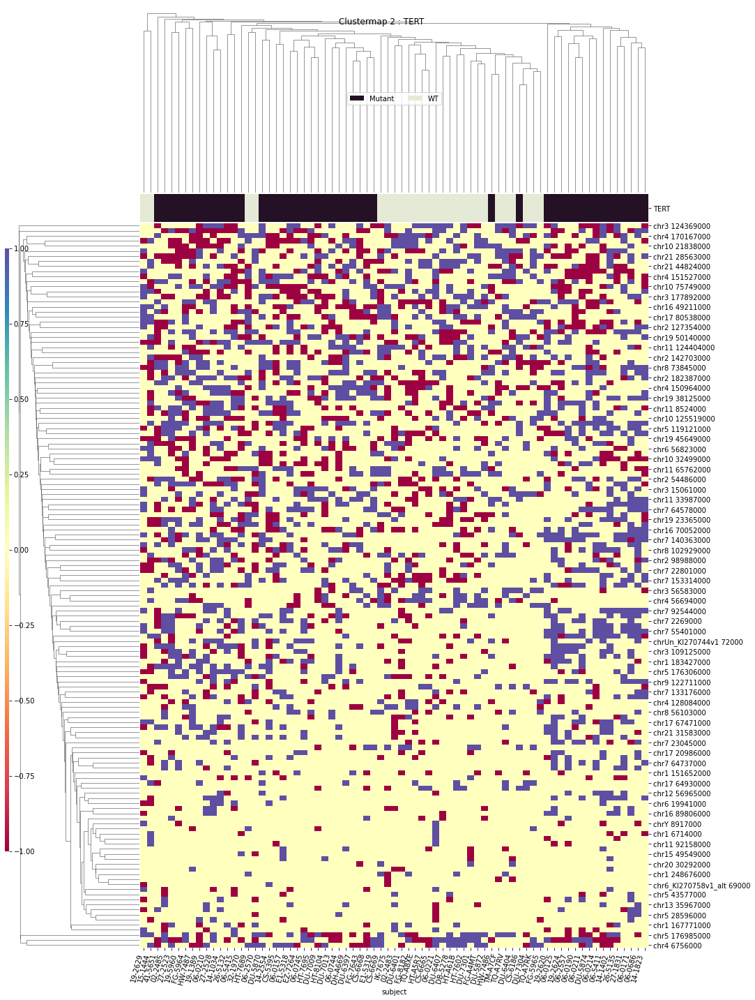

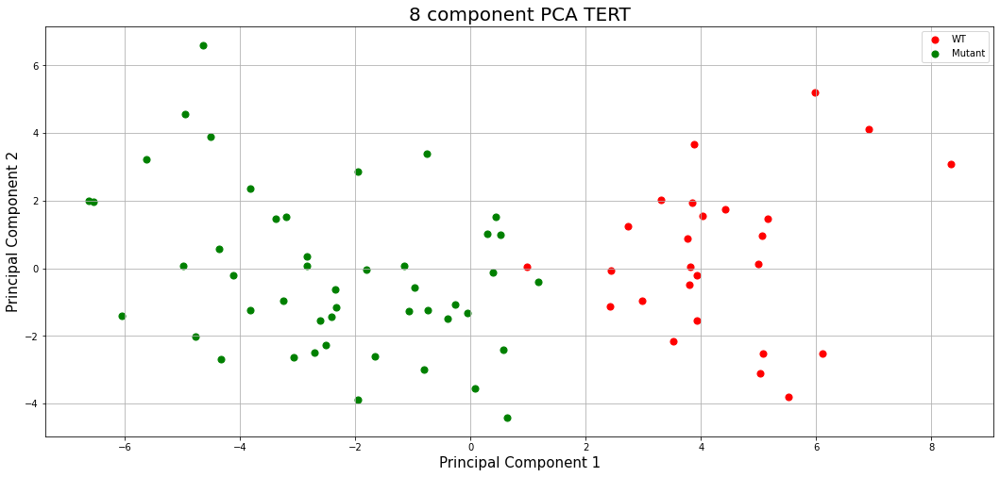

disease_type
T-Testing
Boxplotting
Clustermapping
['chr1 112641000' 'chr1 114803000' 'chr1 147232000' 'chr1 152195000'
 'chr1 152472000' 'chr1 154286000' 'chr1 160936000' 'chr1 176397000'
 'chr1 182508000' 'chr1 197405000' 'chr1 202451000' 'chr1 21389000'
 'chr1 22159000' 'chr1 226114000' 'chr1 31175000' 'chr1 31177000'
 'chr1 39912000' 'chr1 42751000' 'chr1 43502000' 'chr1 45081000'
 'chr1 45498000' 'chr1 45765000' 'chr1 54561000' 'chr1 6304000'
 'chr1 64202000' 'chr1 7952000' 'chr1 86898000' 'chr1 96763000'
 'chr1 98513000' 'chr1 99824000' 'chr10 102300000' 'chr10 102301000'
 'chr10 107801000' 'chr10 119558000' 'chr10 130628000' 'chr10 21838000'
 'chr10 28934000' 'chr10 43445000' 'chr10 43544000' 'chr10 59745000'
 'chr10 65409000' 'chr10 67690000' 'chr10 67692000' 'chr10 6824000'
 'chr10 6992000' 'chr10 70632000' 'chr10 71875000' 'chr10 71876000'
 'chr10 86032000' 'chr10 92976000' 'chr10 95808000' 'chr10 99892000'
 'chr10_GL383546v1_alt 175000' 'chr11 116348000' 'chr11 4136000'
 'chr

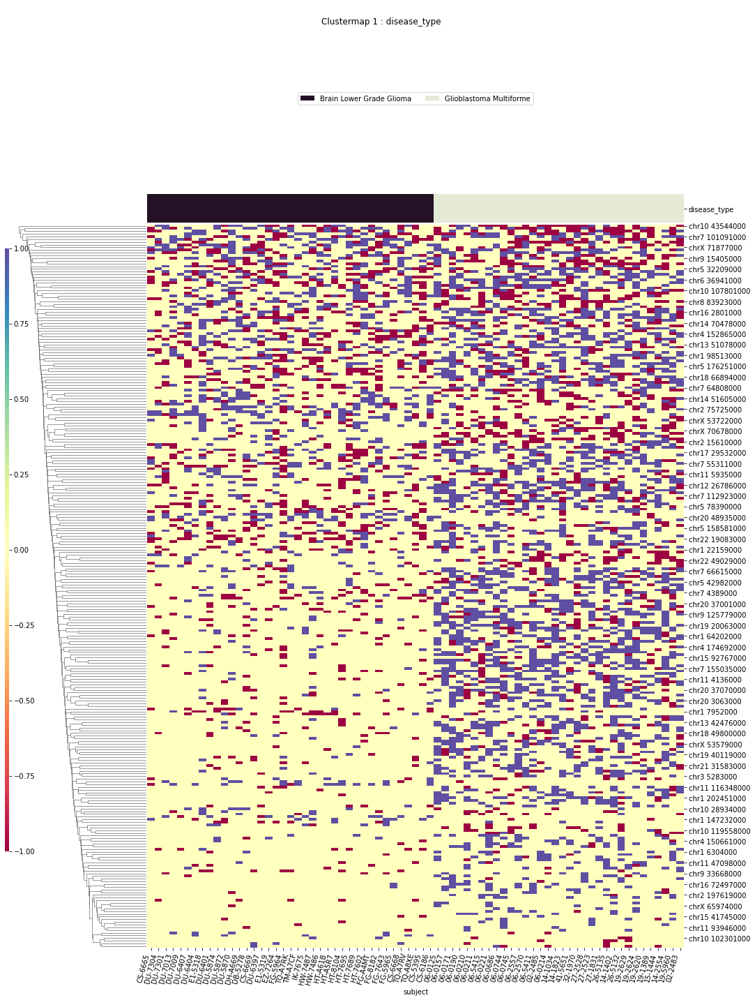

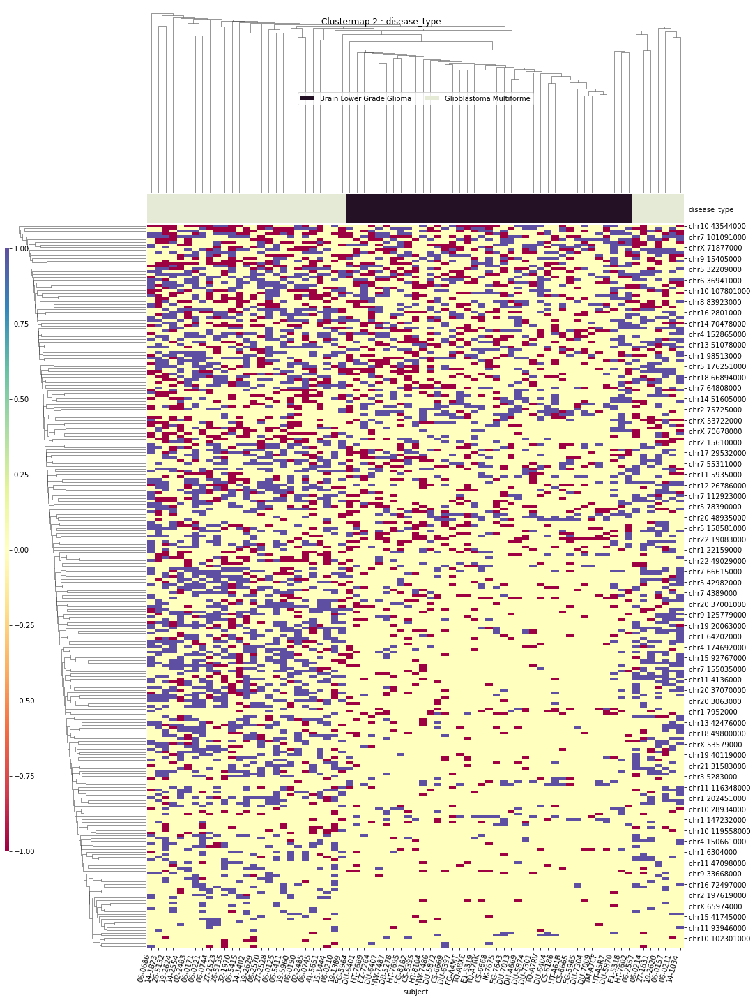

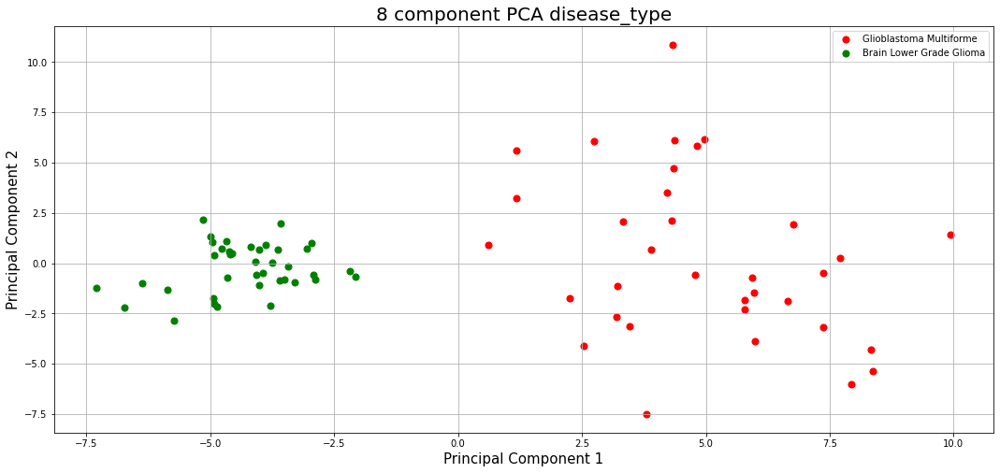

IDH_1p19q_status
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
 p : 3.162116247445878e-06  ( t : 5.1773909426013685 ) :  chr17 16146000


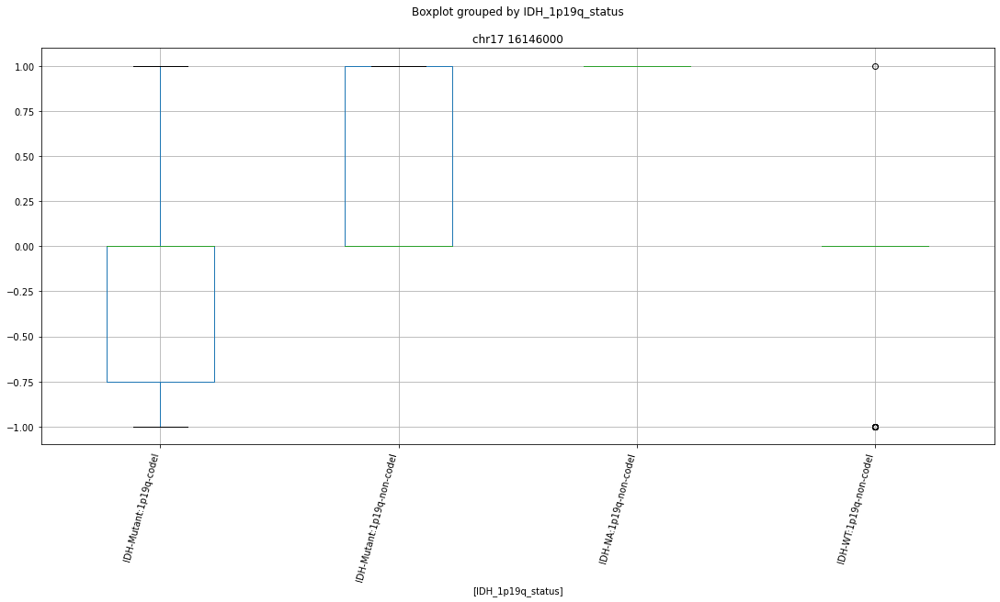

Clustermapping
['IDH_1p19q_status' 'chr1 106411000' 'chr1 12009000' 'chr1 147234000'
 'chr1 151652000' 'chr1 151768000' 'chr1 152144000' 'chr1 152472000'
 'chr1 161280000' 'chr1 161615000' 'chr1 167771000' 'chr1 170419000'
 'chr1 176058000' 'chr1 183427000' 'chr1 189226000' 'chr1 21052000'
 'chr1 211198000' 'chr1 220465000' 'chr1 22159000' 'chr1 247031000'
 'chr1 24801000' 'chr1 248911000' 'chr1 27829000' 'chr1 34083000'
 'chr1 34967000' 'chr1 36243000' 'chr1 37895000' 'chr1 40572000'
 'chr1 44875000' 'chr1 45107000' 'chr1 45498000' 'chr1 46321000'
 'chr1 48175000' 'chr1 51712000' 'chr1 52181000' 'chr1 6306000'
 'chr1 64202000' 'chr1 65140000' 'chr1 6714000' 'chr1 6716000'
 'chr1 71379000' 'chr1 76111000' 'chr1 7952000' 'chr1 96761000'
 'chr10 100094000' 'chr10 102035000' 'chr10 104785000' 'chr10 120214000'
 'chr10 12523000' 'chr10 130628000' 'chr10 133413000' 'chr10 21838000'
 'chr10 28934000' 'chr10 31978000' 'chr10 32499000' 'chr10 34977000'
 'chr10 42901000' 'chr10 45511000' 'chr10

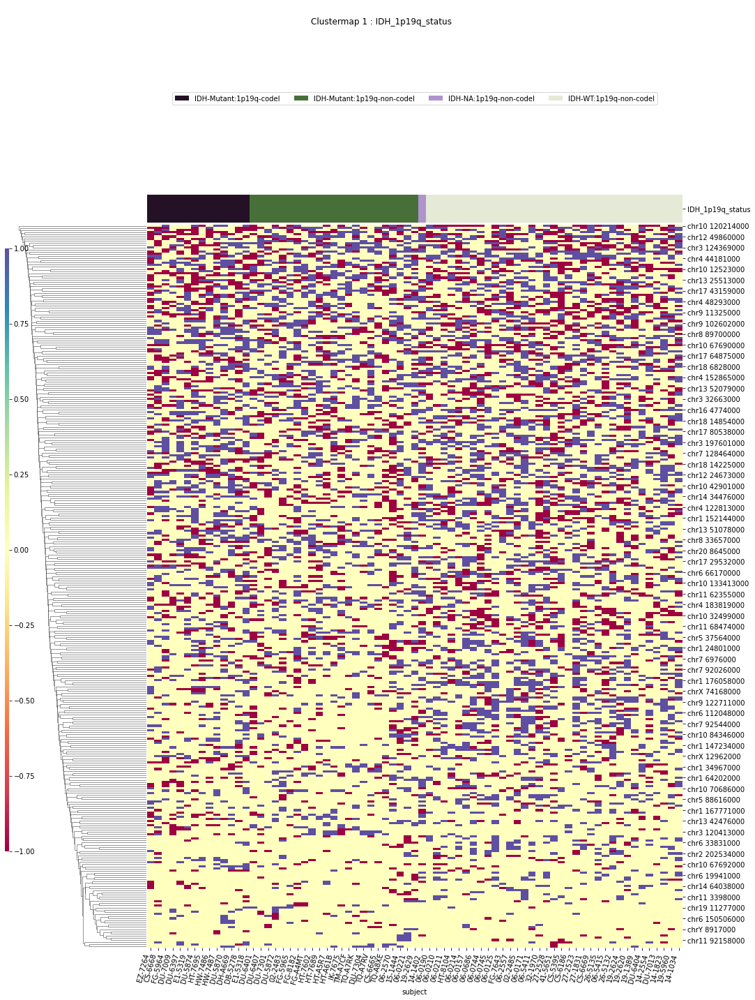

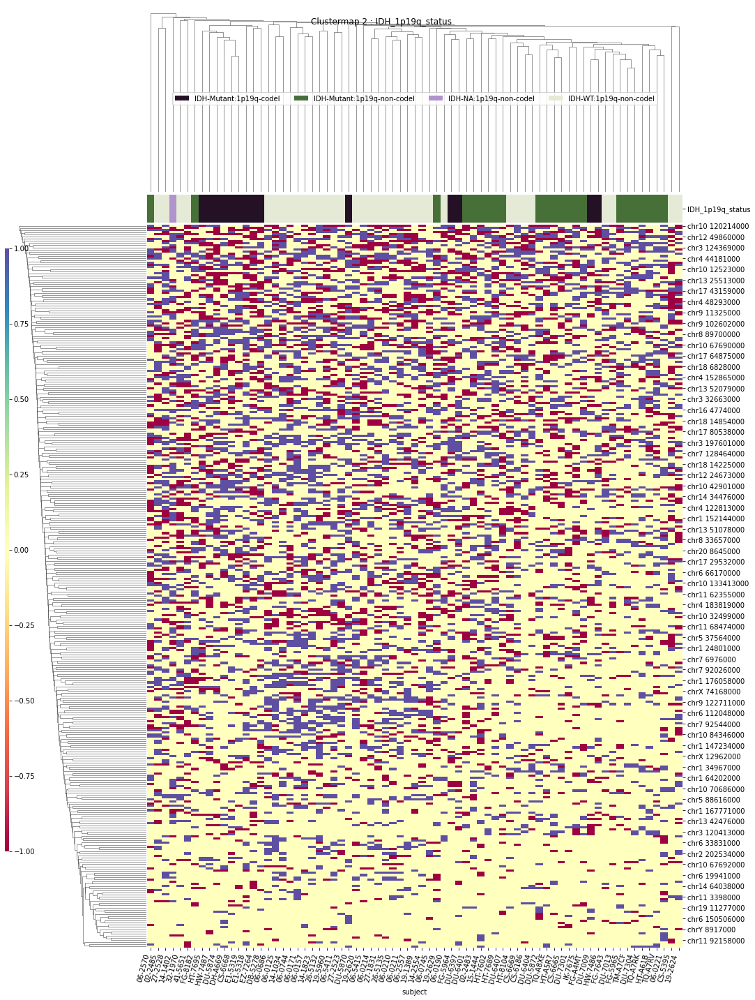

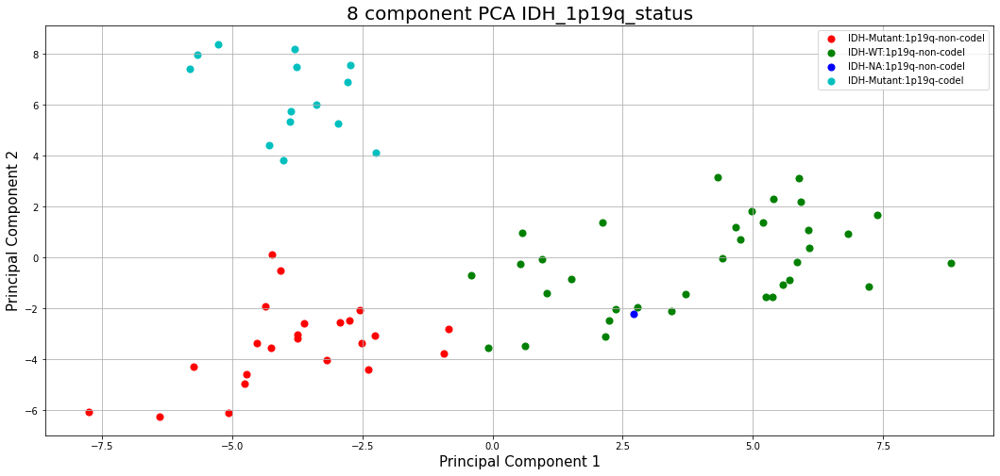

WHO_groups
T-Testing
Boxplotting
 p : 2.9666833044073793e-10  ( t : 9.349640132610398 ) :  chr8 43688000


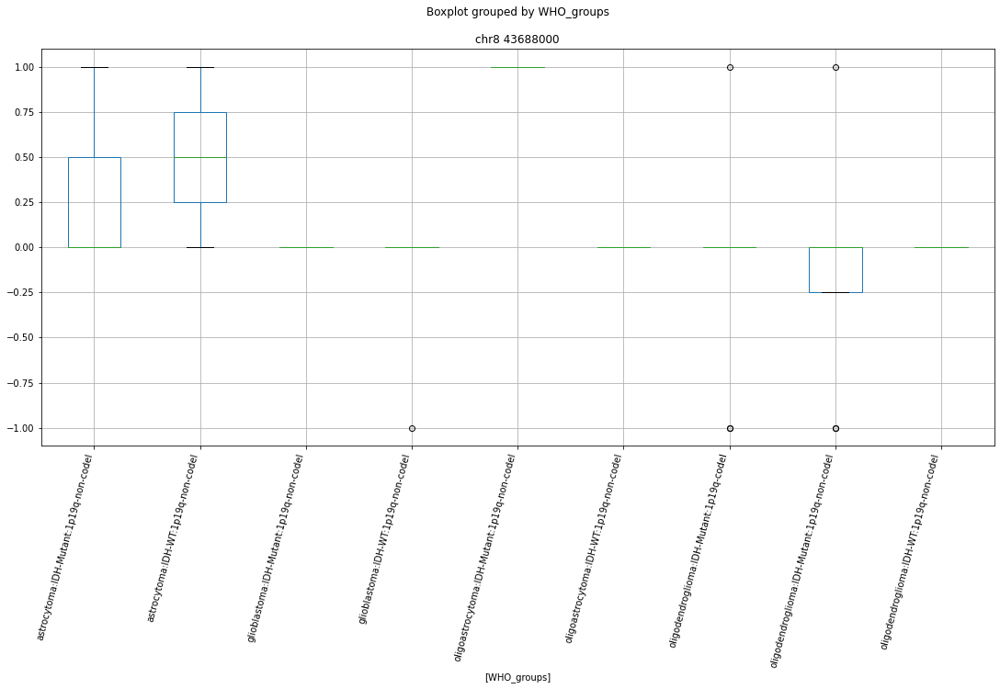

 p : 1.3906946637904217e-09  ( t : 8.704837364844163 ) :  chr19 10478000


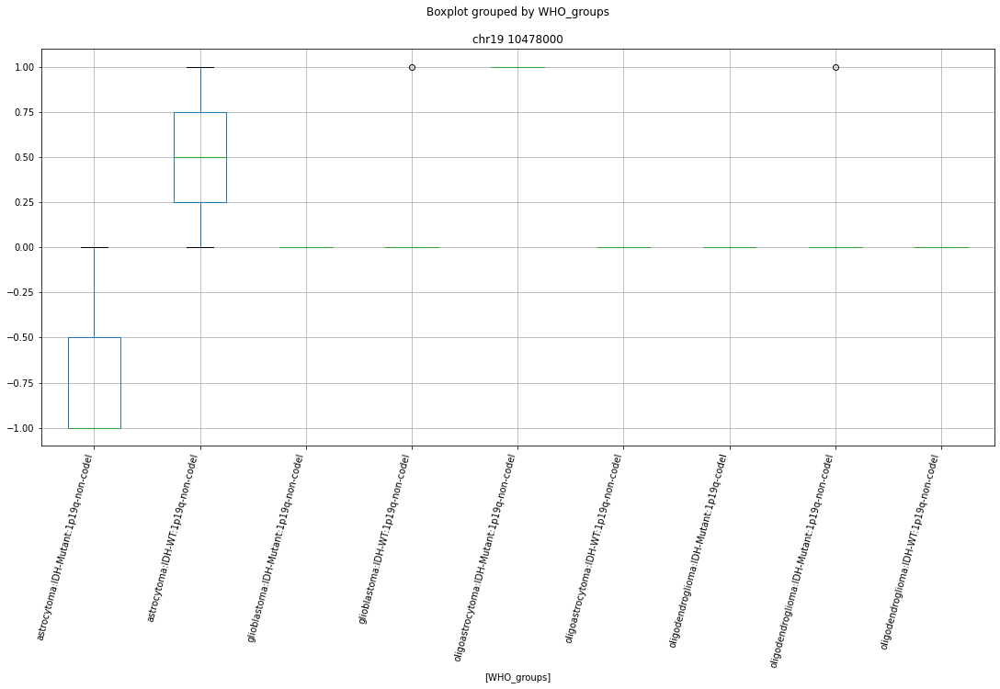

 p : 2.6316857449143274e-08  ( t : 7.625169498217283 ) :  chr1 76113000


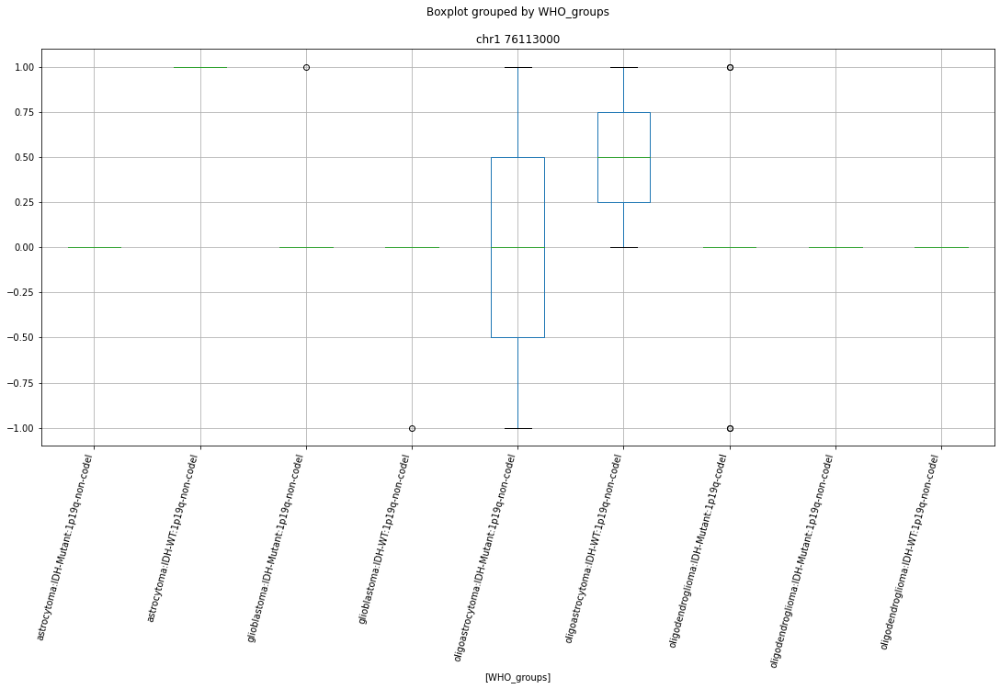

 p : 2.6316857449143274e-08  ( t : 7.625169498217283 ) :  chr2 187555000


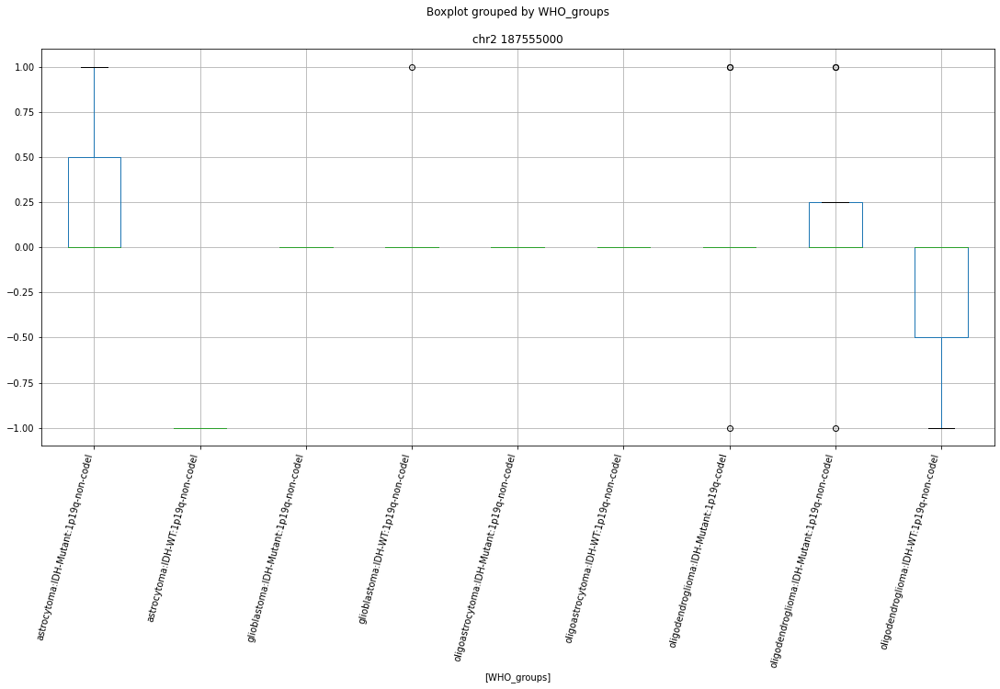

 p : 2.6316857449143274e-08  ( t : 7.625169498217283 ) :  chr17 77775000


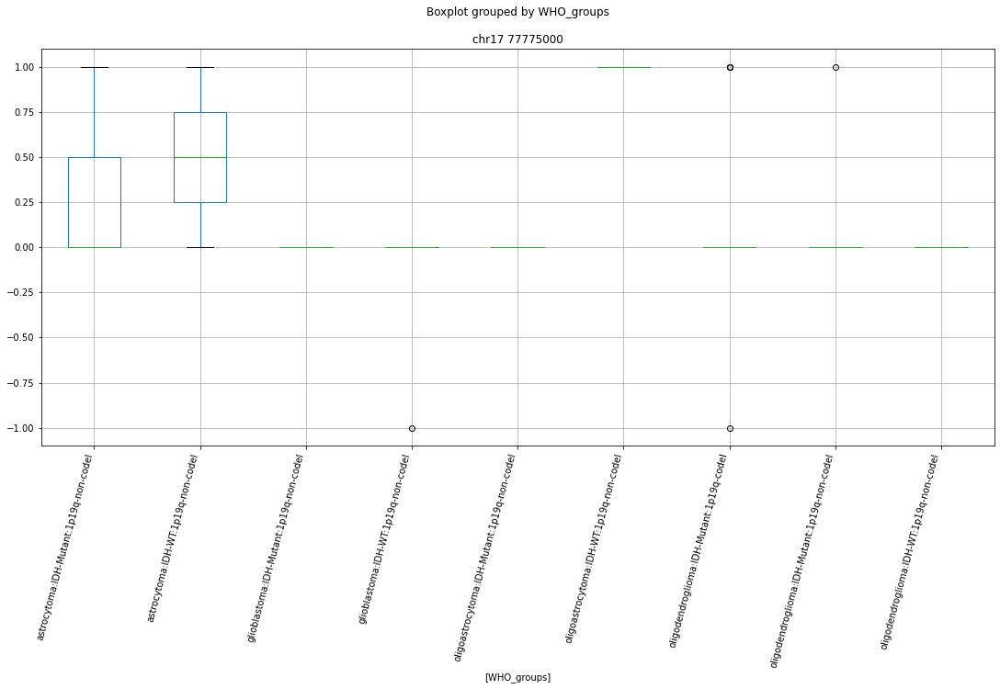

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr3 120413000


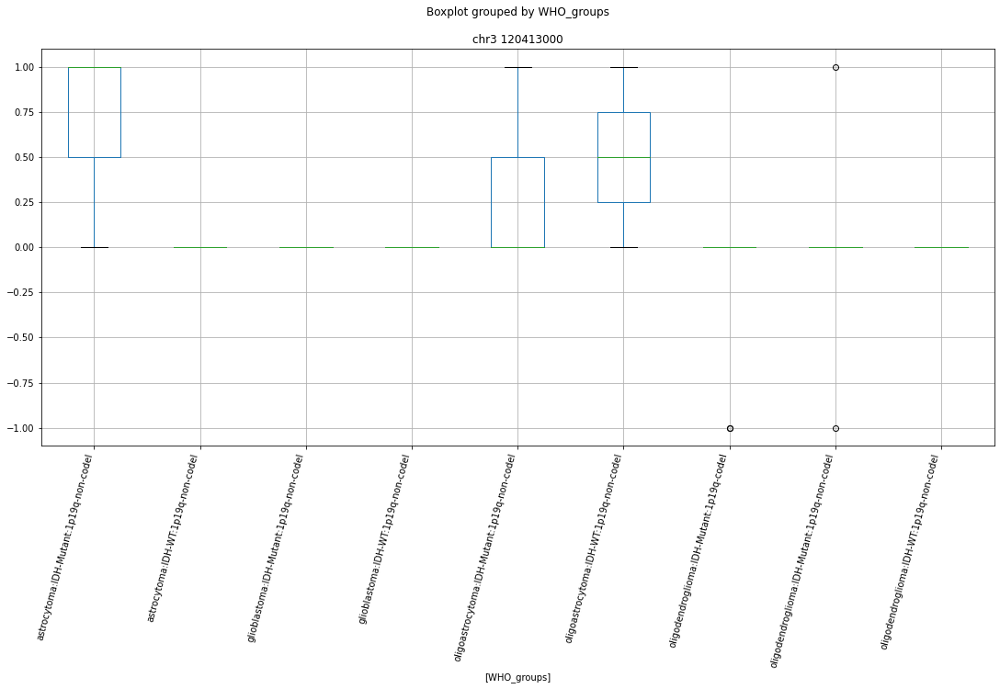

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr2 134063000


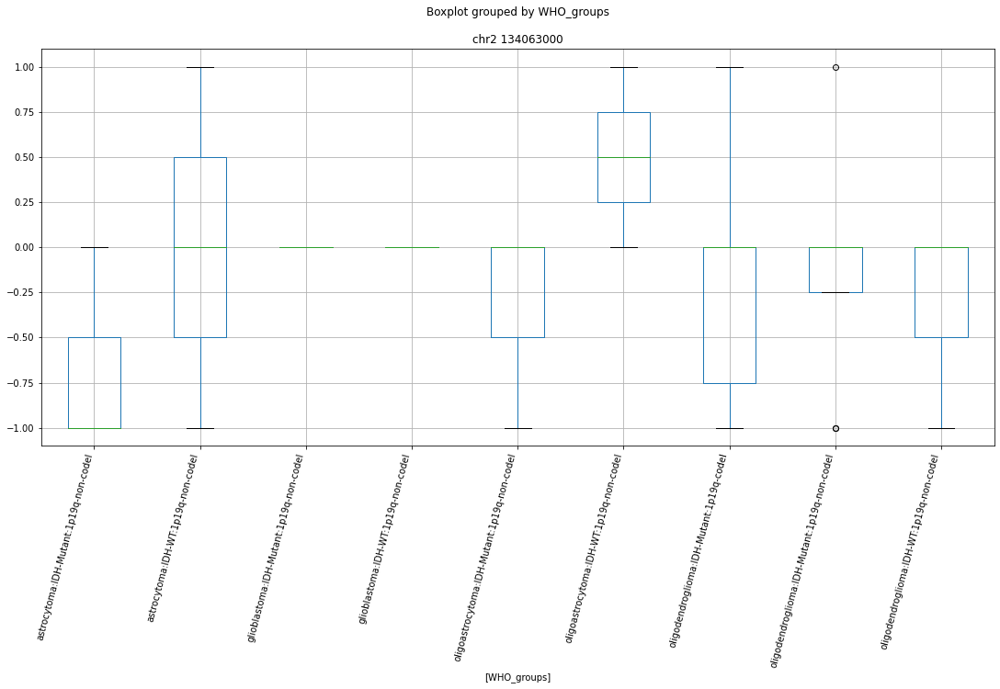

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chrX 42286000


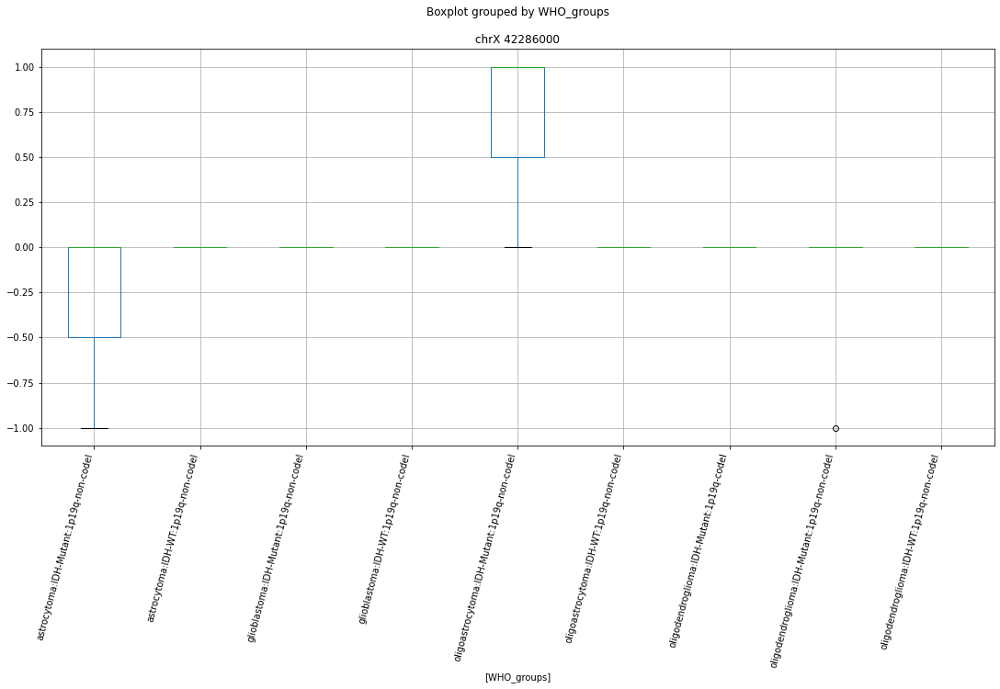

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr8 34530000


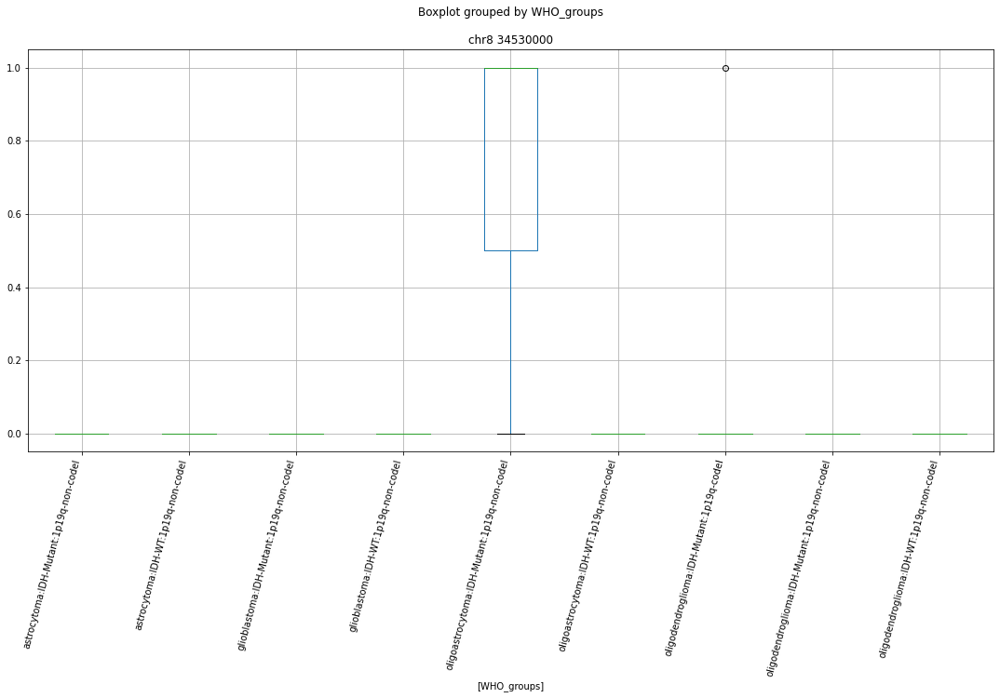

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chrX 149420000


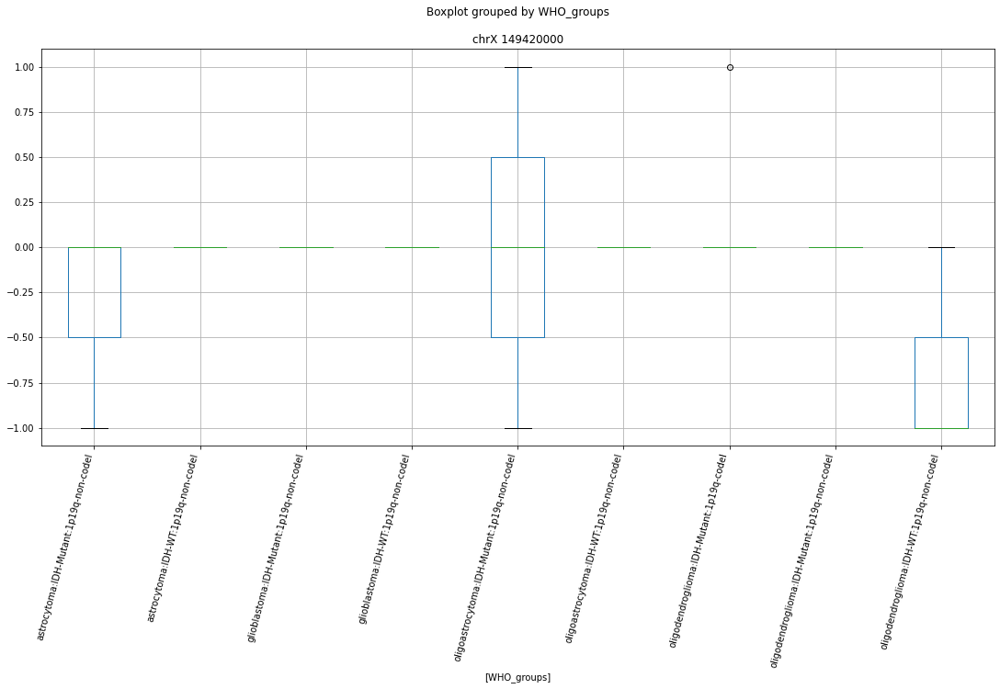

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr1 237670000


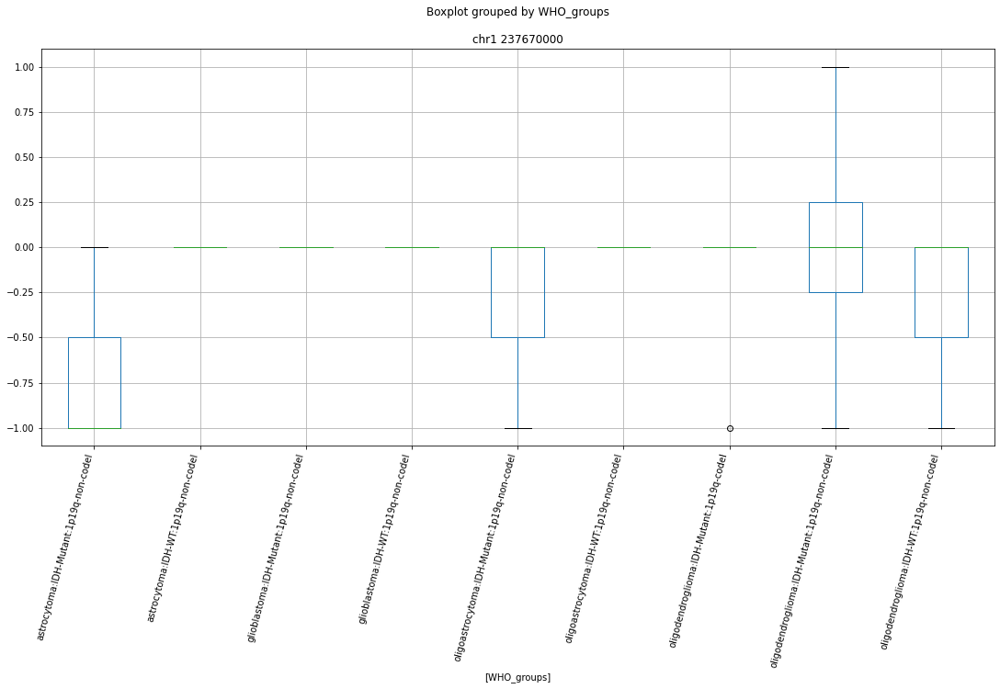

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr10 87079000


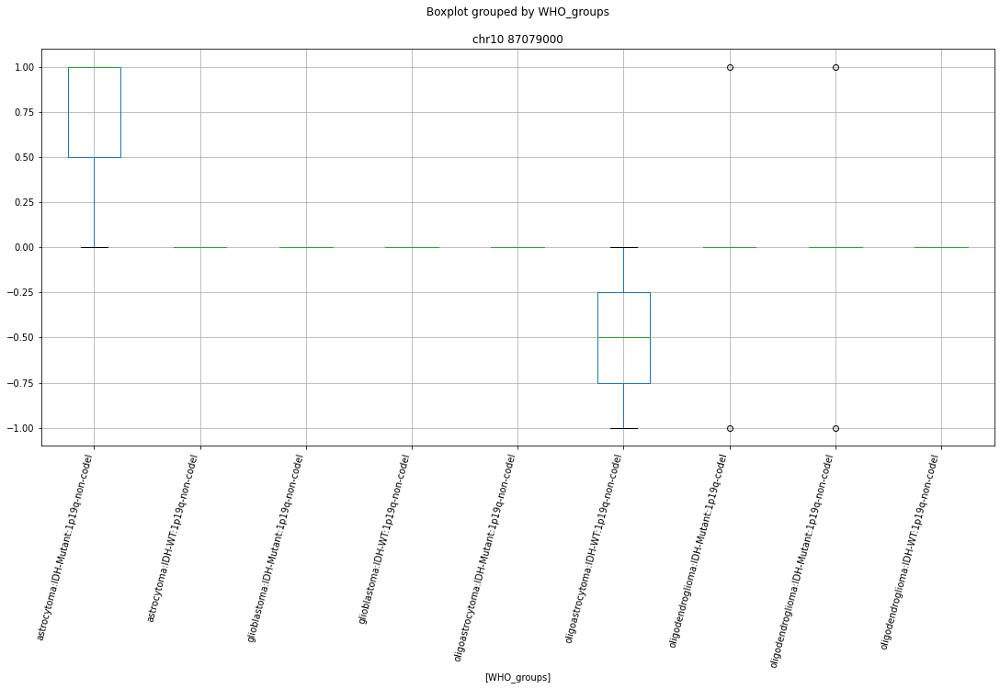

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr5 132983000


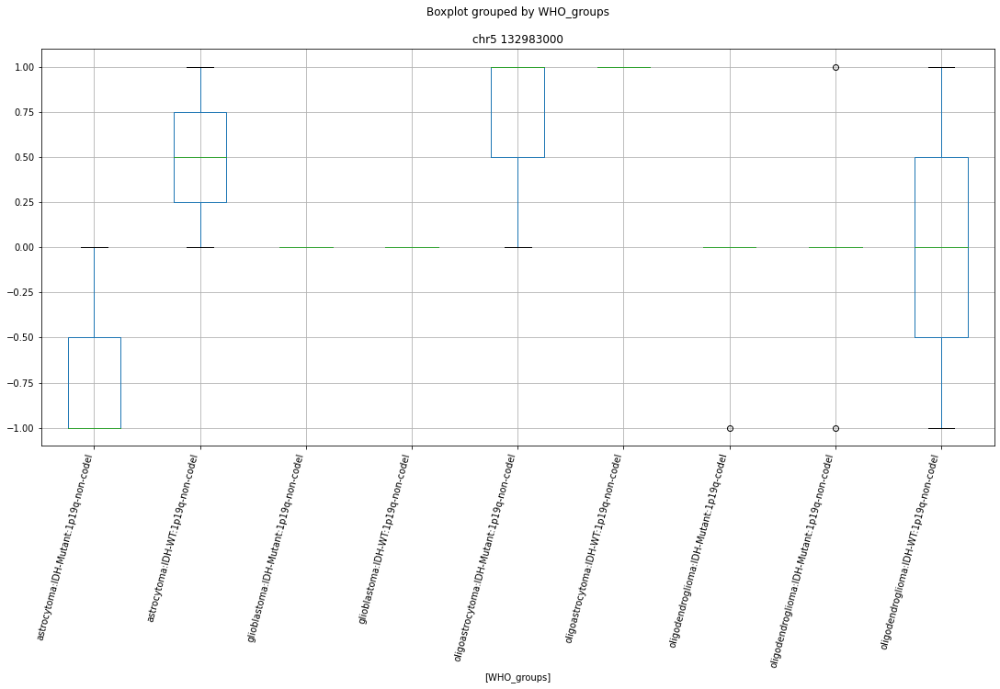

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chrX 48221000


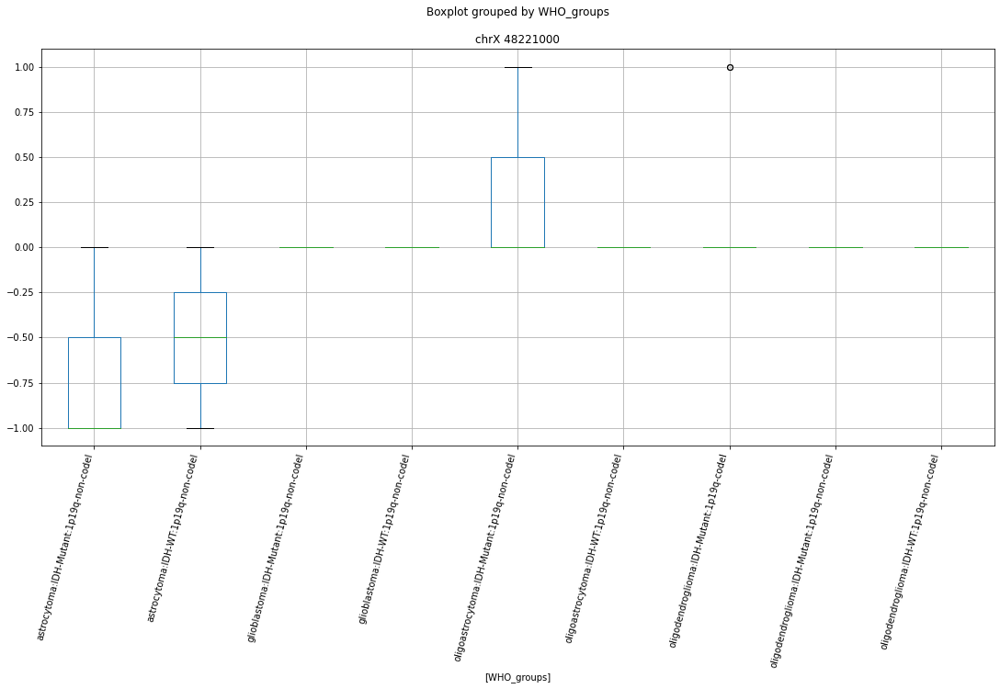

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr7 88267000


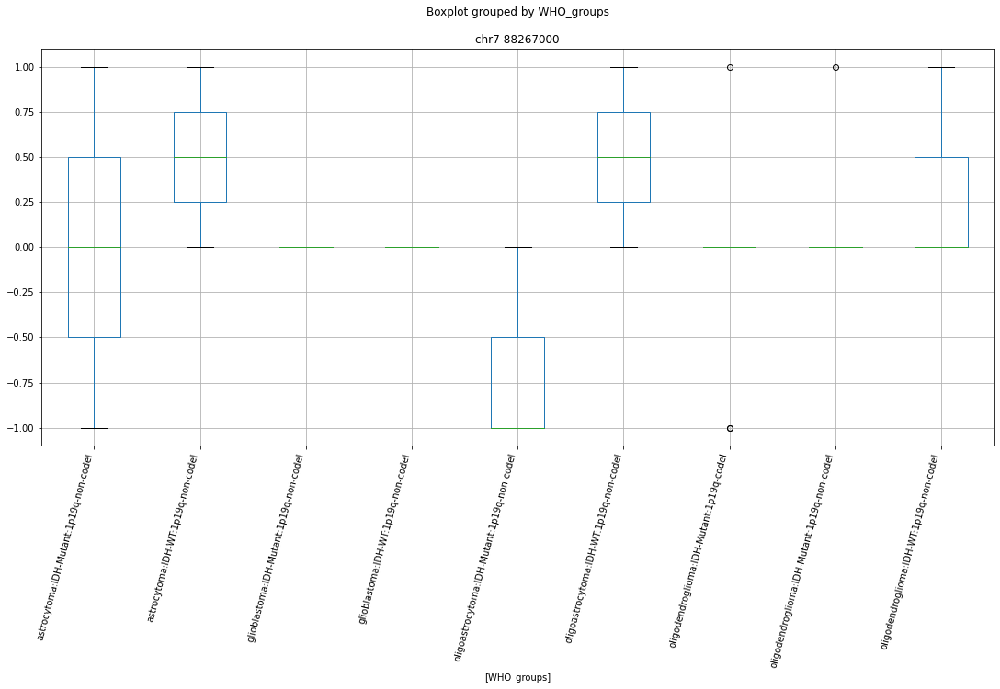

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr16 70225000


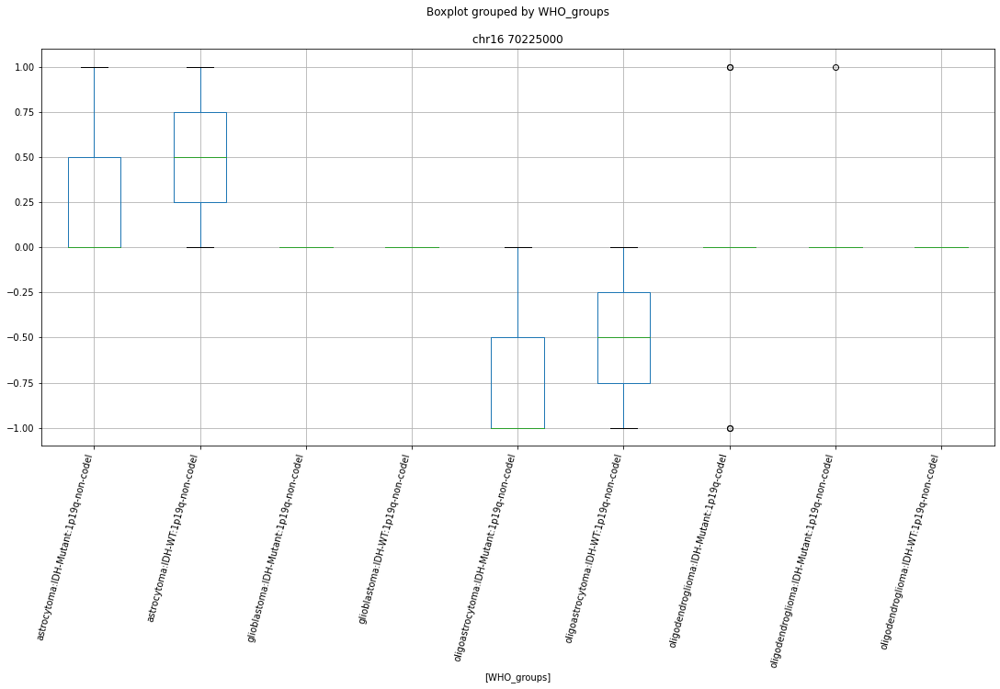

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr20 30292000


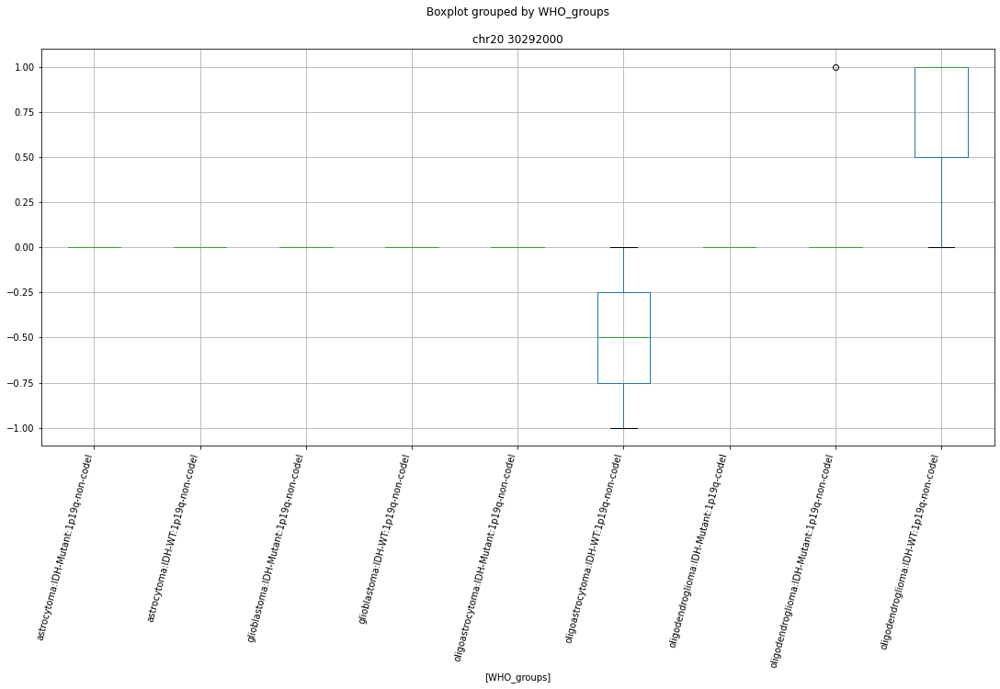

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr2 38756000


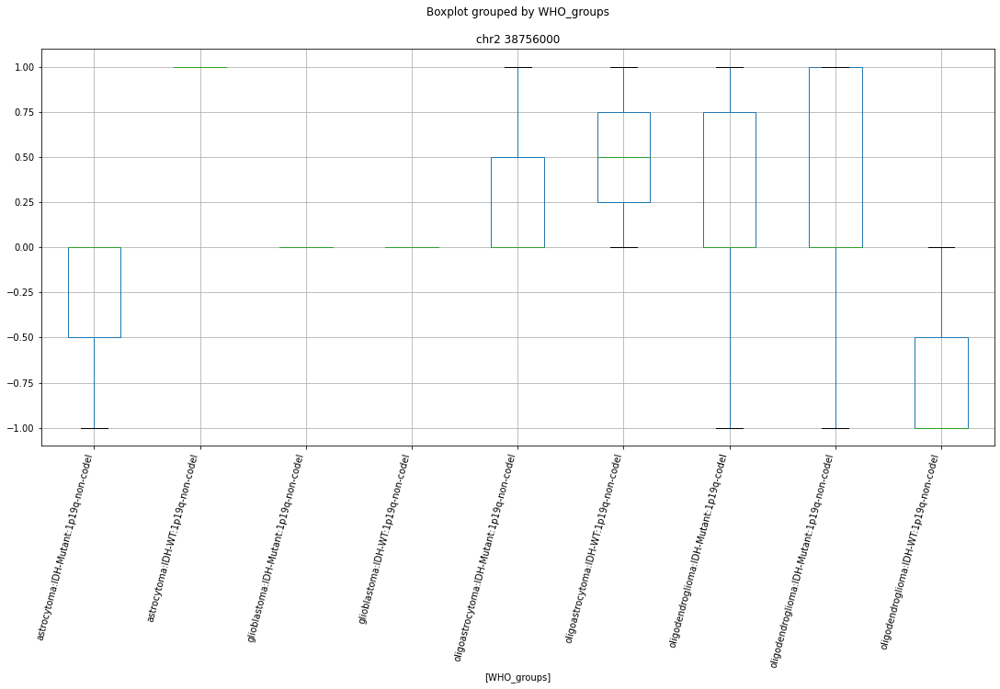

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr13 109310000


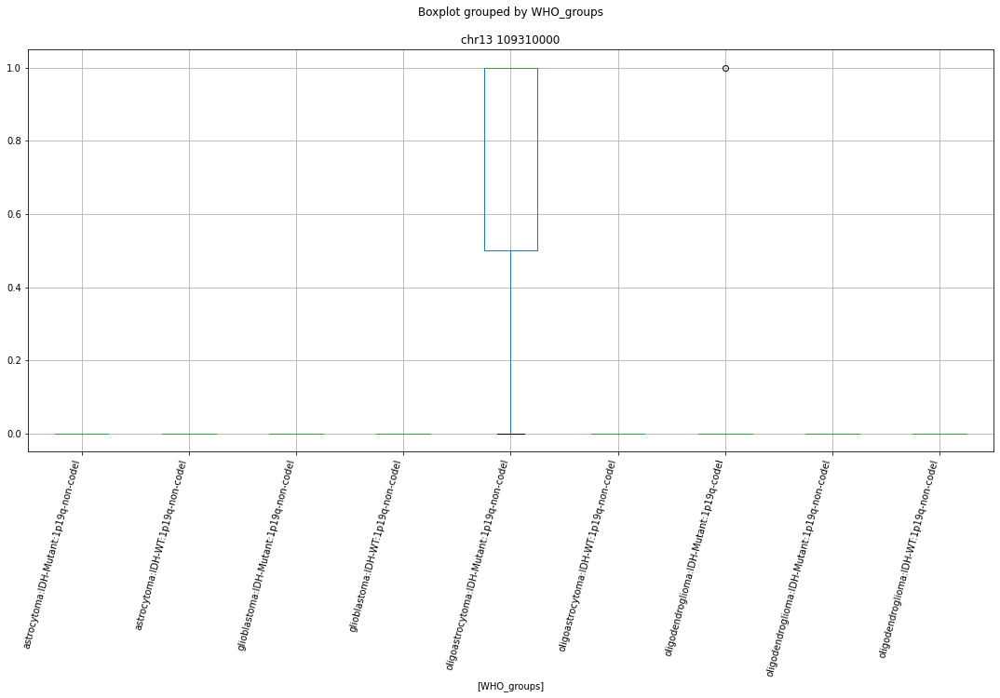

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr7 111609000


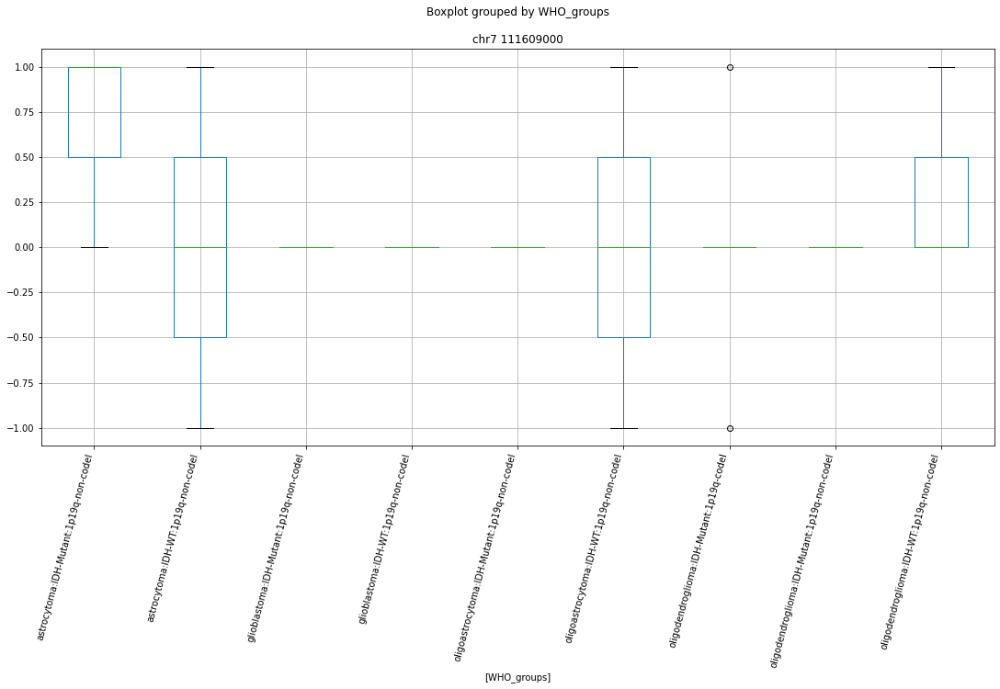

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr12 43684000


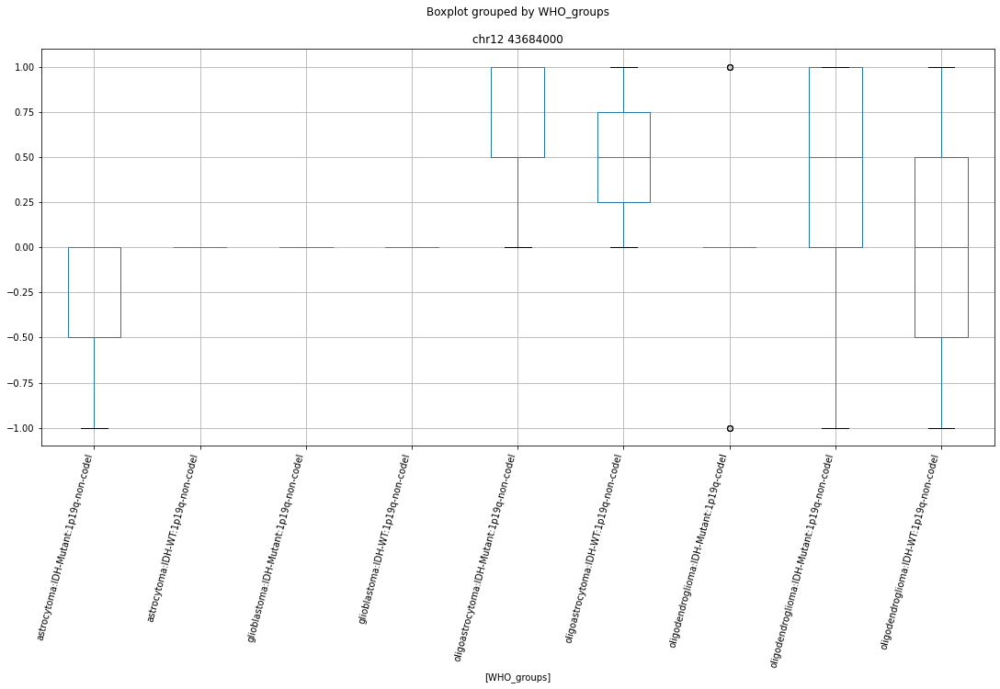

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chrX 53503000


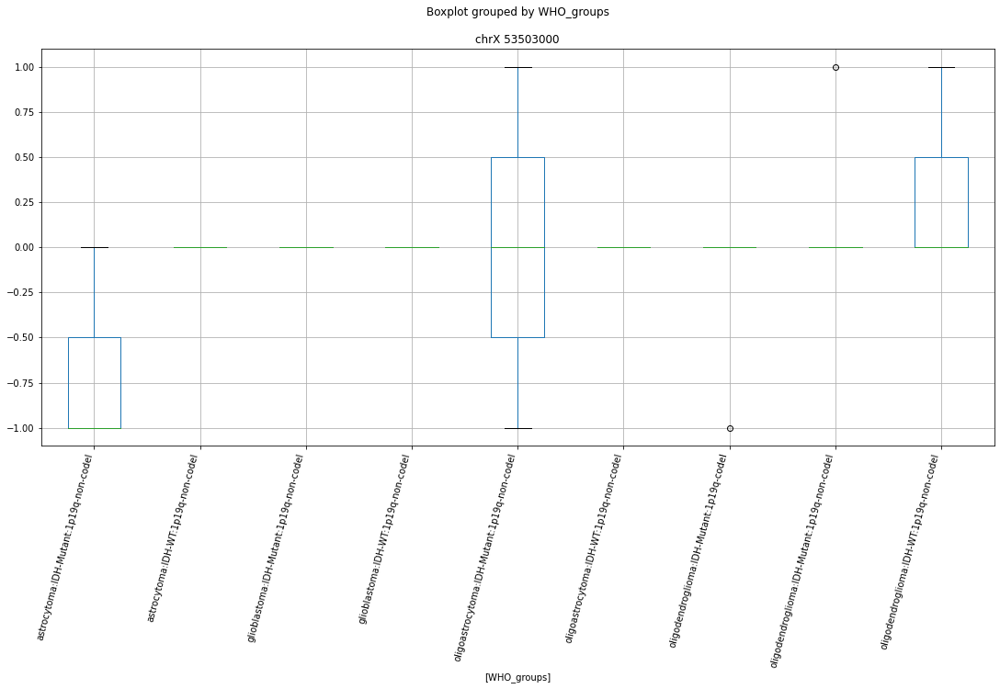

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr17 19475000


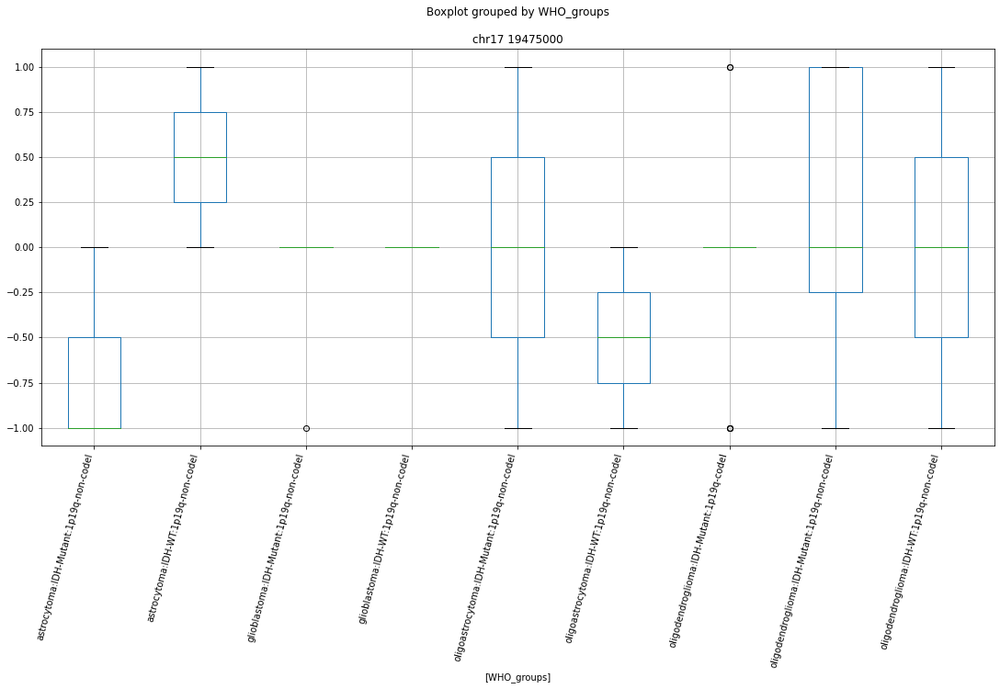

 p : 5.7137637292686887e-08  ( t : 7.237893117074439 ) :  chr1 199905000


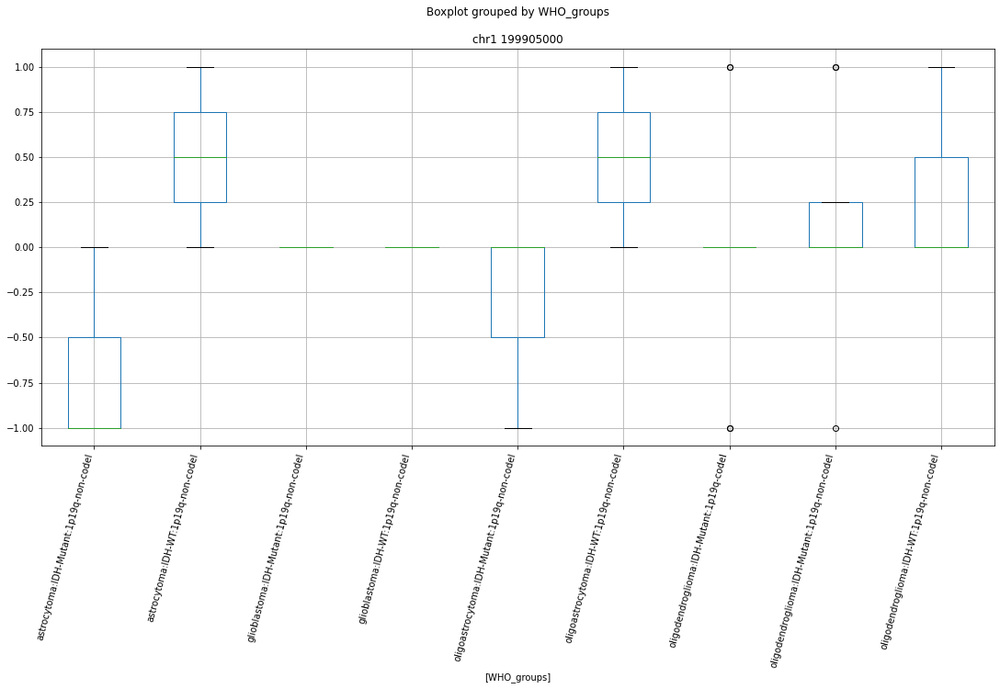

 p : 1.0057539453153324e-07  ( t : 7.099295739719539 ) :  chr11 83317000


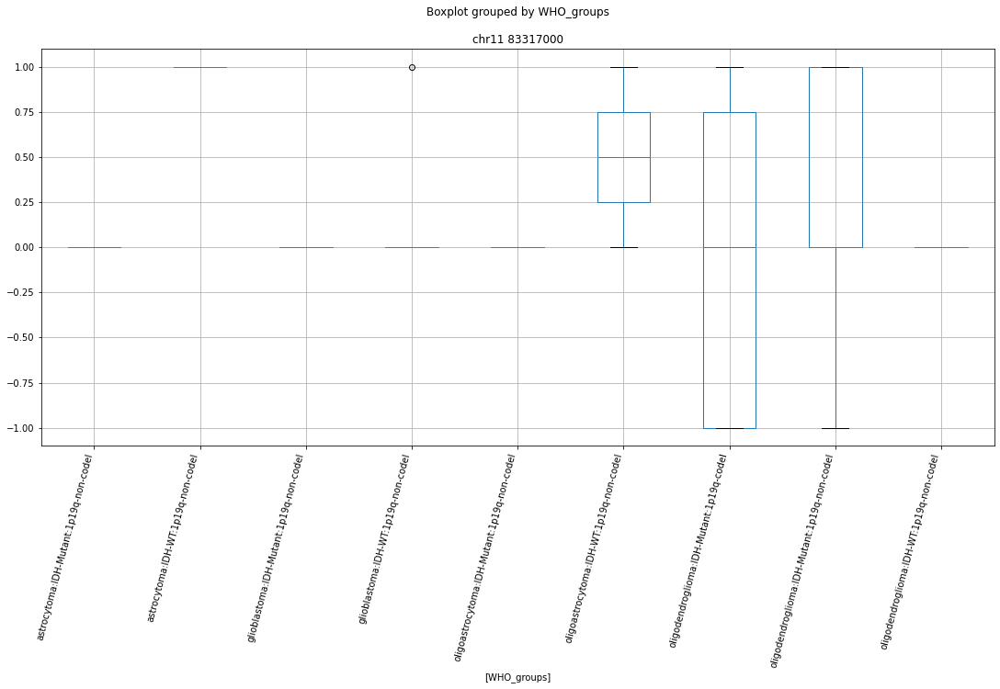

 p : 1.0057539453153324e-07  ( t : 7.099295739719539 ) :  chr11 31972000


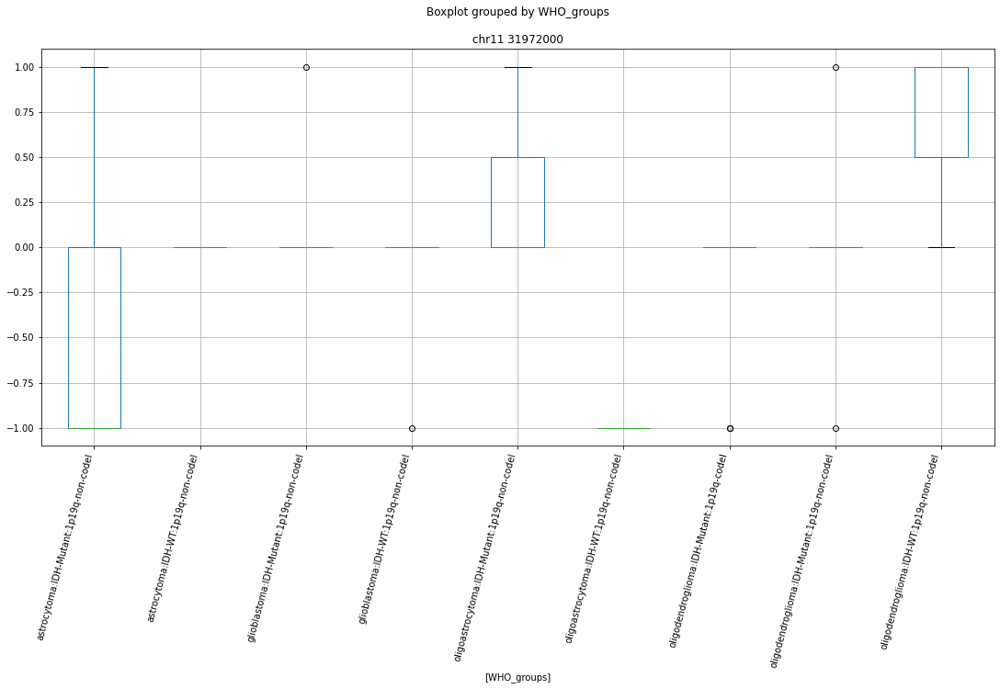

 p : 1.160346940259741e-07  ( t : 6.969447682030179 ) :  chr1 147232000


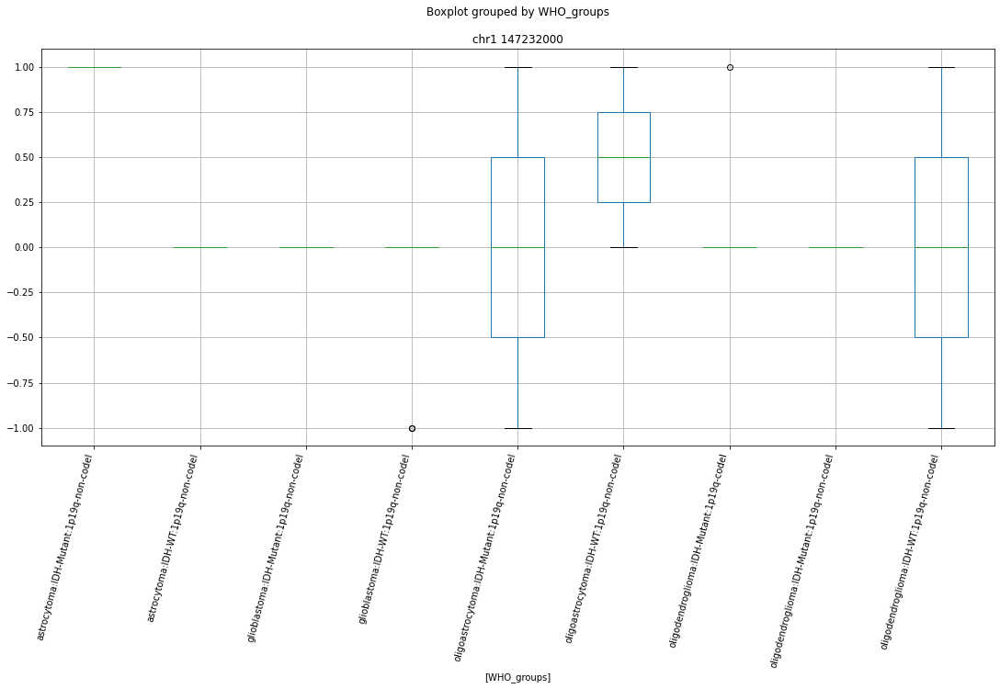

 p : 1.290674052678032e-07  ( t : 6.638830776128736 ) :  chr3 61672000


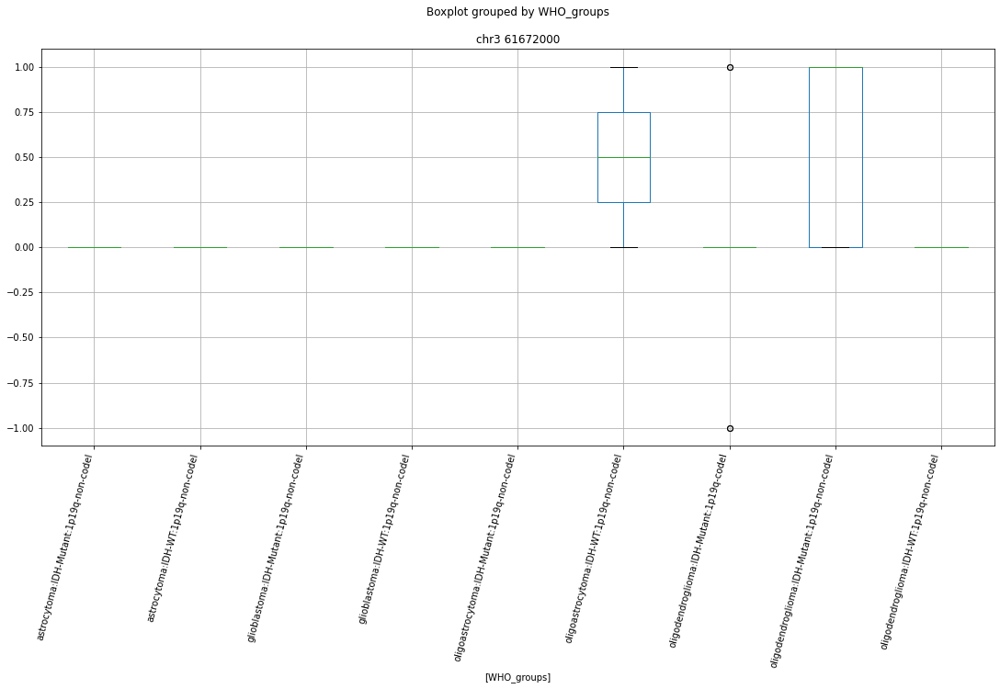

 p : 7.652029423525033e-07  ( t : 6.268199309263001 ) :  chr4 183819000


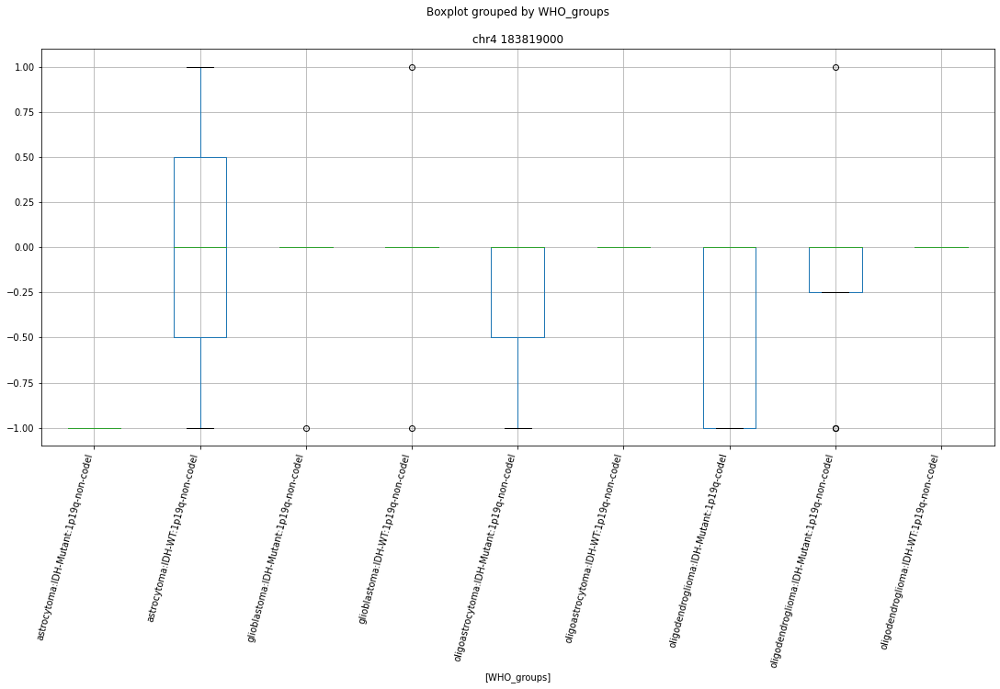

 p : 1.852189847381658e-06  ( t : 7.078507127770286 ) :  chr2 135032000


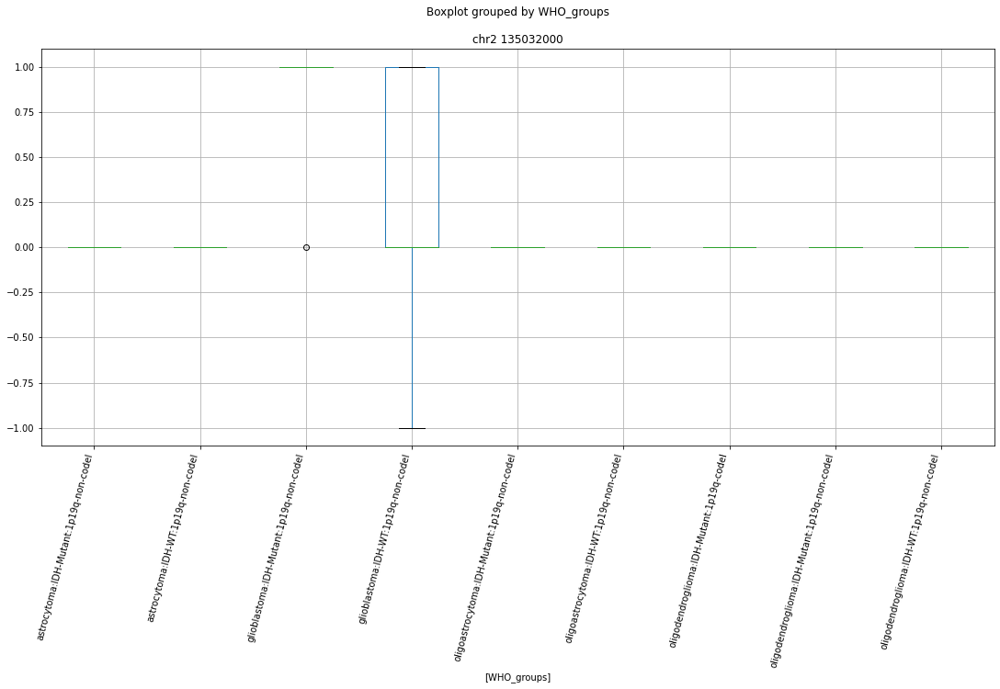

 p : 1.852189847381668e-06  ( t : 7.078507127770284 ) :  chr14 55919000


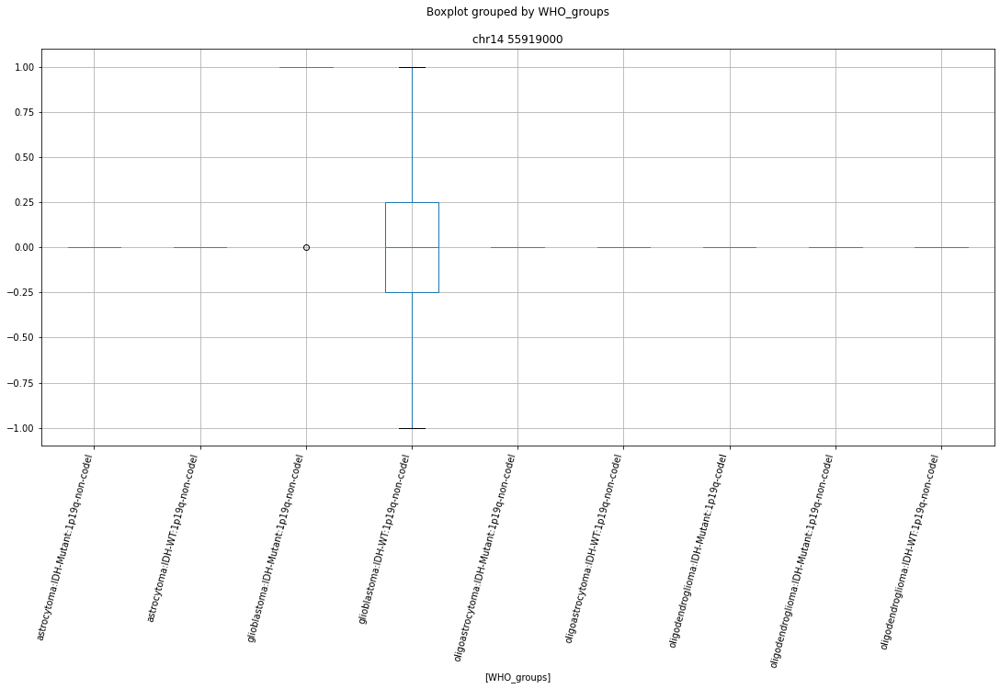

 p : 4.297488797880449e-06  ( t : 5.683985600588052 ) :  chr3 56583000


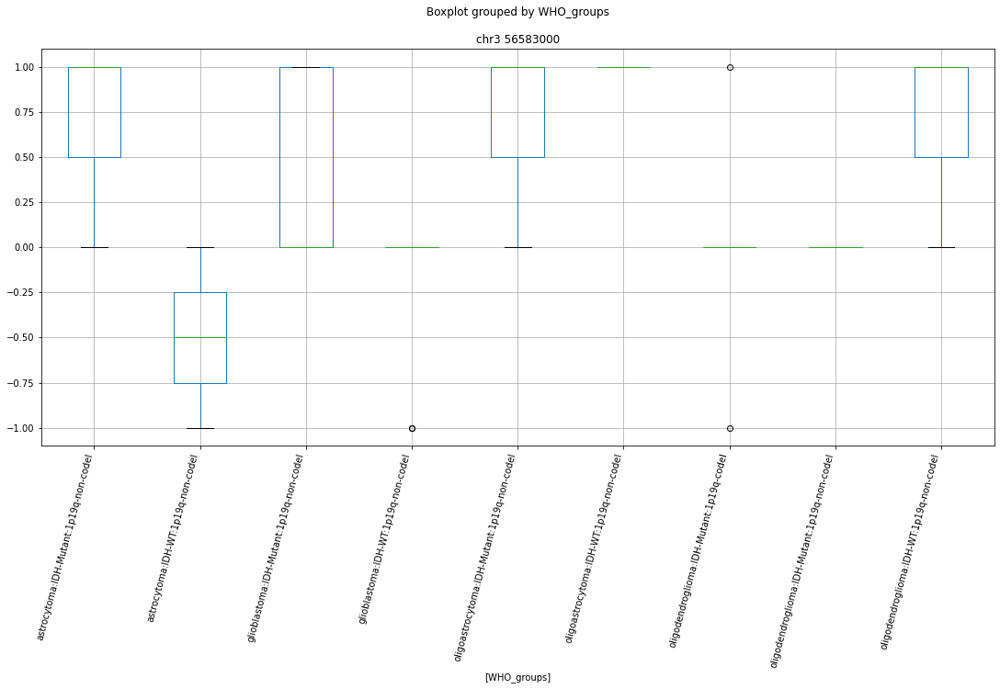

 p : 6.320613449404128e-06  ( t : 6.7686394229571025 ) :  chr10 130628000


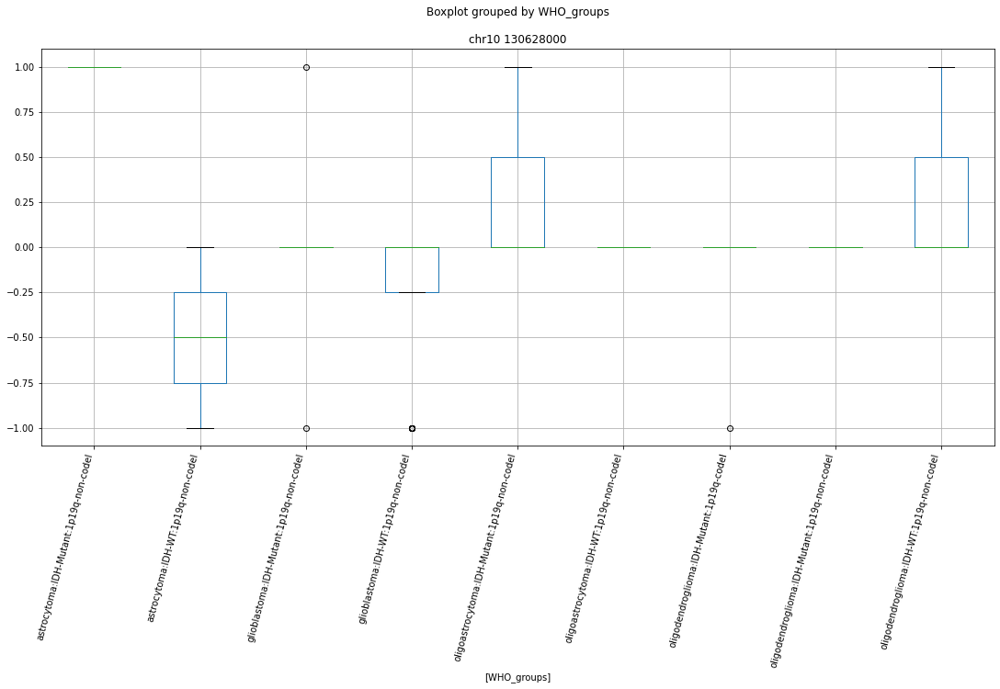

Clustermapping
['WHO_groups' 'chr1 10427000' 'chr1 106411000' ... 'chrY 12452000'
 'chrY 8917000' 'subject']


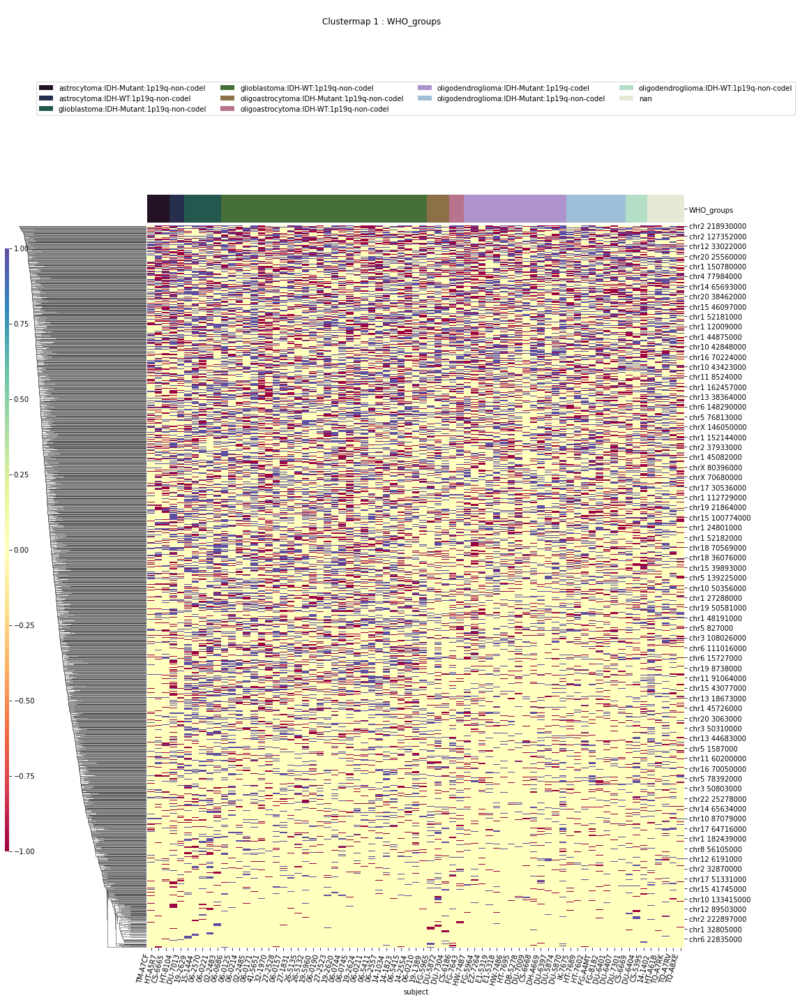

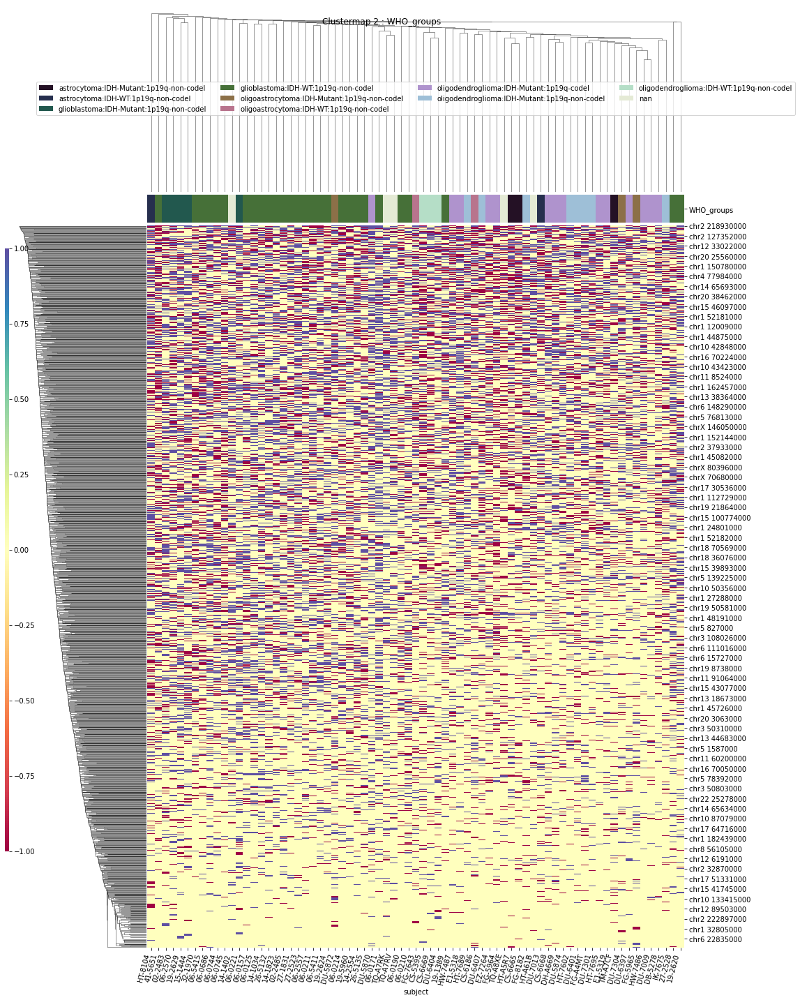

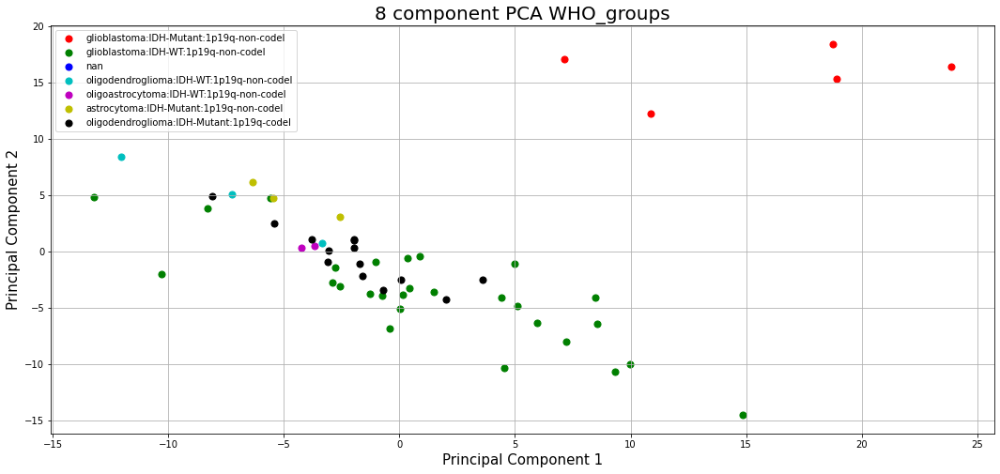

Triple_group
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
 p : 1.5664375980795036e-09  ( t : 8.253570655869408 ) :  chr20 30292000


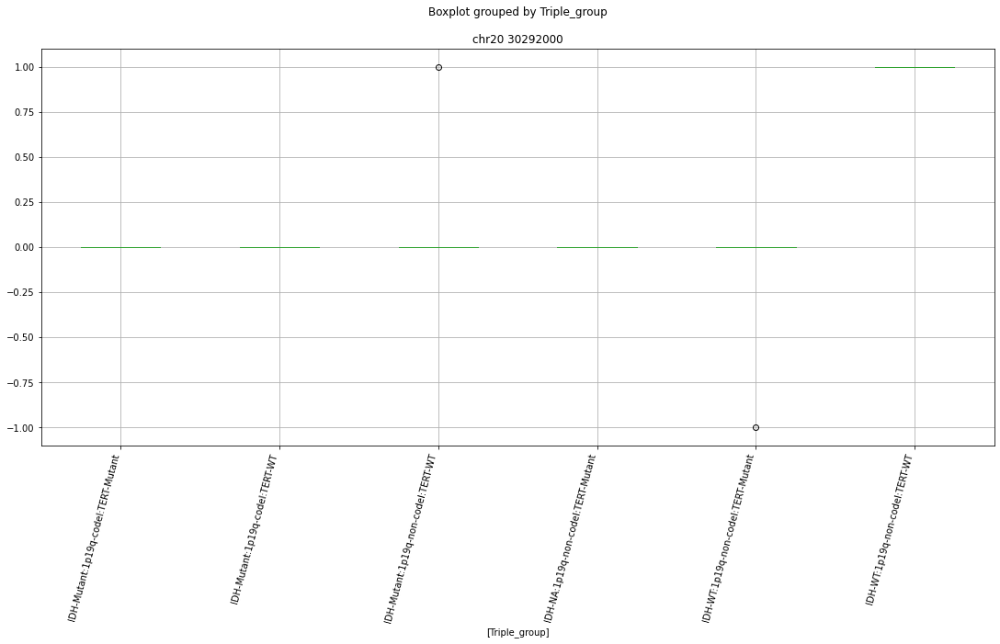

 p : 1.714740087022125e-06  ( t : 6.362389488234746 ) :  chr20 30292000


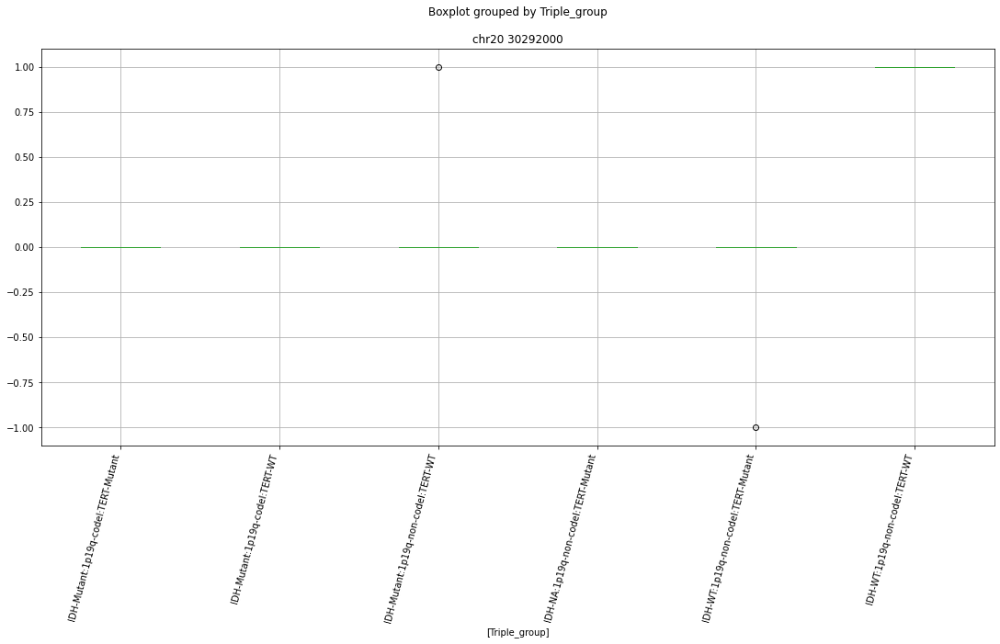

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr5 56398000


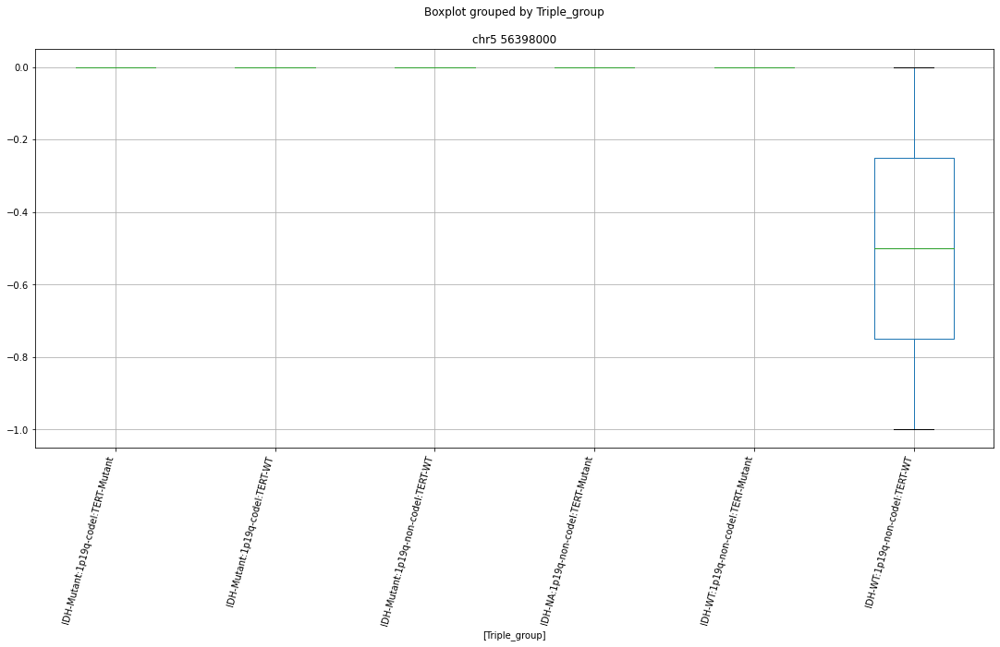

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chrX 53503000


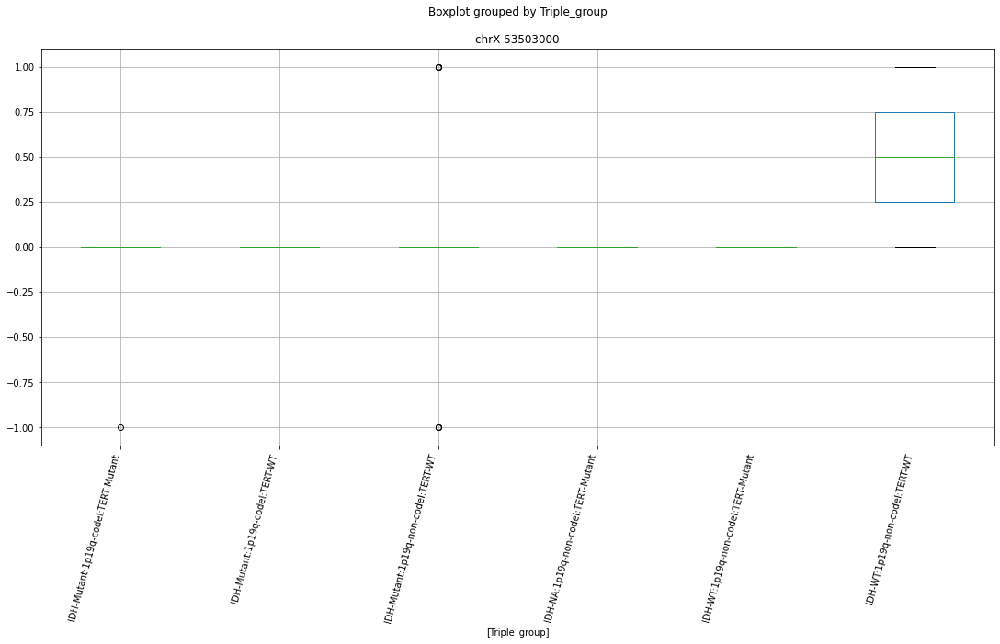

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr2 222897000


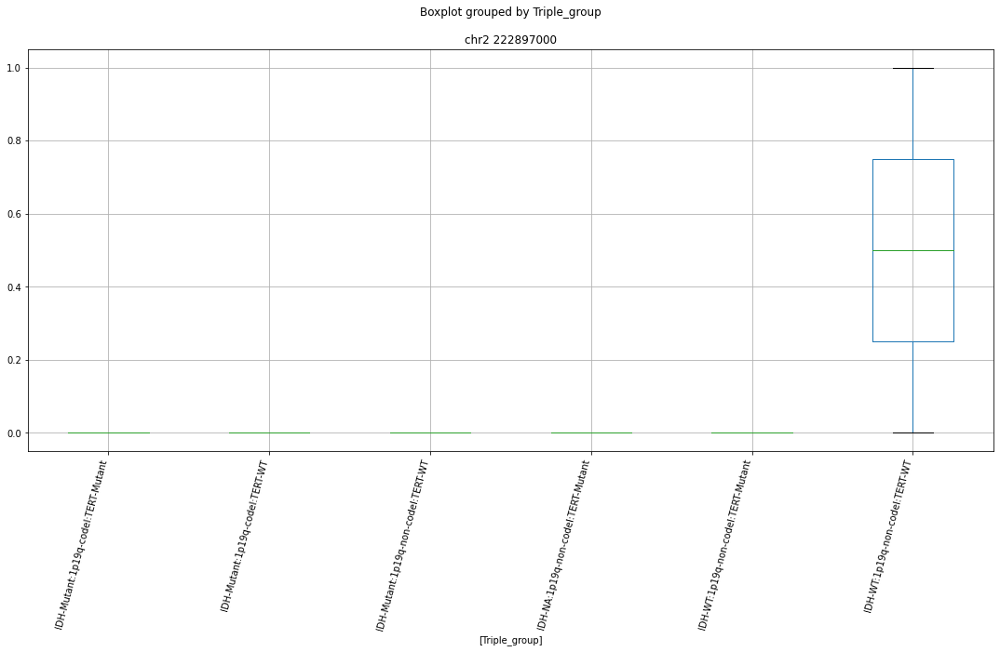

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 248676000


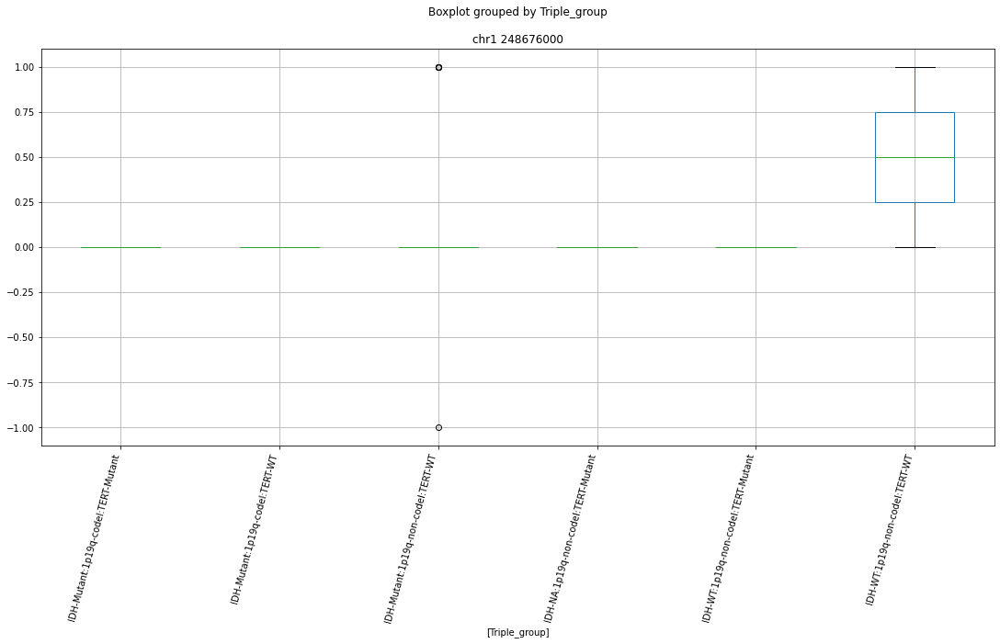

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr19 34923000


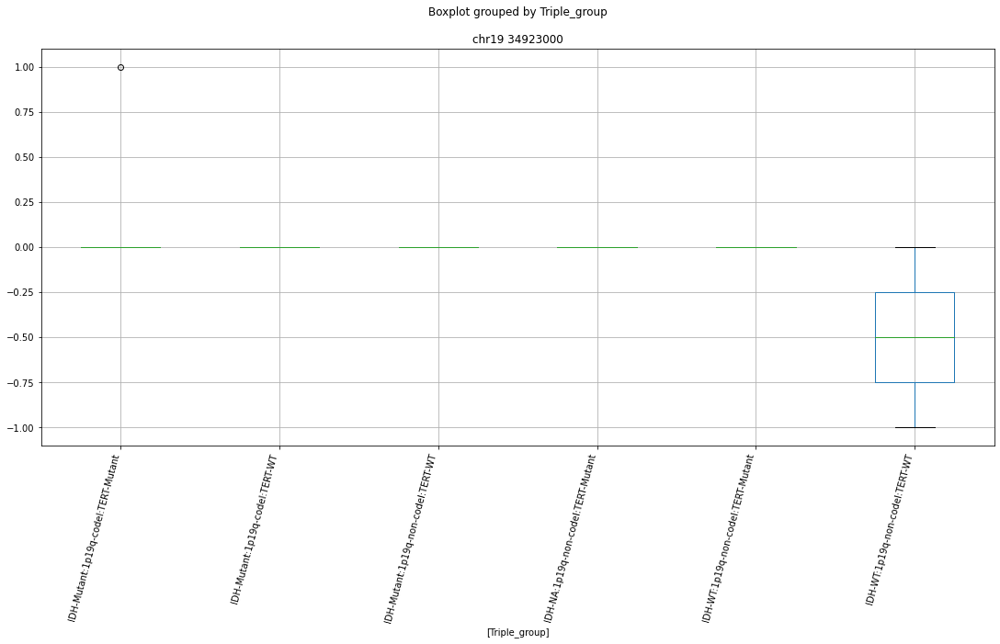

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr9 111618000


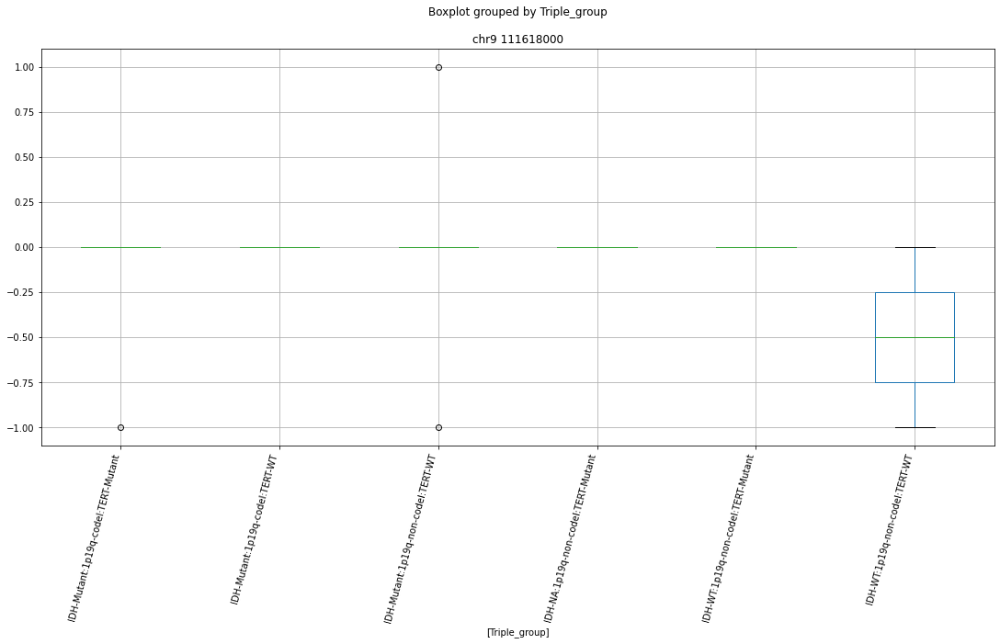

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr6 76743000


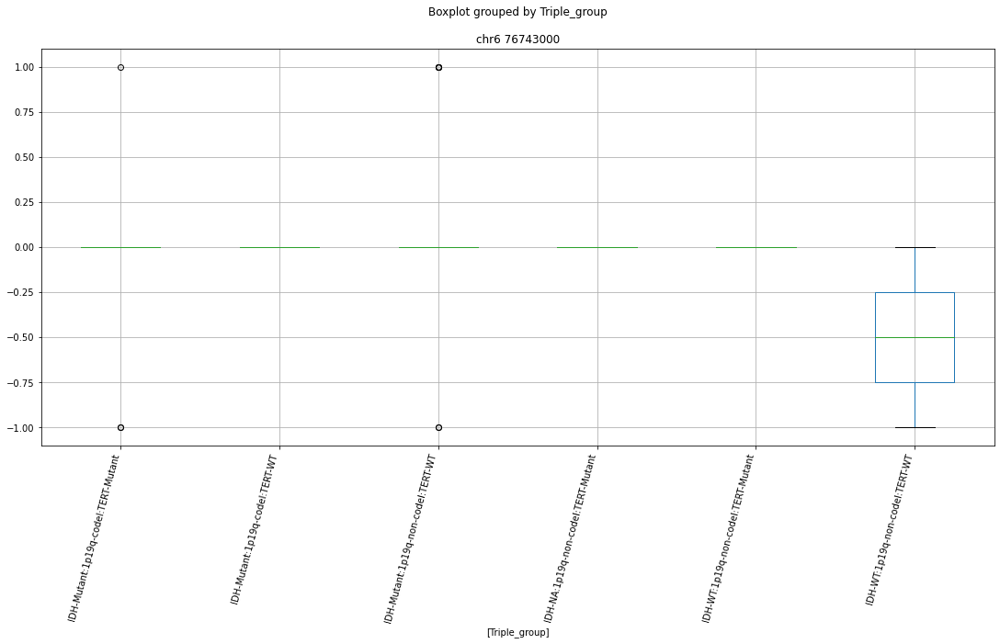

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr11 57717000


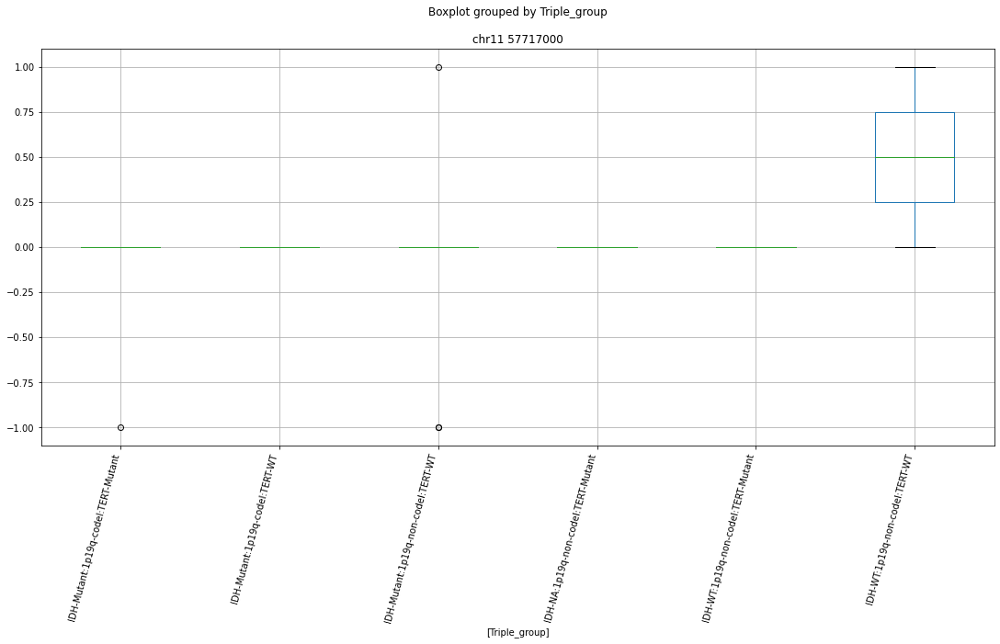

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr1 237670000


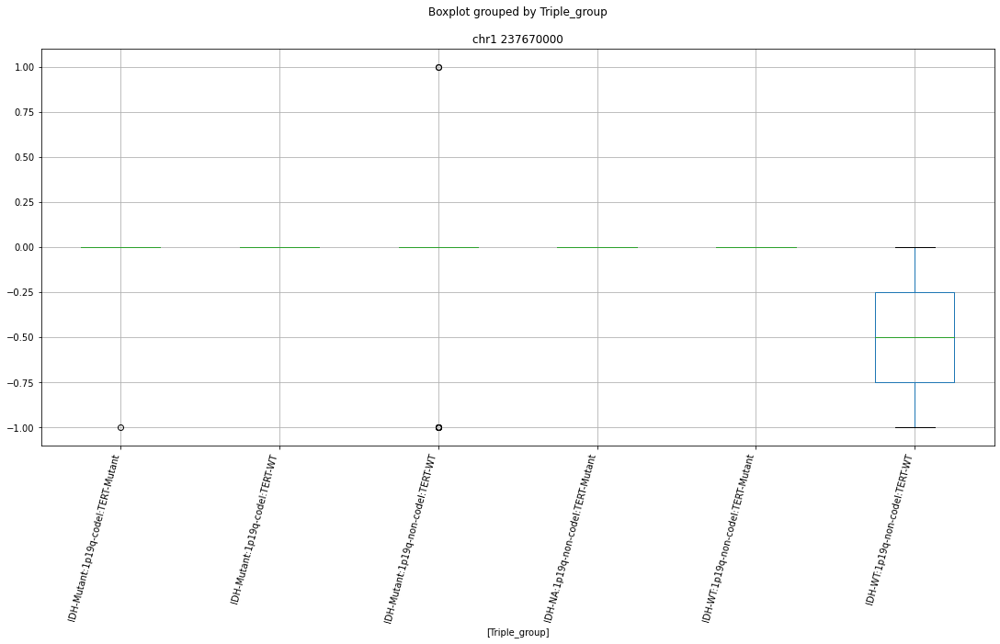

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr13 30840000


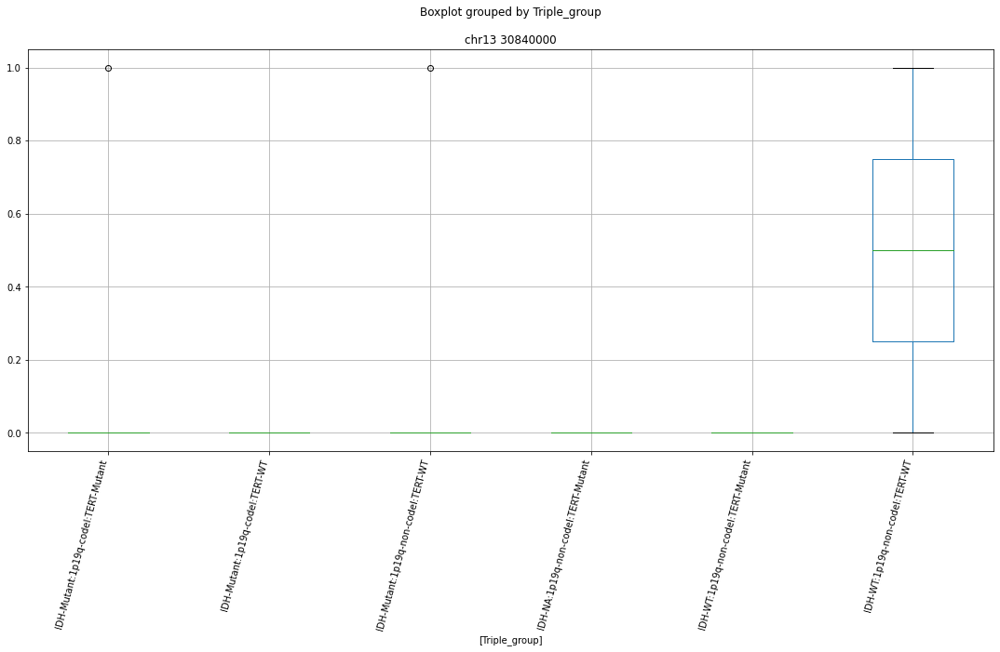

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr17 58454000


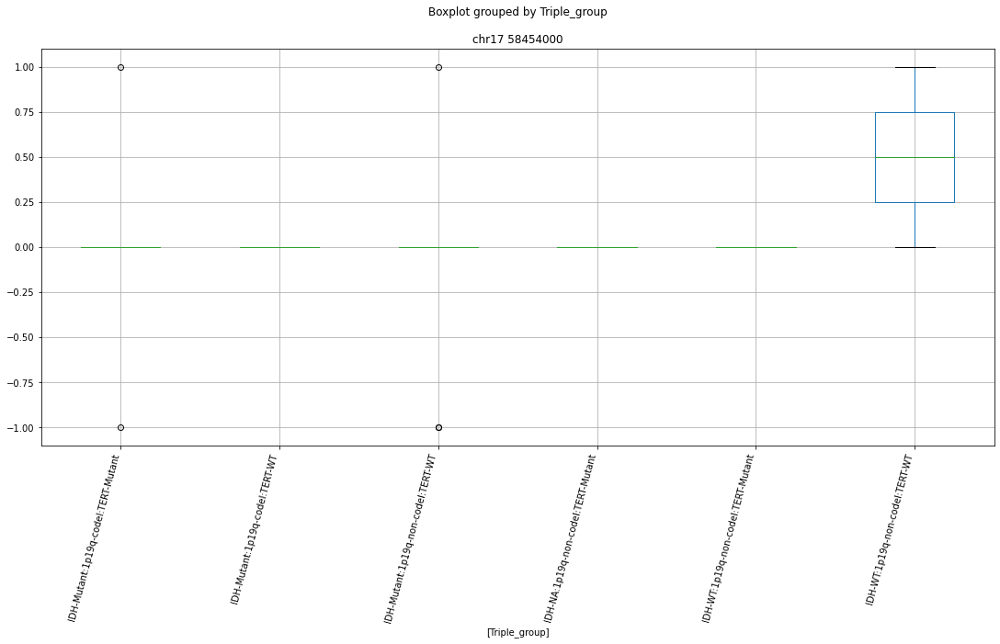

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr12 74587000


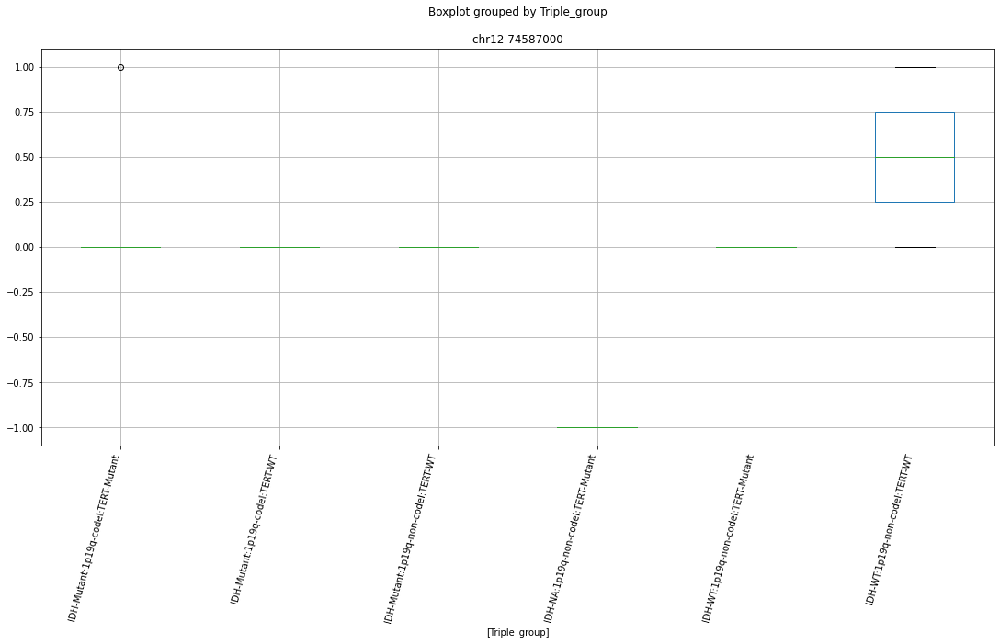

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr15 82999000


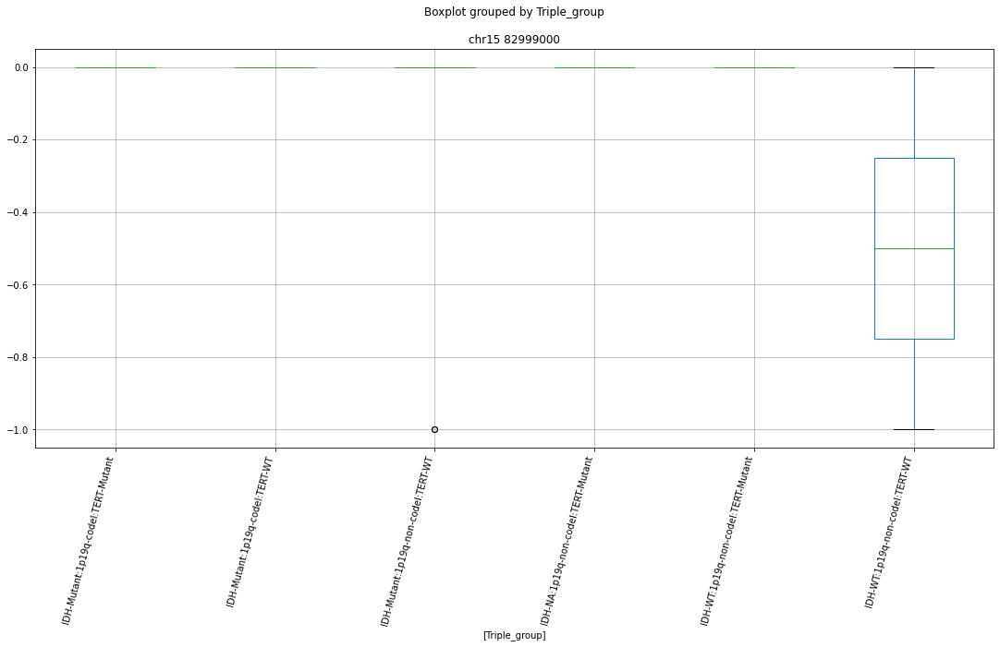

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr7 1147000


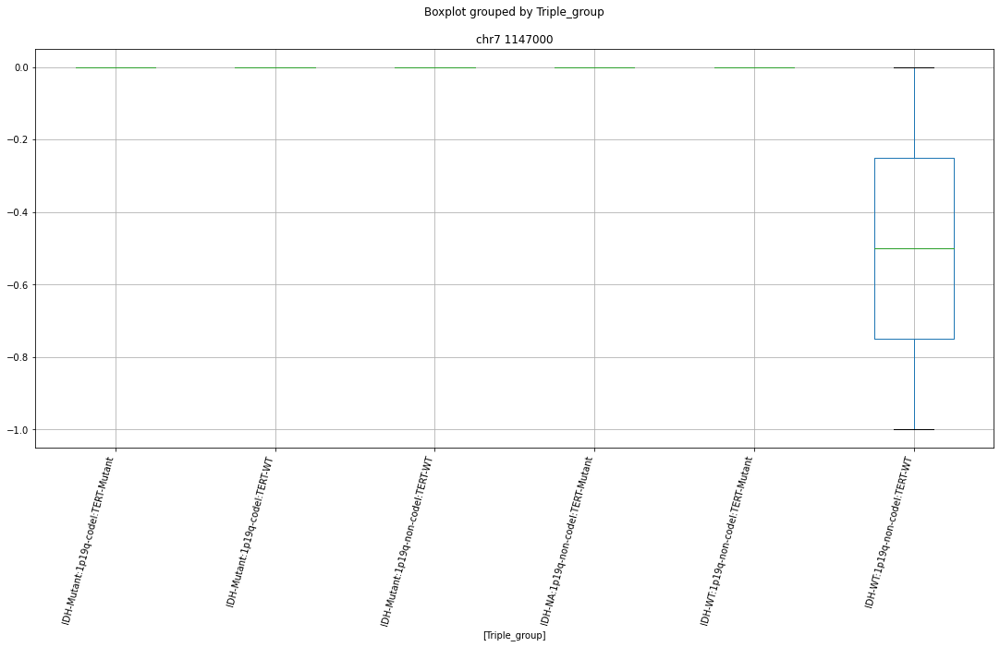

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr9 125576000


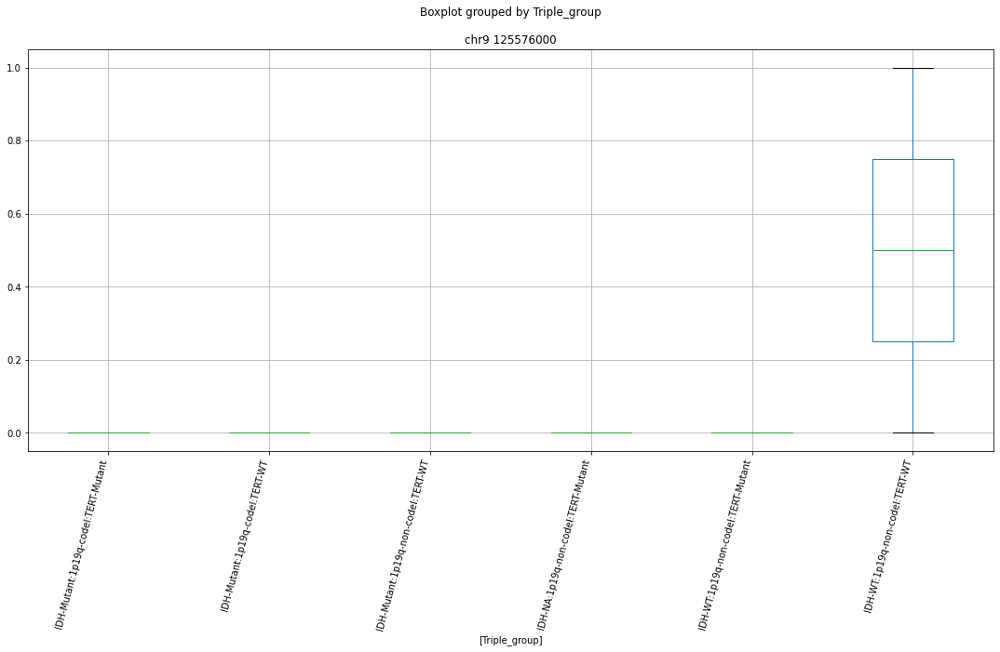

 p : 3.3479850017401667e-06  ( t : 5.57801808120821 ) :  chr2 135034000


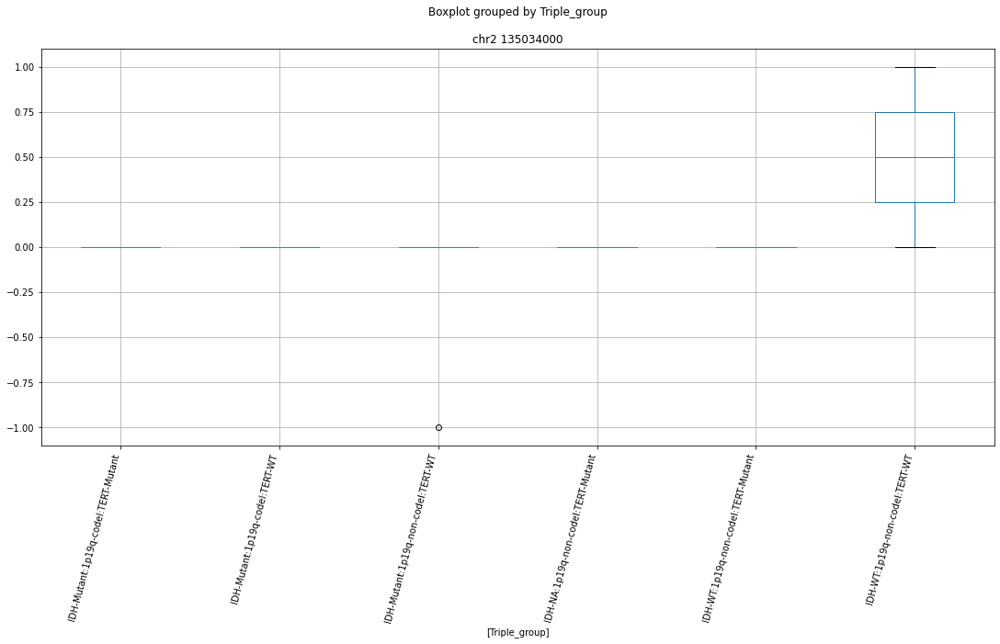

 p : 8.439642589272991e-06  ( t : 4.922132360485959 ) :  chr17 16146000


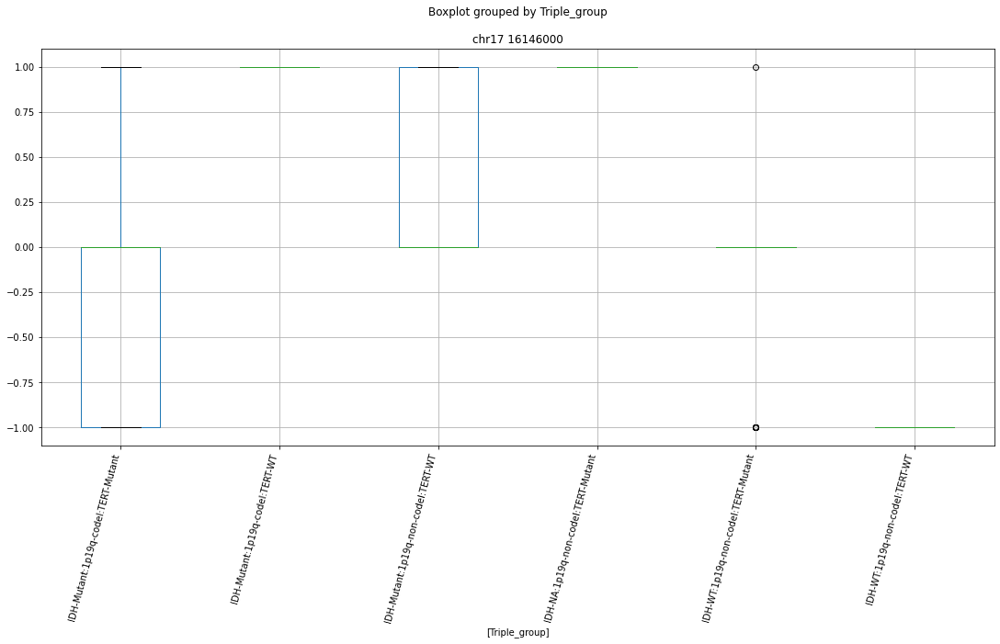

 p : 9.90099409952005e-06  ( t : 5.210977424081371 ) :  chr11 31972000


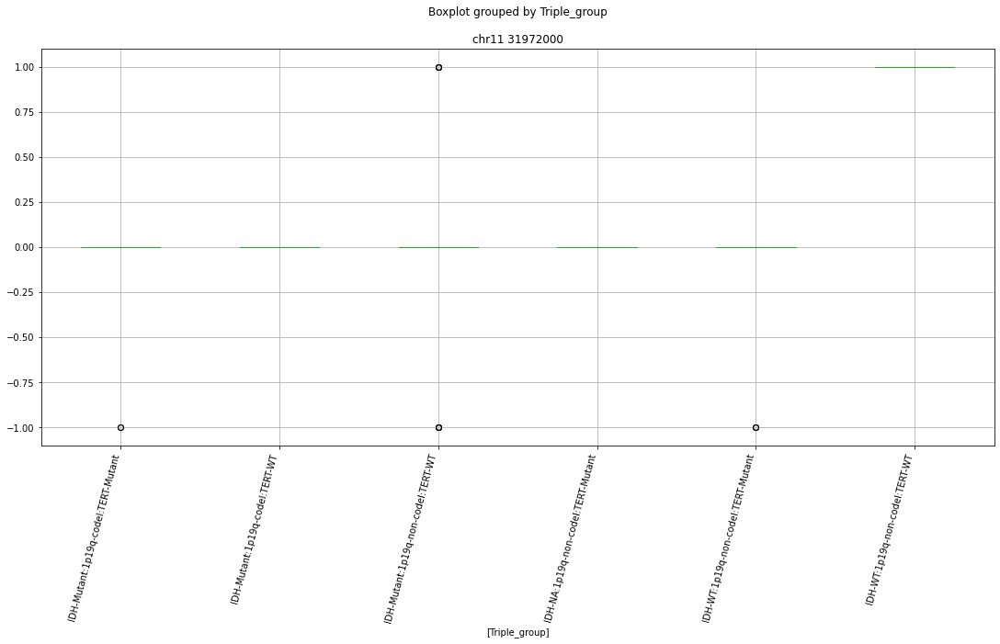

Clustermapping
['Triple_group' 'chr1 10427000' 'chr1 106411000' 'chr1 114805000'
 'chr1 117300000' 'chr1 12009000' 'chr1 147232000' 'chr1 151652000'
 'chr1 151768000' 'chr1 152144000' 'chr1 152472000' 'chr1 160533000'
 'chr1 161280000' 'chr1 161615000' 'chr1 167030000' 'chr1 167771000'
 'chr1 170419000' 'chr1 179041000' 'chr1 179419000' 'chr1 181955000'
 'chr1 183427000' 'chr1 189226000' 'chr1 199905000' 'chr1 206065000'
 'chr1 21052000' 'chr1 211198000' 'chr1 217523000' 'chr1 219544000'
 'chr1 220465000' 'chr1 220467000' 'chr1 22159000' 'chr1 222486000'
 'chr1 231453000' 'chr1 234268000' 'chr1 237670000' 'chr1 247031000'
 'chr1 24801000' 'chr1 248676000' 'chr1 248911000' 'chr1 27288000'
 'chr1 27829000' 'chr1 32975000' 'chr1 34083000' 'chr1 36243000'
 'chr1 37895000' 'chr1 40572000' 'chr1 44875000' 'chr1 44877000'
 'chr1 45107000' 'chr1 45498000' 'chr1 45723000' 'chr1 46321000'
 'chr1 48175000' 'chr1 51712000' 'chr1 64414000' 'chr1 65140000'
 'chr1 6714000' 'chr1 6716000' 'chr1 713790

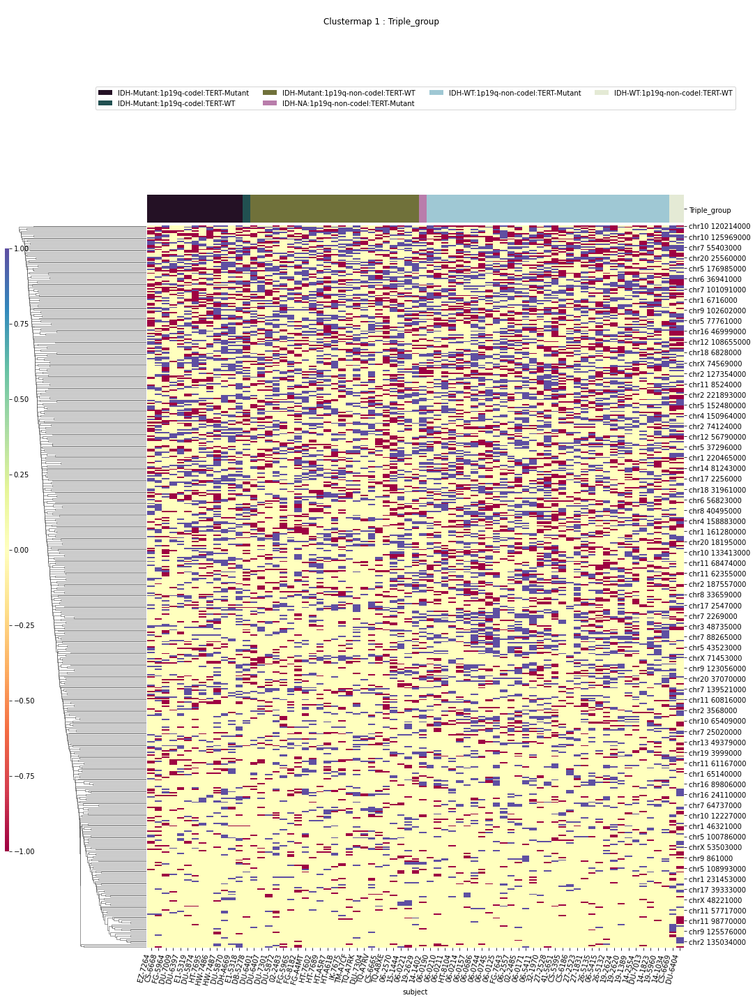

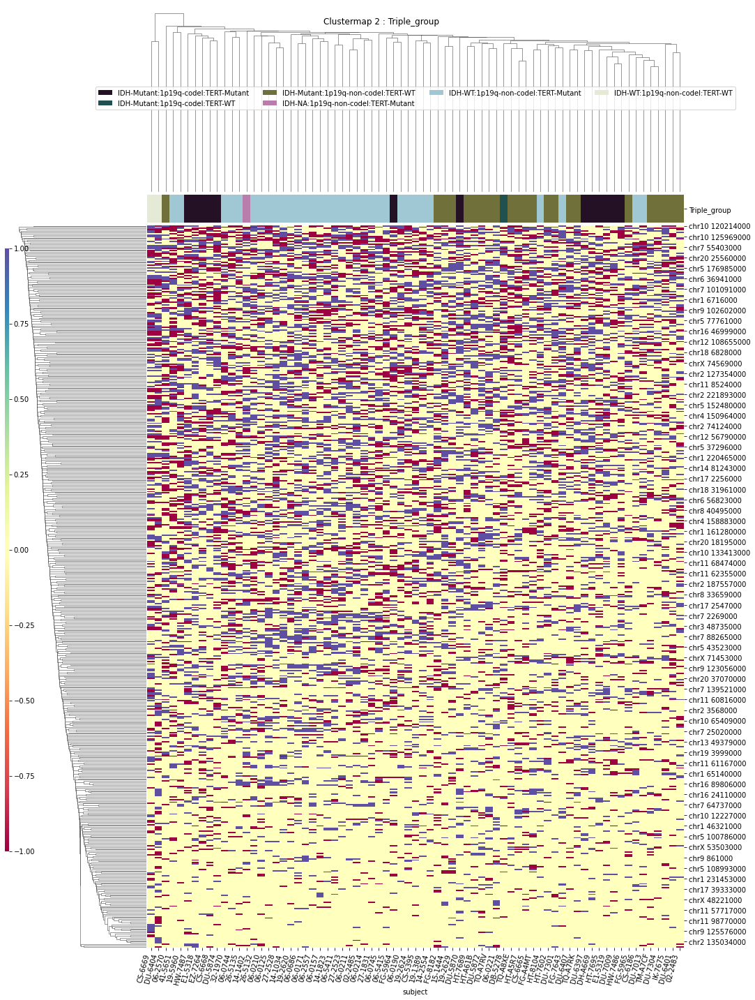

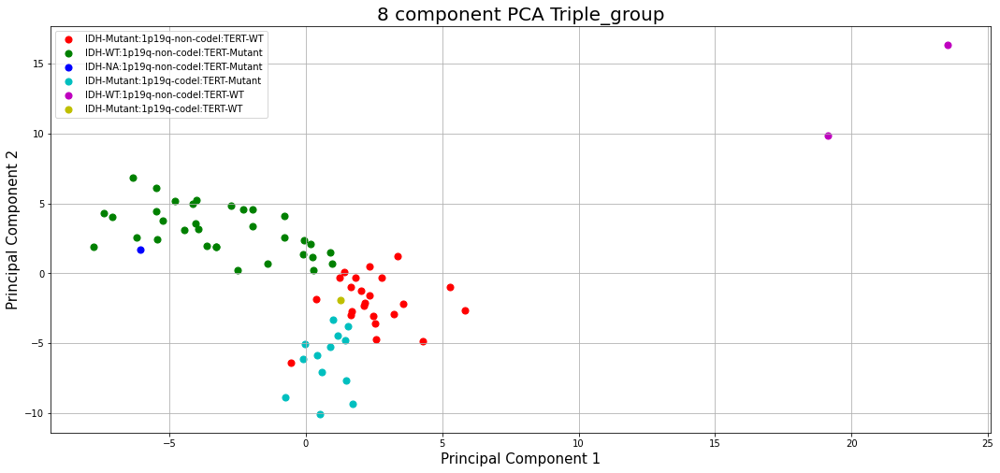

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 11305000' 'chr1 117300000' 'chr1 145765000' 'chr1 152255000'
 'chr1 167771000' 'chr1 183427000' 'chr1 202451000' 'chr1 203266000'
 'chr1 212319000' 'chr1 23854000' 'chr1 39869000' 'chr1 45223000'
 'chr1 52743000' 'chr1 6304000' 'chr1 64414000' 'chr1 86963000'
 'chr1 98511000' 'chr10 100278000' 'chr10 102036000' 'chr10 119794000'
 'chr10 120799000' 'chr10 12523000' 'chr10 126994000' 'chr10 21431000'
 'chr10 21838000' 'chr10 42901000' 'chr10 43423000' 'chr10 43464000'
 'chr10 6824000' 'chr10 69993000' 'chr10 73690000' 'chr10 92976000'
 'chr10 98151000' 'chr11 17049000' 'chr11 19740000' 'chr11 3398000'
 'chr11 45737000' 'chr11 76934000' 'chr11 86733000' 'chr11 89861000'
 'chr11 98770000' 'chr12 117732000' 'chr12 122358000' 'chr12 4721000'
 'chr12 70203000' 'chr13 109312000' 'chr13 40899000' 'chr13 46163000'
 'chr13 51078000' 'chr13 85340000' 'chr14 102410000' 'chr14 20212000'
 'chr14 35976000' 'chr14 44602000' 'chr14 51605000' 'chr14

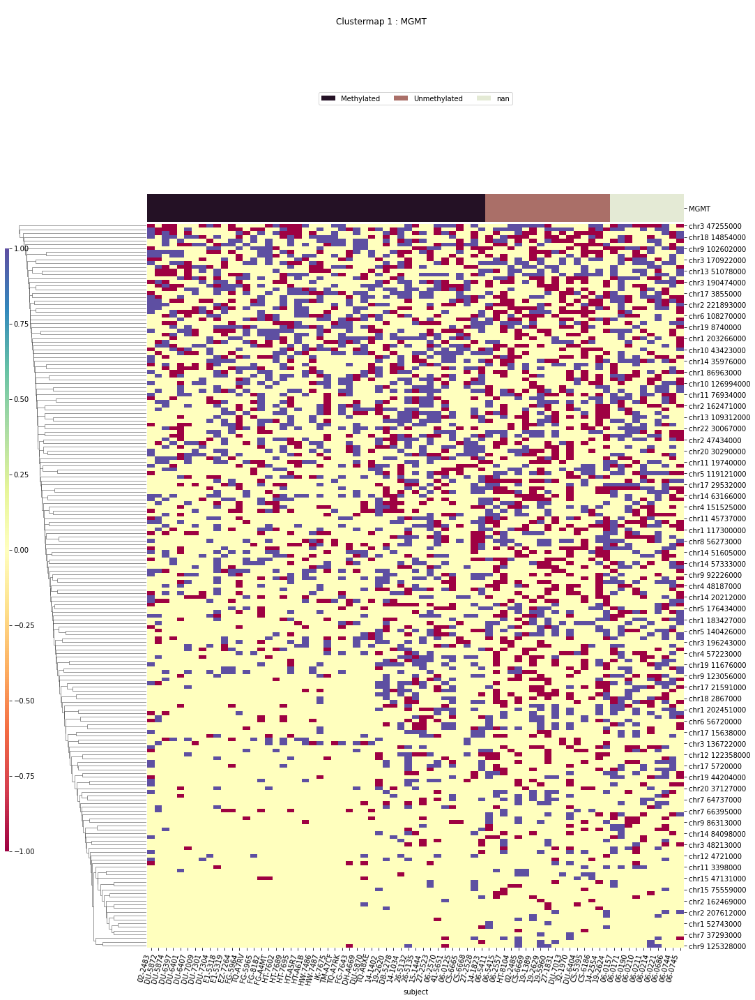

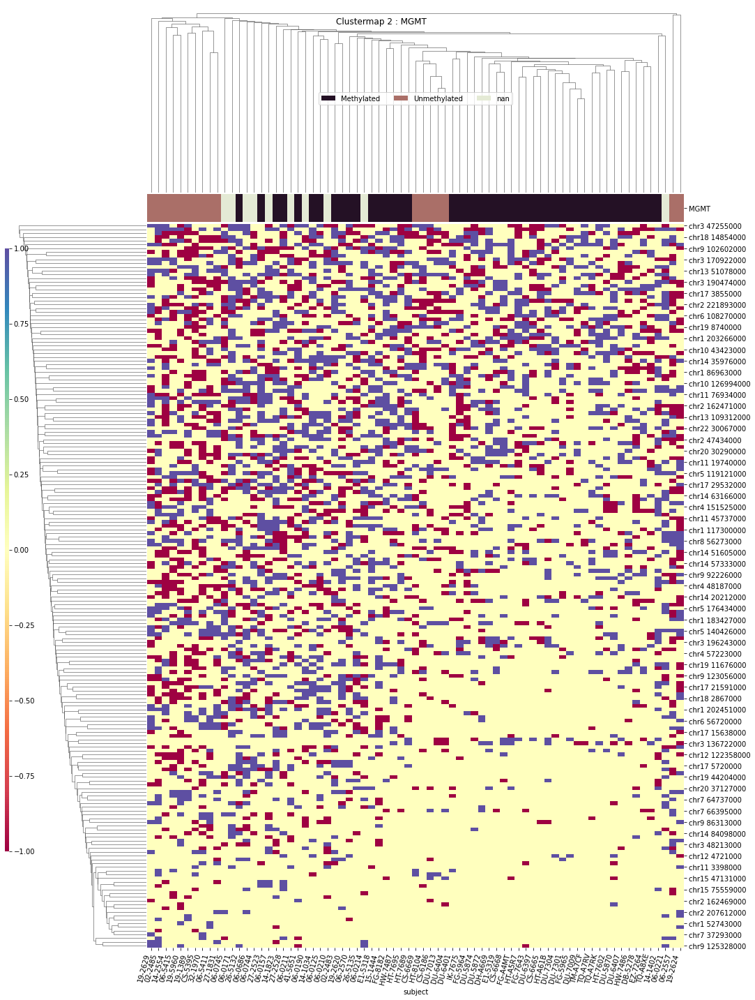

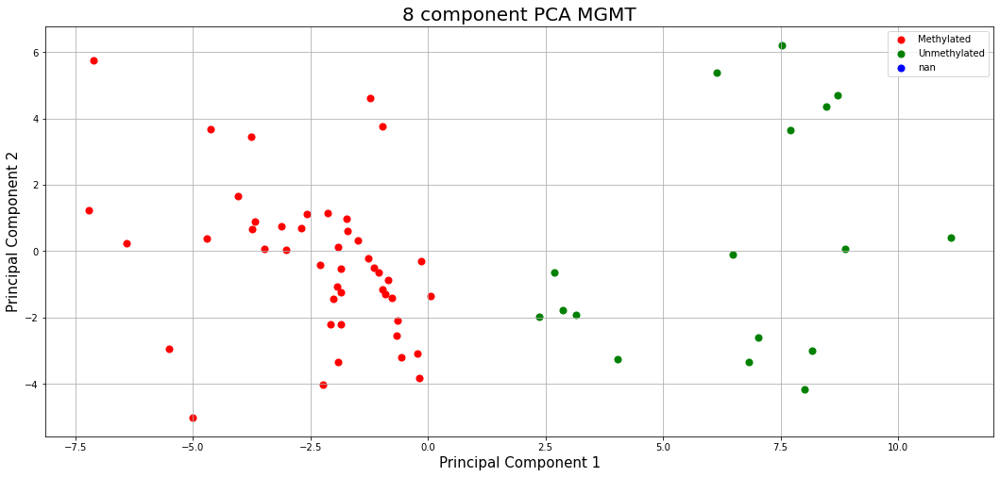

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 113062000' 'chr1 114803000' 'chr1 150851000' 'chr1 168208000'
 'chr1 179039000' 'chr1 179134000' 'chr1 179419000' 'chr1 21052000'
 'chr1 212322000' 'chr1 23689000' 'chr1 24031000' 'chr1 241416000'
 'chr1 247031000' 'chr1 64200000' 'chr1 96470000' 'chr10 12518000'
 'chr10 6824000' 'chr10 75332000' 'chr10 78469000' 'chr10 87079000'
 'chr11 112027000' 'chr11 5935000' 'chr11 67597000' 'chr11 79500000'
 'chr11 86109000' 'chr11 95481000' 'chr12 117732000' 'chr12 130998000'
 'chr12 27874000' 'chr12 70203000' 'chr13 107783000' 'chr13 25513000'
 'chr13 69615000' 'chr13 95689000' 'chr14 21189000' 'chr14 64037000'
 'chr14 66544000' 'chr15 27003000' 'chr15 45293000' 'chr15 60947000'
 'chr15 72806000' 'chr15 72808000' 'chr16 13890000' 'chr16 46999000'
 'chr16 48416000' 'chr16 70224000' 'chr17 2446000' 'chr17 2508000'
 'chr17 29532000' 'chr17 44523000' 'chr17 58143000' 'chr17 58208000'
 'chr17 63455000' 'chr17 64875000' 'chr17 69197000' 'chr17 8015

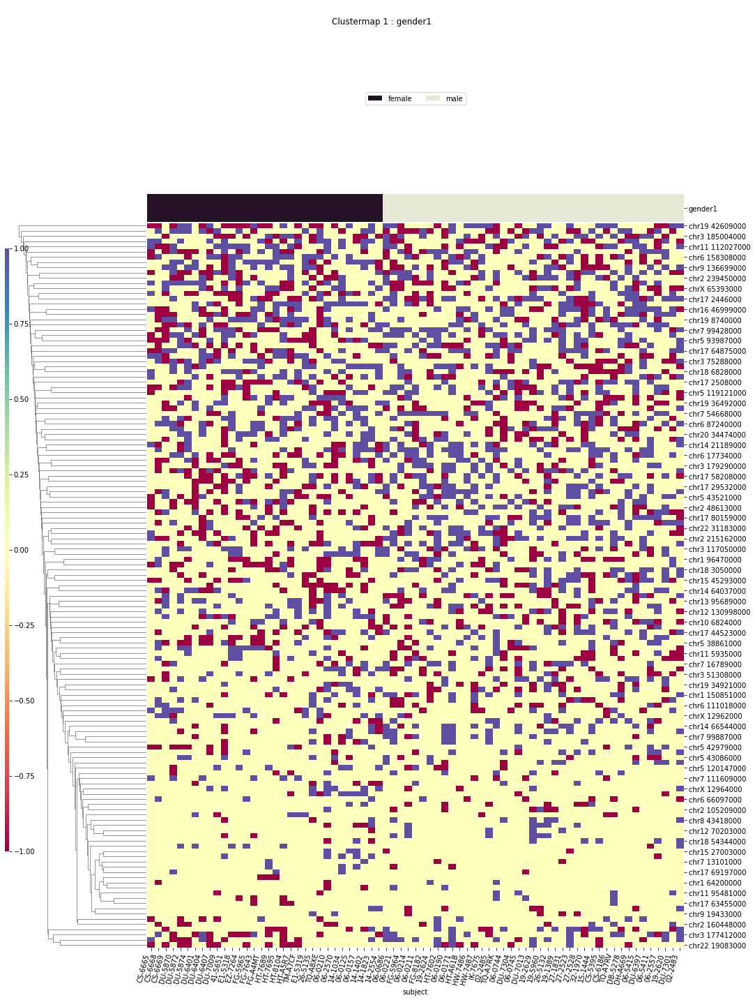

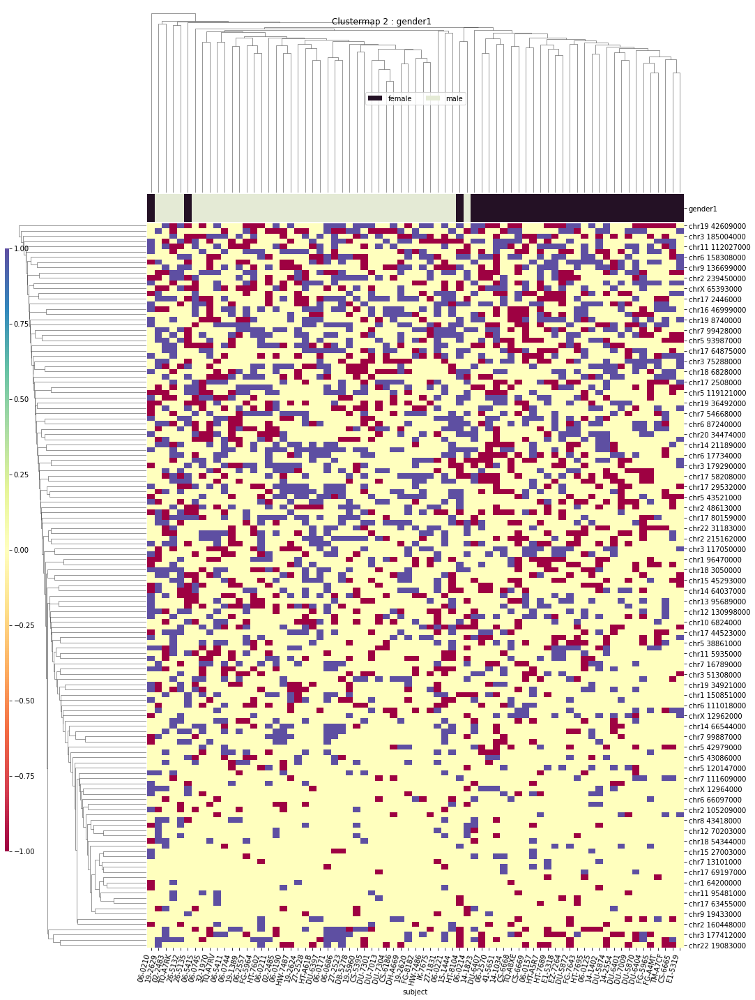

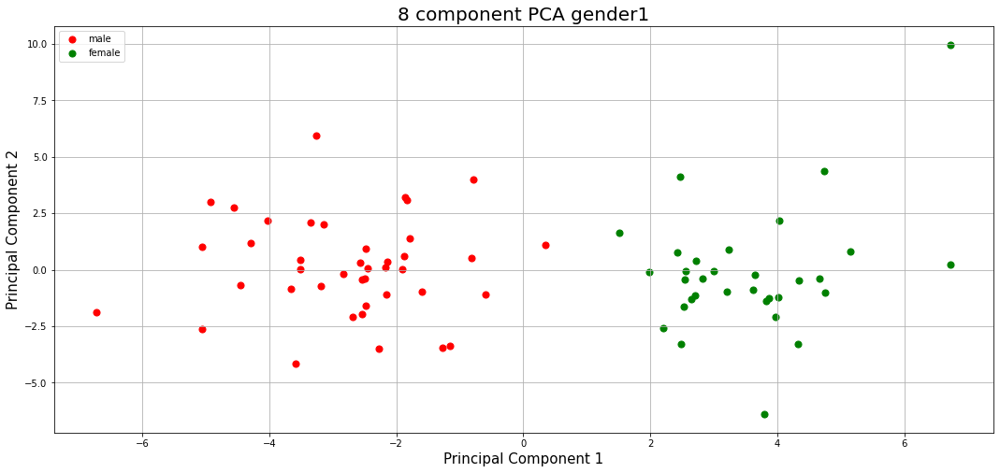

In [111]:
for column in 'primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf,
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-5,heat_p=0.05)

In [112]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 13:40:40'

primary_diagnosis
T-Testing
Boxplotting
 p : 2.948014870353662e-15  ( t : 12.708265027138834 ) :  chr5 132983000


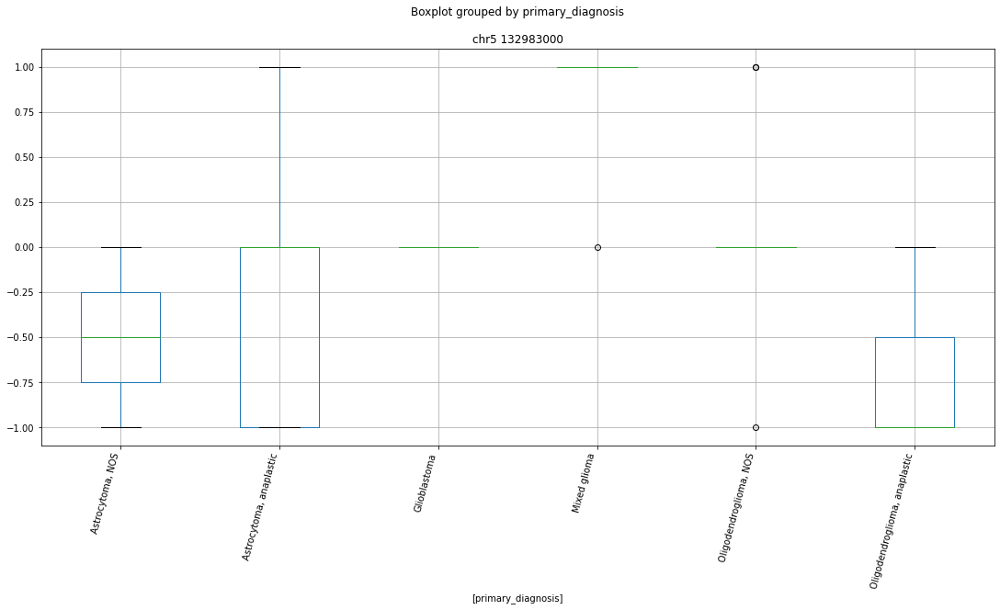

 p : 8.92060821762298e-10  ( t : 8.373639896594856 ) :  chr12 12619000


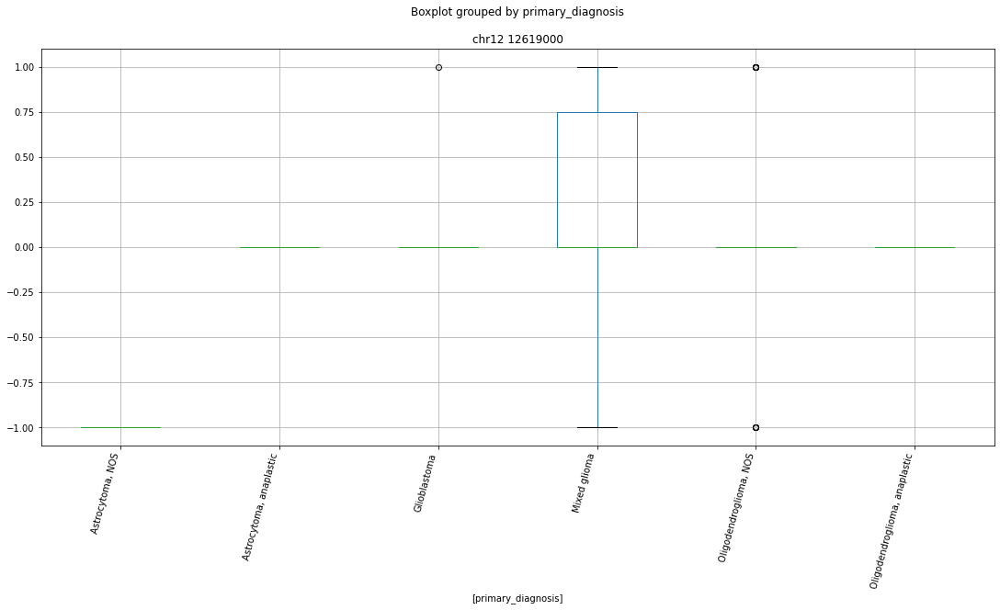

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr17 58454000


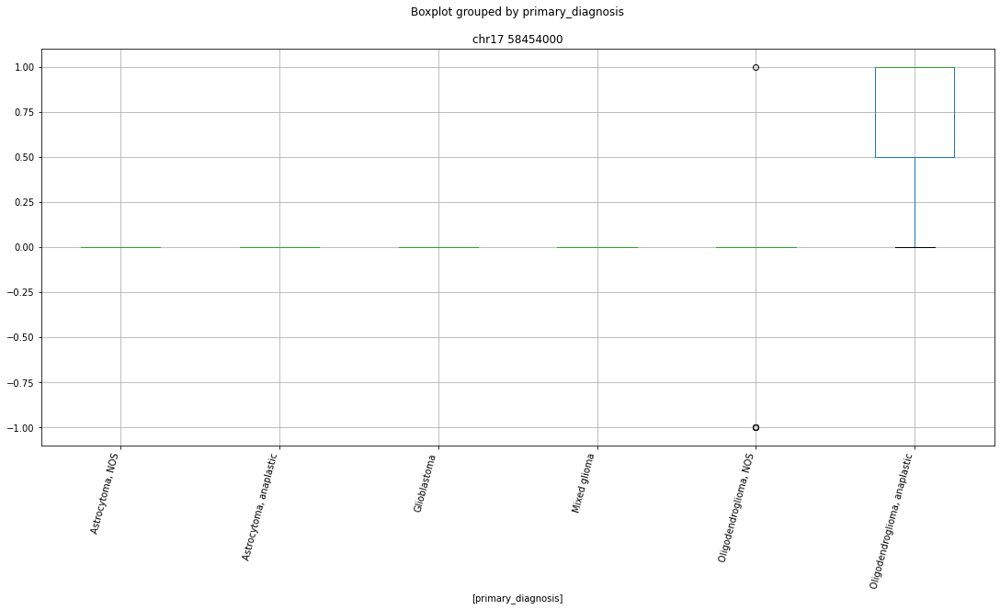

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 100479000


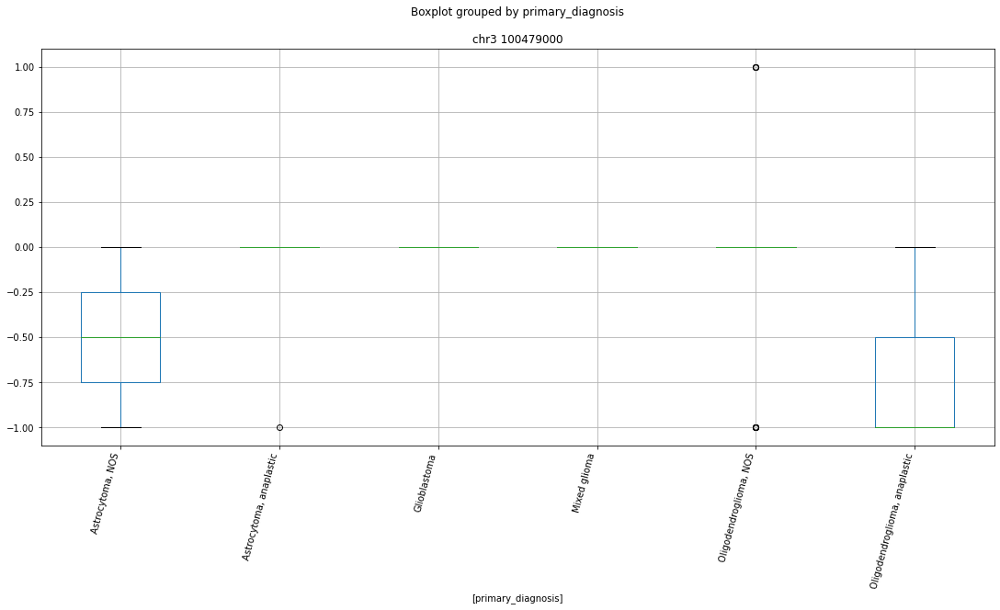

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr3 39227000


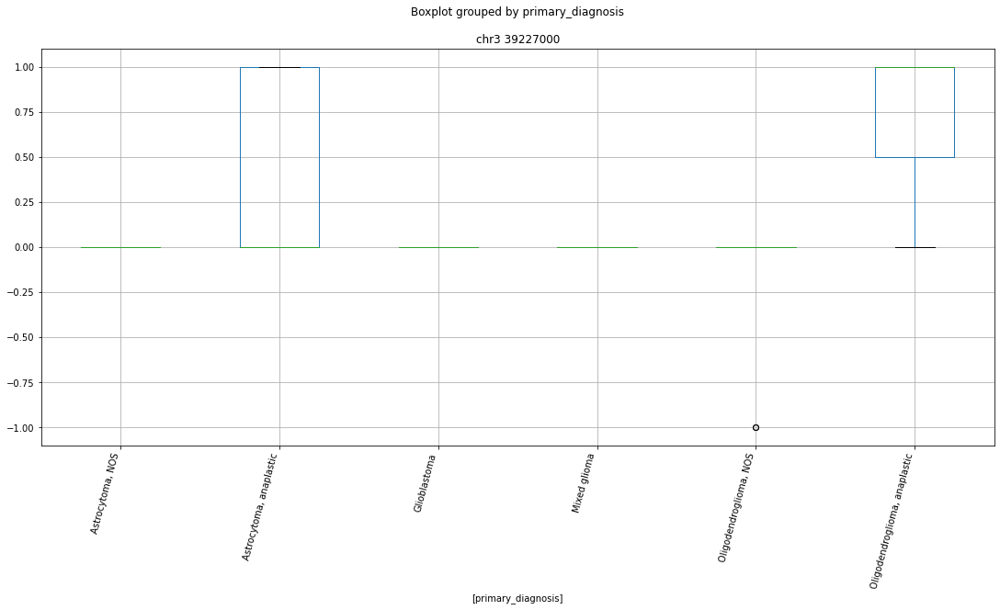

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr7 128688000


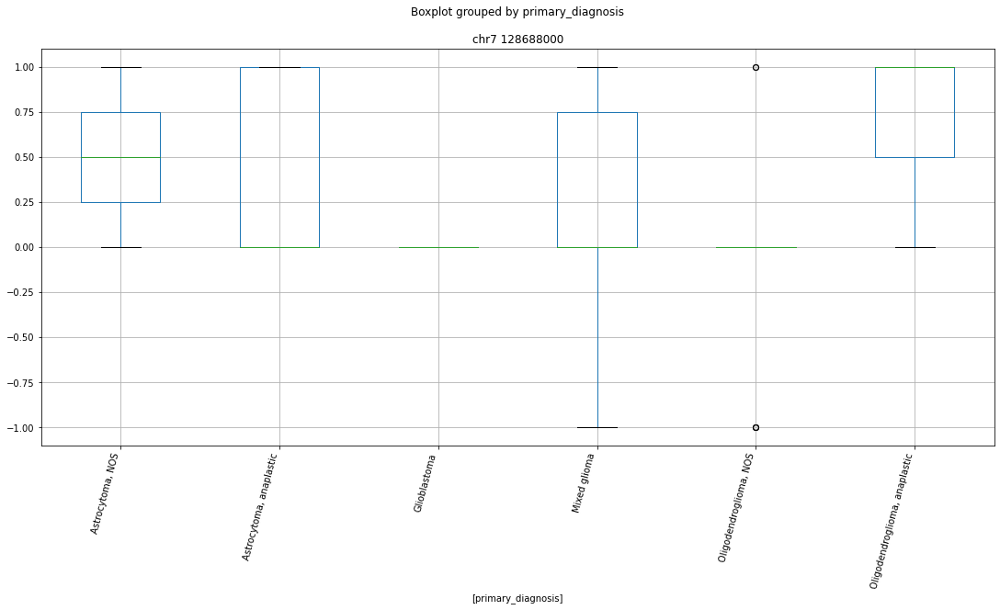

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr5 132983000


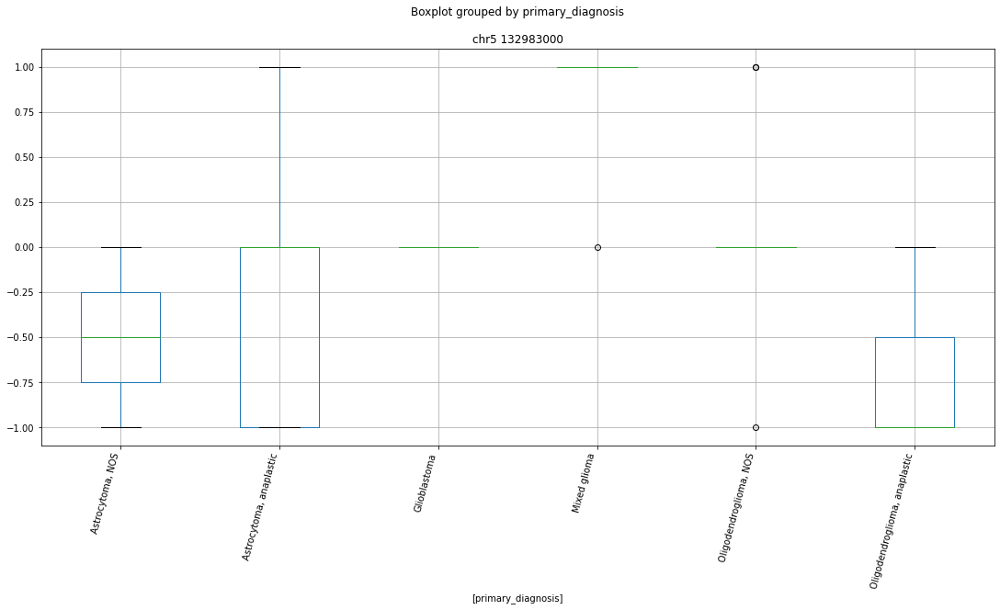

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr10 62947000


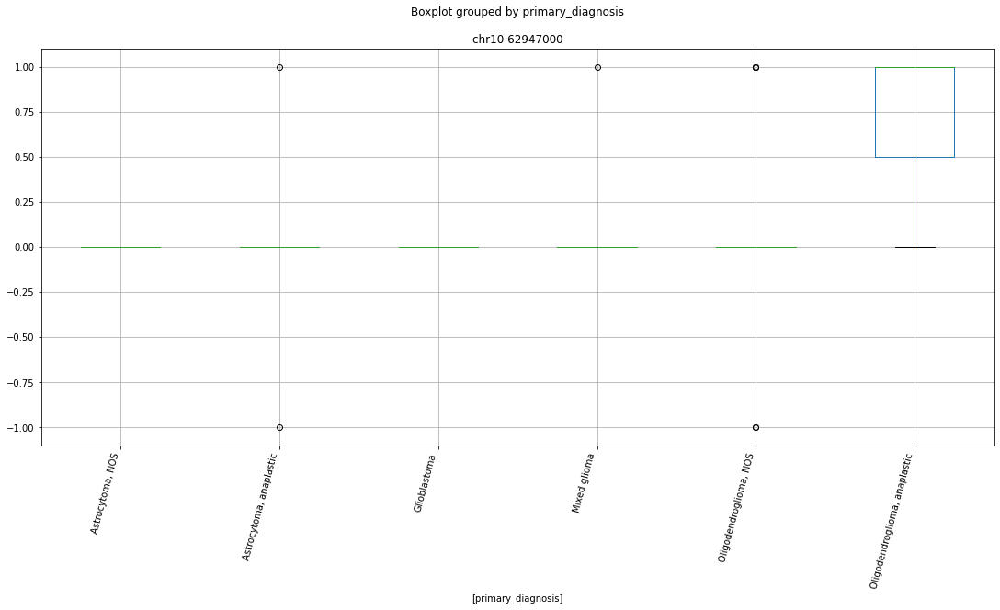

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr1 219544000


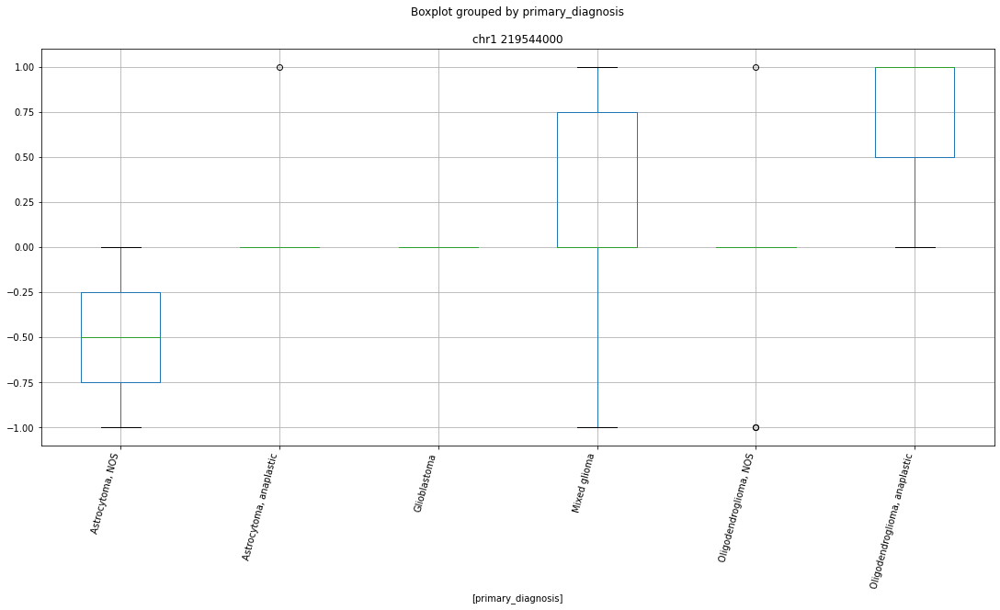

 p : 1.9394676807116956e-09  ( t : 8.020244654892037 ) :  chr2 134063000


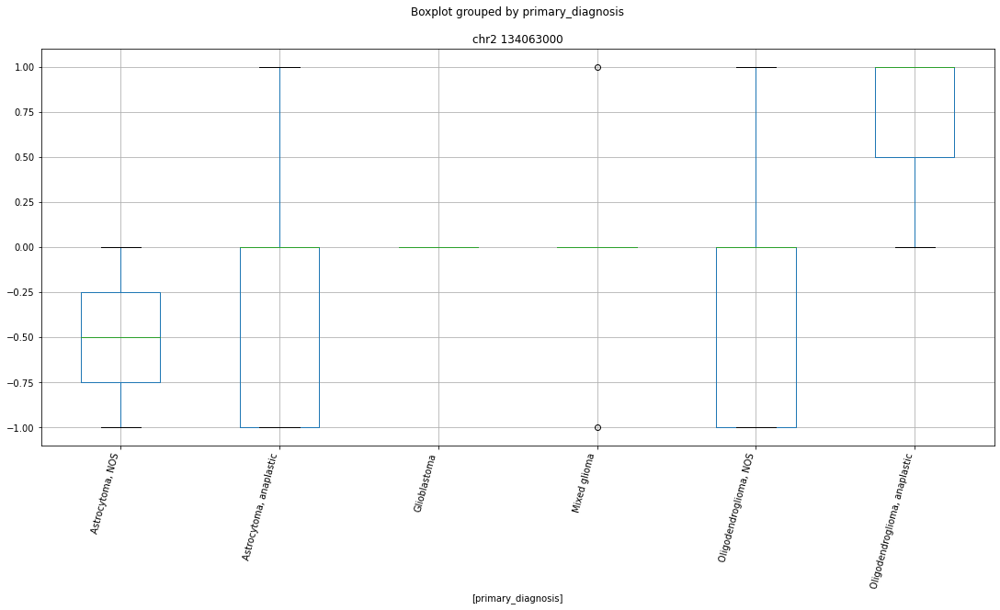

Clustermapping
['chr1 10029000' 'chr1 10427000' 'chr1 106411000' ... 'chrY 7180000'
 'primary_diagnosis' 'subject']


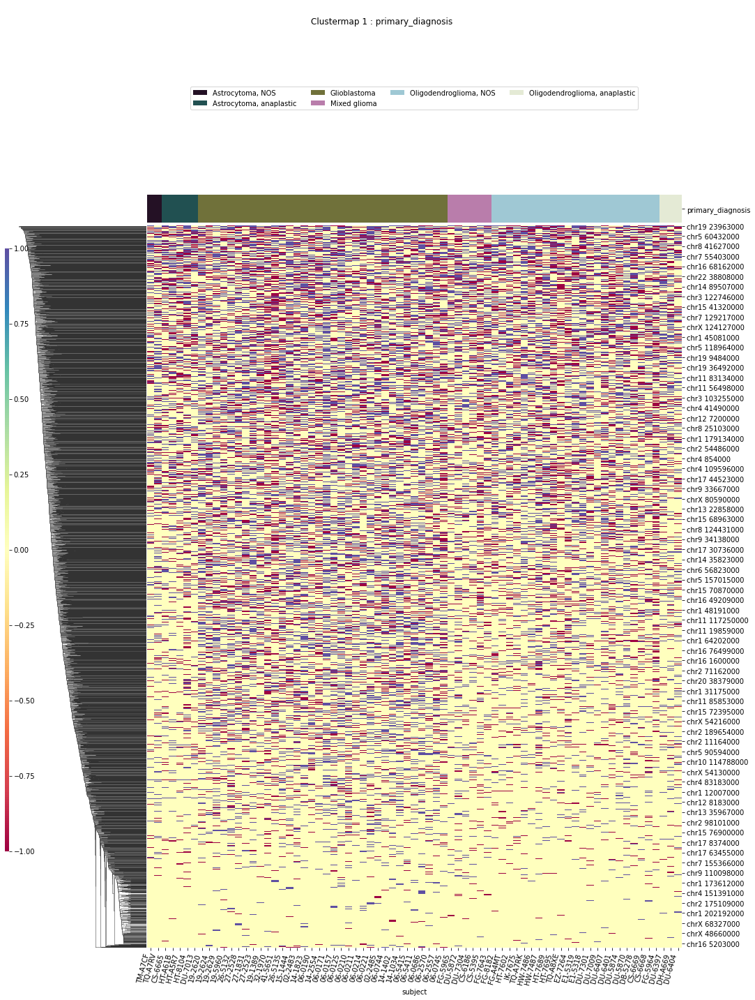

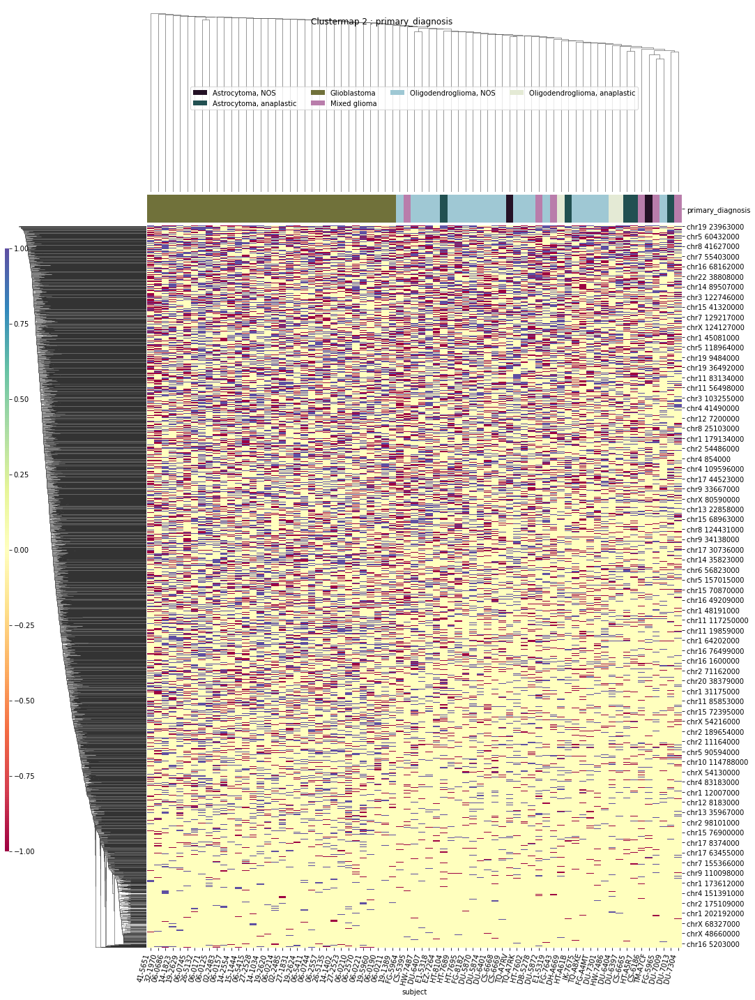

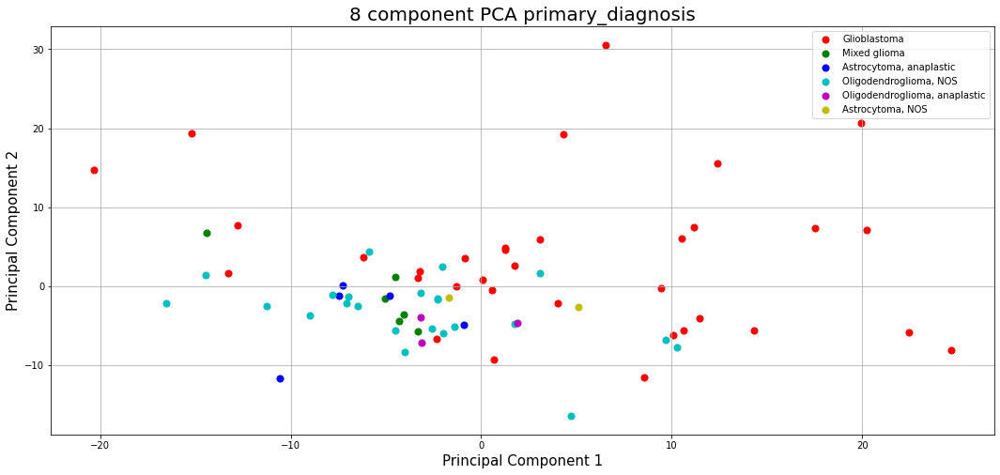

IDH
T-Testing
Boxplotting
Clustermapping
['IDH' 'chr1 10029000' 'chr1 106411000' ... 'chrY 4296000' 'chrY 8917000'
 'subject']


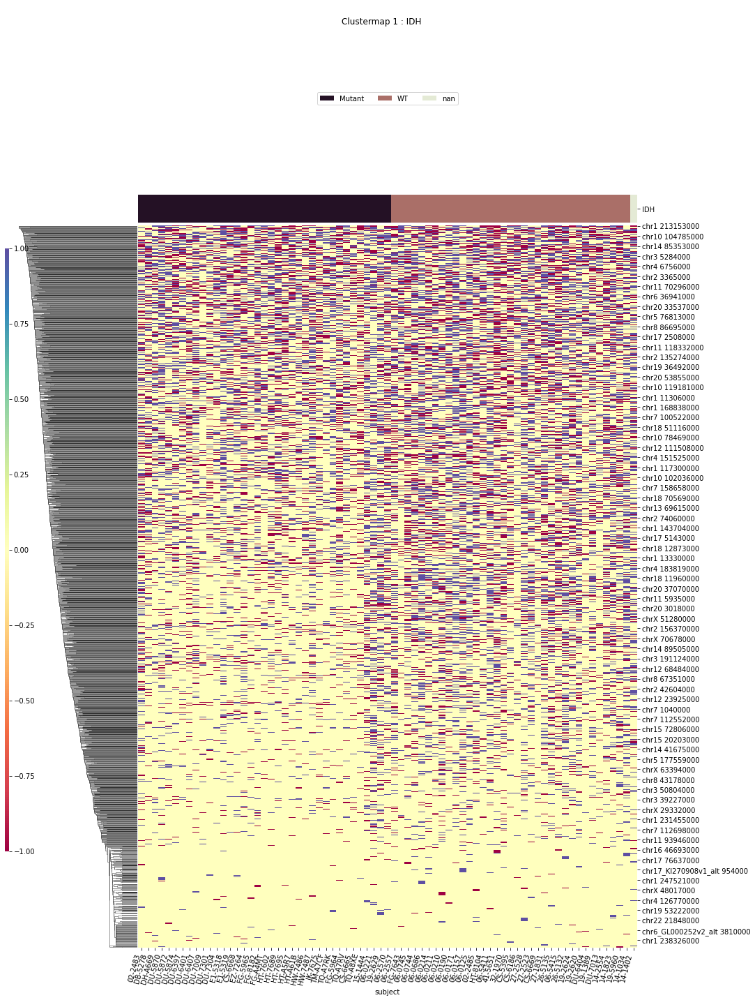

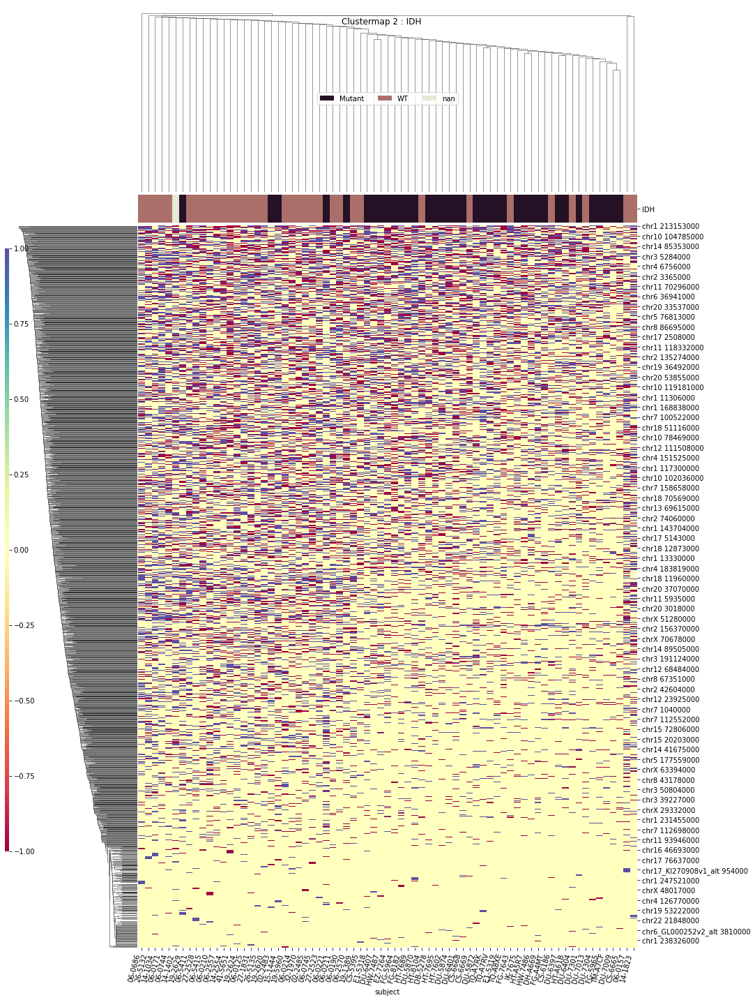

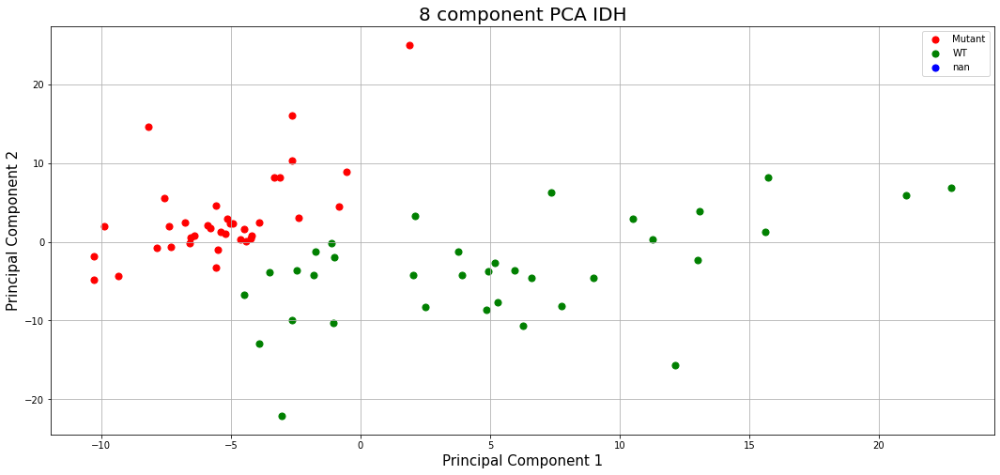

x1p19q
T-Testing
Boxplotting
Clustermapping
['chr1 10029000' 'chr1 10427000' 'chr1 106411000' ... 'chrY 12879000'
 'subject' 'x1p19q']


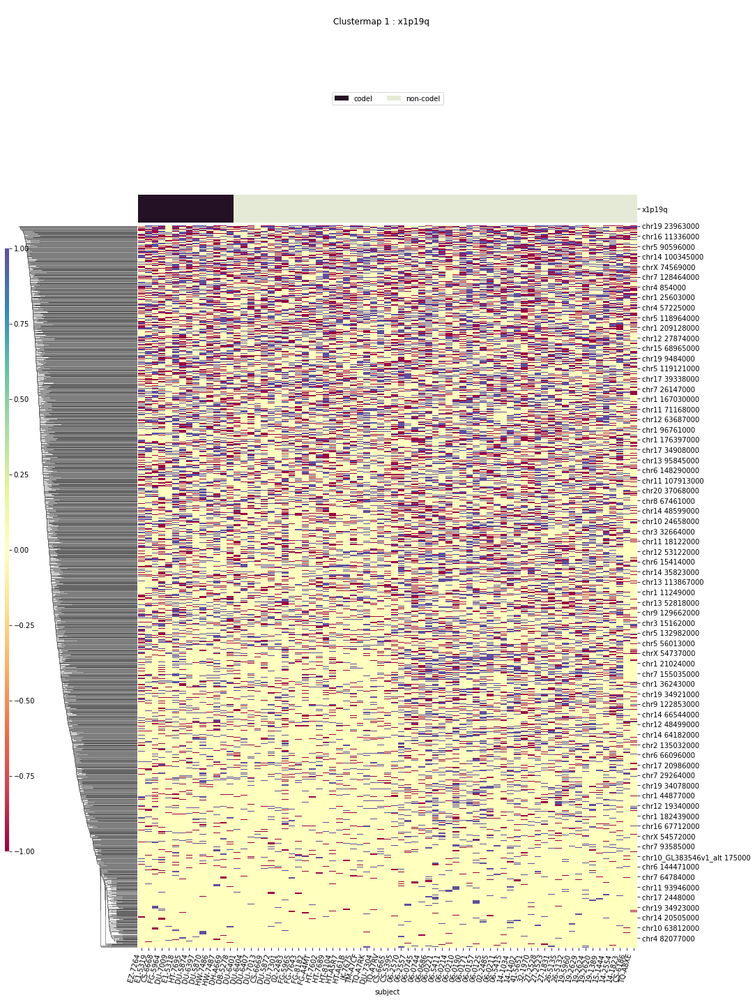

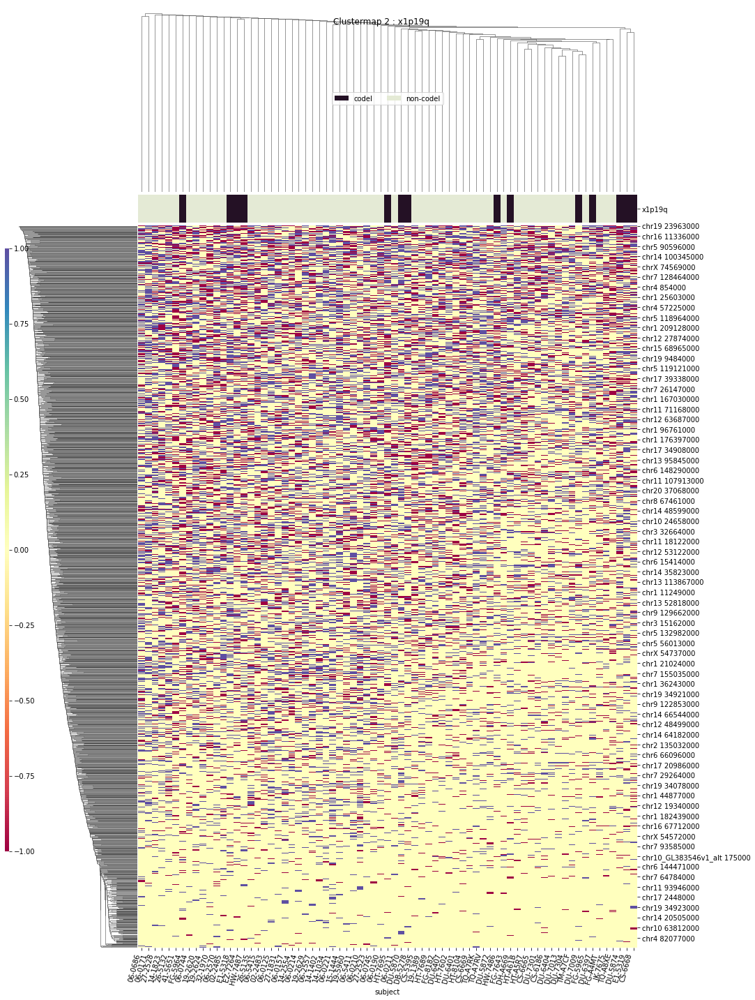

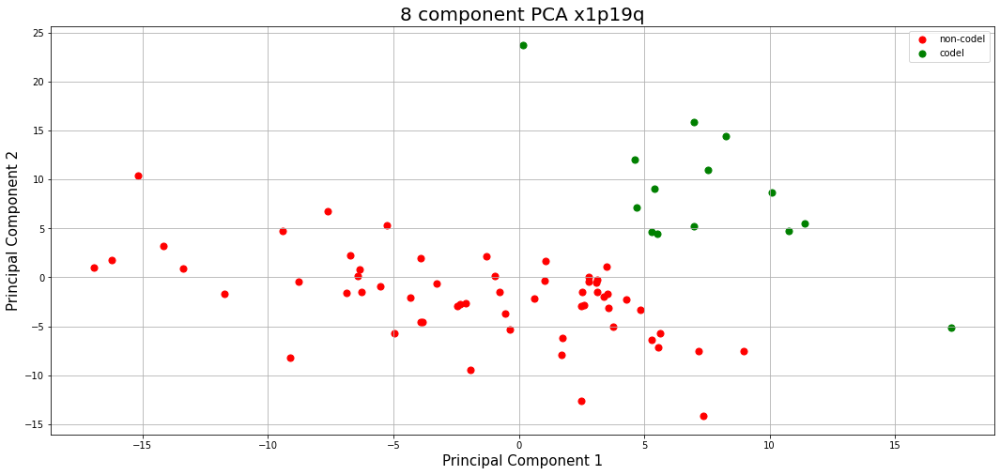

TERT
T-Testing
Boxplotting
Clustermapping
['TERT' 'chr1 10029000' 'chr1 10427000' ... 'chrY 4296000' 'chrY 8917000'
 'subject']


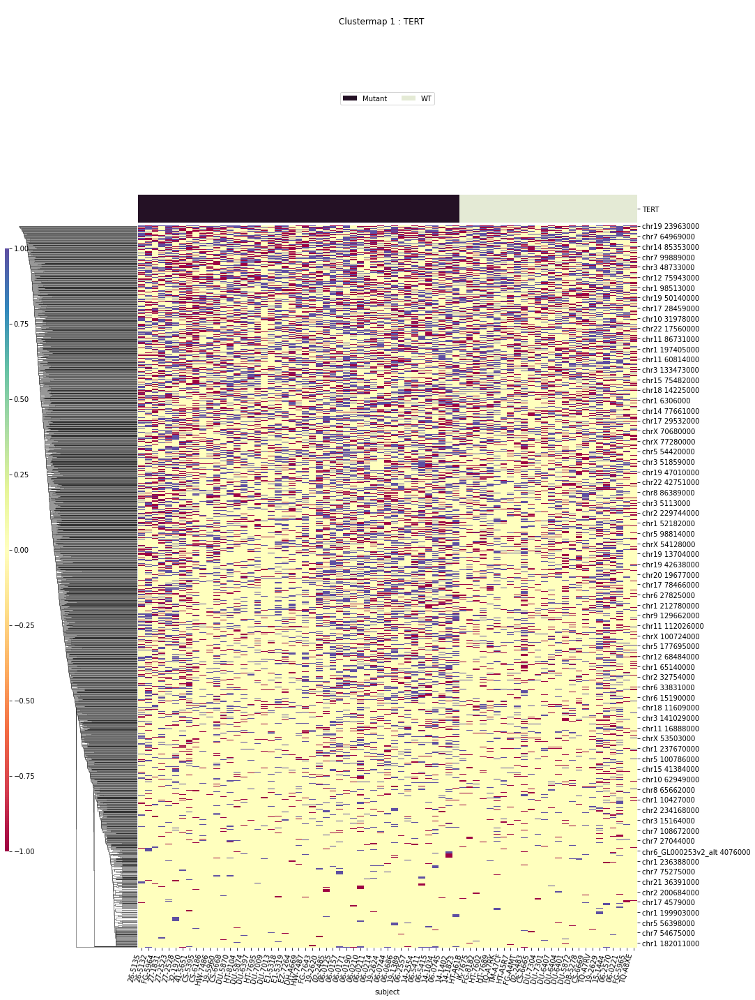

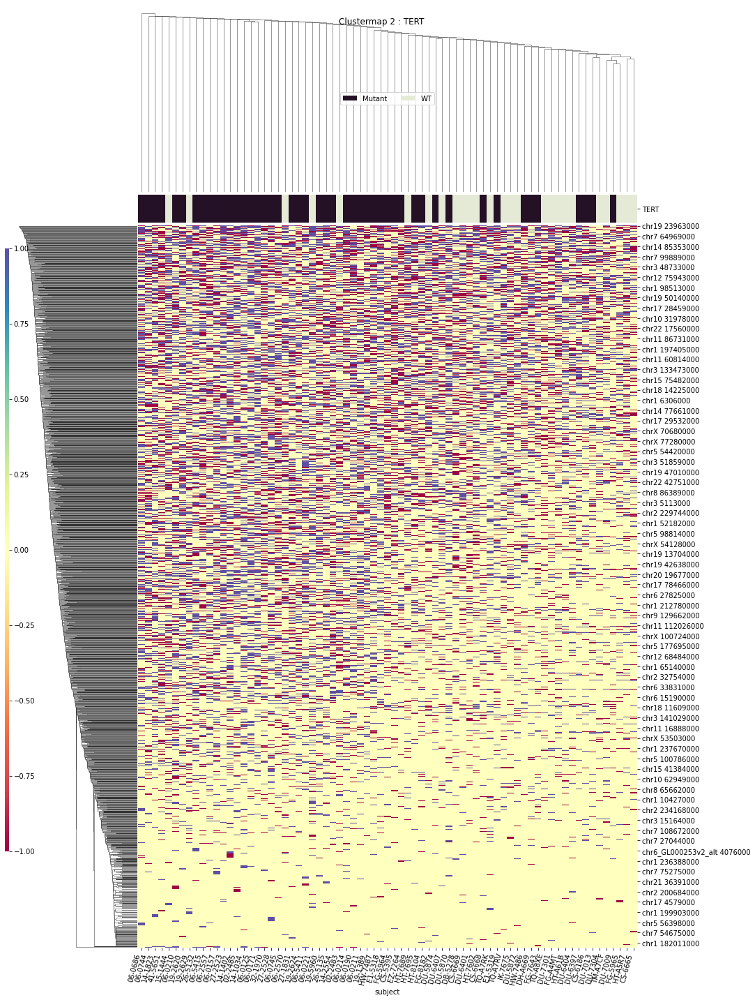

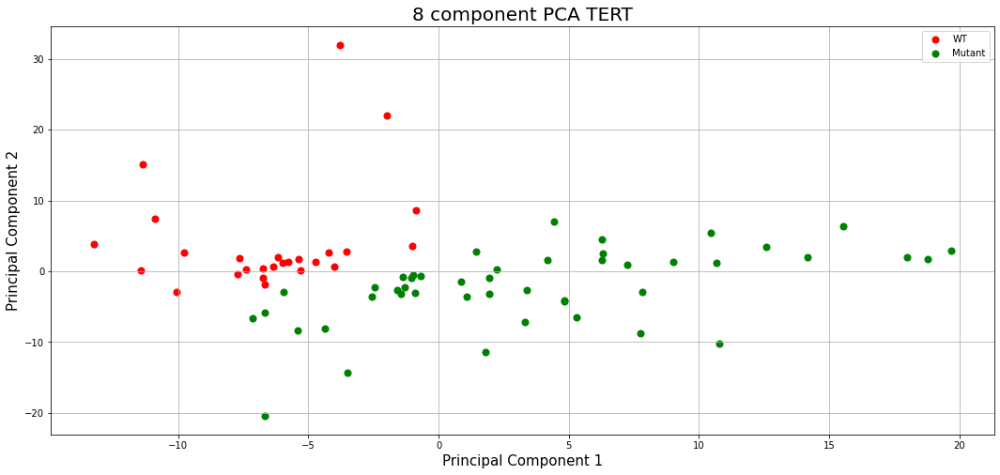

disease_type
T-Testing
Boxplotting
Clustermapping
['chr1 10029000' 'chr1 106411000' 'chr1 109176000' ... 'chrY 8917000'
 'disease_type' 'subject']


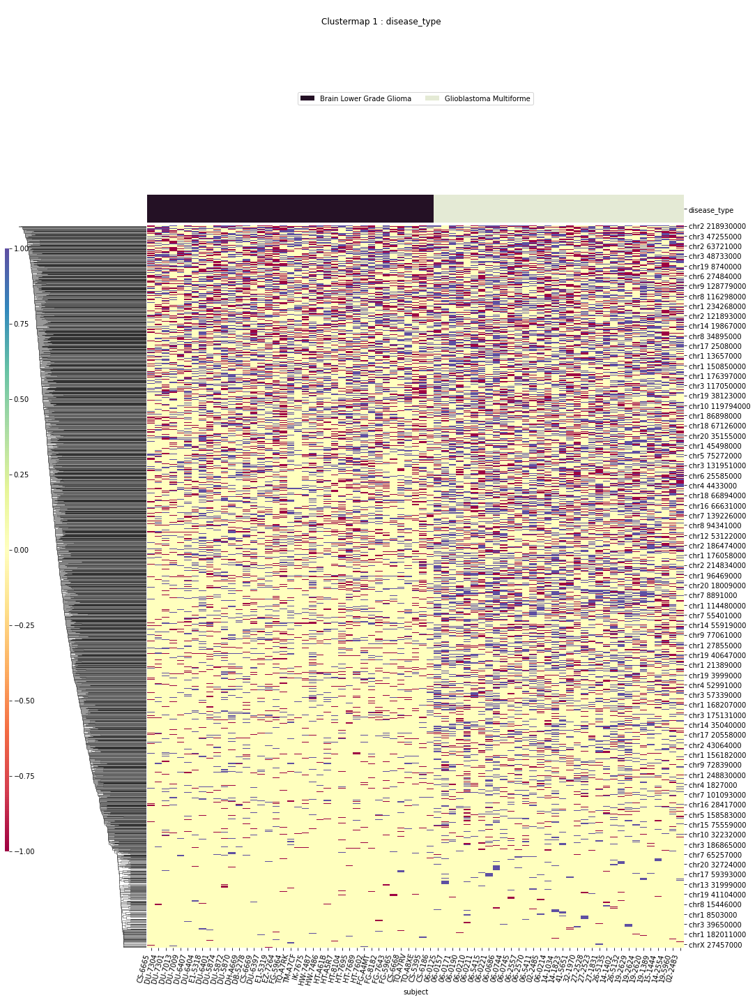

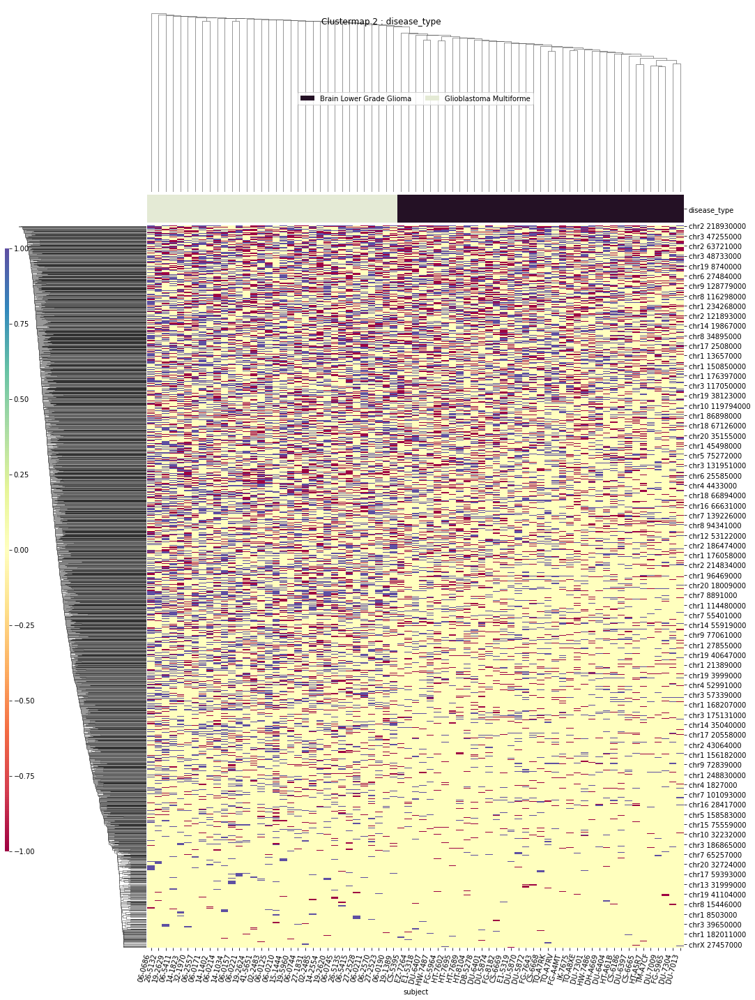

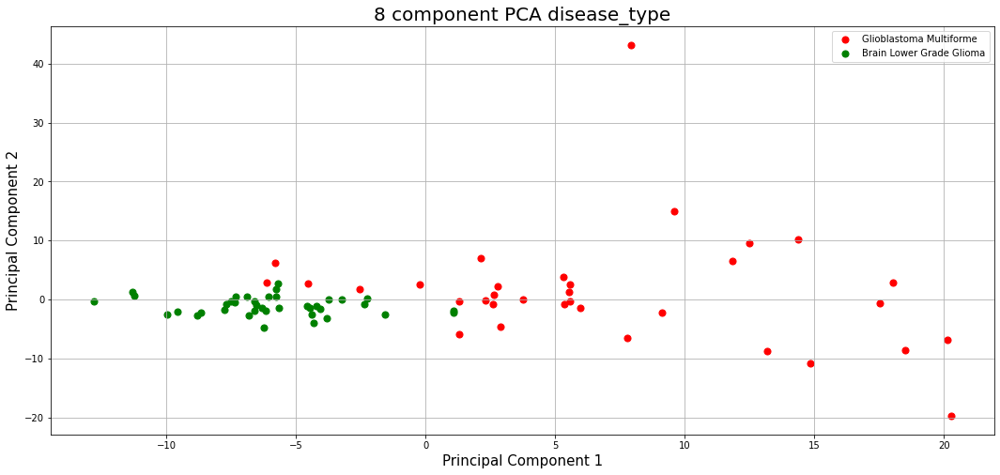

IDH_1p19q_status
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
Clustermapping
['IDH_1p19q_status' 'chr1 10029000' 'chr1 10427000' ... 'chrY 4296000'
 'chrY 8917000' 'subject']


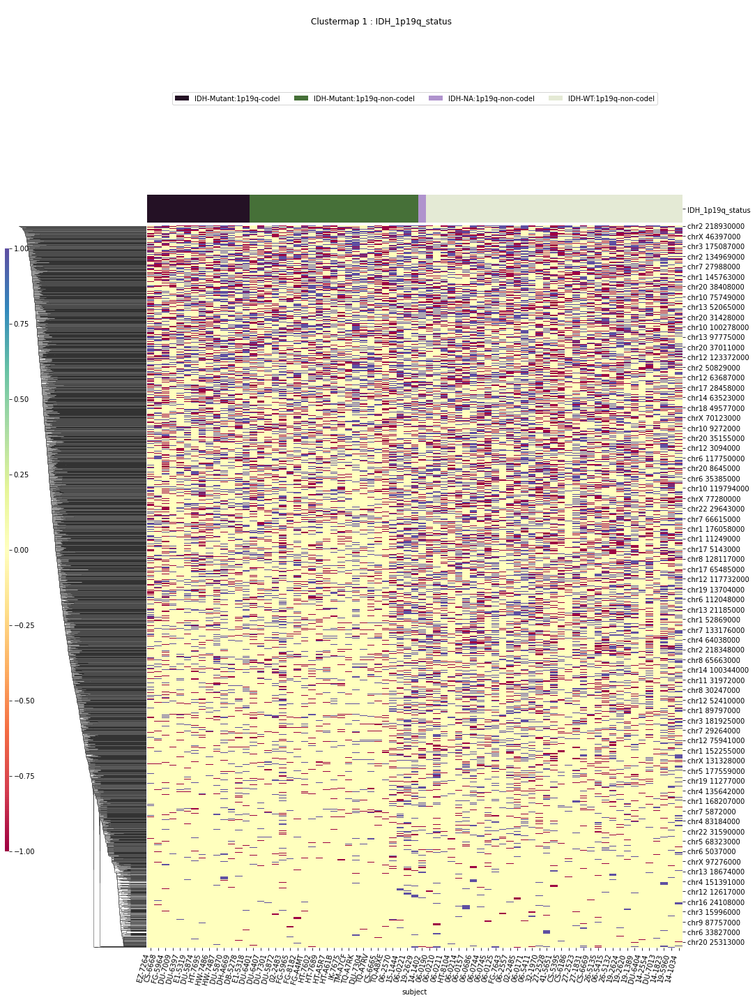

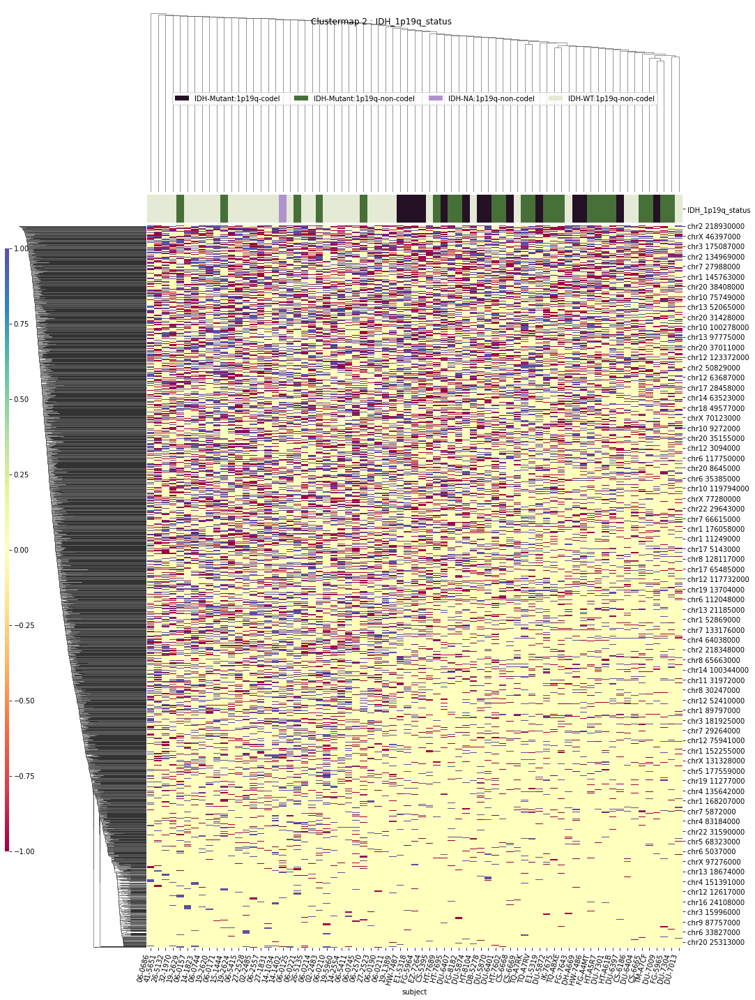

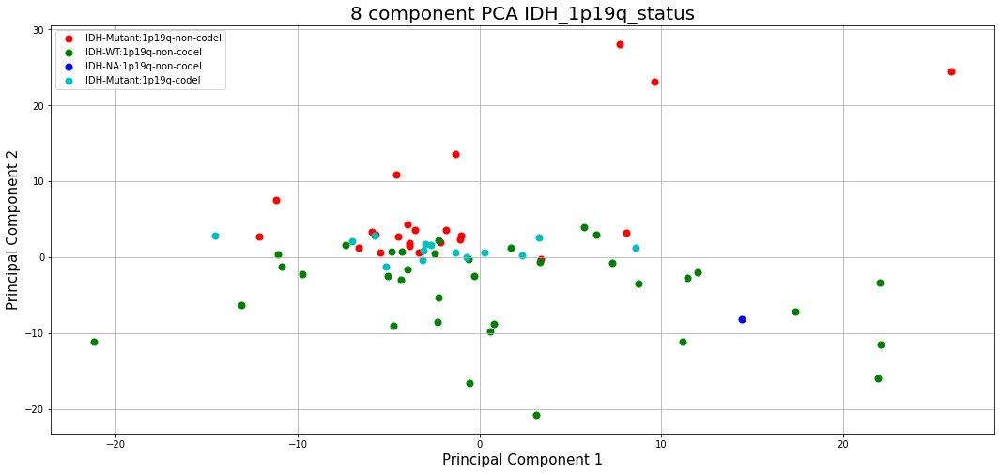

WHO_groups
T-Testing
Boxplotting
 p : 2.9666833044073793e-10  ( t : 9.349640132610398 ) :  chr8 43688000


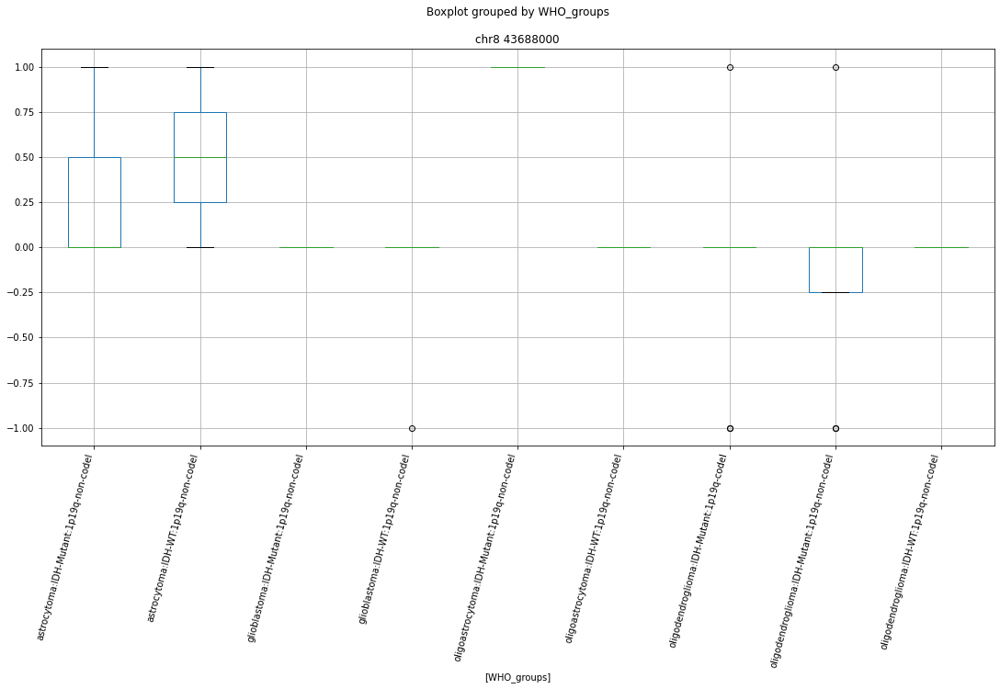

 p : 1.3906946637904217e-09  ( t : 8.704837364844163 ) :  chr19 10478000


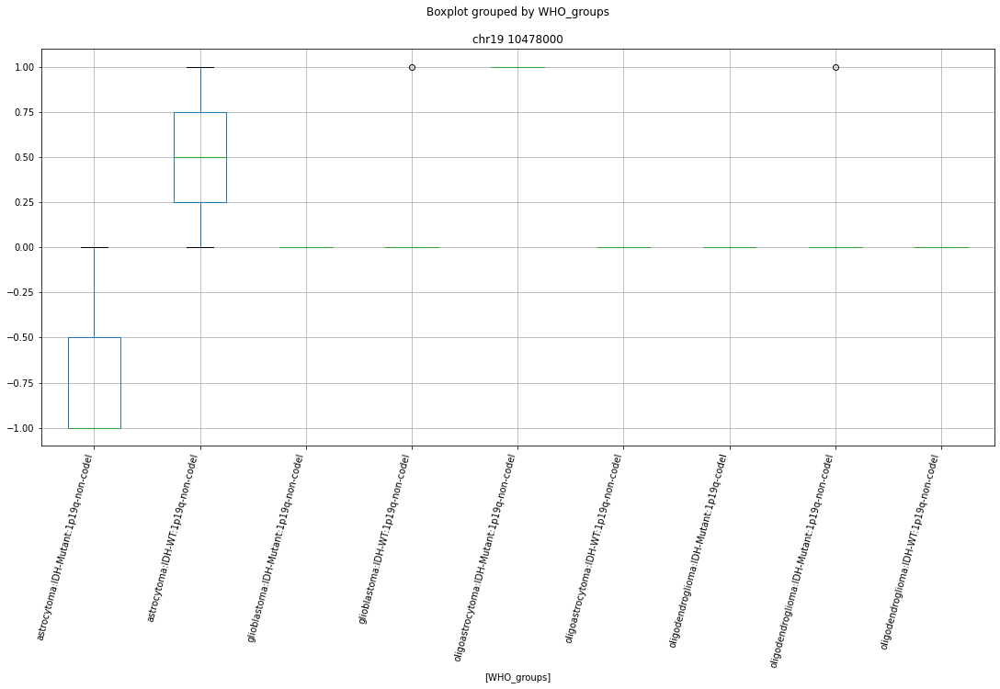

Clustermapping
['WHO_groups' 'chr1 10029000' 'chr1 10427000' ... 'chrY 7180000'
 'chrY 8917000' 'subject']


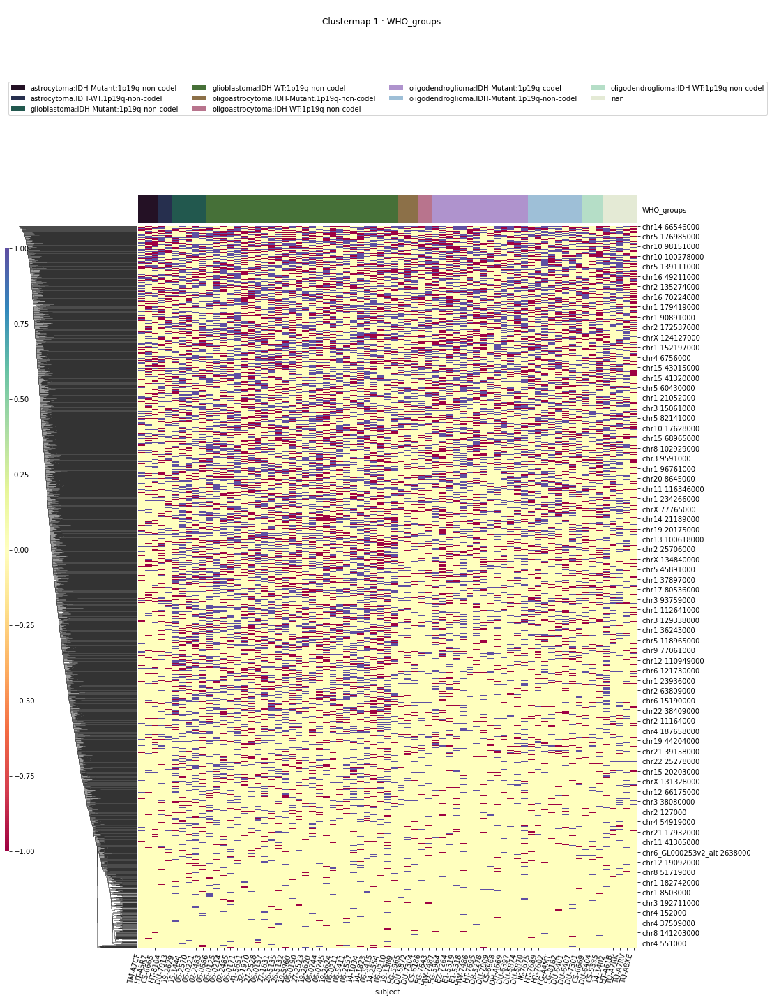

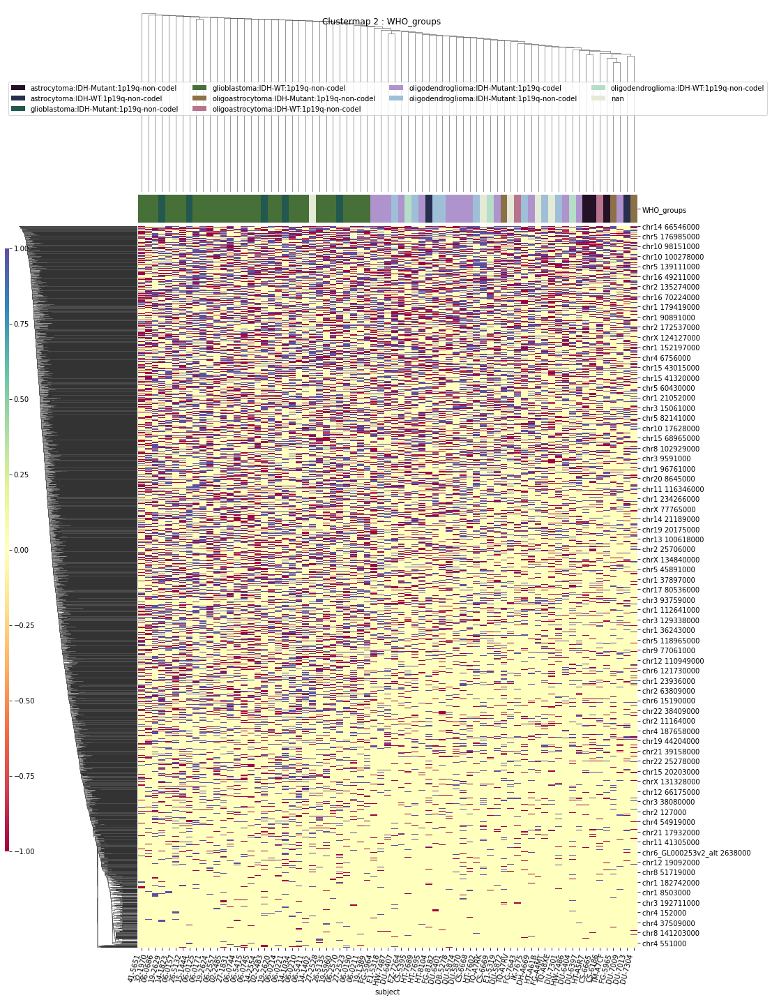

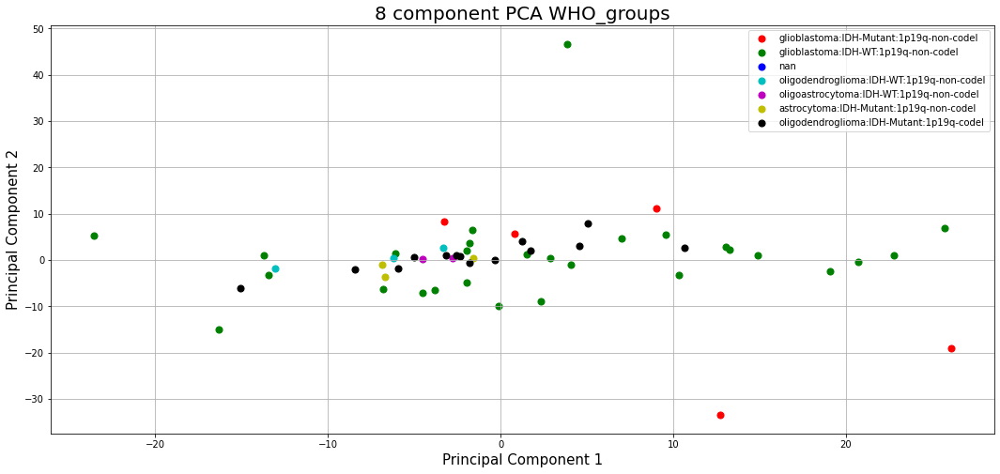

Triple_group
T-Testing


/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/fromnumeric.py:3702: RuntimeWarning: Degrees of freedom <= 0 for slice
  return _methods._var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/Users/jake/Library/Python/3.8/lib/python/site-packages/numpy/core/_methods.py:253: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


Boxplotting
 p : 1.5664375980795036e-09  ( t : 8.253570655869408 ) :  chr20 30292000


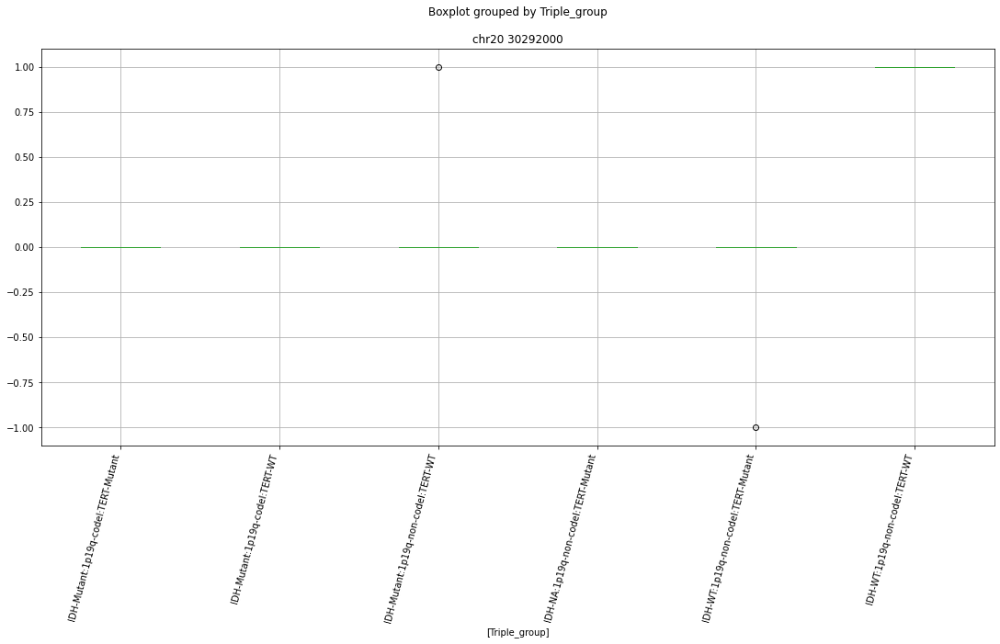

Clustermapping
['Triple_group' 'chr1 10029000' 'chr1 10427000' ... 'chrY 4296000'
 'chrY 8917000' 'subject']


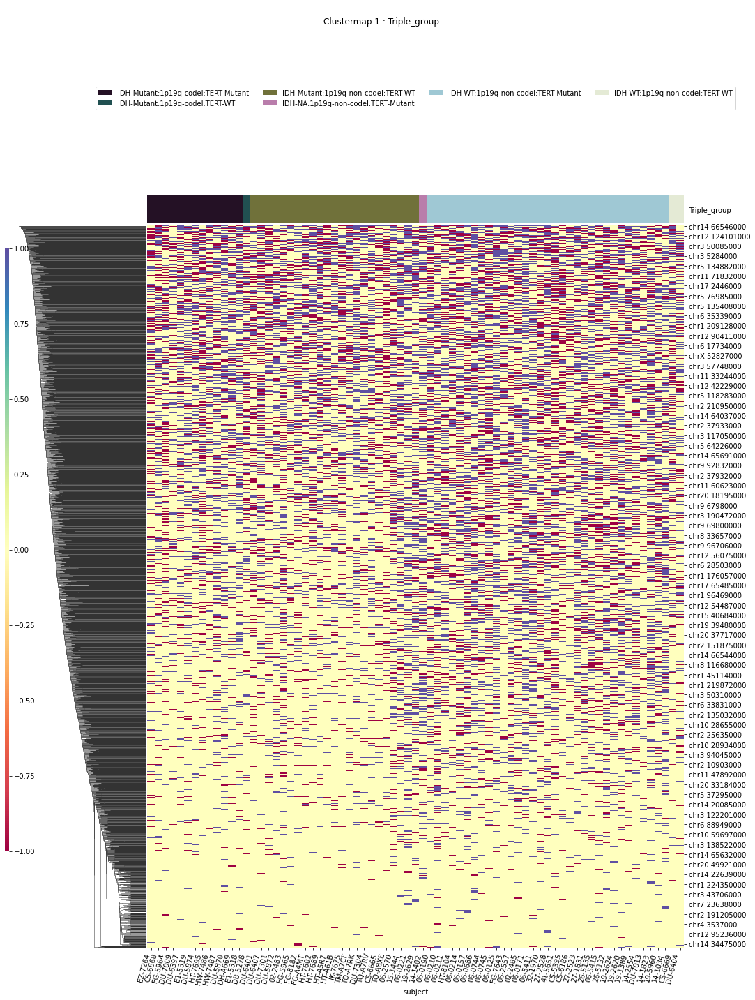

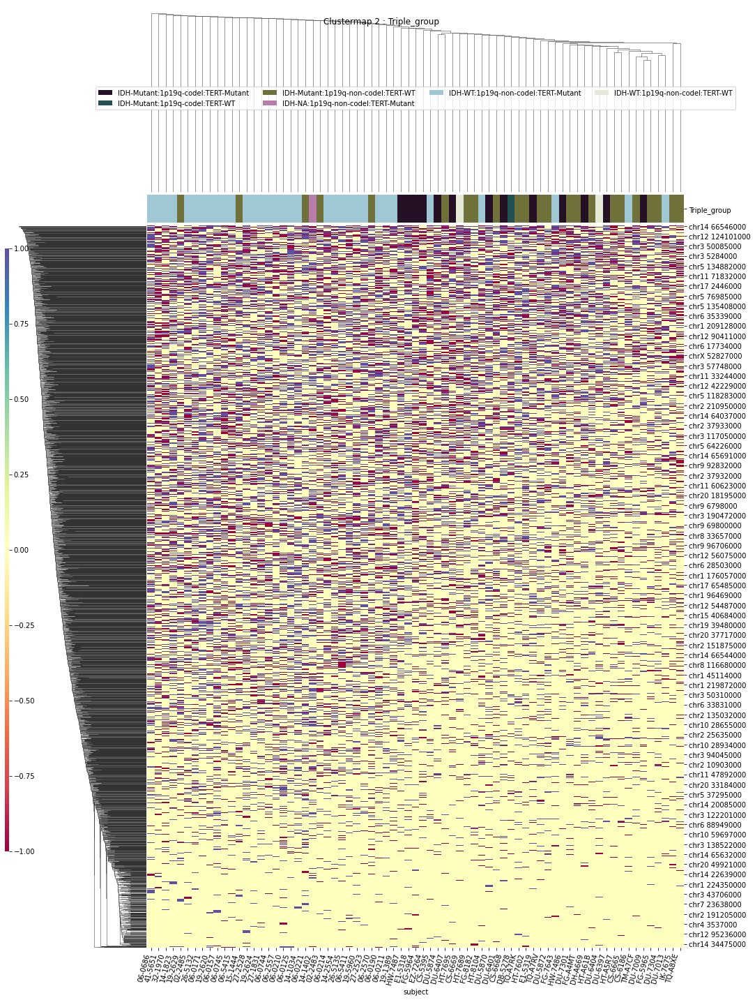

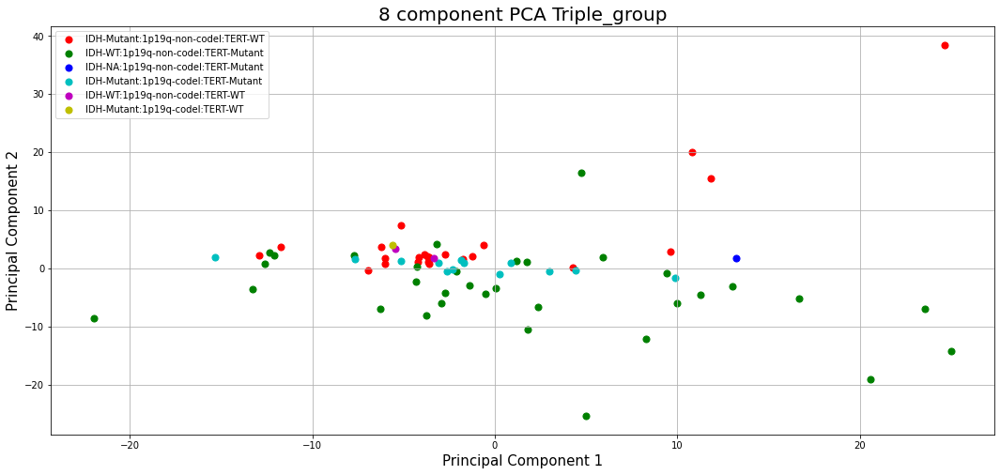

MGMT
T-Testing
Boxplotting
Clustermapping
['MGMT' 'chr1 106411000' 'chr1 108676000' ... 'chrY 12352000'
 'chrY 8917000' 'subject']


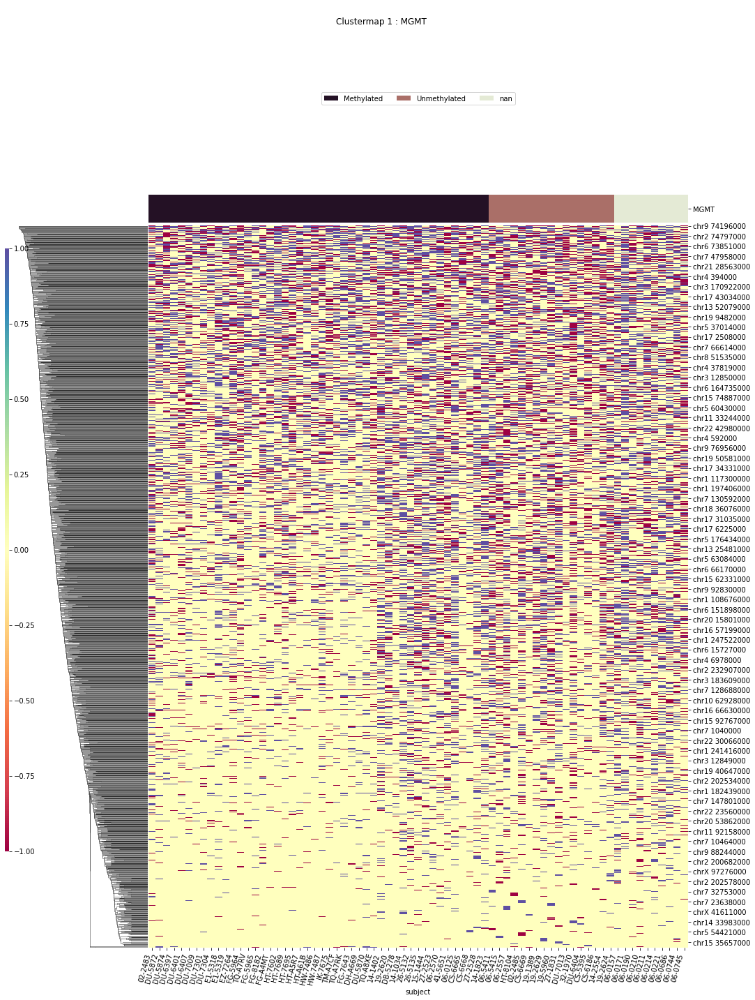

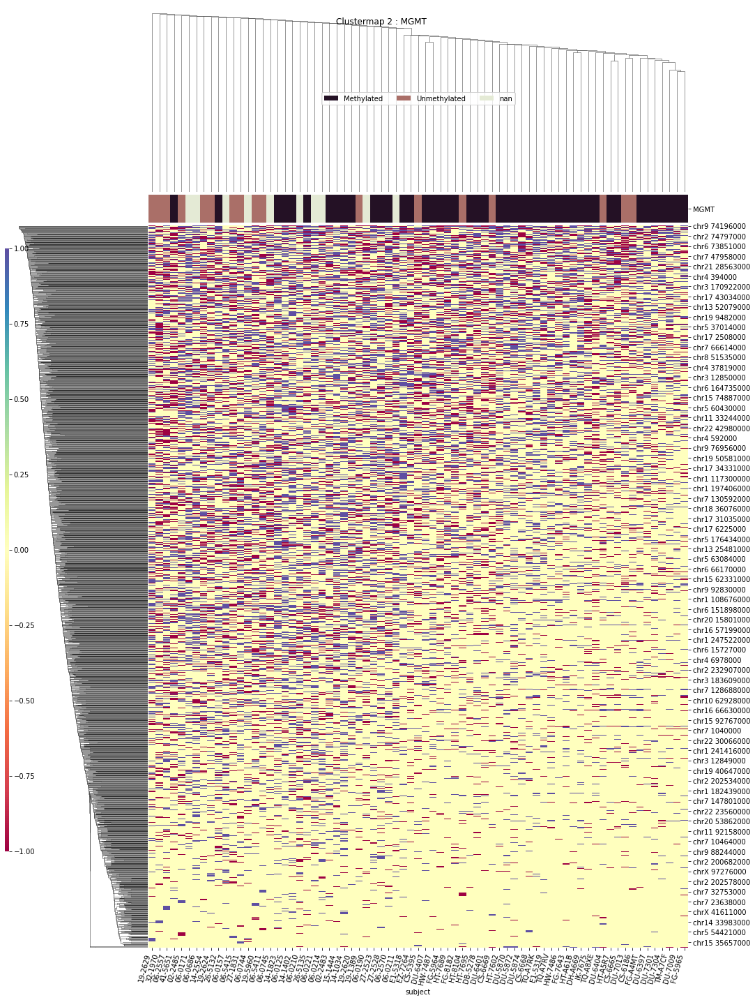

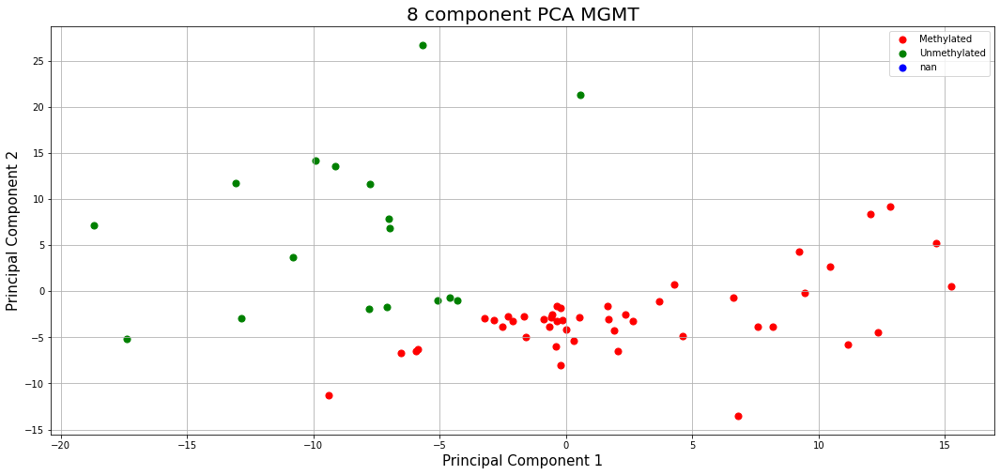

gender1
T-Testing
Boxplotting
Clustermapping
['chr1 106411000' 'chr1 108676000' 'chr1 109054000' ... 'chrY 8917000'
 'gender1' 'subject']


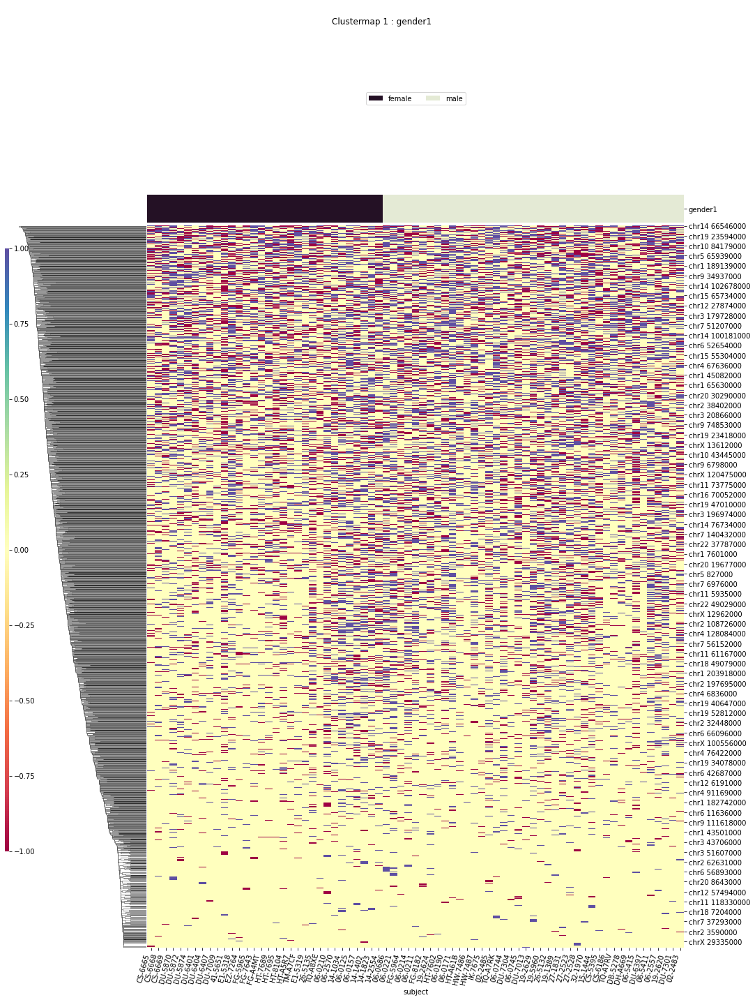

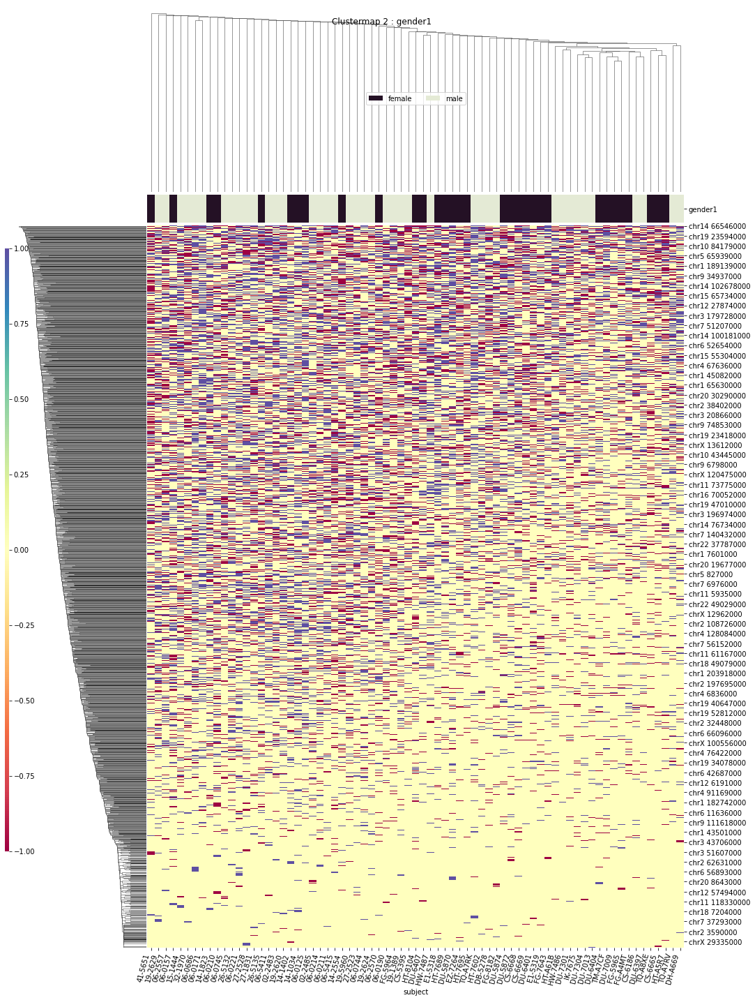

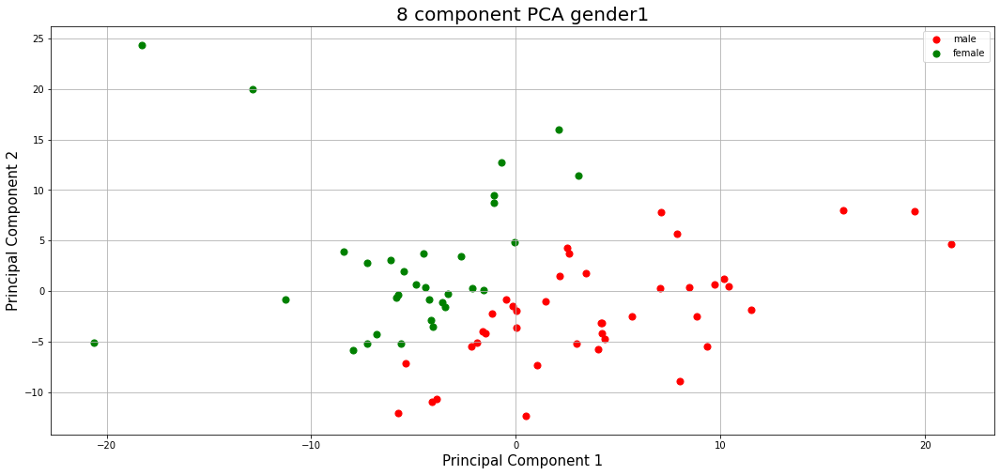

In [113]:
for column in 'primary_diagnosis','IDH','x1p19q','TERT','disease_type','IDH_1p19q_status','WHO_groups','Triple_group','MGMT','gender1':
    print(column)
    ttests_boxplots_and_heatmaps(compdf,
        compdf.columns[compdf.columns.str.contains("^chr")],column,box_p=1e-8,heat_p=0.5)

In [114]:
datetime.now().strftime("%Y%m%d %H:%M:%S")

'20210621 13:57:25'

In [115]:
plt.rcParams["figure.figsize"] = [18.0,8.0]

In [116]:
pd.set_option('display.max_columns', default_max_columns)

In [117]:
pd.set_option('display.max_rows',default_max_rows)

In [118]:
pd.set_option('display.precision', default_precision)